# Visualisation of the data

### Loading Libraries

In [2]:
import pandas as pd
import numpy as np 
import nltk
import string
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

### Loading the data set

In [3]:
train_data = pd.read_csv("/Users/sarath/Documents/Final Project Data/train_values.csv")
train_labels = pd.read_csv("/Users/sarath/Documents/Final Project Data/train_labels.csv")
test_labels = pd.read_csv("/Users/sarath/Documents/Final Project Data/test_values.csv")


In [4]:
building_damage = train_data.merge(train_labels, how = 'inner', on = 'building_id')

In [12]:
building_damage.describe()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
count,2.606010e+05,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,...,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000,260601.000000
mean,5.256755e+05,13.900353,701.074685,6257.876148,2.129723,26.535029,8.018051,5.434365,0.088645,0.761935,...,0.033626,0.008101,0.000940,0.000361,0.001071,0.000188,0.000146,0.000088,0.005119,2.238272
std,3.045450e+05,8.033617,412.710734,3646.369645,0.727665,73.565937,4.392231,1.918418,0.284231,0.425900,...,0.180265,0.089638,0.030647,0.018989,0.032703,0.013711,0.012075,0.009394,0.071364,0.611814
min,4.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,2.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,2.611900e+05,7.000000,350.000000,3073.000000,2.000000,10.000000,5.000000,4.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,5.257570e+05,12.000000,702.000000,6270.000000,2.000000,15.000000,7.000000,5.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
75%,7.897620e+05,21.000000,1050.000000,9412.000000,2.000000,30.000000,9.000000,6.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,1.052934e+06,30.000000,1427.000000,12567.000000,9.000000,995.000000,100.000000,32.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000


### Distribution of the buildings age

/Users/sarath/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


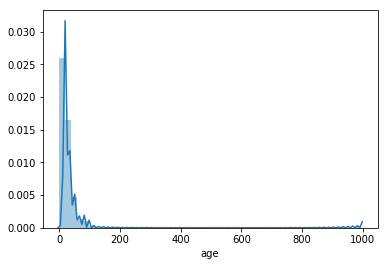

In [8]:
sns.distplot(train_data['age'])

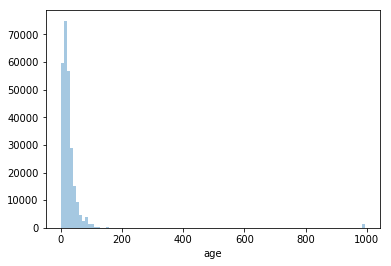

In [15]:
sns.distplot(train_data['age'],kde= False,bins=100)

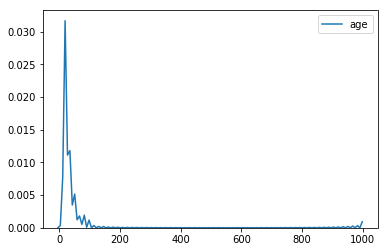

In [16]:
sns.kdeplot(train_data['age'])

In [5]:

building_damage.loc[building_damage['age'] <=25 , 'age_group'] = 'New'

building_damage.loc[(building_damage['age'] > 25) & (building_damage['age'] <= 100),'age_group' ]= 'Old'

building_damage.loc[building_damage['age'] > 100 ,'age_group' ] = 'Very Old'

In [6]:
building_damage['age_group'] = ""

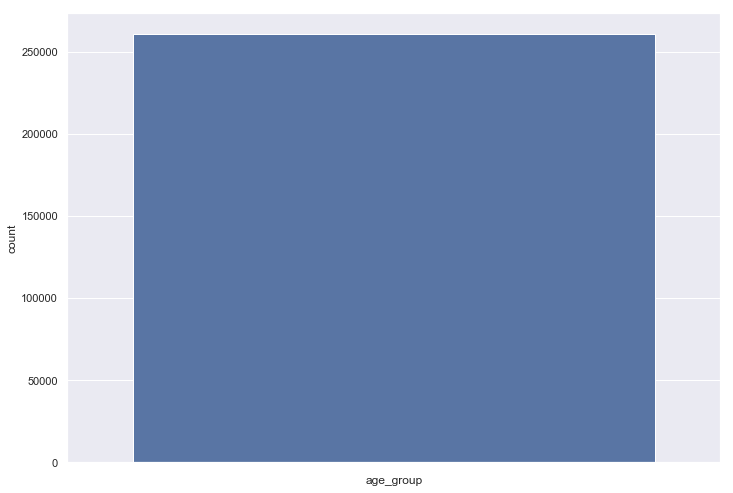

In [24]:
 sns.countplot(x ="age_group",data= building_damage)



In [7]:

t= building_damage[building_damage['age'] > 950]['age'].count()                


In [8]:
t

1390

In [9]:
train_950 = building_damage[building_damage.age>950]

### Countplot

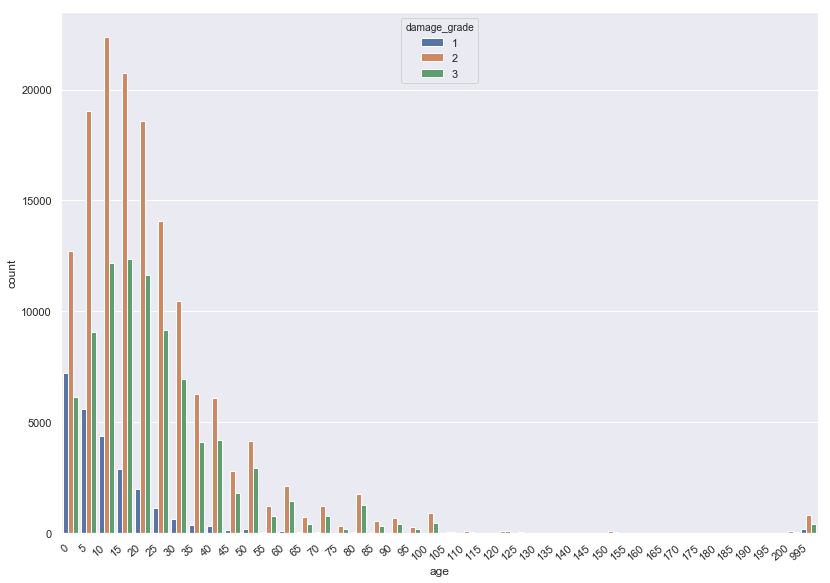

In [39]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
ax = sns.countplot(x ="age", data= building_damage, hue = 'damage_grade')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()


### Joint plot

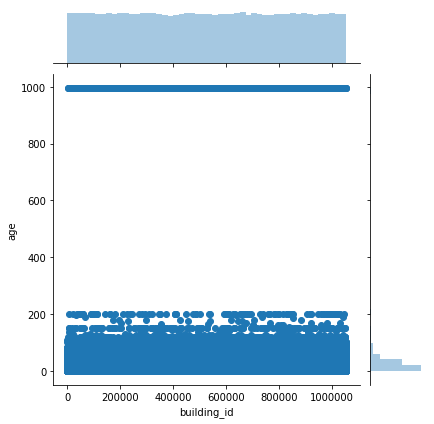

In [18]:
sns.jointplot(x= 'building_id',y= 'age', data= train_data)

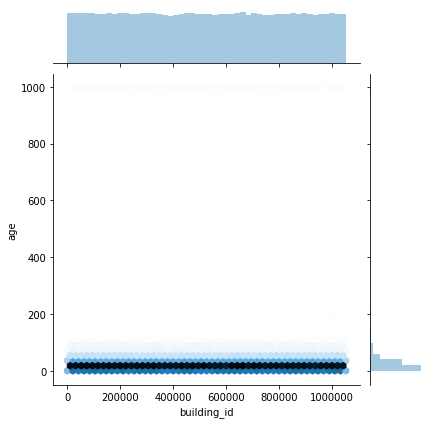

In [19]:
sns.jointplot(x= 'building_id',y= 'age', data= train_data,kind = 'hex')

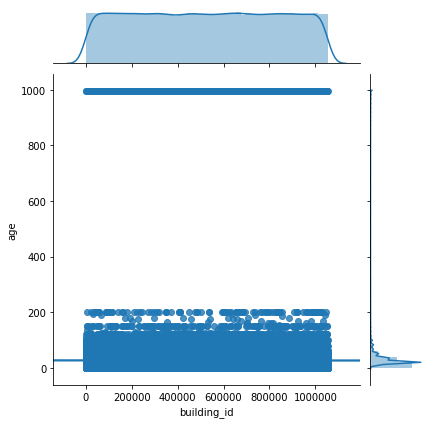

In [20]:
sns.jointplot(x= 'building_id',y= 'age', data= train_data,kind = 'reg')

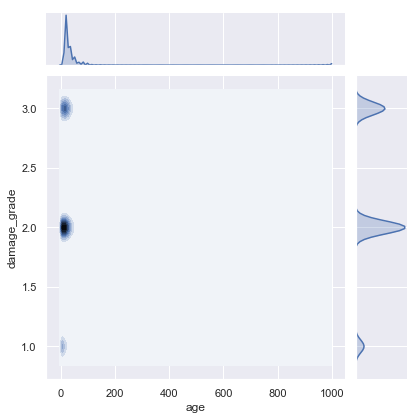

In [47]:
sns.jointplot(x= 'age',y= 'damage_grade', data= building_damage,kind = 'kde')

### Bar plot

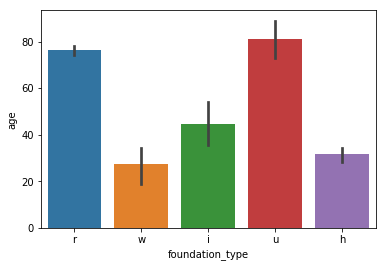

In [23]:
sns.barplot(x='foundation_type', y='age', data=train_data,estimator=np.std)

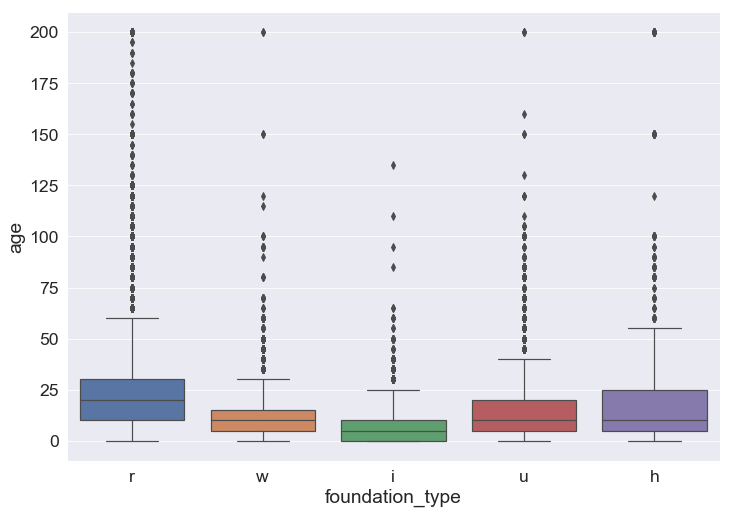

In [84]:
sns.set_context('paper',font_scale=2)
sns.boxplot(x='foundation_type',y ='age',data=train_data)

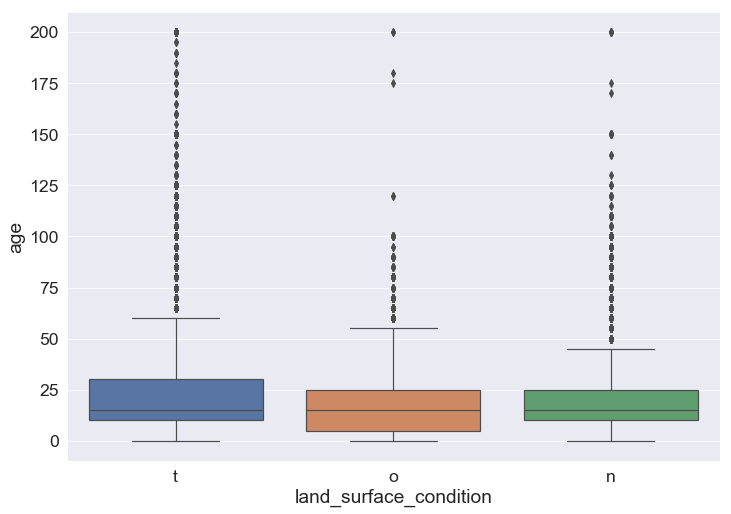

In [85]:
sns.set_context('paper',font_scale=2)
sns.boxplot(x='land_surface_condition',y ='age',data=train_data)

In [30]:
train_data = building_damage[building_damage['age'] <= 250]

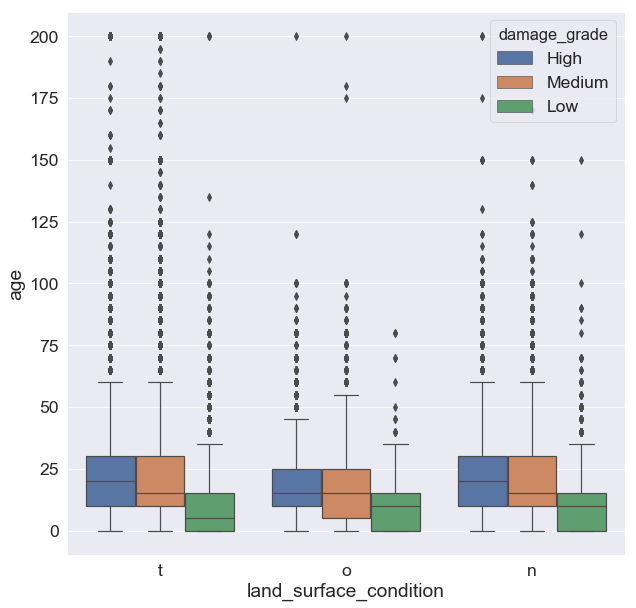

In [83]:
sns.set_context('paper',font_scale=2)
plt.rcParams['font.family'] = 'sans-serif'
plt.figure(figsize=(10,10))

sns.boxplot(x='land_surface_condition',y ='age', data=train_data, hue ='damage_grade')

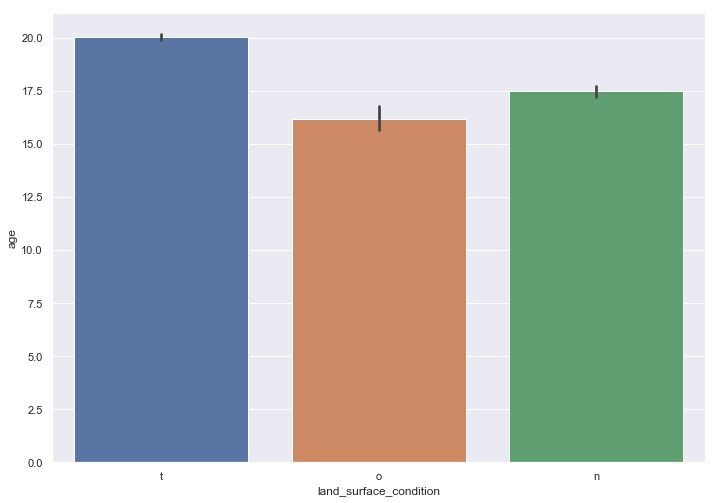

In [32]:
sns.barplot(x='land_surface_condition', y='age', data=train_data,estimator=np.std)

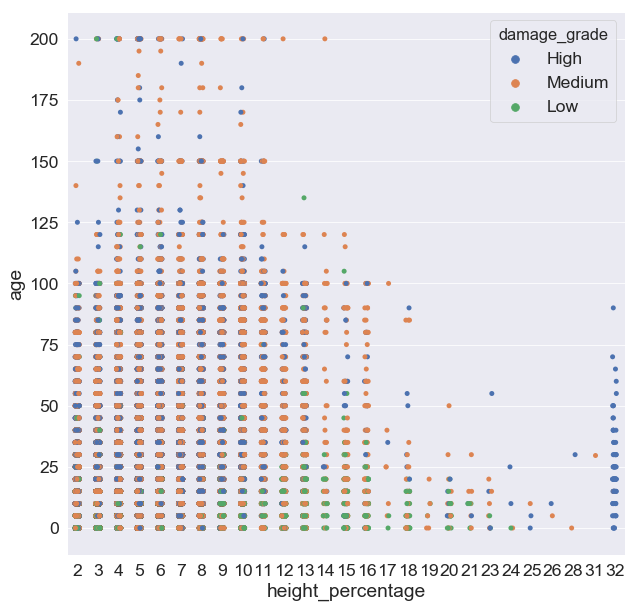

In [82]:
sns.set_context('paper',font_scale=2)
plt.rcParams['font.family'] = 'sans-serif'
plt.figure(figsize=(10,10))
sns.stripplot(x='height_percentage',y ='age',data=train_data,jitter=True, hue= 'damage_grade')

/Users/sarath/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


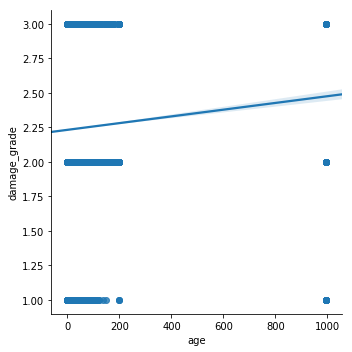

In [7]:
sns.lmplot(x='age',y='damage_grade',data=building_damage)

TypeError: Could not convert HighMediumHighMediumHighMediumHighLowMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumHighLowLowMediumHighHighHighHighHighLowMediumLowHighLowHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumMediumMediumHighLowMediumLowMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighLowHighMediumMediumLowLowHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowLowMediumMediumMediumMediumHighMediumHighLowMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighHighHighMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumHighLowLowMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumHighMediumMediumHighHighMediumMediumLowLowHighMediumLowLowMediumMediumLowMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowLowLowMediumHighMediumLowMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumLowMediumLowHighHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumLowHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumLowHighHighHighMediumHighHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumLowLowMediumMediumHighHighMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighLowHighMediumLowMediumMediumMediumLowLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighLowLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumLowMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumHighHighHighLowHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumLowHighHighHighMediumMediumMediumMediumLowMediumHighMediumHighLowHighHighLowMediumHighMediumMediumLowMediumHighMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumHighMediumMediumHighLowHighHighMediumLowMediumHighLowHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighHighLowHighHighHighLowHighHighMediumHighLowHighHighMediumLowLowHighMediumHighLowMediumHighHighHighMediumLowHighHighMediumMediumHighMediumHighHighMediumHighHighMediumHighHighMediumHighHighMediumMediumHighMediumLowHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowMediumLowLowMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumLowHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumLowLowLowHighHighHighHighHighMediumMediumLowHighHighHighMediumHighLowMediumHighMediumLowLowMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighLowHighMediumMediumLowLowMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighHighLowHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumLowHighHighHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumHighHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumLowLowMediumMediumMediumHighHighHighHighMediumLowHighMediumHighMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumLowHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighLowLowMediumMediumHighLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighLowHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumHighMediumHighMediumHighHighMediumMediumHighLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighLowHighHighHighHighHighHighHighMediumMediumHighHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumLowLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighLowHighHighMediumHighHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumMediumLowLowLowLowMediumHighHighLowHighHighMediumMediumHighMediumMediumLowMediumLowMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumLowHighLowHighMediumHighHighHighMediumHighLowHighMediumLowHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumLowMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumLowHighMediumLowHighMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumLowLowLowMediumMediumMediumLowLowMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowHighHighMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumLowHighMediumHighLowHighMediumMediumHighHighLowHighMediumHighMediumLowLowMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumLowLowHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumHighLowMediumHighHighHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowLowMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighHighHighMediumHighHighMediumLowLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighLowHighMediumMediumLowMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighLowLowLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighLowHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowLowMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighHighHighHighLowLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighLowHighHighHighHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighLowMediumLowHighMediumHighMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumHighLowMediumLowMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowLowHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowHighHighMediumHighHighLowMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighHighLowLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowLowHighMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighLowMediumMediumHighHighMediumMediumLowLowLowMediumHighLowMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighLowMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowLowMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighMediumLowHighLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumLowMediumHighHighLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumLowHighMediumLowHighMediumMediumHighHighHighMediumLowHighMediumLowMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighLowMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumHighMediumMediumHighHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumLowHighMediumHighHighLowMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighHighLowHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighHighMediumLowMediumLowLowMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighHighMediumLowMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumHighHighHighMediumHighHighLowMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumHighHighLowMediumMediumLowLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumHighHighHighHighMediumLowHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowHighLowMediumMediumHighHighMediumMediumMediumLowLowLowMediumMediumHighLowHighMediumHighMediumHighHighHighHighHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowHighHighMediumHighLowLowLowMediumMediumHighLowHighLowMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighLowMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumLowHighHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumLowMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumLowHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumLowLowMediumHighHighLowLowMediumMediumLowLowMediumMediumMediumHighLowLowMediumMediumHighMediumLowHighLowMediumLowHighHighHighHighHighMediumMediumHighMediumLowMediumHighHighHighHighMediumHighHighHighHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumLowLowLowMediumHighHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighLowHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumLowHighHighLowHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumMediumMediumLowHighMediumLowLowHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumMediumLowMediumHighHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighHighLowHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighLowLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighLowMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumHighHighHighMediumMediumLowMediumLowHighMediumMediumHighHighLowHighHighHighMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumHighMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumHighHighHighMediumHighHighMediumHighHighMediumLowHighMediumHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighHighMediumHighLowHighHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumLowHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumLowHighHighMediumMediumMediumLowHighLowLowHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumHighMediumHighMediumHighMediumLowLowMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighLowMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighHighHighLowLowMediumMediumLowMediumHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumHighMediumMediumMediumHighLowLowMediumMediumHighHighLowMediumLowLowHighMediumLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumHighMediumLowMediumLowMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumHighHighLowLowHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighLowLowHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighHighHighLowHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumMediumLowHighHighLowHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumHighLowMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowLowLowMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighLowHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumLowHighHighMediumHighMediumLowHighMediumHighLowMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumHighLowHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumLowHighMediumLowMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumLowLowHighHighMediumMediumLowMediumHighHighLowMediumMediumLowHighHighMediumLowMediumLowHighHighHighMediumMediumMediumMediumHighHighHighLowLowHighHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumLowMediumMediumHighLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowHighMediumHighHighMediumHighMediumMediumLowMediumLowHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighHighLowHighHighHighHighLowLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumLowHighHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighLowMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighLowHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighHighMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighHighMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowHighHighHighMediumHighHighMediumHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumLowLowHighHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowLowHighMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighLowHighHighHighMediumHighMediumMediumHighHighHighMediumMediumLowHighHighLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumLowLowLowHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumMediumHighMediumHighHighMediumHighHighHighMediumLowMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumLowHighMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumHighHighHighMediumMediumLowHighHighMediumMediumHighLowMediumHighHighLowHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowHighMediumMediumMediumLowMediumHighMediumHighMediumHighHighLowMediumMediumHighHighHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowLowHighHighHighMediumMediumMediumHighLowHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumLowMediumHighMediumHighMediumHighMediumHighMediumLowLowLowHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumLowLowLowHighHighHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumLowHighMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumLowMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighLowLowHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighHighMediumHighMediumHighLowMediumHighHighHighMediumLowMediumMediumHighHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowHighMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighLowMediumHighHighMediumHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowLowLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumLowLowMediumHighMediumLowHighHighHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumLowHighMediumMediumMediumHighHighMediumHighLowHighMediumLowMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumMediumHighHighLowHighMediumLowHighLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumLowMediumMediumLowMediumHighHighHighMediumHighMediumMediumLowHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighHighHighLowMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumLowLowHighHighHighMediumHighHighMediumMediumMediumHighHighHighLowLowHighMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowLowHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumHighLowHighHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowLowHighHighHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumLowHighHighLowHighMediumMediumHighHighHighHighHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumLowHighHighMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumHighLowMediumLowMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowLowHighMediumLowLowHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumLowHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumLowHighMediumMediumHighLowMediumMediumLowMediumHighLowHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighLowLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighHighLowMediumLowHighHighHighMediumHighHighLowHighHighLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighLowMediumMediumLowMediumHighHighLowHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowLowMediumHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighLowLowHighHighMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowLowMediumHighHighMediumLowMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighLowLowMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumLowMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumLowLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumLowHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumLowMediumHighHighMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumHighHighHighMediumHighLowMediumHighHighMediumMediumLowHighHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighHighHighHighHighMediumLowHighHighLowMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumLowHighMediumHighHighMediumMediumLowHighHighHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumLowHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighHighMediumHighHighMediumMediumMediumHighLowMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighHighHighHighMediumHighHighMediumMediumLowHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighHighLowMediumHighLowHighHighHighMediumMediumHighHighMediumLowLowHighHighHighHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowLowLowMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumLowHighHighLowLowHighMediumHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighLowHighHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowHighHighLowHighMediumMediumMediumMediumLowMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowLowLowLowLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowLowMediumLowLowMediumHighHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumLowHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighHighMediumMediumLowHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumLowMediumMediumHighHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighLowMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighLowMediumHighMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowLowLowHighHighHighMediumLowMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumLowMediumMediumHighHighLowMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighLowHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighHighLowLowMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowHighHighLowMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumHighHighHighHighLowMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumLowLowLowHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumLowHighHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighLowHighMediumMediumMediumMediumHighMediumLowMediumLowHighLowLowLowHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumLowHighMediumHighLowHighMediumLowHighHighMediumMediumHighHighMediumHighMediumLowHighHighMediumMediumLowMediumLowLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighLowLowMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighLowMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighLowLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighMediumHighHighHighMediumHighHighHighMediumHighHighMediumLowMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowHighHighHighLowMediumLowMediumMediumHighLowMediumHighHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighLowHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighHighMediumMediumLowHighHighMediumMediumMediumLowLowMediumMediumHighHighHighMediumMediumHighHighHighLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumLowLowHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighLowMediumMediumHighHighMediumMediumHighLowLowMediumMediumMediumHighMediumHighLowMediumHighLowMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighLowMediumHighLowLowLowHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumMediumHighMediumMediumHighMediumLowLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighHighLowLowHighMediumHighMediumMediumHighMediumMediumHighHighHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowLowLowHighLowLowMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighHighHighMediumHighMediumMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowLowMediumHighHighHighHighMediumMediumMediumHighLowLowHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumLowMediumLowMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowHighLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighLowLowMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighLowHighMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighLowMediumMediumLowHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumHighLowMediumLowMediumLowHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighMediumHighLowLowHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumLowHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighLowHighHighMediumLowHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighLowLowMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighHighMediumMediumLowLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumLowHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumLowMediumLowHighLowMediumMediumLowHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighLowMediumMediumLowLowMediumHighMediumMediumHighLowMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumLowLowLowHighHighLowMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowHighHighMediumMediumHighLowHighHighHighMediumLowLowMediumMediumHighHighLowMediumMediumLowHighMediumMediumMediumHighHighLowHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumHighHighHighHighMediumMediumLowLowMediumMediumMediumHighMediumHighHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumMediumLowMediumLowLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumLowLowLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumLowMediumHighHighLowHighMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighMediumLowMediumMediumHighHighMediumHighLowHighHighHighMediumHighMediumLowLowHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighLowHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumLowHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighLowHighLowHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighHighMediumMediumLowHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumLowLowMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighHighLowHighHighLowMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumLowMediumLowMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumLowMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighHighHighMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumLowLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighHighMediumHighHighHighHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighLowLowHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumHighLowMediumLowHighHighHighHighMediumMediumLowMediumMediumHighHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumHighLowHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumLowHighLowHighMediumHighLowHighMediumMediumHighHighLowHighLowMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumMediumHighHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighLowLowHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighLowMediumMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighLowMediumMediumHighLowHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighMediumLowHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumLowMediumLowHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumLowHighLowMediumMediumHighMediumMediumHighHighHighMediumLowMediumLowMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighLowHighHighHighMediumHighHighMediumHighMediumMediumLowMediumHighHighHighHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighLowLowLowMediumHighHighHighLowHighMediumMediumHighMediumLowMediumMediumHighMediumMediumLowMediumLowLowHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighHighHighLowLowMediumMediumHighMediumLowHighHighHighLowHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighHighHighHighHighMediumMediumLowMediumHighMediumHighMediumLowMediumMediumHighLowMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighLowMediumLowHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumHighLowHighHighHighMediumLowHighMediumMediumHighMediumMediumHighLowMediumHighMediumLowMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighLowMediumHighHighHighMediumLowMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighHighMediumHighLowMediumMediumHighMediumHighHighHighHighHighHighHighHighMediumHighHighMediumLowMediumMediumLowHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumLowMediumMediumLowHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighLowMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumLowMediumLowMediumHighMediumMediumHighHighHighMediumLowMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighLowHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowLowMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighHighLowMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighLowMediumMediumLowHighMediumMediumHighHighMediumLowHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowLowMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowHighMediumHighHighLowHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighHighHighHighHighHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumMediumHighHighHighHighHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumLowLowHighLowHighMediumHighMediumHighLowHighHighLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumMediumLowHighHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumHighLowMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighLowHighLowMediumHighLowMediumHighMediumHighHighMediumHighHighLowLowMediumMediumMediumLowMediumHighHighLowHighMediumHighHighHighHighLowHighHighHighHighHighHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighLowHighLowMediumHighHighHighHighMediumMediumHighHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighLowHighMediumHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowLowHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighMediumLowMediumLowMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighHighHighMediumHighLowMediumMediumMediumHighLowHighHighMediumMediumHighHighHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumLowLowMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighHighMediumMediumLowLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighLowLowMediumLowLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumLowLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowLowMediumMediumLowMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighLowMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowLowMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowMediumHighMediumHighHighHighMediumLowHighHighMediumHighHighHighHighHighHighLowMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighHighMediumHighMediumHighMediumLowMediumLowHighHighHighMediumMediumHighLowHighHighMediumHighHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighLowLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighLowLowHighHighMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumLowMediumMediumHighHighHighHighHighMediumHighMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighLowLowMediumHighLowMediumLowLowMediumHighMediumMediumMediumHighHighHighLowLowMediumMediumMediumLowHighMediumMediumHighHighLowHighMediumMediumLowMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowMediumHighMediumLowMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighHighLowHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighLowMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumLowLowHighMediumMediumLowMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumLowLowMediumHighLowLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighLowHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumLowHighHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumLowHighLowMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighHighHighLowHighHighHighMediumMediumHighHighLowMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowLowMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumLowHighLowLowMediumMediumLowHighMediumMediumMediumHighHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumLowHighMediumHighHighHighMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumLowMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighLowLowHighMediumMediumMediumLowMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighMediumLowLowHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumHighHighMediumMediumHighLowMediumHighHighLowMediumLowHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighHighMediumLowHighMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumHighHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumLowMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumLowMediumHighHighHighMediumHighHighMediumHighMediumHighHighHighHighHighLowMediumMediumHighLowHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumLowMediumLowMediumLowMediumMediumHighHighLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighLowHighMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighHighLowHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumLowLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighLowMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighHighLowMediumHighHighLowMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighLowLowMediumMediumMediumLowMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumHighHighMediumHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighLowMediumMediumHighHighMediumLowHighLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighLowMediumHighHighHighHighMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighLowHighMediumHighHighLowHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumLowHighLowMediumMediumMediumMediumLowLowMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighLowMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumLowMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumLowLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighLowHighHighMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumLowLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighLowMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowMediumHighHighMediumHighHighLowLowLowHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighLowLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighLowHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumLowHighHighHighHighMediumHighMediumLowHighHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowLowHighLowLowLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighMediumLowHighLowMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighHighHighHighHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumLowMediumLowHighMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumLowHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumHighHighHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowLowLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowHighMediumHighMediumHighLowMediumHighMediumLowHighHighMediumMediumMediumMediumHighLowMediumLowMediumLowMediumLowHighHighHighHighMediumLowMediumHighHighLowMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowLowMediumHighLowLowMediumMediumLowMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowMediumHighLowLowMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighLowHighHighMediumLowMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumHighHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumHighHighLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowLowLowMediumHighMediumMediumLowMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighHighHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumHighLowMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumLowMediumLowHighLowLowHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighLowMediumHighLowHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumLowMediumHighHighHighHighHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighLowLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighLowHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighLowLowHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumLowMediumHighHighLowHighMediumMediumMediumLowHighHighHighLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumHighHighHighHighLowHighMediumMediumLowMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumHighHighMediumMediumLowHighMediumMediumHighHighMediumHighHighHighHighHighHighHighHighMediumHighHighLowLowMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumHighHighLowHighLowHighMediumHighHighMediumLowMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowHighHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighHighHighHighLowHighLowHighMediumMediumMediumMediumLowHighHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighMediumHighHighHighLowHighHighMediumLowHighMediumMediumLowMediumHighHighMediumHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumHighHighMediumHighMediumHighMediumLowHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumLowHighMediumLowHighMediumMediumHighLowMediumLowHighLowLowMediumHighMediumHighMediumHighHighHighMediumHighMediumLowLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumLowHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowHighHighMediumMediumHighHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumLowLowMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighLowHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighLowLowMediumMediumLowLowMediumMediumHighMediumMediumMediumHighMediumMediumLowLowHighMediumMediumLowMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumLowHighHighLowLowHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighHighLowHighMediumMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumLowLowHighLowMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighLowHighMediumHighLowHighHighMediumHighLowMediumMediumHighMediumMediumLowHighMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumLowLowHighHighHighLowHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumHighHighLowLowMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighHighMediumHighLowHighHighLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowLowMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumLowHighMediumMediumLowHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighLowHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighLowHighMediumHighHighHighMediumLowMediumMediumHighLowMediumMediumLowMediumHighLowMediumMediumHighLowHighMediumMediumMediumHighMediumLowLowMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighMediumHighHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumHighLowHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowHighHighMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighLowLowHighHighMediumLowMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowHighMediumMediumLowMediumHighHighMediumLowMediumLowHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowMediumMediumLowMediumHighMediumHighHighLowHighLowHighHighHighMediumMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowLowHighMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumLowHighMediumMediumHighMediumLowLowMediumHighHighHighMediumHighHighHighHighHighHighLowMediumHighLowHighLowLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowMediumHighMediumMediumHighMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumLowHighLowHighHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumHighLowHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumLowHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowLowMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumLowLowMediumHighLowHighMediumLowMediumLowHighHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighHighHighHighHighHighMediumHighHighLowMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighHighHighMediumHighHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighLowMediumHighLowLowHighHighHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumHighLowMediumLowMediumMediumMediumHighLowLowHighLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighMediumMediumMediumLowHighLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumLowLowHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowHighLowHighHighHighMediumHighMediumMediumHighMediumHighMediumLowHighMediumLowHighLowMediumMediumLowHighHighHighHighMediumMediumLowMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumLowMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighHighHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighLowHighMediumMediumMediumLowHighLowMediumMediumHighMediumLowHighMediumMediumHighLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighHighHighLowHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumLowMediumHighHighLowHighHighMediumMediumHighLowMediumMediumHighMediumMediumHighLowHighMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumHighMediumLowMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighHighLowHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumLowHighHighLowHighHighMediumMediumMediumHighHighHighHighLowLowMediumHighMediumMediumLowHighMediumLowHighHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighHighMediumMediumMediumLowHighHighMediumHighMediumHighLowHighLowMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowHighHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighLowMediumLowMediumHighLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumLowLowHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighLowMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumLowMediumHighHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowHighHighLowLowLowHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumLowLowMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumLowHighHighHighMediumHighHighHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumLowHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighHighHighMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighHighHighLowHighLowHighLowHighMediumMediumMediumHighMediumHighLowMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighHighHighMediumMediumHighMediumHighHighMediumLowHighHighHighMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumLowHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumHighMediumLowLowMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighLowMediumLowHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighHighHighLowHighMediumHighHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighLowHighMediumLowMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighLowMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighLowHighMediumHighHighLowMediumMediumHighHighMediumLowLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowHighHighHighMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowHighLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowLowLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighLowHighMediumHighMediumHighHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowHighLowLowMediumHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumLowHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighLowMediumLowHighHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowMediumLowMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumLowHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighLowMediumHighLowMediumMediumHighHighMediumHighLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighLowHighHighHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighHighHighMediumLowHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumLowLowHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumLowLowHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumLowLowHighMediumHighHighHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumLowLowMediumHighLowMediumLowMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighHighMediumLowHighHighMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighLowHighLowHighLowHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumHighMediumMediumLowMediumLowHighMediumLowHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumLowLowMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighHighLowHighMediumHighLowHighMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighLowHighMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighLowHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumLowMediumHighLowHighHighHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighHighLowLowMediumMediumLowMediumMediumLowMediumHighMediumHighMediumHighMediumHighHighHighMediumLowHighHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighMediumHighMediumHighHighHighHighHighMediumHighHighLowHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighMediumHighMediumMediumLowHighHighMediumMediumLowHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumHighLowMediumMediumLowLowMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighLowHighMediumMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumMediumHighHighHighLowHighHighMediumHighHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowLowMediumHighMediumLowMediumHighHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowHighHighHighHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumHighLowMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumLowLowLowHighMediumMediumHighMediumHighHighLowHighHighHighMediumMediumHighHighLowLowMediumHighMediumLowHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowHighHighMediumHighMediumHighLowMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumLowLowMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighHighHighMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowLowMediumLowLowMediumMediumHighMediumMediumMediumLowMediumHighLowMediumHighMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighHighMediumLowMediumHighMediumHighHighHighHighHighHighHighHighMediumMediumMediumMediumHighHighHighHighHighHighHighMediumLowHighHighHighLowMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighLowHighMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumHighHighMediumLowHighMediumMediumMediumLowMediumLowHighHighLowHighMediumLowHighHighHighHighMediumMediumHighLowMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighHighMediumHighHighHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumHighMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumLowHighMediumHighHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumLowMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowHighLowHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumLowLowMediumMediumMediumMediumHighHighMediumLowMediumMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighLowLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumLowMediumHighMediumMediumMediumLowHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowHighMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumHighLowMediumHighHighMediumHighMediumHighLowHighLowMediumLowHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighLowMediumMediumLowMediumHighLowMediumHighMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighLowLowHighMediumLowMediumHighHighHighMediumHighMediumMediumMediumLowHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighHighLowMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumLowHighHighMediumLowLowMediumMediumMediumHighMediumHighHighHighMediumLowLowMediumMediumHighMediumHighHighMediumHighMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumLowMediumHighHighHighMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighLowMediumLowHighHighHighHighHighHighLowMediumMediumHighLowMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumHighLowLowHighMediumLowLowMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumLowLowHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighLowMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighMediumLowLowLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumLowHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighLowLowMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumLowHighHighLowLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighLowHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumLowLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumLowLowHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumLowLowMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumHighLowMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumLowHighLowMediumHighLowHighHighLowHighMediumLowLowMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumLowHighHighMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighLowLowMediumLowHighHighMediumHighLowHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumLowHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumLowHighHighMediumLowHighHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumLowLowMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowLowLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumLowMediumMediumHighHighLowHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighLowLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighHighLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighHighHighHighLowLowMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumLowLowMediumHighMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumHighHighLowHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighLowHighMediumHighHighMediumHighHighMediumMediumLowHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumHighHighMediumHighHighHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighHighHighMediumHighMediumHighMediumHighMediumHighHighLowMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumLowMediumHighLowHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumMediumHighLowLowMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumMediumLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumLowHighHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowLowHighMediumHighMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumLowLowHighHighLowMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighLowMediumLowMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowHighMediumMediumHighMediumHighHighMediumHighLowHighMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowLowMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumLowHighMediumLowLowLowHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumHighHighLowMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighLowHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighLowLowMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumHighHighHighLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowLowHighLowLowMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowLowHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowLowHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighHighMediumLowHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumLowMediumHighLowMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighHighHighLowHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumLowMediumHighMediumHighHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumLowHighMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighLowHighHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumHighLowHighMediumHighLowMediumHighMediumHighLowMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumLowLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumLowMediumMediumHighHighMediumHighLowHighHighMediumHighHighMediumLowMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowMediumMediumHighLowMediumLowHighMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighMediumLowHighMediumLowHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighLowHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowLowHighHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumLowHighMediumLowHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighLowHighHighHighLowMediumHighMediumHighMediumMediumMediumLowHighLowMediumHighMediumHighLowMediumHighHighHighMediumLowLowMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighHighLowLowHighMediumMediumHighLowLowMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighHighHighMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumLowHighHighMediumMediumLowMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighLowMediumMediumLowHighMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumLowHighLowMediumHighLowLowMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumLowMediumHighMediumHighHighHighMediumLowMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumLowMediumMediumMediumMediumLowLowMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumLowLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumLowMediumHighMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumHighHighHighHighLowMediumHighMediumHighMediumMediumMediumHighHighMediumLowLowMediumMediumHighLowMediumHighHighMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumLowHighMediumHighHighHighHighMediumHighMediumLowHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumHighHighMediumHighMediumHighHighHighHighMediumHighMediumHighMediumMediumHighLowHighHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighLowLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighHighHighMediumHighMediumHighHighMediumMediumLowHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumHighHighLowMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumHighHighLowLowHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowLowLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowLowMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighLowMediumHighHighHighHighMediumLowHighHighMediumMediumMediumLowHighMediumLowHighHighMediumHighHighMediumLowMediumMediumMediumHighMediumHighLowMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumHighHighMediumLowMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowHighHighHighMediumLowHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighHighHighHighHighHighMediumMediumMediumHighLowHighMediumMediumHighHighLowLowMediumMediumMediumHighHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighLowMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighHighHighLowMediumHighMediumMediumHighMediumHighMediumLowHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowLowMediumMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumLowLowLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowLowLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowMediumHighLowHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighLowHighHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumHighMediumMediumLowHighLowHighMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowHighMediumLowHighHighHighMediumHighHighLowMediumMediumLowMediumMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumHighLowMediumLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowLowHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumLowLowLowMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumLowHighMediumMediumMediumHighMediumLowHighHighHighLowHighMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumLowHighHighHighMediumHighMediumHighLowMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowLowMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumHighHighHighLowMediumHighLowMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumHighLowMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumLowHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowMediumLowLowMediumMediumMediumMediumLowMediumLowHighLowHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumLowLowLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumHighHighMediumLowHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighLowHighMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumLowLowMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumLowMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumLowMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumLowHighLowLowMediumHighHighHighLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighHighHighHighHighMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumMediumLowMediumHighHighMediumLowMediumLowMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumLowHighHighHighHighLowHighMediumMediumLowHighHighMediumMediumHighMediumMediumHighLowLowMediumHighHighMediumMediumHighMediumHighLowLowMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighHighLowHighHighLowMediumHighMediumMediumHighHighLowHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumLowMediumHighLowHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumHighHighHighMediumHighHighHighHighMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighLowHighMediumHighHighMediumHighMediumMediumHighHighMediumHighHighHighLowLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighLowLowMediumMediumMediumMediumHighMediumMediumLowLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumLowHighLowHighHighLowMediumHighMediumHighMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighLowMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumLowMediumLowHighHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumLowMediumLowHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighHighLowMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowHighMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumHighHighHighMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowHighLowMediumLowMediumMediumMediumHighMediumHighLowMediumLowMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighHighHighHighLowLowLowHighHighMediumHighLowMediumHighHighHighLowMediumMediumLowHighLowMediumHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowLowHighMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumLowMediumMediumMediumHighLowMediumMediumHighLowMediumMediumLowHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumLowHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowHighMediumHighHighHighLowHighMediumMediumHighLowLowHighMediumHighMediumLowHighHighHighMediumMediumHighLowHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighLowMediumMediumLowHighLowHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowLowHighHighHighHighHighMediumHighHighMediumHighHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowHighHighHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighHighMediumMediumHighHighLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumLowMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighHighMediumHighHighHighMediumHighLowHighHighLowMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumLowMediumHighHighHighHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighHighHighLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumLowMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighLowMediumMediumMediumLowHighHighMediumMediumLowMediumLowHighMediumHighMediumLowHighLowHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumHighHighMediumHighHighMediumLowMediumLowMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumHighLowHighMediumHighHighHighMediumHighHighMediumLowHighMediumLowHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowLowMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighLowLowMediumHighMediumLowMediumHighMediumHighMediumMediumHighLowHighLowMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumLowLowLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumLowHighMediumHighHighHighMediumHighMediumHighLowHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumLowHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumLowHighHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowLowMediumLowMediumMediumHighHighLowMediumMediumLowLowMediumMediumLowHighHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowLowMediumLowMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumHighLowMediumMediumHighMediumHighHighHighHighMediumLowLowLowMediumHighMediumLowMediumHighHighMediumLowHighHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumHighHighHighHighHighMediumHighHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighLowLowLowLowHighLowLowHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighLowHighMediumLowHighLowHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumLowHighLowLowMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumLowLowMediumMediumMediumLowMediumLowHighMediumHighHighMediumMediumHighLowMediumMediumMediumLowMediumLowLowMediumMediumMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumLowLowMediumLowMediumMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowHighHighHighLowMediumHighHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumLowLowHighMediumHighMediumHighMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighHighLowMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumLowHighLowMediumHighMediumHighHighHighHighLowMediumMediumHighMediumHighLowMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowHighMediumHighLowHighMediumHighMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumLowHighMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighLowHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumLowLowHighHighMediumMediumMediumMediumLowLowHighMediumHighMediumMediumHighMediumHighLowMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowLowHighLowMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumLowMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowLowLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighLowHighHighMediumLowHighLowMediumHighMediumHighLowMediumLowHighMediumMediumHighHighHighMediumHighHighHighLowHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighLowLowMediumMediumHighLowMediumMediumMediumMediumHighHighHighHighHighHighLowMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumLowLowLowMediumMediumHighHighLowMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumHighMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighHighHighLowHighMediumMediumLowMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowLowMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighLowMediumLowMediumLowMediumMediumMediumHighMediumLowHighLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowLowMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighHighLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighLowMediumMediumHighHighHighLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighLowMediumLowLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighLowMediumMediumLowMediumMediumMediumMediumHighLowLowHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumLowHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighLowHighMediumMediumMediumHighHighLowMediumMediumHighMediumHighLowHighHighMediumLowLowMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumHighHighMediumHighHighHighHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumLowHighMediumHighLowHighMediumMediumHighMediumLowHighMediumLowMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowHighMediumLowMediumLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumLowHighMediumMediumMediumHighLowMediumMediumHighMediumLowHighHighLowMediumMediumMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighLowHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumHighMediumHighMediumLowMediumHighLowLowMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumLowHighLowMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumLowLowMediumHighHighHighHighLowHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumHighHighLowHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowLowMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighHighHighLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumLowMediumHighMediumHighMediumLowLowMediumHighLowMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighLowLowHighMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumHighHighHighMediumHighHighLowHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumLowLowLowHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumLowHighMediumLowMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighLowLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumHighMediumHighHighMediumLowHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighLowHighMediumHighHighLowMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumLowMediumHighHighHighHighLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumLowMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumMediumMediumLowMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighMediumHighLowHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighLowHighMediumLowHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumHighHighHighLowMediumHighMediumHighHighMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighHighHighHighLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighMediumLowMediumHighMediumLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighMediumMediumMediumHighMediumHighLowHighHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumHighMediumHighHighLowHighMediumLowMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighLowLowHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighHighHighHighMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighLowMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumHighHighLowHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighHighLowMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumMediumHighHighMediumMediumHighMediumLowHighMediumLowHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumLowLowHighMediumMediumHighHighLowMediumMediumMediumLowLowMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighHighMediumHighHighMediumLowHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowHighMediumHighMediumHighMediumHighHighHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighHighMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumLowHighMediumLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighLowMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumLowLowMediumMediumMediumHighHighHighHighHighMediumHighMediumHighHighMediumLowHighHighLowHighMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighLowMediumLowHighHighHighMediumMediumLowMediumHighHighHighMediumMediumHighHighMediumHighHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighLowMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumLowMediumMediumMediumLowHighLowMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumHighMediumHighLowHighMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowHighHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighLowHighMediumLowHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumLowHighLowMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowHighHighLowMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumHighMediumHighLowLowLowHighHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowMediumMediumHighLowMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumHighLowMediumHighHighHighMediumHighHighMediumHighLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowLowMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumLowLowMediumLowHighHighMediumHighLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighLowMediumHighHighMediumHighHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighLowLowMediumMediumMediumHighMediumHighMediumLowMediumHighLowMediumMediumHighMediumHighMediumLowHighMediumMediumHighLowLowMediumHighMediumLowMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumLowHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowLowLowLowHighMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighLowMediumMediumLowMediumHighLowMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumHighHighMediumLowHighMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumLowHighHighMediumHighHighHighMediumMediumLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowLowHighLowHighLowHighMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowLowHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighHighLowMediumHighHighLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumHighHighMediumLowHighHighMediumMediumMediumHighLowHighLowLowHighHighMediumHighHighMediumHighMediumMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighLowLowHighMediumMediumHighLowMediumHighHighMediumHighLowLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumHighMediumHighHighMediumLowLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumMediumHighLowHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighLowMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumHighLowLowHighMediumMediumHighHighLowHighLowHighMediumMediumHighLowHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowHighMediumMediumLowHighHighLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighLowHighHighHighHighHighLowLowMediumLowMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighLowMediumLowMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumHighLowHighHighLowHighHighMediumHighHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighLowHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumMediumHighMediumLowMediumLowMediumHighLowMediumMediumHighMediumHighHighHighLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumLowLowHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumLowLowMediumMediumHighLowMediumHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumHighHighLowMediumLowLowHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumLowLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumLowMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighHighHighHighLowLowMediumMediumMediumLowLowMediumHighMediumHighHighHighHighMediumLowMediumLowMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighLowMediumLowHighLowMediumMediumMediumHighLowHighMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighLowHighLowLowHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumLowMediumMediumHighHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumLowHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowLowHighHighMediumLowLowLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighLowHighMediumHighMediumMediumHighHighLowHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumLowLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighHighLowMediumHighMediumHighMediumLowLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighLowMediumLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumLowHighMediumHighLowHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowLowHighHighMediumLowMediumMediumMediumMediumHighHighLowMediumHighMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowHighHighHighMediumHighHighHighHighHighMediumHighMediumHighMediumHighMediumMediumHighHighLowLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumMediumLowHighMediumHighLowMediumHighMediumMediumHighLowMediumMediumHighHighHighMediumHighLowHighHighMediumMediumMediumHighHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumLowLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowLowMediumMediumLowMediumLowMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighLowLowHighHighHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumHighHighHighHighHighMediumMediumHighMediumHighMediumHighHighHighHighHighHighLowMediumMediumHighHighMediumMediumLowMediumHighHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumLowMediumLowHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumLowHighHighMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumMediumLowHighMediumLowMediumHighMediumHighMediumLowMediumHighHighHighHighMediumMediumHighHighMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighLowHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighHighMediumHighLowHighLowMediumMediumHighHighMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighMediumMediumLowHighLowHighHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumHighHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighHighHighMediumHighHighMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowHighHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumLowLowLowMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumLowMediumMediumLowHighMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumLowHighHighHighMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowLowMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighLowHighHighMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighLowHighHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumLowLowMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighLowHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumLowMediumHighMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighLowHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowLowMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumLowMediumLowLowHighHighHighLowMediumMediumLowHighHighHighHighMediumHighHighMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighLowHighHighHighMediumLowHighLowHighHighMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumLowMediumMediumLowLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighLowLowHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumLowHighMediumHighMediumHighHighMediumHighHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighLowLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumLowMediumMediumLowMediumHighHighHighMediumHighHighLowMediumMediumHighLowMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumLowMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighLowLowMediumHighMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumLowMediumMediumHighLowMediumHighMediumHighHighLowHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighLowMediumMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighHighLowHighMediumLowHighMediumLowHighHighMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumLowMediumMediumMediumLowMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowMediumHighLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumHighHighMediumMediumHighLowHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighLowHighHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighHighHighHighMediumHighMediumHighLowMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumHighLowLowHighMediumLowLowMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumLowLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighLowMediumHighHighMediumMediumHighMediumLowHighHighHighHighHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumHighHighMediumLowHighMediumHighHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumLowLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowMediumHighHighHighHighHighHighLowHighMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumLowHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumLowHighMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumLowLowHighHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumLowLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowLowHighMediumMediumMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumHighHighHighHighMediumMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighHighLowMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighLowLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighMediumHighHighHighHighHighMediumMediumHighHighHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighLowHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighLowLowMediumMediumMediumMediumLowMediumHighHighHighHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumLowMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumHighHighLowLowMediumMediumMediumHighLowMediumHighLowMediumMediumHighMediumMediumMediumLowLowMediumHighHighHighHighHighHighLowMediumMediumMediumMediumMediumHighLowMediumLowMediumHighHighLowMediumMediumMediumHighMediumLowHighHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowLowHighLowMediumHighLowHighHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumLowHighMediumLowHighHighHighMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumLowMediumHighMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighHighLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumLowHighMediumLowLowLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumLowHighHighMediumMediumMediumHighHighHighLowHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumLowMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighHighHighMediumLowHighMediumMediumMediumLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumMediumHighHighMediumLowHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumLowLowHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumLowMediumMediumLowMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighHighLowHighLowLowMediumHighMediumHighMediumHighMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumLowLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighLowMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighHighHighLowMediumHighMediumMediumHighLowMediumHighHighHighHighHighHighHighLowHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumLowLowLowMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumHighHighLowLowMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumHighMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumLowHighLowMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowLowHighHighHighHighLowMediumHighLowLowMediumLowMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumLowHighMediumHighLowMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowLowMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumLowLowMediumMediumMediumHighLowHighMediumHighLowLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumLowMediumLowMediumMediumHighHighMediumMediumHighLowLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumLowMediumHighLowMediumHighHighMediumHighHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumHighHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighHighLowLowMediumMediumLowMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumLowMediumLowLowMediumLowMediumHighMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighHighHighLowLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighLowHighHighHighHighMediumHighMediumMediumMediumHighLowLowHighMediumHighHighHighHighLowHighLowLowHighHighHighLowMediumMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumLowMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumLowLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighLowLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighLowMediumHighHighHighMediumHighHighHighMediumLowHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumLowHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumLowMediumMediumHighHighMediumMediumHighLowMediumHighLowHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighHighHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowMediumMediumLowLowHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumLowHighMediumLowMediumMediumHighHighMediumHighLowLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighLowMediumLowMediumHighMediumHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumLowLowMediumLowLowMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumLowMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumLowMediumMediumHighHighHighHighLowMediumHighLowLowHighHighMediumMediumHighMediumLowHighMediumMediumHighLowMediumHighMediumHighMediumLowHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighLowLowHighMediumMediumHighMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighLowHighLowLowMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumHighHighMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighLowHighHighMediumMediumMediumMediumHighHighHighLowHighMediumMediumHighMediumHighHighMediumHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumLowMediumHighHighHighHighHighMediumMediumHighMediumLowHighHighMediumHighHighHighMediumLowHighMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighLowMediumLowLowMediumMediumHighHighLowMediumLowHighMediumLowHighHighMediumMediumMediumHighMediumHighHighLowMediumHighLowMediumMediumMediumLowMediumMediumHighLowMediumHighMediumLowLowMediumLowMediumMediumHighHighHighHighMediumMediumHighHighLowMediumMediumMediumHighMediumLowLowHighMediumHighMediumHighMediumHighHighHighMediumHighMediumLowMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighHighLowLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumLowLowLowMediumLowHighHighMediumHighLowMediumMediumLowHighHighHighMediumHighLowLowLowMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumHighHighMediumMediumHighHighHighMediumLowMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighHighMediumHighLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighLowMediumMediumHighMediumHighMediumLowHighLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowHighLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumHighHighHighHighHighHighMediumMediumHighHighLowMediumHighMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumLowLowHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumLowHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighLowHighLowMediumHighLowHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighLowMediumLowMediumLowMediumHighMediumMediumMediumLowHighHighMediumMediumLowLowLowMediumHighHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighMediumHighMediumHighHighHighHighLowMediumHighMediumHighHighHighLowMediumHighHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumLowLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighHighMediumLowHighMediumMediumHighHighHighHighMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumLowLowHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumLowLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowMediumHighMediumLowHighMediumMediumLowMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumLowHighMediumLowLowMediumMediumLowMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumLowMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighLowLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumLowLowLowHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighLowHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumLowHighMediumHighHighHighHighLowMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumHighHighMediumHighMediumLowHighLowHighHighHighHighMediumMediumHighHighMediumLowHighMediumHighLowMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowLowHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumHighHighHighHighMediumHighHighLowHighMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighHighHighLowLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumLowHighHighLowHighHighMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumLowHighMediumLowHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighHighHighHighMediumMediumLowMediumMediumLowHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighLowHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumHighMediumHighMediumMediumHighLowHighHighHighLowHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumLowLowHighLowMediumHighLowMediumMediumMediumHighHighLowLowMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighLowHighHighHighMediumHighLowHighMediumHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumLowLowHighHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumLowLowHighMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumHighLowHighLowMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighHighLowLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumLowHighMediumMediumMediumHighHighHighHighHighMediumLowHighLowMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumHighHighHighHighLowMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowHighMediumHighMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumLowLowHighMediumMediumHighMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumLowHighHighMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowHighLowMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighLowMediumLowMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumLowLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumLowMediumHighMediumHighHighHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighLowHighHighMediumHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumMediumHighLowMediumMediumHighHighLowHighHighHighHighMediumHighMediumMediumMediumHighHighMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumLowLowMediumHighMediumLowMediumHighLowMediumMediumMediumHighMediumMediumLowLowMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumLowHighHighMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighHighLowHighMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighMediumLowHighMediumLowMediumHighHighLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighHighHighHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighLowHighHighMediumMediumLowLowHighMediumMediumLowHighLowMediumHighMediumHighMediumMediumMediumMediumLowMediumLowHighMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumHighLowMediumLowMediumLowHighLowHighHighMediumMediumMediumHighHighHighMediumMediumHighLowHighHighMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumLowHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumLowHighLowMediumMediumHighMediumHighMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumLowLowHighLowMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowLowMediumMediumMediumHighHighMediumHighHighHighHighMediumHighMediumMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighHighMediumHighHighHighLowMediumMediumMediumLowMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumLowHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumLowHighLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighLowLowMediumHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumHighLowLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighLowHighHighLowLowLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighHighLowMediumMediumMediumHighLowLowLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowLowMediumHighMediumLowMediumHighMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighHighMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighLowMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighHighLowHighHighHighMediumMediumMediumHighMediumHighHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighHighHighMediumLowLowMediumMediumHighMediumMediumLowHighMediumMediumMediumHighHighMediumHighLowHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumLowHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighHighHighHighHighMediumHighMediumHighHighMediumHighLowLowHighHighMediumMediumHighMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowHighHighMediumMediumHighLowHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowLowLowMediumMediumLowMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighLowHighMediumHighMediumMediumMediumLowHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowLowHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumLowLowMediumLowMediumLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighHighHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumHighHighMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighHighMediumHighHighMediumLowMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighLowLowMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumLowLowHighLowMediumHighMediumHighMediumMediumLowMediumLowMediumMediumHighHighHighMediumMediumLowMediumMediumHighLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumLowHighMediumMediumLowMediumHighMediumHighHighHighLowMediumLowHighMediumMediumLowLowLowMediumHighMediumLowHighMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumLowLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighLowMediumHighHighLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumLowHighLowMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighLowHighMediumMediumHighMediumMediumHighHighMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumLowHighLowMediumMediumMediumHighLowMediumHighHighMediumHighHighLowMediumMediumHighHighHighMediumLowMediumLowMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighHighLowHighLowLowMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumLowHighLowMediumLowHighLowMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumLowMediumHighMediumLowMediumMediumHighHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowLowLowHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumLowMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumLowHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumLowHighLowMediumHighLowMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumLowHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumHighHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowHighMediumMediumLowHighMediumHighMediumMediumHighHighLowLowHighHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumLowHighHighLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighLowHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumLowHighHighLowMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumHighHighHighMediumLowHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumLowMediumMediumHighLowMediumHighHighHighMediumHighMediumMediumHighHighHighMediumLowHighHighHighMediumHighLowMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowHighLowLowHighLowLowHighLowLowHighHighMediumMediumMediumMediumHighMediumMediumHighLowHighHighHighHighMediumMediumLowMediumHighMediumLowMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighLowHighHighLowMediumMediumHighMediumHighHighMediumMediumMediumLowMediumLowHighHighHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumLowHighMediumMediumMediumLowHighLowMediumMediumMediumLowHighHighMediumMediumLowMediumHighMediumLowMediumMediumLowMediumMediumMediumHighLowMediumHighHighMediumLowHighMediumHighMediumHighMediumMediumLowLowMediumMediumMediumLowMediumHighLowHighHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighLowLowHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowHighHighHighMediumMediumHighHighMediumHighLowHighMediumLowMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighLowHighHighMediumHighMediumLowHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumLowMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighLowHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowLowHighMediumMediumHighHighMediumLowMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumHighHighHighLowMediumMediumMediumLowHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowHighHighLowMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighLowHighMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumLowHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighHighLowMediumHighHighHighHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowLowMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumHighHighMediumHighMediumLowHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumHighHighHighMediumMediumLowHighMediumHighMediumHighLowLowMediumHighMediumHighMediumLowHighLowHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowHighHighHighMediumHighHighLowHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumLowHighMediumLowHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowHighHighLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighHighLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighLowLowMediumMediumLowMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowLowHighLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumLowMediumHighHighLowMediumHighHighMediumHighHighLowHighHighMediumHighHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighHighHighHighLowMediumMediumLowMediumHighHighMediumLowMediumMediumHighHighMediumMediumLowHighHighMediumHighHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowHighMediumMediumLowHighMediumLowHighMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumLowMediumHighLowMediumHighMediumMediumHighHighMediumMediumLowMediumHighLowMediumHighMediumMediumHighMediumHighLowMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighLowMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumLowMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighMediumLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowLowHighMediumHighHighLowHighMediumLowLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighLowHighMediumMediumLowHighLowMediumHighMediumLowMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighLowLowHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumHighLowMediumLowHighMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumHighHighHighMediumLowHighMediumHighHighMediumHighHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumHighMediumLowMediumLowHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowLowMediumMediumHighHighHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumLowMediumHighMediumMediumHighLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighLowLowHighHighHighMediumMediumLowHighLowMediumHighLowMediumHighMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumLowLowHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighLowHighMediumLowMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumHighHighHighMediumHighHighLowMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighLowMediumMediumLowHighHighHighMediumMediumHighHighMediumLowMediumHighLowMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumHighLowHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighLowMediumLowMediumMediumHighMediumMediumLowHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumHighMediumMediumHighMediumLowMediumLowMediumHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighHighHighMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumLowLowMediumHighMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumLowLowMediumLowHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumLowMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumLowLowMediumMediumMediumHighMediumMediumHighHighLowMediumMediumLowHighHighHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighMediumHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumMediumHighHighLowHighMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumLowHighLowHighMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumLowLowMediumLowLowMediumMediumHighHighMediumLowMediumHighHighHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumLowMediumLowHighLowLowLowHighMediumHighMediumHighMediumMediumHighLowHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighHighLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumLowLowMediumLowHighMediumHighMediumHighMediumHighMediumLowMediumHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighHighLowHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumLowHighMediumHighMediumLowLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowHighHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumMediumHighLowHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighLowLowMediumMediumHighHighLowLowLowMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowLowHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighHighHighHighHighHighMediumHighMediumLowHighHighLowHighMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighLowHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighLowHighLowHighHighMediumMediumLowLowMediumMediumMediumMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumLowHighHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighLowHighHighLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumHighHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumMediumLowHighMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighLowMediumMediumLowMediumLowMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighLowMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumLowMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighLowLowHighMediumHighMediumLowHighMediumMediumMediumLowLowHighMediumHighHighLowMediumMediumHighLowMediumHighMediumMediumLowLowHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighHighLowHighHighHighLowHighMediumLowMediumMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighHighHighLowHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowHighLowMediumMediumHighLowHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowHighLowHighHighMediumMediumHighMediumLowHighMediumHighMediumHighLowMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighLowMediumMediumHighHighHighMediumHighHighHighMediumHighLowMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumLowMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighLowLowLowHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighHighLowMediumLowHighMediumHighHighHighLowHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowLowLowMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighHighHighHighHighLowMediumMediumLowMediumLowMediumMediumHighHighMediumMediumHighLowHighMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowLowMediumHighHighHighMediumHighLowLowMediumMediumLowHighHighHighMediumMediumLowLowHighHighMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighLowMediumMediumLowHighMediumLowMediumMediumLowLowMediumMediumMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumLowLowLowHighHighMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighLowHighMediumLowLowMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighLowMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighHighLowLowHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighLowHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighLowMediumLowMediumMediumMediumLowHighLowMediumHighHighMediumLowHighLowHighMediumMediumHighLowMediumMediumHighLowMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumHighLowLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumLowMediumLowMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowLowHighHighHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumLowHighMediumMediumHighMediumLowHighMediumLowLowMediumHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighLowHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighLowMediumMediumHighHighMediumMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighMediumLowLowHighMediumHighMediumHighLowMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighHighMediumLowMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowHighMediumMediumHighHighLowMediumMediumHighHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumLowHighHighHighHighMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumLowMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowLowMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowLowHighMediumMediumMediumLowLowMediumLowMediumMediumHighLowLowMediumMediumMediumHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighLowMediumLowMediumHighHighHighMediumMediumLowMediumMediumMediumLowHighMediumMediumLowMediumHighHighMediumHighHighHighLowHighLowMediumHighMediumMediumMediumMediumHighLowLowMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowLowHighHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumLowHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighLowHighLowHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighLowHighMediumHighHighHighHighHighHighMediumHighMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighHighMediumHighMediumHighMediumHighHighHighMediumLowMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumLowLowMediumHighMediumLowHighLowHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighLowMediumHighLowHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowMediumHighHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighLowMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowMediumHighHighHighMediumHighMediumMediumHighMediumLowLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowLowMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumLowHighLowHighMediumMediumMediumMediumHighMediumLowHighMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighHighLowMediumMediumHighLowHighMediumLowMediumHighHighLowHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumLowMediumHighHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumLowHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowMediumHighHighLowHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumLowMediumLowMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumLowMediumLowLowMediumMediumHighMediumHighHighMediumLowHighMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumLowHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighLowMediumLowLowMediumMediumHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowHighHighLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumHighLowMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighLowHighMediumMediumMediumLowMediumHighMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighLowMediumLowLowMediumMediumHighMediumLowLowMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighHighHighMediumLowMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighLowHighHighHighLowMediumHighHighLowHighLowLowHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighMediumLowMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumMediumHighMediumHighLowHighMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumLowMediumHighLowMediumLowMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumHighHighMediumHighHighMediumHighHighHighHighHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighHighLowMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighHighHighLowHighMediumHighMediumMediumHighMediumMediumLowMediumMediumLowLowHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumLowLowHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumLowLowMediumLowLowMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowHighHighHighLowHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumLowHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumHighMediumLowMediumHighLowMediumLowMediumHighLowHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumLowHighLowMediumHighMediumLowMediumMediumHighMediumLowMediumHighHighLowHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighLowMediumHighMediumLowLowHighHighMediumHighMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumHighHighLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumLowHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumLowLowHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighLowHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighLowLowHighMediumHighMediumHighMediumHighHighHighHighLowMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighHighHighMediumLowLowMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumHighMediumLowHighHighMediumHighMediumHighMediumHighLowHighLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighHighMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighHighHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumHighMediumHighLowMediumMediumMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighLowLowLowMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowLowHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighHighHighMediumLowMediumLowLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowHighMediumHighMediumMediumHighHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumLowHighMediumHighMediumMediumHighLowLowMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighHighHighLowHighHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighLowHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowHighMediumLowMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighHighMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighHighHighMediumHighLowHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighLowHighHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumHighHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighLowMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighLowHighMediumMediumLowMediumLowLowMediumHighHighMediumLowMediumLowHighMediumLowHighMediumHighLowHighHighHighHighMediumHighMediumHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumLowHighMediumLowLowMediumHighHighMediumLowMediumLowHighHighHighHighHighLowMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowLowHighLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowHighHighMediumMediumHighHighHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumLowMediumHighMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumLowHighHighMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumHighLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumLowHighHighMediumLowMediumMediumMediumLowHighHighHighMediumLowMediumLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumLowHighHighMediumLowMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighHighLowMediumMediumMediumMediumHighHighMediumLowLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighLowHighMediumLowMediumHighLowMediumLowMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighHighLowMediumLowLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighLowMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumLowMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumLowHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumLowMediumHighLowMediumLowLowHighHighMediumMediumMediumMediumMediumMediumLowHighLowHighMediumMediumHighLowMediumMediumMediumHighMediumLowMediumHighLowMediumMediumHighMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumMediumHighHighMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighHighHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumHighHighLowHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumLowHighHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighHighHighHighHighMediumLowMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumHighLowMediumHighMediumHighHighLowHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumHighLowHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighLowMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighLowLowHighHighHighLowLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighHighHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowHighMediumLowMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighLowLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumLowMediumLowHighMediumMediumHighMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumHighLowLowMediumLowHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumLowHighMediumHighMediumHighLowMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumLowMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighLowHighHighMediumLowMediumMediumHighLowHighHighHighHighMediumHighHighHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowLowHighHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumHighMediumMediumLowMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighLowHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumHighLowMediumHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumLowMediumLowHighMediumHighHighMediumMediumHighHighMediumHighMediumHighLowMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumLowMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumHighHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighLowHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumHighLowLowMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowLowHighLowHighHighMediumHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighLowHighMediumMediumLowHighMediumLowHighLowMediumHighHighMediumLowMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighMediumHighMediumLowMediumHighLowMediumMediumLowLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumHighHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumLowHighHighHighMediumMediumLowLowMediumMediumMediumLowLowMediumHighLowHighHighHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumLowHighMediumMediumMediumMediumLowLowLowHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowHighHighMediumHighMediumLowMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowHighHighMediumLowMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighLowHighLowLowMediumHighHighLowMediumHighMediumHighMediumLowHighLowHighMediumHighLowHighMediumMediumLowHighMediumMediumLowLowMediumMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighMediumMediumMediumLowMediumHighHighHighHighMediumHighHighMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighLowHighHighHighMediumHighHighMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighLowHighLowMediumMediumMediumHighHighHighMediumMediumLowHighHighMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighLowMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumLowLowHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighLowHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumHighMediumLowMediumMediumMediumHighHighHighMediumLowLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowLowHighMediumHighHighMediumLowHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighHighHighLowMediumMediumHighLowMediumMediumMediumHighMediumLowHighMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowHighMediumMediumMediumHighHighMediumMediumHighLowMediumLowLowHighLowLowMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowLowHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumLowHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighHighMediumLowMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumLowMediumMediumLowLowMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumLowLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighHighHighHighHighHighMediumHighMediumMediumLowHighHighHighHighLowMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowHighMediumMediumHighHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighLowMediumMediumLowHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighLowHighLowHighHighLowMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighLowLowLowMediumHighHighMediumHighHighHighLowHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighLowHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumHighHighHighLowMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumMediumLowHighHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighLowHighHighMediumLowHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumLowHighHighMediumMediumHighMediumHighHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumLowMediumLowHighMediumMediumLowMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowLowHighMediumMediumHighMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighHighHighMediumHighHighHighHighHighLowHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowHighLowMediumHighMediumHighMediumLowMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighLowHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumLowMediumMediumMediumMediumHighLowLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighLowHighMediumHighMediumLowLowMediumHighMediumHighMediumHighMediumHighMediumLowHighLowHighHighMediumMediumMediumMediumHighHighMediumLowHighHighHighHighMediumMediumHighHighHighMediumMediumMediumLowMediumMediumLowMediumMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighHighHighHighHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighLowLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighHighMediumMediumMediumHighHighLowLowHighMediumHighHighLowLowMediumLowLowMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighLowHighHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumLowHighLowLowHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowMediumHighLowMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumHighLowHighHighLowHighHighMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumHighMediumLowHighHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowHighMediumLowMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighMediumLowHighLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumLowHighHighHighHighMediumHighHighLowLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumHighHighMediumHighLowMediumMediumHighMediumHighMediumHighMediumLowMediumLowMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighLowHighHighHighMediumHighLowMediumLowMediumMediumMediumLowMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumLowMediumHighMediumMediumHighHighMediumLowMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighHighMediumHighHighLowMediumLowHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumLowHighHighLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighHighHighLowHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumLowLowHighMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighHighLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighHighLowLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumHighLowHighLowMediumHighMediumLowMediumMediumMediumMediumMediumHighLowHighMediumLowHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighLowMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowLowLowLowHighMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumHighHighLowMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighLowLowHighMediumHighMediumLowMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumLowMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumLowMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumLowHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowHighHighMediumHighHighLowMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighHighHighMediumHighHighLowMediumMediumHighMediumHighLowHighHighHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumLowHighLowMediumHighMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumLowLowHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumLowHighLowHighHighMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighHighHighLowMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumHighLowLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowHighLowMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowMediumMediumMediumHighMediumLowHighLowHighHighMediumMediumHighLowHighHighMediumMediumHighHighLowHighMediumHighMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighLowMediumMediumLowHighMediumMediumLowLowLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowLowHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighLowHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumHighLowHighMediumMediumMediumLowHighHighMediumMediumHighHighLowHighLowMediumHighLowMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumMediumLowHighHighHighMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowLowLowLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighLowMediumMediumHighMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighLowLowHighMediumHighMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighLowLowHighHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowHighMediumHighMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumLowMediumMediumLowHighMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighHighHighLowLowHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighMediumHighLowMediumMediumMediumMediumHighLowLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumLowHighHighHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighHighMediumHighLowLowHighHighMediumHighHighHighLowMediumLowHighHighHighHighLowMediumHighMediumHighMediumHighHighMediumLowHighMediumHighHighMediumLowMediumMediumHighHighMediumLowHighHighMediumMediumHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumLowHighHighHighLowMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumLowMediumHighHighHighHighMediumHighMediumLowMediumMediumLowMediumHighMediumHighLowLowLowMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumLowHighMediumHighMediumHighMediumHighHighLowHighHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumLowHighMediumMediumMediumLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighHighMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighLowMediumMediumHighLowHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighHighLowMediumHighLowHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighHighHighMediumLowMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumLowHighMediumLowLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighHighHighHighHighHighMediumMediumLowLowHighLowHighHighHighHighMediumHighHighMediumLowMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighLowHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighLowHighMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighLowHighHighMediumMediumMediumHighHighHighMediumHighLowHighLowHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighLowMediumHighMediumLowHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumLowHighHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighMediumMediumLowHighMediumHighLowLowHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumLowMediumLowLowMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumLowMediumMediumLowMediumMediumMediumHighLowLowMediumLowMediumMediumMediumMediumMediumLowLowHighMediumHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighHighLowHighHighLowMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighHighHighLowMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumHighHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowHighLowMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumLowHighHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighLowLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowHighHighMediumHighMediumMediumLowHighMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowHighMediumLowHighMediumHighHighMediumHighHighHighMediumLowHighMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowHighMediumMediumHighMediumHighHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumLowHighHighHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumLowMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighHighHighHighLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowLowMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumHighHighHighMediumLowHighHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowLowMediumHighLowLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowLowMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumLowHighHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighHighMediumLowMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighHighHighLowMediumMediumMediumLowMediumMediumHighHighMediumLowMediumLowMediumMediumHighMediumLowHighMediumMediumMediumHighLowMediumMediumHighLowMediumHighHighHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighHighHighHighLowLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighLowMediumMediumHighLowMediumLowLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighLowMediumLowMediumHighLowHighHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighMediumLowMediumLowHighLowMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumLowMediumLowHighLowMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighLowHighMediumLowLowMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighLowHighHighHighHighMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighLowLowHighMediumMediumMediumLowHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowHighLowHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowLowHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumLowHighHighMediumHighLowHighHighMediumMediumHighHighHighHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighLowHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumLowHighHighMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumLowMediumMediumLowHighHighHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowHighLowMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumHighLowMediumMediumMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowLowMediumHighHighMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumLowMediumHighHighMediumMediumHighHighHighHighHighHighHighHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumLowHighHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumLowHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumLowMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighLowHighHighHighHighHighMediumMediumLowMediumHighLowLowMediumHighMediumMediumLowMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighLowMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumLowLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumLowLowHighMediumMediumLowLowHighLowHighHighMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighLowMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumHighMediumMediumLowMediumMediumHighHighHighLowMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowHighLowHighMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowLowMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumLowLowMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumLowLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumHighMediumLowMediumMediumLowHighHighMediumMediumMediumMediumHighLowMediumHighMediumMediumLowMediumLowLowLowMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighLowMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumHighHighHighLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighLowHighMediumHighLowMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumLowMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumLowHighMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumLowHighMediumHighLowLowHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighLowMediumLowLowMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumHighMediumLowHighHighLowMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumLowHighMediumLowMediumHighHighMediumHighHighHighMediumMediumHighHighHighLowMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumHighLowHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumLowMediumLowMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumLowHighHighMediumMediumMediumMediumHighLowLowMediumHighHighLowHighHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighLowMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighHighMediumLowLowHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighHighMediumMediumLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumHighMediumMediumHighHighHighLowHighLowHighHighHighMediumMediumHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowLowMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowHighHighMediumHighMediumHighHighMediumHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighHighLowLowHighMediumMediumLowMediumLowMediumHighMediumHighLowHighHighLowHighMediumHighHighHighMediumLowMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumLowHighMediumLowHighHighMediumMediumMediumLowMediumHighLowLowMediumMediumLowHighHighMediumMediumMediumHighLowLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumLowMediumHighLowMediumHighLowMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumLowLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumHighLowLowMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumLowLowMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighLowMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighLowLowHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighLowHighHighMediumHighHighMediumHighHighLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumLowMediumMediumLowMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumLowHighHighMediumHighHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumLowHighHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighLowMediumHighMediumLowHighHighHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighLowMediumMediumMediumLowLowMediumHighHighMediumHighMediumMediumHighLowHighMediumHighMediumHighHighLowMediumLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumHighHighMediumLowMediumMediumHighLowLowHighMediumMediumLowMediumHighMediumLowMediumMediumHighMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighHighHighLowMediumHighHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumHighHighHighHighHighHighMediumHighMediumLowHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighLowHighHighMediumMediumHighHighLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumHighHighLowLowHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighLowHighLowMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumHighLowLowMediumHighMediumHighLowHighMediumLowMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighMediumLowHighMediumLowMediumLowMediumHighMediumHighHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighHighLowHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighLowMediumMediumMediumHighLowHighHighMediumHighHighHighMediumMediumMediumHighHighHighHighLowHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumLowHighMediumMediumMediumHighHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumLowHighLowHighHighMediumMediumMediumMediumLowLowHighHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumLowHighMediumHighLowMediumHighLowHighHighLowLowMediumHighMediumLowMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumHighLowHighHighHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumHighLowHighMediumLowHighMediumLowLowHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighLowHighMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumHighLowMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumHighHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumLowMediumMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumLowLowLowMediumHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumHighLowHighHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowLowHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumLowHighLowHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumHighHighHighMediumLowHighMediumHighLowHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighLowHighLowLowHighMediumMediumHighMediumHighMediumMediumLowMediumLowHighHighLowMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumLowHighLowHighMediumHighHighMediumMediumHighHighLowLowLowHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumHighMediumLowHighMediumLowMediumMediumHighHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumLowMediumLowLowHighMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumLowHighHighMediumHighHighMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighHighHighHighHighHighMediumMediumHighMediumHighMediumLowMediumLowMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumLowMediumHighHighLowMediumLowHighHighMediumHighHighMediumLowHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowLowMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumMediumLowMediumMediumHighHighHighHighMediumLowLowHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighLowLowMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumHighHighHighHighHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumLowLowLowHighHighLowMediumHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighLowLowMediumHighMediumHighLowMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowLowHighMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowHighMediumLowMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumLowMediumLowMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumHighMediumLowHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowLowLowHighMediumHighMediumHighMediumMediumHighLowMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumHighMediumHighHighMediumHighLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighLowMediumHighMediumLowMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumLowLowHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumHighLowHighHighMediumHighMediumMediumLowLowHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumHighLowHighMediumLowHighMediumHighLowMediumHighMediumHighLowLowMediumMediumMediumMediumHighMediumLowHighHighHighHighLowMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumMediumHighLowHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighLowMediumHighLowMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumLowMediumLowMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighLowMediumHighMediumLowHighMediumHighLowMediumMediumLowLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumLowHighHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumMediumMediumHighLowMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighLowMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowLowMediumHighMediumHighHighHighHighHighHighLowMediumHighLowHighLowHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumLowLowHighHighMediumMediumLowMediumLowMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumLowMediumMediumHighMediumMediumMediumHighHighLowHighHighMediumMediumLowHighHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumLowHighLowHighHighMediumHighMediumMediumHighHighLowHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighLowHighLowHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumHighHighHighMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighLowMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumHighLowHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumLowMediumHighLowHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowLowHighHighLowMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighLowLowMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumHighLowHighMediumMediumHighLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighLowHighHighHighMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumLowHighHighHighHighHighLowMediumHighMediumMediumMediumMediumLowLowLowMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighLowHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighLowMediumHighHighHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumHighHighHighHighMediumLowHighMediumHighMediumHighLowMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumMediumHighLowLowLowLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighHighLowMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumHighMediumHighHighLowLowLowMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumLowHighLowMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumLowLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumHighLowMediumLowMediumLowHighHighMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowLowMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumHighHighLowHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighLowHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumHighHighLowHighMediumHighMediumMediumLowHighHighMediumHighHighHighHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighHighHighHighMediumLowLowMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumLowLowMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighHighHighMediumHighMediumHighHighHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighLowHighHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumHighMediumLowHighHighHighLowMediumHighLowHighLowMediumHighLowMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowLowMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumLowHighLowHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighHighHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumLowHighMediumHighHighMediumMediumHighMediumMediumLowHighMediumLowMediumLowMediumMediumMediumLowMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumLowLowHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumHighHighHighHighMediumHighMediumHighMediumHighHighLowHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighHighHighHighMediumHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumLowHighMediumMediumHighHighLowHighMediumMediumLowMediumMediumLowMediumMediumMediumHighLowHighHighHighMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumLowHighLowHighHighMediumMediumLowMediumMediumHighMediumHighHighLowHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumLowMediumMediumHighMediumHighLowHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighLowMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumLowLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighLowHighHighMediumMediumHighMediumHighLowHighHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighLowHighMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumLowHighMediumMediumHighHighHighLowHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowHighLowLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumMediumMediumLowHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumHighHighMediumHighHighLowHighHighHighMediumMediumMediumMediumMediumHighLowHighLowHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighLowMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighLowHighMediumMediumMediumHighHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighLowHighHighMediumLowMediumLowHighLowMediumHighMediumHighHighHighHighMediumMediumHighHighLowMediumHighHighHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighHighHighLowHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumLowHighMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumHighMediumHighHighHighMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumLowMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighLowHighHighMediumHighMediumHighMediumHighMediumLowMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumHighHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighLowHighMediumHighLowMediumHighHighHighMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumLowHighMediumHighHighMediumHighHighMediumHighLowMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowMediumLowMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumHighHighLowHighHighLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighLowHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumMediumLowMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighLowLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumHighLowMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumHighLowLowLowMediumLowMediumLowLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighLowMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighLowHighMediumMediumHighHighHighHighMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumHighMediumLowMediumHighLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumLowLowLowMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumLowHighMediumHighMediumLowMediumMediumHighMediumLowHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowLowHighHighHighHighMediumHighMediumMediumHighLowLowMediumMediumMediumHighMediumHighHighHighHighHighHighMediumHighMediumHighLowMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumHighMediumMediumLowLowMediumHighMediumMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumLowMediumLowMediumHighLowMediumMediumMediumLowHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumLowHighHighLowLowHighLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumHighHighMediumHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumLowMediumMediumHighHighMediumHighHighLowLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighLowHighHighMediumHighLowMediumMediumLowMediumLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumMediumLowMediumLowHighLowLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighLowMediumMediumHighHighHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumHighMediumMediumMediumLowHighMediumHighLowMediumMediumMediumHighMediumHighHighLowHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowLowMediumMediumLowHighMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumLowLowHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighHighHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumLowHighHighMediumHighLowMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowHighHighLowHighLowMediumLowHighHighMediumHighLowHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighHighHighLowHighHighMediumMediumMediumMediumHighHighHighLowMediumMediumHighLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighLowHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighLowHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighLowLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighHighLowHighHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighLowHighMediumLowLowHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighLowMediumHighHighLowHighHighHighMediumLowHighMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumLowHighHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowHighHighHighHighMediumMediumMediumMediumLowHighLowMediumLowMediumMediumHighMediumMediumLowMediumLowMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighHighHighHighMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighLowLowHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowLowMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighLowMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighHighHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowHighMediumLowHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumLowHighHighHighHighMediumHighMediumHighHighMediumMediumHighHighHighHighLowMediumHighLowHighMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumLowLowHighMediumLowLowMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumLowMediumHighHighMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighHighLowHighLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighMediumLowMediumLowHighHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowLowMediumHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighHighLowMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighLowLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighLowHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumLowLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumLowLowHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowLowHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumLowLowMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighLowLowMediumMediumMediumMediumHighMediumHighLowLowMediumHighMediumMediumMediumHighLowHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowHighHighHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumLowMediumHighMediumHighLowMediumHighHighLowHighHighLowHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowHighMediumMediumMediumLowLowLowHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighLowMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighLowHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumLowHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowLowHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumMediumMediumMediumHighHighLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowHighHighHighMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumHighHighHighLowMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumLowHighMediumMediumLowHighHighMediumHighHighLowHighMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumHighHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowHighHighMediumLowLowHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighLowHighMediumMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighLowMediumHighLowHighHighHighHighMediumMediumLowHighMediumMediumHighHighLowHighLowLowMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumHighHighMediumMediumLowMediumLowHighMediumHighMediumHighHighHighMediumMediumLowMediumMediumLowMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighLowLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumLowMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighHighMediumHighLowHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumLowHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumHighMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighLowMediumMediumMediumHighHighMediumLowMediumLowMediumMediumMediumLowHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowHighMediumHighMediumHighHighHighMediumLowMediumHighMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowLowHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumLowHighHighMediumHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighLowMediumHighMediumHighHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumLowMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumLowMediumHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighLowHighLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumLowHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighLowHighHighHighLowLowHighHighHighHighMediumMediumLowMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowMediumHighLowMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighLowHighMediumLowHighLowMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighHighHighMediumHighHighHighLowMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumHighLowHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumLowHighHighHighMediumLowMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumHighLowMediumLowHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighLowHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighLowHighMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighHighMediumLowLowMediumMediumMediumMediumMediumLowLowMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighLowHighMediumLowMediumMediumLowHighLowHighHighLowMediumHighMediumMediumHighLowMediumMediumMediumMediumLowLowLowMediumLowLowMediumHighMediumMediumHighLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighLowMediumLowMediumHighHighLowHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumLowLowMediumMediumLowMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumLowMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighMediumLowMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighLowLowLowMediumHighHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumLowHighMediumLowMediumHighMediumHighHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowLowHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighMediumMediumMediumLowMediumMediumHighHighMediumLowHighMediumMediumMediumMediumLowLowLowMediumLowLowHighLowMediumMediumMediumLowMediumLowMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowHighLowHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighLowHighLowHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighLowHighMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumLowHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighLowLowHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighLowMediumMediumHighHighMediumLowMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumHighLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumLowHighHighHighHighMediumHighHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighLowHighLowHighHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumLowMediumHighMediumLowMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighHighMediumMediumHighHighHighMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumMediumMediumHighHighMediumLowHighHighMediumHighLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumLowMediumMediumHighMediumLowMediumHighMediumHighHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumLowHighHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighLowHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighLowMediumLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighHighHighLowMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighLowHighMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumLowHighHighMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumLowHighMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumLowHighHighMediumHighHighHighLowHighHighMediumHighHighHighMediumHighLowHighHighHighMediumMediumHighMediumHighMediumHighLowHighLowHighMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowLowLowMediumHighMediumMediumLowHighLowMediumHighHighMediumMediumMediumMediumLowHighHighLowHighHighMediumHighLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumLowLowLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighLowMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumLowLowHighMediumLowLowMediumMediumHighMediumHighMediumMediumHighHighHighHighLowMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumLowMediumHighMediumMediumHighHighMediumLowMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowLowMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumHighLowMediumMediumLowMediumHighLowMediumHighLowMediumHighMediumLowMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowLowHighMediumLowMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowLowHighHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumLowMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighLowHighLowHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighLowLowHighLowHighMediumLowMediumMediumHighHighLowHighLowMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighLowHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumHighHighHighHighHighHighHighHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumLowMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowHighLowMediumHighHighMediumLowHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumLowLowLowMediumMediumHighHighMediumHighMediumMediumLowMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumLowHighHighMediumHighMediumMediumHighHighLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumHighLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumHighHighMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumHighLowMediumHighHighLowMediumMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumLowLowMediumHighMediumMediumMediumHighHighLowHighMediumLowHighLowMediumMediumHighMediumHighHighHighHighMediumLowHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumLowHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighLowHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighHighHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighHighLowMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighLowMediumMediumLowMediumHighLowHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighLowMediumMediumLowHighHighHighLowMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumLowHighLowMediumHighLowMediumHighMediumHighHighLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighLowLowLowMediumHighHighHighMediumMediumHighHighLowHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowLowHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighLowMediumMediumHighHighHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighLowMediumHighHighMediumHighHighMediumLowMediumHighHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighLowHighHighMediumHighMediumLowMediumHighMediumHighLowMediumHighHighLowHighMediumMediumLowHighHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighHighLowLowHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowLowMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowLowMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumHighLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighLowLowHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumLowMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumLowLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowHighLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighLowHighLowMediumLowMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumLowMediumHighLowHighLowHighHighMediumLowHighMediumHighHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowLowHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumLowLowMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumLowHighMediumLowHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowLowMediumLowMediumHighMediumLowHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowLowMediumHighHighMediumHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowHighLowLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumLowLowHighHighHighMediumMediumLowHighMediumHighLowMediumLowMediumHighMediumLowLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumLowMediumMediumLowHighHighHighMediumLowHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowMediumLowMediumMediumHighHighMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowLowHighLowHighMediumMediumMediumLowHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighLowHighMediumMediumMediumLowHighLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumLowHighMediumHighHighLowMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighLowHighLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighLowMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumLowHighHighMediumLowHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighLowLowLowMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighLowHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumMediumHighHighHighMediumHighMediumHighLowHighHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighHighHighLowMediumHighHighLowHighHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumLowHighLowMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighLowMediumHighHighMediumHighLowMediumMediumLowMediumMediumMediumMediumLowHighMediumLowMediumHighMediumLowHighLowHighMediumHighLowMediumLowMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowLowMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighLowHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumLowHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumLowHighLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighLowHighMediumHighMediumHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowHighHighHighHighLowMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumLowLowHighHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighLowMediumLowHighLowLowHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumHighLowMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowLowMediumHighHighHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowLowHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowHighHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowLowMediumHighHighMediumHighHighMediumHighMediumHighHighHighLowHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumLowMediumHighMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumLowHighLowHighMediumHighMediumLowMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumHighHighHighHighMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowLowLowMediumHighLowHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighLowMediumMediumLowLowMediumMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumLowMediumHighLowMediumHighMediumMediumHighLowHighLowMediumMediumHighLowHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumLowHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighLowMediumMediumMediumMediumLowHighMediumLowLowHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumLowLowHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighHighMediumHighHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumLowHighHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumHighLowHighMediumHighHighMediumHighLowHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighMediumHighMediumLowMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighLowMediumHighMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumHighHighHighMediumLowHighHighMediumMediumHighHighLowMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowHighLowLowHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighLowHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumLowHighHighMediumMediumHighHighHighLowHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowLowHighHighHighMediumLowMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowLowLowHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumLowHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumLowHighMediumHighMediumHighLowLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowLowLowMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumLowMediumMediumMediumHighLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighHighLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighHighHighHighLowHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumLowHighMediumLowMediumLowHighMediumMediumMediumLowHighLowMediumMediumHighMediumHighMediumHighMediumMediumLowLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumLowMediumMediumLowMediumLowLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighLowLowMediumLowLowHighMediumMediumHighHighLowMediumMediumHighLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighHighLowMediumHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumLowHighHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighLowHighMediumHighHighMediumHighMediumLowLowHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowLowHighMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumLowHighHighHighMediumLowHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumLowHighLowLowMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumLowMediumMediumHighMediumHighHighHighLowMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumLowLowMediumMediumMediumHighMediumMediumHighHighLowLowMediumHighMediumLowMediumMediumMediumMediumHighLowHighMediumMediumLowHighMediumLowMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumLowHighHighMediumHighHighMediumHighLowLowMediumHighMediumMediumMediumHighLowLowMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumLowMediumLowMediumMediumMediumHighLowHighHighHighMediumLowHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowLowHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumHighHighLowMediumMediumLowMediumHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumLowMediumHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighLowMediumHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumLowHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighHighHighHighMediumMediumLowHighMediumMediumMediumHighLowHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighHighMediumHighHighHighHighMediumLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumHighLowHighHighMediumHighLowMediumMediumLowLowHighLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumLowHighHighLowMediumMediumMediumHighMediumHighHighMediumHighHighHighHighHighLowLowMediumMediumMediumHighMediumMediumHighLowMediumHighHighLowHighHighMediumMediumLowMediumHighMediumLowHighMediumMediumHighMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumHighMediumMediumLowHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowLowHighHighMediumHighMediumMediumHighLowHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighLowLowHighMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumHighHighMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumLowLowHighMediumLowHighHighMediumMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighLowMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighMediumLowHighMediumMediumHighLowMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumHighLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumLowLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowHighMediumLowHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowHighLowHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighHighHighHighHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighLowMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighHighLowHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumLowHighHighHighHighHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighLowMediumHighLowMediumHighLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowLowMediumHighHighHighLowMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighLowHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighHighHighHighHighMediumLowMediumMediumMediumLowLowHighMediumHighMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumHighHighHighLowHighMediumHighMediumLowHighMediumHighHighMediumHighHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumHighLowLowMediumLowHighHighMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumLowHighMediumHighHighLowMediumLowMediumHighMediumHighLowHighLowHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighLowLowHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumLowLowMediumLowMediumHighMediumMediumHighHighMediumLowMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighHighHighHighHighMediumLowMediumMediumHighHighHighLowHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumHighMediumLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighLowHighHighHighHighHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumLowMediumHighHighHighHighLowHighHighHighHighHighMediumHighLowMediumMediumHighHighHighLowHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighHighLowHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighLowHighMediumHighHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumLowLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumLowHighMediumMediumLowMediumLowMediumHighHighLowHighMediumMediumHighMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumLowHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumLowHighLowHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighHighLowLowMediumHighLowHighMediumHighHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighLowLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowLowHighMediumMediumLowHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumHighLowMediumMediumLowHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighLowMediumHighMediumLowLowHighLowHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowLowHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumHighMediumMediumLowLowHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumLowLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowHighMediumHighLowHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighLowHighMediumHighHighMediumHighMediumMediumHighHighMediumLowHighMediumLowMediumLowMediumMediumLowMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighLowMediumLowHighHighMediumMediumMediumLowHighLowHighHighHighLowHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighLowLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumLowHighLowHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighLowMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighLowHighHighHighLowHighLowHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighHighHighLowLowMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowLowLowHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumLowHighHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighHighLowMediumMediumMediumMediumLowLowHighMediumHighMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumHighHighMediumHighMediumHighLowMediumLowMediumHighMediumHighHighLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumMediumLowLowHighMediumHighLowMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumLowHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighLowMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighLowMediumMediumHighMediumLowHighLowHighMediumMediumHighHighHighLowHighMediumHighMediumHighMediumHighLowHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighLowLowMediumMediumLowHighHighMediumHighHighMediumMediumLowHighHighHighHighHighMediumHighMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumLowMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumLowMediumHighHighLowHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighHighHighHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumLowLowHighHighHighMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumLowHighHighHighMediumMediumHighMediumHighLowLowLowHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighLowLowMediumMediumMediumHighMediumMediumMediumHighHighLowHighMediumLowMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumLowHighMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumLowMediumHighHighMediumLowLowHighMediumHighLowHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighHighLowHighMediumHighLowMediumHighMediumHighLowMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighLowHighMediumHighHighHighMediumMediumLowLowMediumLowMediumMediumMediumHighMediumMediumMediumHighLowLowHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowHighHighHighHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumLowMediumHighHighHighMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighMediumLowHighHighHighMediumHighMediumLowMediumHighLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighHighLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighLowHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighLowLowHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighLowHighMediumHighMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumLowMediumMediumMediumLowHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighLowLowMediumLowMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowMediumLowLowLowLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumLowMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumHighLowLowHighMediumLowMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumLowMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowHighHighHighMediumLowLowMediumHighMediumHighHighLowMediumHighMediumLowHighHighHighMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumLowLowMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighLowHighMediumHighLowHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumHighLowMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighLowHighLowHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowLowHighMediumMediumHighMediumMediumLowLowMediumHighHighLowLowHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumHighLowHighLowHighMediumMediumMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumHighMediumHighHighMediumHighLowHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumLowMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumHighHighMediumHighLowLowMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighLowHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighHighMediumMediumHighHighLowHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighLowMediumHighHighLowHighHighMediumHighMediumMediumHighLowHighLowMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowLowMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighLowMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighHighHighLowMediumLowHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighHighMediumHighHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighLowLowHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumHighMediumHighMediumMediumHighLowHighLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighLowMediumHighLowHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumLowMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighMediumHighHighMediumHighHighLowMediumMediumMediumLowMediumLowMediumHighHighMediumMediumHighMediumMediumLowLowHighLowHighMediumHighHighMediumHighHighHighLowHighHighMediumHighLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighHighHighMediumHighHighHighHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumLowHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumLowHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumHighMediumLowMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumLowHighHighLowMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighLowMediumHighHighMediumLowHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumHighHighLowHighMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumHighMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowMediumLowMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighLowHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumLowLowHighLowHighMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighMediumLowMediumHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighLowMediumMediumMediumHighMediumHighHighHighHighHighHighMediumLowLowHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumLowLowLowMediumMediumHighMediumMediumMediumHighLowMediumLowLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighLowLowMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowHighLowMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumLowHighMediumLowHighMediumLowMediumLowLowHighMediumHighHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighLowLowLowLowHighHighHighHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighHighHighMediumMediumLowHighMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumLowHighMediumHighMediumHighHighHighHighHighMediumHighMediumLowMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumHighMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumLowHighHighHighMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighLowHighHighHighMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumLowHighHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowHighLowMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumHighHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumHighHighHighLowLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumLowMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumLowMediumMediumMediumLowMediumHighHighLowMediumHighMediumMediumLowMediumLowHighLowMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumHighHighMediumHighMediumMediumLowLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighLowHighHighMediumMediumMediumMediumHighHighHighMediumLowHighHighMediumHighHighMediumMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighLowMediumHighMediumHighLowMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighLowHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighLowLowMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowHighHighMediumHighMediumHighHighMediumHighHighHighHighMediumHighHighLowHighLowHighHighMediumMediumHighLowMediumMediumLowLowHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumHighLowHighHighMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumLowHighMediumLowHighMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumHighLowHighMediumLowMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumLowHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighLowHighHighLowHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighHighHighHighLowHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumHighLowMediumLowMediumMediumLowHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumLowLowHighLowHighLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighMediumHighLowHighHighHighMediumMediumMediumMediumMediumLowLowLowHighLowMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumLowMediumMediumLowHighMediumLowLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowLowHighMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowLowLowMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumLowMediumHighHighMediumMediumLowMediumLowLowMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighMediumHighLowHighHighHighLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighLowHighMediumMediumHighLowMediumMediumLowMediumLowHighHighMediumMediumLowHighMediumMediumHighHighMediumLowHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighLowMediumMediumLowHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumLowMediumHighHighMediumLowMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighLowMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumHighMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumLowMediumHighLowMediumMediumLowHighLowLowMediumMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighHighLowHighHighHighLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumLowHighLowLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighLowMediumMediumMediumHighHighMediumHighHighLowMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumHighMediumLowHighHighMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighLowMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighLowLowHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighLowHighLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowLowHighLowLowMediumMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighLowMediumMediumHighMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumLowMediumHighLowMediumMediumHighHighLowHighMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighLowLowMediumLowMediumMediumMediumLowMediumHighMediumMediumLowLowHighMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowMediumLowHighHighHighMediumHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighLowHighHighLowMediumLowLowHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighLowLowMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumHighHighLowHighLowHighHighMediumMediumLowHighMediumHighLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumLowLowLowMediumHighMediumHighHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighLowMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumLowLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumLowMediumHighLowHighHighMediumHighHighMediumMediumMediumMediumMediumLowLowMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumHighLowHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumLowHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighLowHighHighLowHighHighMediumMediumMediumLowLowHighMediumHighMediumMediumMediumLowLowHighLowMediumMediumMediumLowMediumHighMediumLowHighHighMediumMediumLowMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowLowHighMediumHighHighHighMediumHighLowLowMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumLowMediumMediumLowHighMediumLowMediumMediumMediumMediumLowLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighLowLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumLowHighHighMediumMediumHighHighHighHighMediumHighMediumMediumLowMediumHighHighHighLowMediumLowLowLowMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumLowLowHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumLowLowMediumMediumHighMediumHighMediumMediumLowHighHighHighLowHighMediumHighHighHighHighMediumHighMediumLowLowHighMediumMediumHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumHighLowLowMediumHighHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowLowHighMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighLowHighHighMediumHighMediumLowMediumMediumLowMediumMediumHighMediumMediumHighLowHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighHighLowMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowLowLowMediumHighHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumHighMediumLowMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowLowMediumMediumMediumMediumMediumHighHighMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumLowLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumHighMediumLowMediumLowHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumLowMediumMediumHighHighLowMediumHighMediumMediumHighLowMediumMediumLowHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighLowHighHighHighHighMediumMediumLowMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowLowLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighLowMediumMediumLowMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighLowMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighLowHighHighLowMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowHighLowLowMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumHighLowLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighLowMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighLowLowHighMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighLowMediumLowMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumLowHighMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowLowMediumMediumLowHighHighLowMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighLowMediumMediumMediumLowHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumHighMediumMediumHighLowLowMediumMediumHighHighHighHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumLowHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighLowHighHighHighHighHighLowMediumHighMediumMediumHighMediumLowMediumMediumHighLowHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumLowMediumMediumLowMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowLowMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumLowMediumHighMediumLowMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumLowMediumLowMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighLowMediumLowHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumLowMediumMediumHighMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighLowMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighLowHighHighMediumLowMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighHighLowHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighLowMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighLowHighMediumHighLowMediumHighLowMediumMediumMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumLowLowHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighLowHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighHighHighLowHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowLowMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighHighHighLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumLowLowMediumHighHighLowLowHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowLowHighLowHighHighHighMediumMediumMediumHighMediumHighMediumLowLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighHighLowHighHighMediumLowMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighLowHighMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumHighMediumHighHighHighHighHighMediumLowMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowLowLowHighMediumMediumHighMediumMediumLowHighLowLowLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowMediumLowHighHighHighLowLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighLowLowMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumLowMediumHighMediumHighMediumLowLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighLowHighHighHighMediumMediumHighLowMediumMediumLowLowHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighLowLowHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumMediumLowLowHighHighHighMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighLowLowLowMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighLowMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumLowHighHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighHighHighLowHighMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighLowLowMediumHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighLowHighHighLowLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowLowMediumHighMediumHighHighLowHighMediumLowHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighLowMediumMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumHighLowHighMediumHighMediumHighHighLowMediumHighMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighLowHighHighMediumMediumLowHighHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumLowHighHighHighHighMediumLowMediumHighMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumLowLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighLowLowMediumHighHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighLowHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighHighMediumHighLowMediumHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumLowMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumLowLowHighMediumLowHighHighMediumHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumLowHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighHighHighHighHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumLowLowMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighLowHighHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumHighLowMediumHighLowHighHighMediumMediumLowMediumMediumLowHighHighLowMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumHighMediumHighHighHighMediumMediumHighHighHighLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumHighHighMediumHighMediumHighHighHighMediumHighLowMediumMediumMediumLowHighHighHighMediumMediumHighHighHighHighLowLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighLowLowLowHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumLowHighMediumLowMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighHighHighMediumHighMediumHighLowHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumLowHighHighHighHighLowMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumLowHighHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowLowHighHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumLowLowHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowHighMediumMediumHighMediumHighHighLowLowHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumHighLowLowHighHighMediumMediumMediumMediumLowHighMediumMediumHighLowHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumLowMediumHighLowMediumHighMediumMediumHighLowHighLowLowMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumHighLowMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowLowMediumLowHighMediumLowMediumMediumMediumLowHighLowHighMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighHighLowLowHighMediumHighHighHighLowLowMediumMediumHighLowHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighLowMediumHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowHighHighMediumLowMediumHighHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowHighHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumLowMediumHighMediumMediumHighLowMediumMediumHighMediumHighLowHighMediumMediumLowMediumMediumHighMediumMediumLowHighMediumMediumLowMediumMediumLowHighHighLowHighHighMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumHighHighMediumMediumLowLowLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumLowHighHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowHighMediumLowMediumHighHighMediumHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumHighMediumHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumHighHighHighHighMediumMediumHighMediumMediumLowLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumLowLowMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumLowHighLowMediumMediumHighHighHighMediumHighLowMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighMediumHighHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighLowHighMediumHighHighMediumMediumHighMediumMediumLowHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowMediumHighLowMediumMediumHighHighHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighLowHighLowLowMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighLowMediumLowMediumLowMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumHighHighLowMediumHighHighMediumMediumMediumMediumLowMediumLowLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowLowLowMediumLowMediumMediumLowMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighHighLowHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumLowHighHighMediumHighMediumMediumMediumMediumLowMediumHighLowLowMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighLowHighMediumHighMediumHighMediumHighLowHighHighHighMediumLowMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighLowMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumHighLowLowHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighLowHighMediumLowMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumLowLowHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumHighLowMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumLowLowHighHighMediumMediumHighHighMediumHighLowMediumLowHighMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighLowMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowHighMediumLowMediumHighHighLowMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumLowHighMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumLowHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighLowLowHighHighHighMediumMediumHighMediumHighMediumMediumLowLowHighLowHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumLowMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowHighHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighHighMediumLowHighHighMediumMediumHighMediumHighLowMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighLowMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighLowHighMediumMediumHighLowHighMediumLowMediumHighHighHighLowMediumMediumHighHighHighMediumLowHighLowLowMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighLowMediumHighHighHighHighHighLowMediumMediumHighHighHighHighMediumHighHighHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighLowLowMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumLowLowHighMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumLowLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumLowMediumMediumMediumHighHighMediumHighLowLowMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowHighLowMediumHighMediumMediumLowMediumLowMediumHighMediumLowMediumLowHighHighHighLowMediumMediumMediumMediumHighLowHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumHighLowHighMediumHighMediumMediumMediumLowHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumLowHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumLowHighLowHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighLowHighHighHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumLowMediumHighMediumHighMediumLowLowMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumLowHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighLowHighMediumMediumLowMediumMediumHighHighHighMediumMediumHighHighHighMediumHighLowHighMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumHighLowMediumLowMediumLowMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighLowHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumLowHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumHighLowMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowHighHighMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumLowHighHighHighMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighLowLowHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumHighHighLowLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumLowHighMediumHighMediumMediumHighLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighLowMediumHighLowHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumLowHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighLowHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumHighLowHighMediumMediumHighMediumLowLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighMediumHighMediumMediumLowHighMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumLowHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumLowLowHighHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumLowMediumHighHighMediumMediumMediumLowHighMediumMediumMediumHighLowMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighHighHighHighHighLowMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumLowMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumLowMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumLowMediumHighLowMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowMediumHighLowHighHighMediumLowMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumLowHighHighLowMediumMediumMediumMediumMediumHighMediumLowMediumHighLowHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighLowHighHighMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowLowHighMediumMediumHighLowMediumMediumMediumMediumMediumLowLowMediumLowHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighHighHighHighMediumMediumHighHighHighMediumMediumLowHighHighMediumHighMediumLowMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumHighLowMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumHighHighLowHighMediumHighMediumHighLowHighMediumLowMediumHighLowHighMediumHighHighLowHighMediumLowMediumLowHighHighHighMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumHighLowHighMediumHighMediumHighHighMediumHighHighMediumHighHighHighMediumMediumHighHighLowMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumLowHighHighMediumHighMediumHighHighHighHighHighHighLowHighMediumMediumMediumLowMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowHighMediumHighMediumHighMediumMediumLowLowMediumMediumHighLowMediumLowHighMediumMediumLowHighLowHighHighMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighLowLowMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighLowHighLowHighMediumLowLowHighHighMediumHighMediumMediumLowLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowLowHighHighMediumHighHighHighHighLowLowMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumHighMediumLowHighHighMediumHighMediumHighHighMediumHighMediumLowMediumHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighLowLowMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighHighLowHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowHighMediumHighMediumLowLowMediumMediumLowLowMediumLowHighHighLowHighHighMediumMediumMediumHighHighMediumLowHighMediumHighHighHighLowHighMediumHighHighMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowLowMediumMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighHighHighHighHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumLowMediumHighHighMediumHighHighHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighLowMediumHighHighLowHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumLowLowHighMediumLowMediumLowHighMediumHighMediumHighHighHighLowLowHighHighLowMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowHighMediumHighMediumLowMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumLowHighHighHighLowHighMediumHighMediumLowHighMediumHighMediumLowMediumHighMediumHighMediumLowHighMediumMediumLowMediumMediumHighHighLowHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighHighHighLowMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighHighHighHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighLowMediumMediumHighMediumLowLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowLowHighMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumHighHighMediumLowLowHighHighMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowHighMediumLowHighMediumMediumHighLowMediumMediumHighMediumLowHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowHighLowMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumHighLowHighLowLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighHighHighLowMediumHighHighMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighLowLowMediumLowLowHighMediumMediumMediumMediumHighMediumHighHighLowHighHighHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighLowMediumLowLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumLowHighHighHighLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumLowLowHighMediumMediumHighMediumMediumHighMediumLowHighMediumHighMediumHighHighHighMediumMediumLowHighLowMediumHighHighLowHighHighHighLowMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumLowHighHighHighHighMediumHighMediumMediumHighLowMediumMediumHighHighLowMediumMediumLowLowHighMediumMediumLowHighMediumLowLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighHighLowMediumMediumMediumMediumLowHighHighMediumLowMediumHighLowHighHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighLowMediumHighHighMediumLowMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumHighLowMediumHighLowHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumLowHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighLowLowLowMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowLowHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumLowLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighHighMediumHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighLowHighMediumMediumHighMediumHighMediumHighMediumHighHighLowHighMediumLowMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighLowHighLowMediumHighMediumHighMediumHighHighHighLowMediumLowLowLowMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumLowMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighLowHighHighHighHighHighHighMediumMediumHighLowMediumMediumHighHighHighHighLowMediumMediumLowLowMediumMediumLowMediumHighHighLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumLowMediumHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumLowMediumMediumHighHighHighHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowHighLowHighMediumHighMediumMediumLowHighLowMediumMediumHighMediumHighLowMediumMediumHighHighLowHighMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumHighLowHighMediumLowMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighLowHighLowHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumLowLowMediumHighHighHighHighMediumMediumHighLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumLowMediumHighHighHighLowMediumHighHighLowHighHighLowHighHighHighHighHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumLowHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumHighHighHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighHighHighLowHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighHighMediumHighMediumHighMediumHighHighLowMediumHighHighHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumHighMediumLowMediumHighHighHighHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumHighLowMediumLowHighHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighLowMediumLowLowHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowLowMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumLowHighLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumLowMediumLowMediumMediumHighLowMediumHighMediumHighMediumHighHighHighMediumHighHighLowMediumMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumHighMediumHighHighHighLowLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowLowHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumLowMediumHighMediumMediumHighLowMediumHighHighMediumLowMediumMediumMediumHighLowMediumMediumLowMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighLowLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumHighHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumLowHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowHighHighLowMediumLowHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowHighLowHighHighMediumLowMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumLowHighHighHighHighHighLowLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumLowHighHighHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumLowHighHighMediumMediumLowHighMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighHighHighHighHighLowMediumLowLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighMediumLowLowMediumMediumLowMediumLowLowHighMediumHighHighLowLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumLowHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighHighMediumHighMediumHighMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighHighHighHighMediumHighMediumHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumLowLowHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumHighLowMediumHighMediumHighLowMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumLowMediumHighHighLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighHighHighMediumHighMediumHighLowHighMediumHighLowMediumMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumLowHighMediumLowHighHighLowMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumHighMediumMediumLowMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumHighHighHighHighHighMediumLowHighMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowLowMediumMediumLowHighMediumMediumMediumHighLowHighMediumMediumMediumLowHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumLowMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumLowLowLowLowLowHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighLowLowHighLowMediumHighHighHighLowMediumMediumLowHighHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumLowHighHighMediumLowHighMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumLowMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowHighMediumLowHighHighMediumLowMediumMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumLowMediumHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighLowLowHighMediumMediumLowMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumLowLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumHighLowHighHighMediumLowMediumMediumMediumMediumLowLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumHighMediumMediumLowMediumLowHighMediumHighMediumMediumMediumHighMediumLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumLowMediumMediumLowMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumLowMediumLowHighHighMediumMediumLowHighHighLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumHighLowHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighLowLowMediumMediumLowHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighLowMediumLowMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumHighMediumMediumLowMediumHighHighMediumHighLowMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumLowHighHighLowHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighLowHighLowLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumLowLowHighMediumHighLowHighHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumHighMediumHighHighHighLowLowMediumMediumHighMediumHighHighLowHighMediumLowLowMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumHighHighHighHighHighHighMediumMediumLowHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowHighHighHighMediumHighMediumLowLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighHighHighMediumHighMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighLowMediumHighMediumLowLowMediumHighLowHighMediumHighLowHighLowMediumMediumLowHighMediumHighMediumMediumHighLowMediumLowMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowLowHighHighHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighLowHighHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumLowHighHighLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighLowHighMediumLowMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighLowHighHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighHighHighHighMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighHighHighHighMediumHighLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumLowMediumHighHighHighMediumMediumLowLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumLowLowMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighLowHighHighMediumLowMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowLowHighHighMediumMediumLowMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumLowHighLowLowHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighHighHighMediumHighHighLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighHighLowLowHighHighMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighHighHighLowHighMediumLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighLowLowHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighLowHighMediumHighMediumHighMediumMediumLowHighMediumHighHighMediumHighHighMediumLowLowMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowHighLowMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighLowHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumLowMediumHighHighMediumHighHighMediumMediumLowHighHighHighMediumHighHighHighMediumMediumLowHighHighHighHighMediumMediumHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighHighLowMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighLowLowHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumLowMediumHighLowHighHighLowHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumLowHighMediumHighHighMediumHighMediumLowHighMediumHighMediumMediumLowMediumHighMediumLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighHighHighLowMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighLowMediumHighHighHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumHighLowLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumHighLowHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighHighMediumLowMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumLowHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumLowHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumLowHighMediumHighLowMediumHighMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumHighLowMediumMediumHighHighLowMediumLowHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowMediumMediumLowLowLowHighHighLowMediumHighMediumMediumLowHighHighMediumHighHighHighHighMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumLowHighLowLowHighMediumMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumLowLowLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumLowHighHighHighHighHighMediumMediumMediumLowLowMediumMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowLowLowMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowLowMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighHighHighLowHighMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighMediumLowHighHighLowMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighLowMediumHighLowHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumLowHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumLowMediumMediumLowHighHighHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighLowHighLowMediumLowLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumLowLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighMediumHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighHighHighHighHighMediumHighMediumLowMediumMediumLowHighMediumHighMediumHighLowHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowLowMediumLowMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighLowMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighHighLowHighMediumLowHighMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumLowLowMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowLowMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighHighMediumHighHighMediumHighLowHighHighMediumMediumMediumMediumMediumLowMediumMediumLowHighHighMediumHighLowMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumMediumHighMediumMediumLowHighLowHighMediumMediumMediumMediumLowLowMediumMediumMediumHighLowMediumHighHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighHighLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighLowLowHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighHighMediumHighLowLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighLowLowHighMediumMediumHighLowLowMediumLowHighMediumMediumMediumMediumHighMediumLowLowHighLowMediumMediumHighLowMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumLowLowMediumLowMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumLowMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumLowHighHighMediumMediumMediumHighMediumMediumMediumLowMediumLowHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumLowHighMediumHighHighHighHighMediumHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumLowMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighHighHighHighLowMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighLowHighMediumHighHighHighMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighLowHighHighHighMediumHighMediumLowLowHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighLowHighLowHighLowHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighLowLowHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumHighHighMediumMediumLowHighMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowHighMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumMediumMediumLowLowHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumLowHighMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowLowMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumLowMediumHighMediumMediumLowHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighLowMediumHighLowHighHighMediumHighHighHighHighMediumLowMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumLowHighLowLowMediumMediumHighHighMediumLowMediumLowHighMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighLowMediumMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighHighHighHighMediumHighLowLowMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighLowHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumLowLowHighMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighHighLowHighHighMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumLowLowMediumHighHighHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumMediumLowHighHighLowMediumHighMediumHighMediumMediumHighLowMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumLowHighHighHighMediumMediumMediumHighHighHighHighHighMediumLowMediumHighLowHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighHighHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighLowHighLowMediumMediumMediumHighLowHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighHighMediumLowMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumHighHighHighMediumLowLowMediumMediumHighHighLowHighHighMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumLowLowMediumHighMediumHighMediumMediumHighHighHighHighHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumLowHighHighMediumMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighLowHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowMediumMediumHighLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumLowLowMediumHighHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighLowLowMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighLowMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighLowMediumHighLowHighMediumLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowLowHighHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighLowLowMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumLowHighLowHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumHighHighMediumMediumLowLowMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighMediumLowLowMediumHighMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowLowMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowLowHighMediumMediumHighLowHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighHighHighMediumHighMediumHighHighHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumHighLowHighMediumLowMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighLowHighHighLowMediumMediumLowMediumMediumMediumMediumLowLowLowLowMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumLowLowHighLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowMediumMediumHighMediumMediumHighMediumHighHighLowMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumMediumHighMediumLowMediumLowMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumHighHighHighHighMediumMediumLowHighHighMediumLowMediumHighMediumLowHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighHighMediumHighLowHighHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighHighMediumHighHighMediumHighMediumLowMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowHighMediumHighHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumHighLowHighHighMediumHighHighMediumLowMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowLowHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighLowMediumMediumHighMediumLowMediumMediumLowLowHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighLowLowHighMediumMediumHighHighMediumHighMediumHighLowLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumLowMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowHighLowMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumLowHighHighHighHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumLowHighHighHighMediumMediumHighHighHighLowHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumLowLowMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighLowLowMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumMediumLowLowMediumMediumLowLowMediumMediumHighLowMediumMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumLowHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighHighLowHighHighLowMediumHighHighHighMediumMediumMediumMediumLowHighHighHighHighMediumMediumMediumHighHighMediumLowLowHighHighLowMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumLowHighMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighHighHighHighHighMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowHighMediumHighLowLowMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighMediumLowMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumHighHighHighLowHighMediumLowMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighLowHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumLowLowHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighLowHighMediumHighHighMediumLowHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumLowMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighLowHighLowLowLowMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighLowMediumHighHighHighLowHighMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumLowMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumMediumLowLowHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumHighHighMediumLowHighLowHighLowMediumHighHighHighMediumLowMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighLowHighLowHighMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumLowHighHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumLowHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumLowMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighLowLowHighHighMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighHighMediumHighHighHighMediumHighLowHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumLowLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumHighHighHighHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumMediumHighLowLowMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighHighHighHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighHighHighHighHighLowMediumHighHighHighHighMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighHighHighHighMediumLowMediumMediumLowMediumLowHighLowMediumMediumLowMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumLowMediumHighMediumHighLowMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighLowHighMediumHighMediumMediumHighHighLowLowHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumLowHighHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowHighLowHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowLowHighLowHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighHighLowLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighLowHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighLowMediumLowLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumLowHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumLowLowMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighLowLowMediumHighMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighLowLowHighLowMediumMediumMediumHighLowLowHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumLowHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighHighHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighHighMediumLowMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumHighMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumHighLowHighLowMediumHighMediumLowHighHighLowHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumHighHighLowMediumHighLowMediumMediumHighLowHighMediumLowHighLowHighHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumLowHighMediumLowHighHighMediumMediumHighHighHighMediumLowLowHighMediumMediumMediumHighHighHighMediumHighMediumLowMediumMediumHighMediumHighLowLowMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumLowMediumLowHighMediumMediumMediumLowHighHighHighHighLowMediumMediumHighMediumMediumLowMediumMediumLowHighHighLowHighHighLowHighLowMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowLowLowMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighLowLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowLowMediumHighHighHighHighLowHighMediumMediumLowMediumHighMediumHighHighHighLowLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumLowHighHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumHighLowMediumLowMediumMediumHighHighHighMediumLowMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighLowHighMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumLowMediumHighLowHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumMediumHighHighHighLowHighHighMediumHighMediumMediumLowMediumMediumLowMediumHighHighMediumHighLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowLowHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighHighHighHighMediumHighMediumHighMediumMediumLowHighHighLowMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumLowLowMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighMediumLowMediumMediumHighLowMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowLowHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumHighMediumHighHighMediumLowLowHighMediumMediumHighHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighLowLowHighHighHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighHighLowMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighLowLowHighHighMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighLowHighHighLowLowMediumHighHighLowHighMediumHighMediumLowHighMediumLowMediumLowHighMediumMediumLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumHighMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowLowMediumLowHighHighLowHighHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumLowLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumLowLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumLowHighMediumMediumLowHighMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighLowLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumLowMediumMediumHighMediumLowHighHighHighHighHighHighMediumHighLowHighMediumMediumHighMediumHighHighMediumHighHighMediumLowMediumHighLowMediumMediumHighHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumLowMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumHighHighHighHighMediumHighLowHighMediumHighMediumHighHighMediumHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowLowHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumMediumHighHighLowHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumLowHighMediumLowMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumLowLowLowHighLowMediumHighHighHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumLowMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighHighLowHighMediumMediumHighMediumMediumLowHighHighLowHighHighMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumHighMediumHighLowHighMediumHighHighMediumMediumLowHighMediumHighHighHighMediumMediumHighHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumLowHighMediumLowHighHighHighMediumMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumLowMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighLowHighLowHighHighMediumMediumHighHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighHighHighHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumLowHighMediumLowLowLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighLowHighMediumLowMediumLowMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowLowHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumLowHighMediumHighMediumHighLowMediumHighMediumHighMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowHighHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighLowMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumLowLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumLowMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumHighHighMediumHighHighLowHighMediumHighHighLowLowMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighLowHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumLowHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumLowLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumLowMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighHighHighLowMediumLowLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowHighHighHighLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighLowHighHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowHighLowMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighLowHighHighHighMediumMediumLowHighHighMediumHighLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumHighHighMediumHighLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighLowMediumHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumHighLowMediumLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumLowHighLowHighMediumHighLowHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumHighMediumMediumHighMediumMediumHighMediumLowHighMediumLowHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighLowHighMediumMediumLowLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighLowLowLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighHighHighLowMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumLowLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumHighMediumHighLowLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumHighLowHighMediumLowHighMediumMediumLowMediumLowHighHighHighLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumLowMediumMediumLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighLowMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighLowLowHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighLowLowMediumLowHighLowHighLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighLowMediumMediumMediumHighMediumHighLowHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumLowHighMediumLowHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighLowMediumMediumLowMediumMediumLowMediumLowHighMediumMediumHighHighHighMediumLowLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumLowHighLowMediumMediumLowHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumHighMediumHighLowMediumHighMediumLowMediumMediumHighMediumHighHighMediumLowMediumMediumHighLowMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighMediumHighMediumLowLowMediumHighHighHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighLowMediumHighMediumLowHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumHighMediumHighMediumLowMediumLowLowMediumMediumHighMediumMediumHighLowHighLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumLowLowHighHighMediumHighHighMediumHighLowHighMediumHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighHighMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowLowHighHighMediumMediumLowHighHighHighLowLowLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumMediumLowHighMediumMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowMediumLowMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowLowMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumLowHighMediumLowMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighLowLowMediumMediumMediumMediumHighMediumHighLowMediumLowHighHighLowHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumHighLowHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighHighHighLowHighHighMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumHighHighMediumMediumHighHighHighHighHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumLowHighMediumHighLowHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumLowLowHighMediumMediumHighMediumHighLowMediumLowMediumLowHighHighHighMediumHighHighLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumHighLowHighHighHighMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighLowHighHighMediumMediumHighHighMediumHighHighHighLowMediumHighMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowHighHighMediumHighHighMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumHighMediumMediumLowLowMediumHighLowLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighHighHighMediumLowMediumLowMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumLowMediumHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumLowLowHighHighHighLowMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowLowHighHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighHighLowMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumLowHighMediumMediumMediumLowMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumLowHighHighMediumHighMediumHighHighHighHighMediumMediumLowMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowLowMediumHighMediumMediumHighLowLowMediumMediumHighMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighLowHighHighHighHighMediumMediumMediumLowMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighHighHighHighHighHighMediumHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumHighMediumHighLowHighLowMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumHighHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighLowHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowMediumLowHighLowMediumLowHighMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumLowHighMediumHighHighHighHighHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowHighMediumLowMediumLowMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighHighHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumHighHighMediumLowLowHighMediumHighHighLowMediumLowMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumMediumLowMediumLowMediumHighHighMediumMediumHighLowMediumHighHighHighHighHighLowLowHighHighMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumMediumLowMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowLowLowHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowHighHighMediumMediumHighLowHighMediumHighHighHighHighMediumHighHighHighMediumLowHighHighLowMediumHighLowHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowLowLowMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumHighMediumHighHighHighMediumHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumHighMediumHighHighLowMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighLowLowMediumMediumHighMediumLowMediumMediumLowMediumLowMediumHighHighMediumHighHighLowMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumLowHighLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumLowHighLowLowMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumHighLowLowMediumHighHighHighHighHighHighHighMediumHighLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighLowMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighLowHighHighMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighLowHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighLowLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighLowHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighLowMediumMediumLowMediumMediumMediumLowLowHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighLowLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowLowLowMediumMediumMediumHighHighMediumLowMediumLowHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighLowLowHighMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighLowHighMediumLowHighHighMediumHighHighHighMediumLowHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighHighHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighLowMediumHighMediumHighLowLowLowMediumMediumLowLowMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowLowMediumMediumLowLowMediumHighHighHighMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumHighLowMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighLowHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumLowHighHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowLowHighLowLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowLowMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumLowMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighLowLowHighLowLowLowHighMediumLowHighMediumHighHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighLowHighMediumLowMediumLowMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumLowMediumHighHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighLowMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumHighMediumLowHighHighLowMediumLowHighLowHighMediumMediumMediumMediumLowLowHighLowHighMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumHighMediumMediumHighLowLowMediumHighHighLowHighHighMediumHighHighMediumLowLowHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowHighHighMediumMediumHighHighLowHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumHighHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumLowHighMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighMediumLowLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumHighLowHighMediumMediumHighMediumHighHighHighMediumLowHighHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumLowMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumHighLowMediumLowHighLowMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumHighLowLowHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumLowHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumLowHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumLowMediumMediumMediumHighHighHighHighHighLowMediumHighLowHighHighHighMediumMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumLowHighHighMediumMediumLowLowMediumMediumHighHighHighHighLowHighLowHighHighMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighHighHighMediumLowMediumLowMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumLowHighMediumLowLowMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighLowHighLowMediumMediumMediumHighLowHighHighHighLowMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowHighLowLowMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowHighHighLowLowMediumHighHighHighMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumLowMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighLowMediumHighHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumLowHighHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighLowMediumHighHighHighMediumHighHighMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumLowHighHighMediumHighHighHighHighHighMediumHighHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighHighHighMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighLowMediumHighMediumLowMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowLowHighMediumMediumLowLowHighMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighLowMediumMediumMediumHighHighHighMediumLowMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowLowMediumHighMediumHighLowLowMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowLowHighHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumHighHighMediumMediumHighLowHighMediumMediumHighHighLowHighHighMediumHighHighHighLowMediumHighHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumLowHighHighMediumMediumHighMediumHighHighMediumLowLowMediumMediumHighMediumLowMediumMediumLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighLowHighHighMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighLowHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighLowHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighLowMediumMediumLowHighMediumMediumHighHighMediumMediumHighHighLowHighHighMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighLowLowMediumHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighLowHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumHighMediumHighHighHighHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighHighHighLowMediumLowMediumMediumHighMediumHighLowLowMediumHighHighMediumLowMediumLowHighMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumHighLowHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighLowHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumHighHighHighHighHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumLowHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighHighHighMediumLowHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumMediumHighHighHighLowHighHighMediumHighMediumMediumHighMediumHighMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumHighLowHighMediumLowLowLowMediumMediumMediumHighMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumHighHighMediumHighMediumLowMediumHighHighHighMediumHighMediumMediumLowHighLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowHighLowMediumMediumMediumLowMediumHighMediumHighMediumLowMediumHighHighHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumLowLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighLowHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumLowHighHighMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumLowHighMediumMediumMediumMediumHighHighMediumLowHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighLowLowHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumLowMediumHighHighLowHighHighHighMediumMediumMediumHighLowHighHighMediumMediumHighLowHighLowMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighLowMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighLowHighLowMediumHighMediumHighMediumHighHighMediumLowHighHighHighMediumHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumLowHighMediumHighLowHighHighHighHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumHighHighHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighLowMediumHighHighMediumHighMediumLowMediumHighLowMediumHighMediumMediumLowHighHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumLowHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumLowLowMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumHighHighHighMediumMediumLowLowMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumHighMediumHighLowMediumMediumHighMediumHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighLowHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumHighLowHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighLowLowHighMediumLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighLowMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowLowHighLowMediumHighHighMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighMediumMediumLowMediumMediumLowHighHighHighHighMediumHighMediumMediumMediumMediumLowHighHighHighLowHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowHighHighHighMediumMediumMediumMediumLowHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighLowHighLowMediumMediumMediumHighLowLowHighHighMediumMediumLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumHighLowMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighLowHighLowMediumLowMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowLowHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumHighLowHighHighMediumMediumLowMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumLowMediumLowMediumMediumHighLowMediumHighMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowHighHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowLowMediumMediumMediumLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumLowHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumLowMediumHighLowHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighHighLowHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumLowLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowLowHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumLowHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighHighLowMediumHighMediumHighHighHighHighMediumHighHighHighHighHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighMediumHighHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighLowHighMediumLowMediumMediumHighHighMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighHighLowHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumLowLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumLowHighMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumLowHighHighMediumLowMediumLowLowMediumHighHighMediumHighMediumMediumLowHighLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumLowHighHighHighMediumMediumMediumLowHighHighHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumHighHighLowHighHighMediumHighHighHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighLowHighHighHighLowHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumLowLowHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumLowHighMediumHighHighHighMediumMediumLowHighHighMediumLowHighMediumMediumMediumMediumLowLowMediumLowLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighLowHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighHighHighMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowLowMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumLowLowMediumMediumMediumHighHighLowHighLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumLowHighMediumLowHighLowMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumHighHighHighLowMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumLowMediumHighMediumHighHighMediumHighHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighLowMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighLowMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumLowHighMediumHighLowMediumLowHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumLowMediumHighHighHighMediumMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumMediumLowLowHighHighMediumMediumLowMediumMediumHighLowMediumMediumLowMediumHighMediumLowMediumHighMediumMediumLowMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowHighMediumLowMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumLowMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumLowLowMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighHighLowMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumHighHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumLowHighHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighHighHighLowMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighMediumHighMediumMediumLowLowHighMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighHighLowHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighHighLowLowHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowHighHighMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighLowLowMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowLowMediumLowMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumHighLowHighMediumHighLowHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumLowMediumHighHighHighMediumHighLowMediumHighMediumHighHighHighHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighLowMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowHighHighMediumHighMediumLowMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumLowHighLowMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumLowMediumHighHighLowMediumHighHighHighHighHighHighMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowHighHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumLowHighHighHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighHighLowMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumLowHighHighHighLowHighLowMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowHighHighHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowLowHighHighHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighHighMediumLowMediumHighLowMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumLowLowMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumLowHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumLowMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighLowMediumMediumMediumMediumLowMediumLowLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighHighMediumMediumHighMediumMediumHighHighHighLowHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowHighMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowLowHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumLowLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumHighLowHighLowMediumMediumHighMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowLowHighLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowHighHighHighLowHighLowMediumHighLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowMediumLowLowHighHighHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighLowLowHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumLowHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumLowMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighHighLowMediumHighMediumHighHighHighHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumMediumLowHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighLowLowLowMediumHighMediumMediumLowHighLowMediumMediumMediumMediumLowMediumHighHighLowHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumHighLowMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighLowLowMediumHighMediumHighMediumLowMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowMediumHighHighHighHighHighHighMediumHighLowLowMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighLowMediumMediumLowHighMediumHighHighHighHighHighMediumHighHighHighMediumLowLowHighLowMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumLowLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumLowHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighHighHighLowHighMediumHighMediumMediumHighMediumHighHighHighHighMediumLowHighHighHighHighHighLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighLowHighHighMediumMediumMediumHighLowHighHighLowHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumLowHighHighMediumHighMediumMediumMediumLowLowMediumHighHighHighHighHighHighHighHighHighMediumMediumLowHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumLowLowMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumLowHighHighMediumMediumMediumMediumHighHighLowHighHighHighMediumLowHighHighLowMediumMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumHighLowHighHighHighHighHighMediumMediumMediumMediumHighHighLowHighHighHighMediumMediumLowHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowLowHighMediumMediumHighMediumHighHighMediumHighMediumHighHighLowMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumHighHighHighHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighHighLowHighHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowLowHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighLowLowMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowHighLowHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighLowLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumLowMediumHighHighHighHighHighHighHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumHighMediumHighHighHighMediumHighLowMediumHighHighLowMediumMediumHighHighLowMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumHighHighLowMediumMediumLowHighMediumMediumLowLowHighLowMediumHighHighMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighHighHighHighLowHighLowMediumLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighLowHighMediumLowMediumHighHighHighHighHighHighMediumLowMediumMediumMediumMediumLowMediumHighHighMediumLowMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumLowHighHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumLowHighLowHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighLowMediumMediumMediumLowLowHighMediumMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumHighHighLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighLowMediumLowMediumHighLowMediumMediumMediumMediumMediumLowLowHighLowHighMediumMediumMediumMediumHighHighLowMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighLowHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighHighLowHighMediumMediumHighHighHighMediumLowMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumHighLowMediumHighHighMediumLowHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighLowHighHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighLowHighLowMediumHighHighMediumLowMediumMediumHighMediumMediumHighHighMediumHighLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumLowLowHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumLowLowHighHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighLowHighMediumMediumHighHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighLowHighMediumLowLowLowMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowHighHighMediumLowMediumMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumLowHighHighHighMediumHighHighMediumLowHighHighHighHighHighMediumLowMediumMediumHighHighLowLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumLowHighLowMediumHighHighLowHighHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumLowHighHighHighHighLowHighMediumHighMediumLowMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowLowMediumMediumHighMediumLowLowHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumLowHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowLowHighLowMediumMediumMediumHighLowMediumLowHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowHighMediumMediumHighHighHighMediumHighMediumMediumLowLowMediumHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumLowLowHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighLowHighLowHighHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowLowHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumHighLowHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumLowHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighLowLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowLowMediumMediumHighLowMediumMediumHighHighMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighLowHighLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighLowHighLowHighHighHighMediumHighLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighHighLowHighMediumMediumMediumLowMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumHighHighMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumHighLowHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighHighHighHighLowHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighLowMediumMediumHighHighHighLowHighHighMediumHighHighHighMediumHighHighLowMediumMediumHighHighMediumLowLowMediumMediumHighMediumHighHighLowMediumMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighLowLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowHighHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighLowMediumLowMediumLowMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumHighMediumLowHighMediumLowHighHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowHighHighHighLowHighMediumLowMediumHighMediumHighMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumHighHighHighMediumMediumHighHighHighHighMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighLowMediumHighHighHighMediumMediumMediumHighLowHighMediumHighHighMediumLowHighMediumHighHighMediumMediumHighLowHighHighHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighLowMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowHighHighHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumLowLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowLowHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumHighLowLowMediumLowLowHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumLowHighHighMediumLowHighHighHighMediumHighHighMediumMediumHighLowMediumHighMediumHighHighMediumMediumLowMediumHighLowMediumMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumLowMediumHighMediumHighLowHighHighHighMediumMediumMediumLowHighMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighHighLowLowLowHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighHighHighMediumHighHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighHighHighHighLowHighMediumMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighHighHighMediumMediumHighLowHighLowMediumMediumHighHighHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowLowHighMediumMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighLowHighHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighHighMediumLowHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighMediumLowMediumLowHighHighMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumLowMediumHighMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumHighMediumHighHighMediumHighLowMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumLowHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighMediumLowHighMediumLowLowMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighLowLowHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighHighHighLowMediumHighHighLowHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighLowMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumLowMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighLowMediumMediumLowHighMediumLowHighHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumLowHighMediumHighMediumLowLowMediumMediumLowHighHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighMediumMediumMediumHighLowLowMediumHighHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighHighLowMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumLowHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighLowMediumLowLowHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighHighLowLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumLowHighLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumLowLowHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumLowMediumHighLowHighMediumMediumHighHighMediumHighLowMediumMediumLowHighHighMediumHighMediumHighMediumHighHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighLowMediumMediumMediumLowHighHighHighMediumMediumLowMediumHighLowMediumMediumLowHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumLowMediumLowMediumMediumMediumLowMediumMediumLowLowHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighLowLowHighHighMediumMediumHighHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighLowHighHighLowMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighLowLowHighMediumHighHighMediumHighLowMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumMediumLowMediumLowMediumMediumHighHighLowHighMediumLowMediumHighMediumHighHighMediumLowLowMediumMediumHighHighMediumMediumMediumHighHighHighHighHighHighMediumMediumHighLowMediumLowMediumHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumHighHighHighLowMediumHighMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighMediumLowMediumMediumHighHighLowMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumLowHighMediumLowHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighLowMediumMediumLowHighHighHighMediumLowHighMediumHighMediumMediumMediumLowHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumLowMediumMediumLowMediumMediumLowHighHighHighLowMediumHighHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumLowLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowLowHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumLowLowHighLowHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumLowHighMediumLowMediumHighMediumLowHighHighHighHighMediumHighMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumLowHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighMediumLowLowHighHighMediumHighLowMediumMediumMediumMediumLowHighHighMediumLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumLowMediumLowMediumHighHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighHighHighMediumHighHighHighLowHighMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumLowLowHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowLowMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighLowHighHighHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowHighHighHighHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighHighLowHighLowHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumHighMediumHighHighHighHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighHighLowLowLowLowMediumMediumHighHighMediumMediumMediumMediumMediumLowHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighLowMediumHighLowHighHighLowHighHighLowMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighLowHighHighMediumMediumMediumHighMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowHighHighHighMediumHighHighHighMediumMediumHighHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighLowMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumLowLowHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighLowLowMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumLowLowHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowLowMediumMediumMediumLowHighLowHighMediumHighLowHighMediumLowHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowLowHighHighHighMediumLowLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighLowMediumLowMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighLowMediumMediumHighMediumHighHighHighHighHighLowHighHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowHighLowMediumMediumHighMediumLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighLowHighLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighLowHighHighMediumLowLowHighLowMediumMediumLowHighLowMediumLowLowHighMediumHighLowMediumLowMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighHighMediumLowHighHighHighHighHighMediumLowLowLowHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumHighMediumHighLowMediumHighHighLowMediumLowHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighHighHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumLowHighHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumLowLowHighLowHighHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumLowHighHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumLowHighHighLowHighLowLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowLowHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighMediumLowMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumHighHighMediumLowMediumHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighHighHighHighHighMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumLowMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighLowHighHighMediumMediumHighMediumLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumHighHighHighLowMediumHighHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighHighMediumMediumLowLowMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowLowHighMediumMediumMediumMediumHighMediumLowHighMediumLowMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumLowMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighLowHighMediumMediumMediumLowMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumLowLowMediumMediumHighLowMediumLowHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowHighLowMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumLowHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighHighHighMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowHighMediumLowHighMediumHighHighHighLowHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighHighMediumHighMediumMediumHighMediumLowLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighHighLowLowLowHighHighMediumHighMediumMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighLowMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumHighLowHighHighMediumHighHighHighHighMediumHighMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighHighLowLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowHighLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowHighHighMediumLowMediumHighHighMediumHighHighHighMediumHighHighHighHighMediumMediumHighMediumLowLowHighHighHighHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighLowLowHighLowHighHighMediumMediumHighMediumHighHighHighMediumHighLowMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumLowLowHighMediumLowHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumLowLowMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighHighHighMediumHighLowMediumHighHighHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumHighLowMediumHighHighMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumLowHighMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumHighLowLowMediumHighMediumMediumMediumHighLowHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumMediumHighHighLowHighLowMediumMediumHighLowMediumMediumMediumLowMediumLowMediumMediumLowMediumLowHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumHighLowHighMediumLowHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumLowHighMediumLowMediumMediumLowHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighLowHighMediumLowMediumMediumHighMediumHighHighHighLowHighHighHighMediumHighLowHighMediumHighHighMediumHighHighMediumLowMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumLowHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumLowLowLowMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighLowHighMediumHighHighMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowLowHighLowMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighMediumHighHighMediumHighLowHighHighMediumMediumLowMediumMediumMediumMediumHighHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighLowHighHighMediumHighHighHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighLowHighMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighLowLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighLowMediumLowHighHighHighMediumMediumMediumMediumHighHighHighMediumHighLowHighHighMediumMediumMediumLowHighMediumMediumMediumMediumHighHighLowMediumMediumLowMediumMediumHighHighHighHighHighMediumMediumHighHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowHighHighHighMediumHighMediumHighHighMediumMediumHighLowHighMediumLowHighLowHighLowHighHighHighHighMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighLowHighHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighLowHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighLowHighHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighLowMediumMediumLowHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighHighHighLowMediumHighMediumMediumHighLowMediumMediumLowLowHighMediumLowMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighLowMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumHighLowMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumHighLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumLowLowLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumHighMediumLowLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumLowLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowMediumMediumMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighHighLowHighHighMediumHighHighMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumLowHighHighMediumHighHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighHighLowLowHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighHighMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumLowHighMediumLowMediumHighMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumLowMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumHighHighHighHighMediumMediumLowMediumHighHighMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighLowMediumLowMediumHighMediumHighHighMediumMediumHighLowLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumLowHighMediumHighMediumHighHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighLowHighMediumLowMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighLowLowMediumHighMediumMediumHighMediumMediumHighHighHighLowHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowHighMediumHighMediumHighLowLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumMediumHighHighMediumLowLowMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumMediumHighHighHighHighHighMediumMediumLowHighHighHighHighMediumMediumMediumHighMediumMediumHighLowHighHighLowHighLowHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumLowHighHighHighMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighHighLowMediumHighLowHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumLowHighLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighLowHighMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumLowMediumHighHighHighMediumHighHighMediumHighLowMediumHighHighMediumLowMediumHighMediumHighHighHighHighLowHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumLowMediumHighLowHighMediumHighMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumLowLowHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighLowMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighHighLowLowHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumLowLowHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighLowMediumHighHighMediumMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighLowMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowMediumLowHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumLowMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumHighHighLowMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighHighHighMediumHighLowLowMediumMediumMediumHighLowHighMediumMediumHighLowHighMediumHighLowHighLowHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowLowMediumMediumHighHighHighLowMediumMediumLowHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighHighHighHighMediumHighMediumLowHighMediumLowMediumHighLowHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighLowHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumHighHighLowLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumLowMediumLowLowHighMediumMediumHighLowLowMediumHighLowHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighLowMediumHighLowMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumHighLowHighMediumHighMediumHighMediumHighHighMediumLowHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumLowMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumHighHighMediumHighHighMediumHighMediumHighHighHighHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowLowLowMediumMediumHighHighLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighHighMediumHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowLowHighHighLowHighMediumMediumMediumMediumHighHighLowLowMediumLowHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowMediumHighLowLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumLowHighMediumHighHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighLowMediumLowLowMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumLowHighHighLowHighMediumMediumMediumHighMediumLowMediumHighMediumHighLowLowHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumLowLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumLowMediumHighMediumLowHighMediumHighMediumLowHighHighHighMediumHighLowHighHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumLowMediumHighHighLowLowMediumMediumHighHighLowHighHighHighHighLowHighLowHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighLowMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumLowHighMediumMediumLowMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumLowHighHighLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumHighHighMediumMediumLowHighLowHighHighHighMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighLowMediumHighMediumHighMediumLowHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumLowHighLowMediumMediumMediumHighHighMediumLowHighLowMediumMediumLowLowMediumMediumMediumLowMediumHighLowMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumHighMediumLowMediumLowMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighLowHighHighHighHighHighMediumHighHighHighLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumLowLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumLowHighHighHighMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighLowMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighLowHighMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumLowHighMediumLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighLowMediumHighMediumMediumLowHighMediumLowHighMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighLowHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighHighMediumLowMediumHighLowHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighMediumHighHighHighMediumMediumMediumHighLowHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumLowMediumLowLowHighMediumHighMediumLowMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumHighMediumHighHighHighMediumLowHighHighMediumMediumLowMediumHighMediumHighHighLowHighHighMediumLowHighHighLowMediumLowHighMediumMediumMediumLowLowMediumHighMediumHighLowLowHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighLowMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowLowHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumLowHighLowHighLowHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighLowMediumHighLowMediumMediumMediumLowHighHighHighMediumMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighHighHighLowMediumHighLowMediumHighLowLowMediumMediumHighMediumHighLowHighHighMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumMediumLowLowHighMediumHighMediumHighMediumLowLowHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumHighHighHighMediumHighMediumLowMediumHighMediumHighLowHighHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumLowMediumMediumHighHighHighMediumHighLowHighMediumHighLowMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowMediumHighLowMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumHighMediumLowLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumLowMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighLowLowMediumHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighLowLowHighMediumHighMediumLowMediumLowLowLowMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumHighHighLowMediumHighHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumLowLowLowLowHighMediumHighMediumMediumMediumHighHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumLowLowMediumMediumMediumMediumHighLowLowHighLowLowHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowMediumHighLowMediumMediumLowHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighLowMediumMediumMediumHighHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighHighMediumHighHighMediumLowMediumLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumLowLowHighMediumLowMediumMediumHighHighHighHighHighHighMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumLowMediumLowLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighLowHighLowMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumLowMediumHighHighLowMediumMediumHighLowMediumLowMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumHighLowLowMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowHighMediumHighHighLowMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumLowHighHighHighHighMediumLowLowHighMediumMediumHighHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumLowHighMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumLowMediumMediumMediumHighLowLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumHighLowMediumHighHighLowMediumHighLowLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumHighHighMediumMediumMediumLowLowMediumHighMediumMediumLowLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowLowHighHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumMediumLowHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowMediumHighHighHighMediumMediumHighHighHighMediumHighLowMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighMediumHighHighMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighHighHighMediumLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighLowMediumHighHighHighMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighHighMediumLowHighMediumHighMediumMediumHighLowHighMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumHighLowHighLowMediumHighMediumMediumHighHighLowLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumLowHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumLowMediumHighHighLowMediumMediumLowHighMediumMediumHighLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumHighLowLowMediumHighMediumHighHighHighHighHighMediumHighMediumMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighHighLowHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighLowLowHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumLowHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumLowHighLowHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighHighHighLowHighLowHighMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumLowMediumLowLowHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumLowMediumHighMediumHighMediumHighLowHighMediumMediumLowMediumHighMediumLowMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighLowLowHighHighHighHighHighMediumLowHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumHighLowMediumMediumHighHighHighHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowLowHighMediumHighMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumMediumHighLowLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumHighHighHighLowMediumHighHighHighMediumLowLowMediumLowHighHighMediumHighHighHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighLowMediumLowMediumHighMediumMediumLowMediumHighHighMediumLowMediumLowLowMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumLowMediumMediumHighMediumHighLowHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumLowMediumHighLowHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowLowMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowHighHighMediumMediumLowHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighLowHighMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowLowLowMediumMediumHighHighLowHighMediumHighMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumLowMediumMediumHighMediumMediumHighLowHighMediumLowMediumMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumLowLowHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighHighHighLowHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumLowHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumLowHighMediumLowMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighLowLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighLowLowHighLowHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowHighHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighHighMediumMediumLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowLowHighMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumLowLowHighHighHighMediumMediumLowHighMediumHighHighHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumMediumHighMediumMediumLowHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumLowMediumHighMediumLowHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighLowHighHighMediumMediumHighHighMediumHighLowHighMediumMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumLowLowHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumMediumLowLowMediumLowMediumLowMediumMediumHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighLowMediumLowLowMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumHighMediumHighHighHighLowLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowLowLowHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighHighHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighLowMediumMediumLowHighMediumHighMediumHighMediumHighMediumLowLowMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighLowHighMediumHighMediumLowHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighLowHighMediumLowHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumHighLowMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumLowLowHighHighLowMediumHighMediumLowMediumHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumHighHighMediumHighMediumHighHighHighHighHighHighHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighLowLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighLowMediumLowMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighHighLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumHighLowMediumLowLowHighHighMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumLowHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowMediumHighHighMediumHighMediumHighMediumMediumLowHighHighMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighMediumMediumHighLowMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumLowLowLowHighHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumLowMediumMediumHighHighMediumHighMediumHighHighMediumLowLowHighHighHighMediumMediumMediumHighHighMediumMediumLowHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumLowHighLowMediumMediumHighLowMediumHighHighHighMediumMediumLowMediumHighMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighHighHighMediumMediumHighLowMediumLowMediumLowLowMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumLowMediumHighMediumHighHighLowHighHighHighHighMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumHighHighHighMediumHighLowHighMediumMediumHighMediumHighLowLowLowHighHighLowMediumMediumHighHighHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighLowHighHighHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumLowMediumLowMediumMediumLowLowMediumMediumMediumMediumHighHighHighLowMediumMediumLowLowMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighLowLowHighMediumLowLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowHighMediumHighHighMediumHighMediumLowLowHighMediumHighHighMediumMediumMediumLowMediumMediumMediumLowLowMediumHighHighMediumMediumHighHighLowHighMediumHighHighHighHighLowMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumLowHighMediumMediumLowHighLowMediumLowLowHighMediumMediumMediumMediumHighMediumLowLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowLowMediumLowMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumHighLowHighHighHighLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumLowHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighHighHighLowHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumLowLowHighLowHighMediumHighMediumLowLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumLowLowMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumLowHighLowHighMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumHighLowHighHighMediumLowHighMediumMediumHighLowHighMediumLowHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowLowHighMediumLowHighHighHighHighLowMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumHighHighLowLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowLowLowMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowLowLowMediumLowMediumLowLowMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowLowMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumHighHighLowMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowLowHighHighMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighHighHighLowHighHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowHighLowHighMediumHighLowHighMediumHighHighMediumLowLowLowHighLowMediumMediumLowLowHighHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighLowMediumLowHighMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowLowHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighLowMediumMediumLowLowLowMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowLowHighMediumMediumMediumMediumHighHighMediumHighLowLowMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighHighLowHighLowHighMediumHighMediumHighMediumMediumMediumMediumLowMediumLowHighLowLowHighMediumLowMediumHighMediumMediumHighMediumLowMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumHighLowLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumLowLowHighMediumHighLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowMediumHighHighHighHighLowHighHighHighMediumMediumHighMediumLowMediumLowHighMediumHighHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighHighHighHighHighLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighHighLowMediumMediumHighMediumHighHighHighHighMediumHighMediumLowMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighLowHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumLowHighHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighHighLowHighHighMediumMediumHighHighHighLowMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumMediumHighHighLowLowHighMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumLowHighHighHighMediumHighLowHighHighHighHighHighLowHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighLowHighHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowHighHighMediumHighMediumHighHighHighHighLowHighLowHighHighHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumLowMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumLowHighLowHighHighMediumMediumLowMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighLowHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighLowHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumHighHighLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighLowLowHighHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighLowMediumLowHighHighHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighMediumHighHighHighLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumLowLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumHighHighHighHighLowMediumMediumHighMediumLowMediumMediumMediumLowHighHighMediumMediumMediumLowHighHighMediumMediumLowHighMediumMediumLowHighLowMediumHighMediumMediumMediumHighLowMediumMediumLowMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumLowMediumHighLowHighHighMediumMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumLowMediumMediumHighMediumHighHighLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumLowLowLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumLowLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumHighHighLowHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighHighHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumHighHighHighHighMediumLowHighLowHighMediumMediumHighLowHighHighHighHighHighHighLowHighLowLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumLowLowHighMediumHighMediumHighMediumHighHighMediumHighHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowLowMediumMediumLowLowMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumMediumHighLowHighHighLowMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumLowMediumMediumLowHighHighHighMediumHighLowHighMediumHighLowLowHighHighHighHighMediumHighHighHighHighHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumHighMediumLowMediumHighLowLowMediumLowHighHighMediumLowMediumMediumHighHighHighHighHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumMediumHighMediumHighLowHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumLowHighHighMediumMediumHighMediumHighHighHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumLowMediumMediumLowMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumLowLowMediumMediumLowLowMediumHighMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumLowLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowLowHighHighLowMediumMediumHighHighMediumLowHighMediumMediumLowHighMediumHighHighHighMediumHighMediumLowHighHighHighMediumMediumHighMediumLowMediumHighHighHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumLowHighHighHighMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumHighLowHighHighHighHighHighHighMediumLowHighMediumMediumMediumLowMediumMediumLowHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowLowHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighHighHighMediumMediumHighMediumHighHighHighHighHighLowHighMediumMediumMediumHighHighLowMediumHighMediumHighLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowLowMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighLowMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighHighLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowMediumLowHighLowMediumHighHighHighMediumHighLowHighMediumLowMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighLowMediumLowHighHighHighMediumMediumHighMediumHighMediumLowHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighHighLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumLowMediumHighMediumMediumMediumLowMediumMediumLowHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowHighHighLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumHighHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumLowHighHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowHighMediumHighMediumLowHighLowHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighHighHighMediumHighMediumMediumHighHighMediumHighMediumLowHighHighHighMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumMediumLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighLowHighHighHighHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumLowHighHighHighMediumHighLowMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumLowMediumHighMediumMediumMediumMediumLowMediumHighLowHighHighMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighHighLowMediumHighHighHighLowHighHighHighHighMediumLowLowMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumHighLowMediumHighHighMediumHighHighMediumLowMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighHighLowMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighLowHighLowMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighHighHighHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowHighLowHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumLowMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumLowLowMediumHighLowMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighHighLowMediumLowMediumHighMediumLowMediumHighLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighLowMediumMediumHighLowMediumMediumLowMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumLowMediumHighLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumHighMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighHighLowMediumHighHighHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighLowHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumHighMediumLowHighMediumHighHighHighMediumHighHighMediumHighHighMediumHighHighLowMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumHighLowLowMediumMediumLowMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumLowLowMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowHighHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighLowLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumLowMediumMediumMediumHighMediumMediumHighLowHighHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighHighLowLowMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighLowHighLowMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumHighLowMediumHighLowHighHighHighLowMediumLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighHighLowHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumLowMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighHighHighLowMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumHighHighHighMediumHighHighHighLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowLowMediumLowMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumLowHighHighMediumLowHighHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighHighMediumLowHighHighHighMediumHighHighHighHighMediumHighHighHighMediumLowHighMediumHighHighHighHighMediumHighMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighLowMediumMediumMediumLowMediumLowHighHighMediumLowHighMediumLowHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighLowHighMediumLowMediumMediumHighMediumLowLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowHighLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighMediumHighHighHighHighHighHighLowHighLowHighLowHighHighHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighHighHighHighLowHighHighMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumHighHighHighHighHighMediumHighMediumHighHighLowMediumMediumMediumLowLowHighLowHighMediumMediumMediumMediumHighMediumHighLowMediumHighLowLowLowMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumHighHighHighMediumHighHighHighMediumLowLowMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumLowHighHighHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighLowHighLowLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumLowMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighLowLowLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighLowMediumHighLowHighHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighLowMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowLowHighMediumHighHighHighHighHighMediumMediumHighMediumHighLowMediumMediumMediumHighHighHighHighMediumLowLowHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighLowHighLowLowLowMediumMediumHighHighHighLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighLowMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumHighMediumLowHighMediumMediumLowHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighHighHighHighLowMediumMediumMediumHighMediumLowHighHighMediumMediumLowMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighMediumHighMediumHighMediumHighMediumHighHighHighLowHighMediumMediumHighHighHighHighHighHighLowMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumLowLowLowMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumLowHighHighHighHighHighHighLowHighMediumHighMediumHighMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumHighHighLowHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumLowMediumMediumLowMediumHighHighLowHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighMediumLowHighLowMediumHighHighHighLowMediumHighMediumHighHighHighHighLowMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumHighHighHighHighLowMediumMediumMediumLowMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumMediumLowHighHighLowLowMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowHighLowLowHighHighMediumLowHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighHighHighLowMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowLowMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighHighLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighHighLowMediumMediumHighLowMediumHighHighMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumLowHighMediumLowHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighLowHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumLowHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighLowLowMediumLowMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumHighLowMediumHighMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumLowHighLowMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighLowHighMediumHighLowHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumHighHighLowMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumLowMediumHighHighHighLowHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighHighHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowLowMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighLowLowHighMediumLowHighHighHighHighMediumMediumMediumLowHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumLowMediumMediumLowHighLowMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowHighHighHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumLowLowMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumLowMediumMediumHighLowLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighLowHighLowMediumHighHighHighMediumLowHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighLowMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowHighLowMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighLowLowMediumMediumMediumHighLowMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowHighMediumMediumLowLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumLowHighHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowLowHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighHighHighHighHighMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighLowHighHighMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumLowLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumLowMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighLowMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumHighLowMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumLowHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumLowLowHighLowMediumLowHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighLowHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumLowHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighHighMediumMediumHighHighHighMediumLowHighLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighHighHighHighLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumLowMediumLowMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighLowHighMediumLowHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighLowMediumHighMediumMediumLowMediumMediumHighMediumMediumLowHighMediumMediumLowMediumHighMediumLowMediumHighLowLowHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighHighHighLowLowHighHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighMediumLowLowLowHighHighHighHighHighMediumLowLowMediumLowMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowLowMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumHighHighMediumMediumMediumMediumMediumLowLowHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowHighMediumLowHighLowHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowLowHighHighLowMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowLowLowHighLowLowMediumHighLowHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowLowMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumLowHighHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowHighHighMediumMediumMediumLowHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowHighHighHighMediumHighMediumHighMediumHighMediumLowHighLowMediumMediumHighHighHighHighHighMediumLowMediumMediumMediumLowHighHighHighLowMediumMediumLowMediumLowLowHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumHighLowLowMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowHighHighLowMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumLowHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighHighMediumHighHighLowHighMediumMediumMediumMediumLowHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumLowLowMediumHighMediumHighMediumMediumMediumLowMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighHighLowMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumLowLowMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighLowMediumLowHighMediumHighLowMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighHighMediumLowHighLowHighHighMediumHighHighLowHighLowHighLowLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumHighLowLowHighLowHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighHighHighHighMediumLowMediumMediumHighHighHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowHighMediumHighHighMediumHighMediumMediumHighLowMediumMediumHighHighHighMediumMediumLowHighLowMediumMediumHighLowHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighHighHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighHighMediumLowHighMediumLowHighMediumLowMediumHighMediumMediumMediumHighHighLowHighMediumLowMediumHighMediumMediumHighHighHighMediumHighLowLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighLowMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumLowMediumLowMediumHighMediumHighHighHighHighMediumHighHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumLowMediumHighHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumLowMediumMediumMediumLowHighHighMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumLowMediumHighLowHighMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighLowLowHighMediumLowMediumHighLowMediumHighMediumHighMediumMediumMediumMediumLowLowMediumLowMediumMediumLowMediumLowLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighHighLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumHighHighMediumLowMediumMediumLowLowMediumMediumHighHighMediumHighMediumHighLowLowMediumLowMediumHighMediumMediumMediumHighHighLowMediumHighLowHighLowMediumMediumHighHighMediumHighMediumLowHighHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighHighHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumHighLowMediumMediumMediumHighHighMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighLowMediumLowHighLowMediumHighMediumMediumMediumMediumMediumLowLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumLowHighHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumLowLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowHighHighMediumMediumLowLowMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowMediumLowLowMediumHighMediumHighHighLowMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumLowHighLowMediumHighMediumMediumLowMediumHighLowMediumMediumLowHighMediumLowMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowLowMediumLowMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowHighHighMediumHighMediumMediumHighMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighHighMediumHighHighMediumHighMediumHighLowMediumLowHighMediumLowHighMediumLowMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighLowMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumLowMediumHighMediumMediumHighHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighLowHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumLowMediumHighMediumHighLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumLowHighHighHighMediumMediumHighHighHighLowMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumLowHighHighHighLowMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighLowHighHighHighHighHighHighHighMediumMediumHighLowMediumMediumMediumLowHighLowLowHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighHighMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumHighHighHighHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighLowLowMediumLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumLowHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighLowMediumMediumHighLowMediumMediumLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighLowHighLowHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumLowHighMediumHighHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumLowMediumHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighHighLowHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighHighLowHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumHighMediumHighLowMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumLowHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowLowMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumLowHighLowMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowHighLowLowMediumMediumHighMediumHighLowMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumLowHighHighHighLowMediumLowMediumMediumMediumHighLowHighMediumMediumHighHighLowHighMediumMediumHighHighLowLowHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumMediumLowHighMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowLowLowMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowHighHighLowMediumMediumLowHighMediumHighLowMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumLowMediumHighMediumHighMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighLowHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighLowLowMediumHighHighLowMediumLowHighHighMediumHighHighMediumHighLowLowMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumLowLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighHighLowHighMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumHighMediumLowHighLowHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighLowMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighHighLowHighHighMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighHighHighLowHighHighMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumHighMediumMediumHighLowLowHighMediumMediumMediumHighMediumMediumLowHighHighHighLowHighMediumHighMediumLowHighMediumLowHighHighHighMediumHighMediumHighLowHighMediumLowMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumLowLowMediumMediumMediumLowHighHighHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighLowMediumHighLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumHighHighHighLowMediumLowHighHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumHighLowHighMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighLowLowHighHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighLowMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumHighHighMediumHighMediumHighLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighLowHighLowMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighHighHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowMediumHighHighMediumHighHighHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumHighLowHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighLowLowMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighHighHighLowHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighLowHighHighLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowLowHighMediumLowMediumLowMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumMediumLowMediumHighHighMediumMediumMediumHighLowMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowLowMediumMediumHighLowMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowHighLowHighMediumHighLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighHighMediumLowLowHighMediumMediumLowMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowHighHighMediumLowMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighLowLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighLowMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighHighHighMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumLowHighHighMediumHighHighMediumHighMediumMediumLowHighHighMediumMediumMediumLowHighMediumHighHighMediumMediumHighHighHighLowMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighMediumMediumHighLowMediumHighLowHighMediumLowMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumLowHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowLowLowHighMediumMediumLowMediumHighMediumMediumHighHighLowMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumLowLowMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighLowLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumHighLowLowHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighLowHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowLowMediumHighLowMediumMediumMediumMediumLowMediumLowLowHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumLowHighMediumMediumLowHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighLowMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighLowHighHighHighMediumHighHighMediumMediumHighMediumLowHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighLowMediumLowMediumLowLowHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumLowHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighHighHighHighHighLowMediumHighHighHighHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumLowHighMediumMediumLowMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumLowMediumLowMediumLowHighHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighLowHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowLowHighHighLowHighMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighLowHighMediumHighLowMediumMediumHighHighMediumHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighHighLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighHighLowMediumLowMediumHighHighMediumHighMediumHighHighHighHighMediumHighHighHighHighMediumLowMediumHighMediumLowMediumHighLowMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumLowHighHighMediumMediumLowMediumHighMediumLowLowLowHighMediumMediumMediumMediumMediumMediumLowHighHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighLowHighMediumHighMediumLowHighHighMediumMediumLowMediumHighHighLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighHighLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumLowMediumHighHighHighHighMediumLowHighMediumMediumHighHighHighHighMediumMediumHighMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowMediumHighMediumHighHighLowMediumHighMediumHighMediumMediumMediumHighLowMediumLowHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumLowMediumHighMediumHighLowLowHighMediumLowHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumHighLowHighHighHighMediumMediumLowLowMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumLowMediumHighMediumMediumHighHighLowMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighLowMediumHighLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighLowHighHighLowHighMediumMediumLowMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumLowLowHighLowMediumLowHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowHighLowLowMediumHighMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumLowLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumHighLowHighMediumLowMediumLowLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighMediumLowHighMediumHighLowMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighMediumMediumHighLowHighMediumHighHighMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowLowMediumMediumMediumMediumLowMediumMediumMediumHighHighLowHighMediumLowMediumLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumHighMediumHighHighHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighLowHighMediumMediumLowMediumHighHighMediumMediumHighHighHighHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumLowHighHighHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumLowLowLowMediumHighHighMediumMediumHighLowHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumHighLowLowLowMediumHighHighLowLowMediumMediumMediumHighLowHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumHighHighHighLowMediumMediumLowHighLowMediumLowMediumMediumMediumHighLowMediumLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighLowHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumMediumHighMediumHighMediumHighHighLowMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowLowHighHighHighMediumHighHighMediumHighMediumHighHighHighHighMediumHighHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighLowHighLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighLowHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighLowHighHighHighHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumLowHighHighLowMediumHighHighMediumLowMediumLowHighMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighLowMediumLowMediumHighLowHighHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumHighLowHighHighLowLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumHighLowMediumLowHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumHighLowMediumMediumHighHighHighMediumHighLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowLowMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighLowMediumHighHighHighMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighHighMediumLowLowMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighLowMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumLowLowMediumMediumLowHighMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighHighHighLowHighHighLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighLowHighLowMediumMediumHighHighMediumMediumHighMediumLowMediumLowMediumHighHighMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumLowMediumHighHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumHighLowLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumLowHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighHighHighMediumLowHighMediumHighLowHighHighLowMediumMediumMediumLowMediumLowMediumLowLowHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumLowMediumLowLowHighMediumMediumLowMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowLowMediumMediumHighMediumMediumLowLowMediumHighHighMediumMediumLowMediumHighHighMediumMediumHighHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumLowHighMediumMediumMediumMediumHighMediumLowLowHighMediumLowHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumHighMediumMediumMediumLowMediumMediumHighLowHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighLowMediumLowHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumLowLowMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumLowHighHighHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumMediumLowMediumMediumHighHighMediumLowMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumLowHighMediumMediumLowMediumLowLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighLowMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumLowMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighHighLowMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumLowMediumHighHighLowHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowHighLowHighHighMediumMediumLowLowMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumLowHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighLowHighMediumMediumLowLowMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumLowHighHighLowMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighHighHighLowHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowLowMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighLowMediumMediumMediumHighMediumLowMediumHighMediumMediumLowHighHighHighHighMediumMediumHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumLowLowMediumHighHighMediumLowMediumHighLowHighHighHighMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighLowHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumHighHighMediumLowHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowLowHighHighHighMediumHighMediumHighMediumHighMediumLowMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighLowLowMediumMediumHighMediumLowMediumHighLowLowMediumHighHighHighMediumHighHighHighHighMediumMediumHighLowHighMediumHighLowHighMediumMediumLowHighHighHighHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumHighLowMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowLowMediumMediumHighLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumLowHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumHighMediumMediumHighLowLowHighMediumHighLowMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumMediumLowMediumMediumHighLowMediumLowMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighHighHighLowMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighLowHighHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowHighHighMediumHighHighMediumHighLowMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowHighHighHighLowMediumHighMediumLowLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowMediumHighLowHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumLowHighLowHighMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowLowHighHighMediumMediumHighMediumHighHighHighHighLowMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumLowLowHighHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumLowHighLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighLowHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighHighMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighLowMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowHighLowMediumMediumMediumLowHighMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumLowLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowLowHighHighMediumLowHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumLowHighHighMediumHighHighHighMediumMediumLowMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumHighHighHighMediumLowHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumHighHighMediumHighHighHighHighMediumHighLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumLowHighHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighHighLowHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumHighHighHighMediumHighHighMediumMediumMediumLowHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighLowMediumHighHighMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighLowMediumLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowLowMediumMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumLowLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighHighMediumLowMediumMediumLowMediumHighMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighLowHighLowLowHighMediumHighMediumHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighHighLowMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighHighHighHighHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowLowLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumLowHighLowMediumLowMediumMediumHighHighLowMediumMediumMediumLowHighMediumMediumMediumLowMediumHighLowHighHighMediumMediumMediumHighMediumHighHighHighHighLowMediumHighLowHighLowMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumHighHighLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumLowHighHighMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumHighMediumMediumLowLowHighMediumMediumMediumMediumLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumHighHighHighHighHighMediumMediumHighHighHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumHighHighLowLowMediumMediumHighMediumMediumMediumMediumHighLowLowMediumHighHighLowHighMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighLowMediumHighHighMediumHighMediumHighLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowHighMediumHighHighHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowMediumHighLowHighHighHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumHighHighHighLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumLowMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighLowHighHighMediumHighHighMediumMediumMediumLowHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumLowMediumLowMediumMediumLowHighLowHighMediumMediumLowHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowMediumMediumHighLowHighLowMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumLowMediumHighHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowLowMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumLowHighHighMediumHighMediumLowMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumHighHighHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowHighHighMediumHighMediumMediumLowMediumMediumHighMediumHighHighHighMediumLowHighHighMediumHighLowLowMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumLowHighMediumHighLowHighHighMediumMediumLowLowLowHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighHighLowHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumHighMediumLowMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighLowMediumHighHighMediumMediumLowHighLowHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumMediumMediumLowHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighLowHighMediumLowMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumHighHighHighHighMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumHighHighHighMediumHighMediumLowLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumLowHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumLowMediumHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumLowLowHighMediumHighHighHighLowMediumHighMediumHighMediumMediumHighHighLowMediumLowHighLowHighMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighHighMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighHighLowHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighLowLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighLowHighLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumLowHighLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighLowHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowLowHighHighMediumLowMediumMediumMediumMediumLowHighLowLowHighMediumMediumHighHighHighLowHighHighHighHighLowHighHighHighHighLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumHighLowHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighHighHighLowMediumMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighLowMediumLowMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumHighHighMediumMediumLowHighMediumHighHighHighMediumHighMediumHighMediumHighHighMediumHighLowMediumHighHighLowMediumMediumHighLowLowHighLowMediumHighMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumLowHighMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowLowLowHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumLowHighLowMediumLowLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighHighHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighHighHighLowLowMediumLowMediumMediumLowMediumHighHighHighLowHighMediumLowMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowHighMediumLowMediumHighMediumHighMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighHighMediumMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumLowHighLowLowMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighHighLowHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumLowLowMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowLowHighMediumLowHighLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighHighHighHighLowMediumMediumHighHighMediumHighHighLowHighMediumMediumMediumLowMediumHighMediumMediumLowLowHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighHighMediumHighMediumHighLowHighMediumHighHighMediumHighHighMediumLowMediumLowMediumHighHighHighMediumMediumHighMediumMediumHighHighLowHighMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowLowMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighLowLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighLowHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumLowMediumMediumHighMediumHighHighLowHighHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighLowHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighLowMediumMediumLowMediumMediumHighLowHighMediumMediumLowHighMediumHighHighHighHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumLowMediumLowHighLowMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumLowLowLowMediumMediumLowMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowHighLowHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowLowHighLowHighMediumMediumHighHighHighHighHighHighHighMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighLowHighLowHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighMediumHighLowHighLowLowMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowHighMediumHighMediumMediumHighHighHighHighMediumHighLowMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumLowHighMediumLowMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumLowHighHighHighHighLowHighMediumMediumHighLowLowHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighLowMediumMediumHighMediumHighLowLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowLowHighLowMediumMediumMediumMediumMediumHighLowHighHighLowHighHighHighMediumMediumMediumMediumLowLowMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowHighLowMediumMediumMediumLowMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumHighLowMediumLowHighMediumHighHighMediumHighMediumHighLowLowHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumHighLowMediumMediumHighHighHighHighMediumLowLowMediumMediumHighHighHighHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighLowMediumMediumLowMediumHighMediumHighMediumMediumLowHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighLowMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumHighLowLowHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighLowMediumLowHighLowMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighLowHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumLowHighMediumLowMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighLowHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumMediumMediumHighMediumLowHighMediumLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumLowLowMediumMediumMediumHighMediumLowMediumHighMediumMediumLowHighLowHighLowHighMediumHighMediumHighHighLowHighLowHighMediumMediumMediumLowLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumHighLowMediumHighHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumLowMediumLowHighMediumMediumMediumMediumLowMediumMediumLowHighMediumHighHighHighHighLowMediumMediumMediumHighLowMediumMediumLowHighLowHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumLowMediumHighHighMediumHighHighLowMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighHighHighLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighHighHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumLowLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighHighHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowMediumMediumHighLowHighHighHighHighMediumLowHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowHighMediumMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighLowHighHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumLowHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumLowMediumHighMediumHighLowHighHighMediumHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumLowLowMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighLowHighMediumMediumHighHighLowLowHighHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumHighMediumHighHighHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowLowHighMediumHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighLowHighMediumMediumLowMediumMediumMediumHighLowLowHighHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowHighHighMediumHighMediumHighHighHighMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumLowHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighLowMediumHighHighHighMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumLowLowLowMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumLowMediumLowLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumHighHighHighMediumHighLowHighLowMediumMediumHighMediumMediumLowHighMediumMediumLowLowMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighLowLowMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowLowHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighHighHighLowHighHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighLowMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumLowHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumLowHighHighHighHighHighMediumMediumHighLowLowMediumLowHighMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighLowLowHighLowHighMediumMediumHighLowMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumLowMediumHighLowLowHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighLowMediumHighHighMediumMediumHighHighLowHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighLowMediumMediumLowMediumMediumHighHighHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumLowMediumLowHighMediumMediumMediumMediumHighHighLowMediumHighMediumMediumLowHighMediumMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumLowLowMediumMediumMediumHighMediumHighHighHighHighHighMediumLowHighHighHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowLowLowHighHighHighMediumLowMediumMediumHighMediumLowHighMediumLowHighMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighLowHighLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumLowHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowLowHighMediumHighMediumHighHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumHighLowHighLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumLowMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighLowHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighLowHighMediumLowLowHighHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumLowHighMediumHighLowLowMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumHighHighHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumLowLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowLowMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighLowHighHighHighHighMediumHighLowMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighLowMediumHighMediumMediumMediumLowMediumLowLowLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumLowHighHighLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumLowLowHighMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumLowHighMediumLowLowMediumMediumMediumMediumHighLowMediumHighHighMediumLowHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumLowLowMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumHighHighHighLowMediumLowLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumLowHighMediumMediumMediumHighHighMediumHighLowMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighLowMediumHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighHighMediumMediumMediumHighHighLowHighMediumLowHighHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighLowMediumLowMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighLowMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumLowLowMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowHighHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighHighHighHighMediumMediumHighLowHighMediumLowLowHighMediumMediumLowHighHighMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighLowHighMediumMediumLowMediumLowMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighLowLowMediumMediumLowLowMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighHighMediumHighHighMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighLowLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumMediumHighLowHighLowMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumHighLowMediumLowMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumLowMediumHighHighHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighHighMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighHighLowMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumLowMediumLowHighHighHighMediumLowLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumLowHighHighLowHighMediumLowLowLowMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumLowMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumLowMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumHighLowHighMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumLowHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowLowMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumLowHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowHighLowMediumMediumHighMediumHighHighHighMediumLowMediumHighHighLowMediumMediumMediumHighHighHighMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighLowMediumHighHighLowMediumHighMediumLowMediumMediumMediumLowLowMediumMediumHighHighMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighHighLowMediumHighLowMediumMediumHighLowMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighLowMediumHighHighHighHighHighHighMediumHighHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumHighHighMediumMediumLowMediumLowMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumLowHighHighLowMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumLowMediumHighHighLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighLowMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumHighHighHighMediumHighLowLowLowHighMediumMediumMediumMediumMediumLowLowLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumLowLowMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumLowMediumMediumHighMediumHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighLowMediumHighLowHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumLowLowMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighLowHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumLowHighHighMediumHighHighMediumMediumHighMediumHighLowMediumLowHighHighHighMediumHighHighHighHighHighHighHighMediumLowHighMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowLowLowMediumMediumHighLowHighMediumLowMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumLowMediumMediumLowHighHighHighHighMediumLowMediumLowHighLowMediumHighLowMediumHighMediumLowMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowLowMediumLowMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumLowHighLowLowHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighLowMediumLowMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumLowHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumLowLowHighMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowLowMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumLowHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumHighHighHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowHighHighLowMediumHighHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighLowHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighLowHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumLowMediumHighMediumHighLowLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighLowHighMediumMediumLowHighHighMediumHighMediumMediumHighHighHighHighLowHighMediumHighHighHighMediumHighHighLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumLowHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumLowHighHighMediumHighLowMediumMediumHighMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumLowLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumLowMediumLowLowMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighHighLowMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumLowLowMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumMediumHighHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumLowLowMediumHighMediumLowMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumLowLowHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighLowHighHighHighMediumHighMediumMediumMediumLowLowMediumMediumLowHighLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighHighMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighLowMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumHighMediumHighHighLowLowMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighLowLowHighMediumHighHighMediumLowHighHighLowHighMediumHighMediumMediumHighHighHighLowLowMediumHighHighLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumHighLowHighMediumHighLowHighMediumMediumLowHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumHighLowMediumLowMediumHighLowMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumHighMediumHighMediumHighHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumHighHighMediumHighHighMediumLowLowMediumHighLowHighLowMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowHighHighMediumHighHighMediumHighMediumHighHighMediumHighLowHighLowMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumLowMediumHighHighHighMediumLowHighLowHighHighMediumHighMediumLowMediumMediumHighMediumHighHighHighHighHighLowHighHighMediumMediumHighLowMediumLowMediumHighLowMediumMediumHighLowHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumLowHighMediumHighHighHighHighMediumHighMediumHighMediumLowHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighHighLowMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighLowMediumLowHighHighMediumHighMediumMediumHighLowMediumLowMediumLowMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowLowHighMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumLowMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowHighMediumHighLowMediumHighHighMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighLowHighMediumHighLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighMediumLowHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighLowHighMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumLowLowHighHighLowMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighLowLowHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumLowMediumHighMediumMediumMediumHighHighHighMediumHighLowMediumMediumLowLowMediumMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighLowHighHighMediumLowMediumMediumHighHighLowHighHighHighLowHighHighLowMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowHighHighLowMediumMediumMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighHighLowHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumHighMediumLowMediumLowHighLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighLowLowHighLowMediumMediumMediumMediumHighLowHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighLowLowMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumLowMediumMediumHighHighMediumHighHighHighMediumHighHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighLowLowMediumMediumMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumLowLowMediumLowMediumMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumHighLowHighLowHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighLowMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighHighLowMediumMediumHighHighLowMediumHighMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighHighLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighMediumHighMediumMediumLowMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighLowHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighLowMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighHighLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighLowMediumHighMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowLowLowLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumHighHighLowHighLowMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumHighLowMediumLowLowHighLowMediumLowHighHighLowMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumHighHighMediumHighLowHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighLowLowMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumHighMediumHighLowHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighLowMediumHighMediumHighHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighLowHighMediumLowHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumHighHighLowHighMediumHighLowHighMediumMediumMediumMediumMediumHighLowHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumLowLowMediumMediumMediumHighHighHighMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumLowMediumLowMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowLowMediumHighHighHighMediumHighHighHighMediumHighMediumMediumLowLowHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighHighHighHighMediumLowMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighHighHighLowHighMediumHighMediumHighHighMediumLowMediumHighLowHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumLowHighHighHighHighHighMediumLowHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumLowLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumLowLowMediumMediumMediumLowHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighHighLowHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHigh to numeric

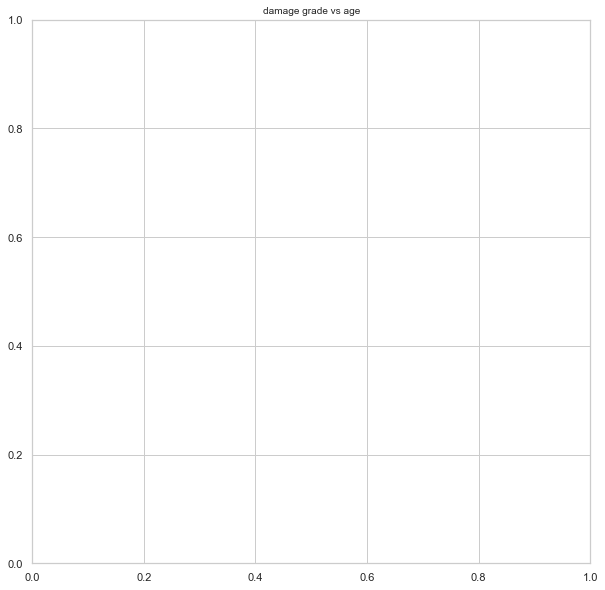

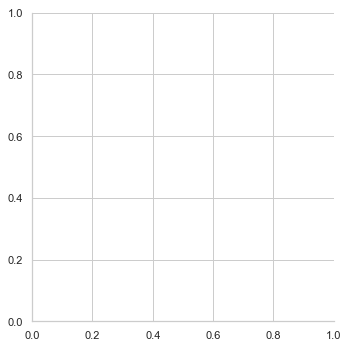

In [35]:
sns.set_style('whitegrid')
plt.rcParams['font.family'] = 'sans-serif'
plt.figure(figsize=(10,10))
plt.title('damage grade vs age' , fontsize=10)

sns.lmplot(x='age',y='damage_grade',data=train_data, hue= 'foundation_type')

TypeError: Could not convert HighMediumHighMediumHighMediumHighLowMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumHighLowLowMediumHighHighHighHighHighLowMediumLowHighLowHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumMediumMediumHighLowMediumLowMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighLowHighMediumMediumLowLowHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowLowMediumMediumMediumMediumHighMediumHighLowMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighHighHighMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumHighLowLowMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumHighMediumMediumHighHighMediumMediumLowLowHighMediumLowLowMediumMediumLowMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowLowLowMediumHighMediumLowMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumLowMediumLowHighHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumLowHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumLowHighHighHighMediumHighHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumLowLowMediumMediumHighHighMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighLowHighMediumLowMediumMediumMediumLowLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighLowLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumLowMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumHighHighHighLowHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumLowHighHighHighMediumMediumMediumMediumLowMediumHighMediumHighLowHighHighLowMediumHighMediumMediumLowMediumHighMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumHighMediumMediumHighLowHighHighMediumLowMediumHighLowHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighHighLowHighHighHighLowHighHighMediumHighLowHighHighMediumLowLowHighMediumHighLowMediumHighHighHighMediumLowHighHighMediumMediumHighMediumHighHighMediumHighHighMediumHighHighMediumHighHighMediumMediumHighMediumLowHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowMediumLowLowMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumLowHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumLowLowLowHighHighHighHighHighMediumMediumLowHighHighHighMediumHighLowMediumHighMediumLowLowMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighLowHighMediumMediumLowLowMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighHighLowHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumLowHighHighHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumHighHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumLowLowMediumMediumMediumHighHighHighHighMediumLowHighMediumHighMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumLowHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighLowLowMediumMediumHighLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighLowHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumHighMediumHighMediumHighHighMediumMediumHighLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighLowHighHighHighHighHighHighHighMediumMediumHighHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumLowLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighLowHighHighMediumHighHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumMediumLowLowLowLowMediumHighHighLowHighHighMediumMediumHighMediumMediumLowMediumLowMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumLowHighLowHighMediumHighHighHighMediumHighLowHighMediumLowHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumLowMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumLowHighMediumLowHighMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumLowLowLowMediumMediumMediumLowLowMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowHighHighMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumLowHighMediumHighLowHighMediumMediumHighHighLowHighMediumHighMediumLowLowMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumLowLowHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumHighLowMediumHighHighHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowLowMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighHighHighMediumHighHighMediumLowLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighLowHighMediumMediumLowMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighLowLowLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighLowHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowLowMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighHighHighHighLowLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighLowHighHighHighHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighLowMediumLowHighMediumHighMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumHighLowMediumLowMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowLowHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowHighHighMediumHighHighLowMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighHighLowLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowLowHighMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighLowMediumMediumHighHighMediumMediumLowLowLowMediumHighLowMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighLowMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowLowMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighMediumLowHighLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumLowMediumHighHighLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumLowHighMediumLowHighMediumMediumHighHighHighMediumLowHighMediumLowMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighLowMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumHighMediumMediumHighHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumLowHighMediumHighHighLowMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighHighLowHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighHighMediumLowMediumLowLowMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighHighMediumLowMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumHighHighHighMediumHighHighLowMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumHighHighLowMediumMediumLowLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumHighHighHighHighMediumLowHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowHighLowMediumMediumHighHighMediumMediumMediumLowLowLowMediumMediumHighLowHighMediumHighMediumHighHighHighHighHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowHighHighMediumHighLowLowLowMediumMediumHighLowHighLowMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighLowMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumLowHighHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumLowMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumLowHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumLowLowMediumHighHighLowLowMediumMediumLowLowMediumMediumMediumHighLowLowMediumMediumHighMediumLowHighLowMediumLowHighHighHighHighHighMediumMediumHighMediumLowMediumHighHighHighHighMediumHighHighHighHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumLowLowLowMediumHighHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighLowHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumLowHighHighLowHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumMediumMediumLowHighMediumLowLowHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumMediumLowMediumHighHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighHighLowHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighLowLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighLowMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumHighHighHighMediumMediumLowMediumLowHighMediumMediumHighHighLowHighHighHighMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumHighMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumHighHighHighMediumHighHighMediumHighHighMediumLowHighMediumHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighHighMediumHighLowHighHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumLowHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumLowHighHighMediumMediumMediumLowHighLowLowHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumHighMediumHighMediumHighMediumLowLowMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighLowMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighHighHighLowLowMediumMediumLowMediumHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumHighMediumMediumMediumHighLowLowMediumMediumHighHighLowMediumLowLowHighMediumLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumHighMediumLowMediumLowMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumHighHighLowLowHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighLowLowHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighHighHighLowHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumMediumLowHighHighLowHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumHighLowMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowLowLowMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighLowHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumLowHighHighMediumHighMediumLowHighMediumHighLowMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumHighLowHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumLowHighMediumLowMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumLowLowHighHighMediumMediumLowMediumHighHighLowMediumMediumLowHighHighMediumLowMediumLowHighHighHighMediumMediumMediumMediumHighHighHighLowLowHighHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumLowMediumMediumHighLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowHighMediumHighHighMediumHighMediumMediumLowMediumLowHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighHighLowHighHighHighHighLowLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumLowHighHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighLowMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighLowHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighHighMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighHighMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowHighHighHighMediumHighHighMediumHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumLowLowHighHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowLowHighMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighLowHighHighHighMediumHighMediumMediumHighHighHighMediumMediumLowHighHighLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumLowLowLowHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumMediumHighMediumHighHighMediumHighHighHighMediumLowMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumLowHighMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumHighHighHighMediumMediumLowHighHighMediumMediumHighLowMediumHighHighLowHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowHighMediumMediumMediumLowMediumHighMediumHighMediumHighHighLowMediumMediumHighHighHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowLowHighHighHighMediumMediumMediumHighLowHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumLowMediumHighMediumHighMediumHighMediumHighMediumLowLowLowHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumLowLowLowHighHighHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumLowHighMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumLowMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighLowLowHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighHighMediumHighMediumHighLowMediumHighHighHighMediumLowMediumMediumHighHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowHighMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighLowMediumHighHighMediumHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowLowLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumLowLowMediumHighMediumLowHighHighHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumLowHighMediumMediumMediumHighHighMediumHighLowHighMediumLowMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumMediumHighHighLowHighMediumLowHighLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumLowMediumMediumLowMediumHighHighHighMediumHighMediumMediumLowHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighHighHighLowMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumLowLowHighHighHighMediumHighHighMediumMediumMediumHighHighHighLowLowHighMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowLowHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumHighLowHighHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowLowHighHighHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumLowHighHighLowHighMediumMediumHighHighHighHighHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumLowHighHighMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumHighLowMediumLowMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowLowHighMediumLowLowHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumLowHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumLowHighMediumMediumHighLowMediumMediumLowMediumHighLowHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighLowLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighHighLowMediumLowHighHighHighMediumHighHighLowHighHighLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighLowMediumMediumLowMediumHighHighLowHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowLowMediumHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighLowLowHighHighMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowLowMediumHighHighMediumLowMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighLowLowMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumLowMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumLowLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumLowHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumLowMediumHighHighMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumHighHighHighMediumHighLowMediumHighHighMediumMediumLowHighHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighHighHighHighHighMediumLowHighHighLowMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumLowHighMediumHighHighMediumMediumLowHighHighHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumLowHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighHighMediumHighHighMediumMediumMediumHighLowMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighHighHighHighMediumHighHighMediumMediumLowHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighHighLowMediumHighLowHighHighHighMediumMediumHighHighMediumLowLowHighHighHighHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowLowLowMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumLowHighHighLowLowHighMediumHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighLowHighHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowHighHighLowHighMediumMediumMediumMediumLowMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowLowLowLowLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowLowMediumLowLowMediumHighHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumLowHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighHighMediumMediumLowHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumLowMediumMediumHighHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighLowMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighLowMediumHighMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowLowLowHighHighHighMediumLowMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumLowMediumMediumHighHighLowMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighLowHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighHighLowLowMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowHighHighLowMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumHighHighHighHighLowMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumLowLowLowHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumLowHighHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighLowHighMediumMediumMediumMediumHighMediumLowMediumLowHighLowLowLowHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumLowHighMediumHighLowHighMediumLowHighHighMediumMediumHighHighMediumHighMediumLowHighHighMediumMediumLowMediumLowLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighLowLowMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighLowMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighLowLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighMediumHighHighHighMediumHighHighHighMediumHighHighMediumLowMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowHighHighHighLowMediumLowMediumMediumHighLowMediumHighHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighLowHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighHighMediumMediumLowHighHighMediumMediumMediumLowLowMediumMediumHighHighHighMediumMediumHighHighHighLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumLowLowHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighLowMediumMediumHighHighMediumMediumHighLowLowMediumMediumMediumHighMediumHighLowMediumHighLowMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighLowMediumHighLowLowLowHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumMediumHighMediumMediumHighMediumLowLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighHighLowLowHighMediumHighMediumMediumHighMediumMediumHighHighHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowLowLowHighLowLowMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighHighHighMediumHighMediumMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowLowMediumHighHighHighHighMediumMediumMediumHighLowLowHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumLowMediumLowMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowHighLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighLowLowMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighLowHighMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighLowMediumMediumLowHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumHighLowMediumLowMediumLowHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighMediumHighLowLowHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumLowHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighLowHighHighMediumLowHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighLowLowMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighHighMediumMediumLowLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumLowHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumLowMediumLowHighLowMediumMediumLowHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighLowMediumMediumLowLowMediumHighMediumMediumHighLowMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumLowLowLowHighHighLowMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowHighHighMediumMediumHighLowHighHighHighMediumLowLowMediumMediumHighHighLowMediumMediumLowHighMediumMediumMediumHighHighLowHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumHighHighHighHighMediumMediumLowLowMediumMediumMediumHighMediumHighHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumMediumLowMediumLowLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumLowLowLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumLowMediumHighHighLowHighMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighMediumLowMediumMediumHighHighMediumHighLowHighHighHighMediumHighMediumLowLowHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighLowHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumLowHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighLowHighLowHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighHighMediumMediumLowHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumLowLowMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighHighLowHighHighLowMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumLowMediumLowMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumLowMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighHighHighMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumLowLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighHighMediumHighHighHighHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighLowLowHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumHighLowMediumLowHighHighHighHighMediumMediumLowMediumMediumHighHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumHighLowHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumLowHighLowHighMediumHighLowHighMediumMediumHighHighLowHighLowMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumMediumHighHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighLowLowHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighLowMediumMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighLowMediumMediumHighLowHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighMediumLowHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumLowMediumLowHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumLowHighLowMediumMediumHighMediumMediumHighHighHighMediumLowMediumLowMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighLowHighHighHighMediumHighHighMediumHighMediumMediumLowMediumHighHighHighHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighLowLowLowMediumHighHighHighLowHighMediumMediumHighMediumLowMediumMediumHighMediumMediumLowMediumLowLowHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighHighHighLowLowMediumMediumHighMediumLowHighHighHighLowHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighHighHighHighHighMediumMediumLowMediumHighMediumHighMediumLowMediumMediumHighLowMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighLowMediumLowHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumHighLowHighHighHighMediumLowHighMediumMediumHighMediumMediumHighLowMediumHighMediumLowMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighLowMediumHighHighHighMediumLowMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighHighMediumHighLowMediumMediumHighMediumHighHighHighHighHighHighHighHighMediumHighHighMediumLowMediumMediumLowHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumLowMediumMediumLowHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighLowMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumLowMediumLowMediumHighMediumMediumHighHighHighMediumLowMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighLowHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowLowMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighHighLowMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighLowMediumMediumLowHighMediumMediumHighHighMediumLowHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowLowMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowHighMediumHighHighLowHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighHighHighHighHighHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumMediumHighHighHighHighHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumLowLowHighLowHighMediumHighMediumHighLowHighHighLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumMediumLowHighHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumHighLowMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighLowHighLowMediumHighLowMediumHighMediumHighHighMediumHighHighLowLowMediumMediumMediumLowMediumHighHighLowHighMediumHighHighHighHighLowHighHighHighHighHighHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighLowHighLowMediumHighHighHighHighMediumMediumHighHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighLowHighMediumHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowLowHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighMediumLowMediumLowMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighHighHighMediumHighLowMediumMediumMediumHighLowHighHighMediumMediumHighHighHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumLowLowMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighHighMediumMediumLowLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighLowLowMediumLowLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumLowLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowLowMediumMediumLowMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighLowMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowLowMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowMediumHighMediumHighHighHighMediumLowHighHighMediumHighHighHighHighHighHighLowMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighHighMediumHighMediumHighMediumLowMediumLowHighHighHighMediumMediumHighLowHighHighMediumHighHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighLowLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighLowLowHighHighMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumLowMediumMediumHighHighHighHighHighMediumHighMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighLowLowMediumHighLowMediumLowLowMediumHighMediumMediumMediumHighHighHighLowLowMediumMediumMediumLowHighMediumMediumHighHighLowHighMediumMediumLowMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowMediumHighMediumLowMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighHighLowHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighLowMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumLowLowHighMediumMediumLowMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumLowLowMediumHighLowLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighLowHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumLowHighHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumLowHighLowMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighHighHighLowHighHighHighMediumMediumHighHighLowMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowLowMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumLowHighLowLowMediumMediumLowHighMediumMediumMediumHighHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumLowHighMediumHighHighHighMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumLowMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighLowLowHighMediumMediumMediumLowMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighMediumLowLowHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumHighHighMediumMediumHighLowMediumHighHighLowMediumLowHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighHighMediumLowHighMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumHighHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumLowMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumLowMediumHighHighHighMediumHighHighMediumHighMediumHighHighHighHighHighLowMediumMediumHighLowHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumLowMediumLowMediumLowMediumMediumHighHighLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighLowHighMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighHighLowHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumLowLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighLowMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighHighLowMediumHighHighLowMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighLowLowMediumMediumMediumLowMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumHighHighMediumHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighLowMediumMediumHighHighMediumLowHighLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighLowMediumHighHighHighHighMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighLowHighMediumHighHighLowHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumLowHighLowMediumMediumMediumMediumLowLowMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighLowMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumLowMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumLowLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighLowHighHighMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumLowLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighLowMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowMediumHighHighMediumHighHighLowLowLowHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighLowLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighLowHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumLowHighHighHighHighMediumHighMediumLowHighHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowLowHighLowLowLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighMediumLowHighLowMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighHighHighHighHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumLowMediumLowHighMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumLowHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumHighHighHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowLowLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowHighMediumHighMediumHighLowMediumHighMediumLowHighHighMediumMediumMediumMediumHighLowMediumLowMediumLowMediumLowHighHighHighHighMediumLowMediumHighHighLowMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowLowMediumHighLowLowMediumMediumLowMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowMediumHighLowLowMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighLowHighHighMediumLowMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumHighHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumHighHighLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowLowLowMediumHighMediumMediumLowMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighHighHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumHighLowMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumLowMediumLowHighLowLowHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighLowMediumHighLowHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumLowMediumHighHighHighHighHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighLowLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighLowHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighLowLowHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumLowMediumHighHighLowHighMediumMediumMediumLowHighHighHighLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumHighHighHighHighLowHighMediumMediumLowMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumHighHighMediumMediumLowHighMediumMediumHighHighMediumHighHighHighHighHighHighHighHighMediumHighHighLowLowMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumHighHighLowHighLowHighMediumHighHighMediumLowMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowHighHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighHighHighHighLowHighLowHighMediumMediumMediumMediumLowHighHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighMediumHighHighHighLowHighHighMediumLowHighMediumMediumLowMediumHighHighMediumHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumHighHighMediumHighMediumHighMediumLowHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumLowHighMediumLowHighMediumMediumHighLowMediumLowHighLowLowMediumHighMediumHighMediumHighHighHighMediumHighMediumLowLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumLowHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowHighHighMediumMediumHighHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumLowLowMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighLowHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighLowLowMediumMediumLowLowMediumMediumHighMediumMediumMediumHighMediumMediumLowLowHighMediumMediumLowMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumLowHighHighLowLowHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighHighLowHighMediumMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumLowLowHighLowMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighLowHighMediumHighLowHighHighMediumHighLowMediumMediumHighMediumMediumLowHighMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumLowLowHighHighHighLowHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumHighHighLowLowMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighHighMediumHighLowHighHighLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowLowMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumLowHighMediumMediumLowHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighLowHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighLowHighMediumHighHighHighMediumLowMediumMediumHighLowMediumMediumLowMediumHighLowMediumMediumHighLowHighMediumMediumMediumHighMediumLowLowMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighMediumHighHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumHighLowHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowHighHighMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighLowLowHighHighMediumLowMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowHighMediumMediumLowMediumHighHighMediumLowMediumLowHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowMediumMediumLowMediumHighMediumHighHighLowHighLowHighHighHighMediumMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowLowHighMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumLowHighMediumMediumHighMediumLowLowMediumHighHighHighMediumHighHighHighHighHighHighLowMediumHighLowHighLowLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowMediumHighMediumMediumHighMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumLowHighLowHighHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumHighLowHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumLowHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowLowMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumLowLowMediumHighLowHighMediumLowMediumLowHighHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighHighHighHighHighHighMediumHighHighLowMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighHighHighMediumHighHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighLowMediumHighLowLowHighHighHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumHighLowMediumLowMediumMediumMediumHighLowLowHighLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighMediumMediumMediumLowHighLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumLowLowHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowHighLowHighHighHighMediumHighMediumMediumHighMediumHighMediumLowHighMediumLowHighLowMediumMediumLowHighHighHighHighMediumMediumLowMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumLowMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighHighHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighLowHighMediumMediumMediumLowHighLowMediumMediumHighMediumLowHighMediumMediumHighLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighHighHighLowHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumLowMediumHighHighLowHighHighMediumMediumHighLowMediumMediumHighMediumMediumHighLowHighMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumHighMediumLowMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighHighLowHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumLowHighHighLowHighHighMediumMediumMediumHighHighHighHighLowLowMediumHighMediumMediumLowHighMediumLowHighHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighHighMediumMediumMediumLowHighHighMediumHighMediumHighLowHighLowMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowHighHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighLowMediumLowMediumHighLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumLowLowHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighLowMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumLowMediumHighHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowHighHighLowLowLowHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumLowLowMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumLowHighHighHighMediumHighHighHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumLowHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighHighHighMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighHighHighLowHighLowHighLowHighMediumMediumMediumHighMediumHighLowMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighHighHighMediumMediumHighMediumHighHighMediumLowHighHighHighMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumLowHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumHighMediumLowLowMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighLowMediumLowHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighHighHighLowHighMediumHighHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighLowHighMediumLowMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighLowMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighLowHighMediumHighHighLowMediumMediumHighHighMediumLowLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowHighHighHighMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowHighLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowLowLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighLowHighMediumHighMediumHighHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowHighLowLowMediumHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumLowHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighLowMediumLowHighHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowMediumLowMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumLowHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighLowMediumHighLowMediumMediumHighHighMediumHighLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighLowHighHighHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighHighHighMediumLowHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumLowLowHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumLowLowHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumLowLowHighMediumHighHighHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumLowLowMediumHighLowMediumLowMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighHighMediumLowHighHighMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighLowHighLowHighLowHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumHighMediumMediumLowMediumLowHighMediumLowHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumLowLowMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighHighLowHighMediumHighLowHighMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighLowHighMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighLowHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumLowMediumHighLowHighHighHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighHighLowLowMediumMediumLowMediumMediumLowMediumHighMediumHighMediumHighMediumHighHighHighMediumLowHighHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighMediumHighMediumHighHighHighHighHighMediumHighHighLowHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighMediumHighMediumMediumLowHighHighMediumMediumLowHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumHighLowMediumMediumLowLowMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighLowHighMediumMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumMediumHighHighHighLowHighHighMediumHighHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowLowMediumHighMediumLowMediumHighHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowHighHighHighHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumHighLowMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumLowLowLowHighMediumMediumHighMediumHighHighLowHighHighHighMediumMediumHighHighLowLowMediumHighMediumLowHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowHighHighMediumHighMediumHighLowMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumLowLowMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighHighHighMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowLowMediumLowLowMediumMediumHighMediumMediumMediumLowMediumHighLowMediumHighMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighHighMediumLowMediumHighMediumHighHighHighHighHighHighHighHighMediumMediumMediumMediumHighHighHighHighHighHighHighMediumLowHighHighHighLowMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighLowHighMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumHighHighMediumLowHighMediumMediumMediumLowMediumLowHighHighLowHighMediumLowHighHighHighHighMediumMediumHighLowMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighHighMediumHighHighHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumHighMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumLowHighMediumHighHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumLowMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowHighLowHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumLowLowMediumMediumMediumMediumHighHighMediumLowMediumMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighLowLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumLowMediumHighMediumMediumMediumLowHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowHighMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumHighLowMediumHighHighMediumHighMediumHighLowHighLowMediumLowHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighLowMediumMediumLowMediumHighLowMediumHighMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighLowLowHighMediumLowMediumHighHighHighMediumHighMediumMediumMediumLowHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighHighLowMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumLowHighHighMediumLowLowMediumMediumMediumHighMediumHighHighHighMediumLowLowMediumMediumHighMediumHighHighMediumHighMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumLowMediumHighHighHighMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighLowMediumLowHighHighHighHighHighHighLowMediumMediumHighLowMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumHighLowLowHighMediumLowLowMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumLowLowHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighLowMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighMediumLowLowLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumLowHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighLowLowMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumLowHighHighLowLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighLowHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumLowLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumLowLowHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumLowLowMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumHighLowMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumLowHighLowMediumHighLowHighHighLowHighMediumLowLowMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumLowHighHighMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighLowLowMediumLowHighHighMediumHighLowHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumLowHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumLowHighHighMediumLowHighHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumLowLowMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowLowLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumLowMediumMediumHighHighLowHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighLowLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighHighLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighHighHighHighLowLowMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumLowLowMediumHighMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumHighHighLowHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighLowHighMediumHighHighMediumHighHighMediumMediumLowHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumHighHighMediumHighHighHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighHighHighMediumHighMediumHighMediumHighMediumHighHighLowMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumLowMediumHighLowHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumMediumHighLowLowMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumMediumLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumLowHighHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowLowHighMediumHighMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumLowLowHighHighLowMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighLowMediumLowMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowHighMediumMediumHighMediumHighHighMediumHighLowHighMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowLowMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumLowHighMediumLowLowLowHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumHighHighLowMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighLowHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighLowLowMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumHighHighHighLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowLowHighLowLowMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowLowHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowLowHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighHighMediumLowHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumLowMediumHighLowMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighHighHighLowHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumLowMediumHighMediumHighHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumLowHighMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighLowHighHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumHighLowHighMediumHighLowMediumHighMediumHighLowMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumLowLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumLowMediumMediumHighHighMediumHighLowHighHighMediumHighHighMediumLowMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowMediumMediumHighLowMediumLowHighMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighMediumLowHighMediumLowHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighLowHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowLowHighHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumLowHighMediumLowHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighLowHighHighHighLowMediumHighMediumHighMediumMediumMediumLowHighLowMediumHighMediumHighLowMediumHighHighHighMediumLowLowMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighHighLowLowHighMediumMediumHighLowLowMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighHighHighMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumLowHighHighMediumMediumLowMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighLowMediumMediumLowHighMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumLowHighLowMediumHighLowLowMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumLowMediumHighMediumHighHighHighMediumLowMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumLowMediumMediumMediumMediumLowLowMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumLowLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumLowMediumHighMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumHighHighHighHighLowMediumHighMediumHighMediumMediumMediumHighHighMediumLowLowMediumMediumHighLowMediumHighHighMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumLowHighMediumHighHighHighHighMediumHighMediumLowHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumHighHighMediumHighMediumHighHighHighHighMediumHighMediumHighMediumMediumHighLowHighHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighLowLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighHighHighMediumHighMediumHighHighMediumMediumLowHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumHighHighLowMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumHighHighLowLowHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowLowLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowLowMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighLowMediumHighHighHighHighMediumLowHighHighMediumMediumMediumLowHighMediumLowHighHighMediumHighHighMediumLowMediumMediumMediumHighMediumHighLowMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumHighHighMediumLowMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowHighHighHighMediumLowHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighHighHighHighHighHighMediumMediumMediumHighLowHighMediumMediumHighHighLowLowMediumMediumMediumHighHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighLowMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighHighHighLowMediumHighMediumMediumHighMediumHighMediumLowHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowLowMediumMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumLowLowLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowLowLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowMediumHighLowHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighLowHighHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumHighMediumMediumLowHighLowHighMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowHighMediumLowHighHighHighMediumHighHighLowMediumMediumLowMediumMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumHighLowMediumLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowLowHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumLowLowLowMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumLowHighMediumMediumMediumHighMediumLowHighHighHighLowHighMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumLowHighHighHighMediumHighMediumHighLowMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowLowMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumHighHighHighLowMediumHighLowMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumHighLowMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumLowHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowMediumLowLowMediumMediumMediumMediumLowMediumLowHighLowHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumLowLowLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumHighHighMediumLowHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighLowHighMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumLowLowMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumLowMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumLowMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumLowHighLowLowMediumHighHighHighLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighHighHighHighHighMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumMediumLowMediumHighHighMediumLowMediumLowMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumLowHighHighHighHighLowHighMediumMediumLowHighHighMediumMediumHighMediumMediumHighLowLowMediumHighHighMediumMediumHighMediumHighLowLowMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighHighLowHighHighLowMediumHighMediumMediumHighHighLowHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumLowMediumHighLowHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumHighHighHighMediumHighHighHighHighMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighLowHighMediumHighHighMediumHighMediumMediumHighHighMediumHighHighHighLowLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighLowLowMediumMediumMediumMediumHighMediumMediumLowLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumLowHighLowHighHighLowMediumHighMediumHighMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighLowMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumLowMediumLowHighHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumLowMediumLowHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighHighLowMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowHighMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumHighHighHighMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowHighLowMediumLowMediumMediumMediumHighMediumHighLowMediumLowMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighHighHighHighLowLowLowHighHighMediumHighLowMediumHighHighHighLowMediumMediumLowHighLowMediumHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowLowHighMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumLowMediumMediumMediumHighLowMediumMediumHighLowMediumMediumLowHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumLowHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowHighMediumHighHighHighLowHighMediumMediumHighLowLowHighMediumHighMediumLowHighHighHighMediumMediumHighLowHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighLowMediumMediumLowHighLowHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowLowHighHighHighHighHighMediumHighHighMediumHighHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowHighHighHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighHighMediumMediumHighHighLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumLowMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighHighMediumHighHighHighMediumHighLowHighHighLowMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumLowMediumHighHighHighHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighHighHighLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumLowMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighLowMediumMediumMediumLowHighHighMediumMediumLowMediumLowHighMediumHighMediumLowHighLowHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumHighHighMediumHighHighMediumLowMediumLowMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumHighLowHighMediumHighHighHighMediumHighHighMediumLowHighMediumLowHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowLowMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighLowLowMediumHighMediumLowMediumHighMediumHighMediumMediumHighLowHighLowMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumLowLowLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumLowHighMediumHighHighHighMediumHighMediumHighLowHighLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumLowHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumLowHighHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowLowMediumLowMediumMediumHighHighLowMediumMediumLowLowMediumMediumLowHighHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowLowMediumLowMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumHighLowMediumMediumHighMediumHighHighHighHighMediumLowLowLowMediumHighMediumLowMediumHighHighMediumLowHighHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumHighHighHighHighHighMediumHighHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighLowLowLowLowHighLowLowHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighLowHighMediumLowHighLowHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumLowHighLowLowMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumLowLowMediumMediumMediumLowMediumLowHighMediumHighHighMediumMediumHighLowMediumMediumMediumLowMediumLowLowMediumMediumMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumLowLowMediumLowMediumMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowHighHighHighLowMediumHighHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumLowLowHighMediumHighMediumHighMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighHighLowMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumLowHighLowMediumHighMediumHighHighHighHighLowMediumMediumHighMediumHighLowMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowHighMediumHighLowHighMediumHighMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumLowHighMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighLowHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumLowLowHighHighMediumMediumMediumMediumLowLowHighMediumHighMediumMediumHighMediumHighLowMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowLowHighLowMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumLowMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowLowLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighLowHighHighMediumLowHighLowMediumHighMediumHighLowMediumLowHighMediumMediumHighHighHighMediumHighHighHighLowHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighLowLowMediumMediumHighLowMediumMediumMediumMediumHighHighHighHighHighHighLowMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumLowLowLowMediumMediumHighHighLowMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumHighMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighHighHighLowHighMediumMediumLowMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowLowMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighLowMediumLowMediumLowMediumMediumMediumHighMediumLowHighLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowLowMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighHighLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighLowMediumMediumHighHighHighLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighLowMediumLowLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighLowMediumMediumLowMediumMediumMediumMediumHighLowLowHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumLowHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighLowHighMediumMediumMediumHighHighLowMediumMediumHighMediumHighLowHighHighMediumLowLowMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumHighHighMediumHighHighHighHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumLowHighMediumHighLowHighMediumMediumHighMediumLowHighMediumLowMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowHighMediumLowMediumLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumLowHighMediumMediumMediumHighLowMediumMediumHighMediumLowHighHighLowMediumMediumMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighLowHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumHighMediumHighMediumLowMediumHighLowLowMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumLowHighLowMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumLowLowMediumHighHighHighHighLowHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumHighHighLowHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowLowMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighHighHighLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumLowMediumHighMediumHighMediumLowLowMediumHighLowMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighLowLowHighMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumHighHighHighMediumHighHighLowHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumLowLowLowHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumLowHighMediumLowMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighLowLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumHighMediumHighHighMediumLowHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighLowHighMediumHighHighLowMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumLowMediumHighHighHighHighLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumLowMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumMediumMediumLowMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighMediumHighLowHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighLowHighMediumLowHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumHighHighHighLowMediumHighMediumHighHighMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighHighHighHighLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighMediumLowMediumHighMediumLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighMediumMediumMediumHighMediumHighLowHighHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumHighMediumHighHighLowHighMediumLowMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighLowLowHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighHighHighHighMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighLowMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumHighHighLowHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighHighLowMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumMediumHighHighMediumMediumHighMediumLowHighMediumLowHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumLowLowHighMediumMediumHighHighLowMediumMediumMediumLowLowMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighHighMediumHighHighMediumLowHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowHighMediumHighMediumHighMediumHighHighHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighHighMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumLowHighMediumLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighLowMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumLowLowMediumMediumMediumHighHighHighHighHighMediumHighMediumHighHighMediumLowHighHighLowHighMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighLowMediumLowHighHighHighMediumMediumLowMediumHighHighHighMediumMediumHighHighMediumHighHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighLowMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumLowMediumMediumMediumLowHighLowMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumHighMediumHighLowHighMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowHighHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighLowHighMediumLowHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumLowHighLowMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowHighHighLowMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumHighMediumHighLowLowLowHighHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowMediumMediumHighLowMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumHighLowMediumHighHighHighMediumHighHighMediumHighLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowLowMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumLowLowMediumLowHighHighMediumHighLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighLowMediumHighHighMediumHighHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighLowLowMediumMediumMediumHighMediumHighMediumLowMediumHighLowMediumMediumHighMediumHighMediumLowHighMediumMediumHighLowLowMediumHighMediumLowMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumLowHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowLowLowLowHighMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighLowMediumMediumLowMediumHighLowMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumHighHighMediumLowHighMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumLowHighHighMediumHighHighHighMediumMediumLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowLowHighLowHighLowHighMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowLowHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighHighLowMediumHighHighLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumHighHighMediumLowHighHighMediumMediumMediumHighLowHighLowLowHighHighMediumHighHighMediumHighMediumMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighLowLowHighMediumMediumHighLowMediumHighHighMediumHighLowLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumHighMediumHighHighMediumLowLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumMediumHighLowHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighLowMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumHighLowLowHighMediumMediumHighHighLowHighLowHighMediumMediumHighLowHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowHighMediumMediumLowHighHighLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighLowHighHighHighHighHighLowLowMediumLowMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighLowMediumLowMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumHighLowHighHighLowHighHighMediumHighHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighLowHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumMediumHighMediumLowMediumLowMediumHighLowMediumMediumHighMediumHighHighHighLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumLowLowHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumLowLowMediumMediumHighLowMediumHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumHighHighLowMediumLowLowHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumLowLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumLowMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighHighHighHighLowLowMediumMediumMediumLowLowMediumHighMediumHighHighHighHighMediumLowMediumLowMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighLowMediumLowHighLowMediumMediumMediumHighLowHighMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighLowHighLowLowHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumLowMediumMediumHighHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumLowHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowLowHighHighMediumLowLowLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighLowHighMediumHighMediumMediumHighHighLowHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumLowLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighHighLowMediumHighMediumHighMediumLowLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighLowMediumLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumLowHighMediumHighLowHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowLowHighHighMediumLowMediumMediumMediumMediumHighHighLowMediumHighMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowHighHighHighMediumHighHighHighHighHighMediumHighMediumHighMediumHighMediumMediumHighHighLowLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumMediumLowHighMediumHighLowMediumHighMediumMediumHighLowMediumMediumHighHighHighMediumHighLowHighHighMediumMediumMediumHighHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumLowLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowLowMediumMediumLowMediumLowMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighLowLowHighHighHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumHighHighHighHighHighMediumMediumHighMediumHighMediumHighHighHighHighHighHighLowMediumMediumHighHighMediumMediumLowMediumHighHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumLowMediumLowHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumLowHighHighMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumMediumLowHighMediumLowMediumHighMediumHighMediumLowMediumHighHighHighHighMediumMediumHighHighMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighLowHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighHighMediumHighLowHighLowMediumMediumHighHighMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighMediumMediumLowHighLowHighHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumHighHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighHighHighMediumHighHighMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowHighHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumLowLowLowMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumLowMediumMediumLowHighMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumLowHighHighHighMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowLowMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighLowHighHighMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighLowHighHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumLowLowMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighLowHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumLowMediumHighMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighLowHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowLowMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumLowMediumLowLowHighHighHighLowMediumMediumLowHighHighHighHighMediumHighHighMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighLowHighHighHighMediumLowHighLowHighHighMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumLowMediumMediumLowLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighLowLowHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumLowHighMediumHighMediumHighHighMediumHighHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighLowLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumLowMediumMediumLowMediumHighHighHighMediumHighHighLowMediumMediumHighLowMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumLowMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighLowLowMediumHighMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumLowMediumMediumHighLowMediumHighMediumHighHighLowHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighLowMediumMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighHighLowHighMediumLowHighMediumLowHighHighMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumLowMediumMediumMediumLowMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowMediumHighLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumHighHighMediumMediumHighLowHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighLowHighHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighHighHighHighMediumHighMediumHighLowMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumHighLowLowHighMediumLowLowMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumLowLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighLowMediumHighHighMediumMediumHighMediumLowHighHighHighHighHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumHighHighMediumLowHighMediumHighHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumLowLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowMediumHighHighHighHighHighHighLowHighMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumLowHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumLowHighMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumLowLowHighHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumLowLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowLowHighMediumMediumMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumHighHighHighHighMediumMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighHighLowMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighLowLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighMediumHighHighHighHighHighMediumMediumHighHighHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighLowHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighLowLowMediumMediumMediumMediumLowMediumHighHighHighHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumLowMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumHighHighLowLowMediumMediumMediumHighLowMediumHighLowMediumMediumHighMediumMediumMediumLowLowMediumHighHighHighHighHighHighLowMediumMediumMediumMediumMediumHighLowMediumLowMediumHighHighLowMediumMediumMediumHighMediumLowHighHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowLowHighLowMediumHighLowHighHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumLowHighMediumLowHighHighHighMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumLowMediumHighMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighHighLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumLowHighMediumLowLowLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumLowHighHighMediumMediumMediumHighHighHighLowHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumLowMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighHighHighMediumLowHighMediumMediumMediumLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumMediumHighHighMediumLowHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumLowLowHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumLowMediumMediumLowMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighHighLowHighLowLowMediumHighMediumHighMediumHighMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumLowLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighLowMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighHighHighLowMediumHighMediumMediumHighLowMediumHighHighHighHighHighHighHighLowHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumLowLowLowMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumHighHighLowLowMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumHighMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumLowHighLowMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowLowHighHighHighHighLowMediumHighLowLowMediumLowMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumLowHighMediumHighLowMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowLowMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumLowLowMediumMediumMediumHighLowHighMediumHighLowLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumLowMediumLowMediumMediumHighHighMediumMediumHighLowLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumLowMediumHighLowMediumHighHighMediumHighHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumHighHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighHighLowLowMediumMediumLowMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumLowMediumLowLowMediumLowMediumHighMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighHighHighLowLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighLowHighHighHighHighMediumHighMediumMediumMediumHighLowLowHighMediumHighHighHighHighLowHighLowLowHighHighHighLowMediumMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumLowMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumLowLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighLowLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighLowMediumHighHighHighMediumHighHighHighMediumLowHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumLowHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumLowMediumMediumHighHighMediumMediumHighLowMediumHighLowHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighHighHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowMediumMediumLowLowHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumLowHighMediumLowMediumMediumHighHighMediumHighLowLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighLowMediumLowMediumHighMediumHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumLowLowMediumLowLowMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumLowMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumLowMediumMediumHighHighHighHighLowMediumHighLowLowHighHighMediumMediumHighMediumLowHighMediumMediumHighLowMediumHighMediumHighMediumLowHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighLowLowHighMediumMediumHighMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighLowHighLowLowMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumHighHighMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighLowHighHighMediumMediumMediumMediumHighHighHighLowHighMediumMediumHighMediumHighHighMediumHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumLowMediumHighHighHighHighHighMediumMediumHighMediumLowHighHighMediumHighHighHighMediumLowHighMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighLowMediumLowLowMediumMediumHighHighLowMediumLowHighMediumLowHighHighMediumMediumMediumHighMediumHighHighLowMediumHighLowMediumMediumMediumLowMediumMediumHighLowMediumHighMediumLowLowMediumLowMediumMediumHighHighHighHighMediumMediumHighHighLowMediumMediumMediumHighMediumLowLowHighMediumHighMediumHighMediumHighHighHighMediumHighMediumLowMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighHighLowLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumLowLowLowMediumLowHighHighMediumHighLowMediumMediumLowHighHighHighMediumHighLowLowLowMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumHighHighMediumMediumHighHighHighMediumLowMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighHighMediumHighLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighLowMediumMediumHighMediumHighMediumLowHighLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowHighLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumHighHighHighHighHighHighMediumMediumHighHighLowMediumHighMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumLowLowHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumLowHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighLowHighLowMediumHighLowHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighLowMediumLowMediumLowMediumHighMediumMediumMediumLowHighHighMediumMediumLowLowLowMediumHighHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighMediumHighMediumHighHighHighHighLowMediumHighMediumHighHighHighLowMediumHighHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumLowLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighHighMediumLowHighMediumMediumHighHighHighHighMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumLowLowHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumLowLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowMediumHighMediumLowHighMediumMediumLowMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumLowHighMediumLowLowMediumMediumLowMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumLowMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighLowLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumLowLowLowHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighLowHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumLowHighMediumHighHighHighHighLowMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumHighHighMediumHighMediumLowHighLowHighHighHighHighMediumMediumHighHighMediumLowHighMediumHighLowMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowLowHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumHighHighHighHighMediumHighHighLowHighMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighHighHighLowLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumLowHighHighLowHighHighMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumLowHighMediumLowHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighHighHighHighMediumMediumLowMediumMediumLowHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighLowHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumHighMediumHighMediumMediumHighLowHighHighHighLowHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumLowLowHighLowMediumHighLowMediumMediumMediumHighHighLowLowMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighLowHighHighHighMediumHighLowHighMediumHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumLowLowHighHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumLowLowHighMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumHighLowHighLowMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighHighLowLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumLowHighMediumMediumMediumHighHighHighHighHighMediumLowHighLowMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumHighHighHighHighLowMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowHighMediumHighMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumLowLowHighMediumMediumHighMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumLowHighHighMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowHighLowMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighLowMediumLowMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumLowLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumLowMediumHighMediumHighHighHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighLowHighHighMediumHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumMediumHighLowMediumMediumHighHighLowHighHighHighHighMediumHighMediumMediumMediumHighHighMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumLowLowMediumHighMediumLowMediumHighLowMediumMediumMediumHighMediumMediumLowLowMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumLowHighHighMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighHighLowHighMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighMediumLowHighMediumLowMediumHighHighLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighHighHighHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighLowHighHighMediumMediumLowLowHighMediumMediumLowHighLowMediumHighMediumHighMediumMediumMediumMediumLowMediumLowHighMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumHighLowMediumLowMediumLowHighLowHighHighMediumMediumMediumHighHighHighMediumMediumHighLowHighHighMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumLowHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumLowHighLowMediumMediumHighMediumHighMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumLowLowHighLowMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowLowMediumMediumMediumHighHighMediumHighHighHighHighMediumHighMediumMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighHighMediumHighHighHighLowMediumMediumMediumLowMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumLowHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumLowHighLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighLowLowMediumHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumHighLowLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighLowHighHighLowLowLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighHighLowMediumMediumMediumHighLowLowLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowLowMediumHighMediumLowMediumHighMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighHighMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighLowMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighHighLowHighHighHighMediumMediumMediumHighMediumHighHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighHighHighMediumLowLowMediumMediumHighMediumMediumLowHighMediumMediumMediumHighHighMediumHighLowHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumLowHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighHighHighHighHighMediumHighMediumHighHighMediumHighLowLowHighHighMediumMediumHighMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowHighHighMediumMediumHighLowHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowLowLowMediumMediumLowMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighLowHighMediumHighMediumMediumMediumLowHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowLowHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumLowLowMediumLowMediumLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighHighHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumHighHighMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighHighMediumHighHighMediumLowMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighLowLowMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumLowLowHighLowMediumHighMediumHighMediumMediumLowMediumLowMediumMediumHighHighHighMediumMediumLowMediumMediumHighLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumLowHighMediumMediumLowMediumHighMediumHighHighHighLowMediumLowHighMediumMediumLowLowLowMediumHighMediumLowHighMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumLowLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighLowMediumHighHighLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumLowHighLowMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighLowHighMediumMediumHighMediumMediumHighHighMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumLowHighLowMediumMediumMediumHighLowMediumHighHighMediumHighHighLowMediumMediumHighHighHighMediumLowMediumLowMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighHighLowHighLowLowMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumLowHighLowMediumLowHighLowMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumLowMediumHighMediumLowMediumMediumHighHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowLowLowHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumLowMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumLowHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumLowHighLowMediumHighLowMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumLowHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumHighHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowHighMediumMediumLowHighMediumHighMediumMediumHighHighLowLowHighHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumLowHighHighLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighLowHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumLowHighHighLowMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumHighHighHighMediumLowHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumLowMediumMediumHighLowMediumHighHighHighMediumHighMediumMediumHighHighHighMediumLowHighHighHighMediumHighLowMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowHighLowLowHighLowLowHighLowLowHighHighMediumMediumMediumMediumHighMediumMediumHighLowHighHighHighHighMediumMediumLowMediumHighMediumLowMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighLowHighHighLowMediumMediumHighMediumHighHighMediumMediumMediumLowMediumLowHighHighHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumLowHighMediumMediumMediumLowHighLowMediumMediumMediumLowHighHighMediumMediumLowMediumHighMediumLowMediumMediumLowMediumMediumMediumHighLowMediumHighHighMediumLowHighMediumHighMediumHighMediumMediumLowLowMediumMediumMediumLowMediumHighLowHighHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighLowLowHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowHighHighHighMediumMediumHighHighMediumHighLowHighMediumLowMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighLowHighHighMediumHighMediumLowHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumLowMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighLowHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowLowHighMediumMediumHighHighMediumLowMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumHighHighHighLowMediumMediumMediumLowHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowHighHighLowMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighLowHighMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumLowHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighHighLowMediumHighHighHighHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowLowMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumHighHighMediumHighMediumLowHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumHighHighHighMediumMediumLowHighMediumHighMediumHighLowLowMediumHighMediumHighMediumLowHighLowHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowHighHighHighMediumHighHighLowHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumLowHighMediumLowHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowHighHighLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighHighLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighLowLowMediumMediumLowMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowLowHighLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumLowMediumHighHighLowMediumHighHighMediumHighHighLowHighHighMediumHighHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighHighHighHighLowMediumMediumLowMediumHighHighMediumLowMediumMediumHighHighMediumMediumLowHighHighMediumHighHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowHighMediumMediumLowHighMediumLowHighMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumLowMediumHighLowMediumHighMediumMediumHighHighMediumMediumLowMediumHighLowMediumHighMediumMediumHighMediumHighLowMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighLowMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumLowMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighMediumLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowLowHighMediumHighHighLowHighMediumLowLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighLowHighMediumMediumLowHighLowMediumHighMediumLowMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighLowLowHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumHighLowMediumLowHighMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumHighHighHighMediumLowHighMediumHighHighMediumHighHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumHighMediumLowMediumLowHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowLowMediumMediumHighHighHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumLowMediumHighMediumMediumHighLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighLowLowHighHighHighMediumMediumLowHighLowMediumHighLowMediumHighMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumLowLowHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighLowHighMediumLowMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumHighHighHighMediumHighHighLowMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighLowMediumMediumLowHighHighHighMediumMediumHighHighMediumLowMediumHighLowMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumHighLowHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighLowMediumLowMediumMediumHighMediumMediumLowHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumHighMediumMediumHighMediumLowMediumLowMediumHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighHighHighMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumLowLowMediumHighMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumLowLowMediumLowHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumLowMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumLowLowMediumMediumMediumHighMediumMediumHighHighLowMediumMediumLowHighHighHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighMediumHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumMediumHighHighLowHighMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumLowHighLowHighMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumLowLowMediumLowLowMediumMediumHighHighMediumLowMediumHighHighHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumLowMediumLowHighLowLowLowHighMediumHighMediumHighMediumMediumHighLowHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighHighLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumLowLowMediumLowHighMediumHighMediumHighMediumHighMediumLowMediumHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighHighLowHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumLowHighMediumHighMediumLowLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowHighHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumMediumHighLowHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighLowLowMediumMediumHighHighLowLowLowMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowLowHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighHighHighHighHighHighMediumHighMediumLowHighHighLowHighMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighLowHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighLowHighLowHighHighMediumMediumLowLowMediumMediumMediumMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumLowHighHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighLowHighHighLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumHighHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumMediumLowHighMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighLowMediumMediumLowMediumLowMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighLowMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumLowMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighLowLowHighMediumHighMediumLowHighMediumMediumMediumLowLowHighMediumHighHighLowMediumMediumHighLowMediumHighMediumMediumLowLowHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighHighLowHighHighHighLowHighMediumLowMediumMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighHighHighLowHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowHighLowMediumMediumHighLowHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowHighLowHighHighMediumMediumHighMediumLowHighMediumHighMediumHighLowMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighLowMediumMediumHighHighHighMediumHighHighHighMediumHighLowMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumLowMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighLowLowLowHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighHighLowMediumLowHighMediumHighHighHighLowHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowLowLowMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighHighHighHighHighLowMediumMediumLowMediumLowMediumMediumHighHighMediumMediumHighLowHighMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowLowMediumHighHighHighMediumHighLowLowMediumMediumLowHighHighHighMediumMediumLowLowHighHighMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighLowMediumMediumLowHighMediumLowMediumMediumLowLowMediumMediumMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumLowLowLowHighHighMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighLowHighMediumLowLowMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighLowMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighHighLowLowHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighLowHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighLowMediumLowMediumMediumMediumLowHighLowMediumHighHighMediumLowHighLowHighMediumMediumHighLowMediumMediumHighLowMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumHighLowLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumLowMediumLowMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowLowHighHighHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumLowHighMediumMediumHighMediumLowHighMediumLowLowMediumHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighLowHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighLowMediumMediumHighHighMediumMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighMediumLowLowHighMediumHighMediumHighLowMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighHighMediumLowMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowHighMediumMediumHighHighLowMediumMediumHighHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumLowMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumLowHighHighHighHighMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumLowMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowLowMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowLowHighMediumMediumMediumLowLowMediumLowMediumMediumHighLowLowMediumMediumMediumHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighLowMediumLowMediumHighHighHighMediumMediumLowMediumMediumMediumLowHighMediumMediumLowMediumHighHighMediumHighHighHighLowHighLowMediumHighMediumMediumMediumMediumHighLowLowMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowLowHighHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumLowHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighLowHighLowHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighLowHighMediumHighHighHighHighHighHighMediumHighMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighHighMediumHighMediumHighMediumHighHighHighMediumLowMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumLowLowMediumHighMediumLowHighLowHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighLowMediumHighLowHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowMediumHighHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighLowMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowMediumHighHighHighMediumHighMediumMediumHighMediumLowLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowLowMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumLowHighLowHighMediumMediumMediumMediumHighMediumLowHighMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighHighLowMediumMediumHighLowHighMediumLowMediumHighHighLowHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumLowMediumHighHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumLowHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowMediumHighHighLowHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighMediumLowMediumLowMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumLowMediumLowLowMediumMediumHighMediumHighHighMediumLowHighMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumLowHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighLowMediumLowLowMediumMediumHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowHighHighLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumHighLowMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighLowHighMediumMediumMediumLowMediumHighMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighLowMediumLowLowMediumMediumHighMediumLowLowMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighHighHighMediumLowMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighLowHighHighHighLowMediumHighHighLowHighLowLowHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighMediumLowMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumMediumHighMediumHighLowHighMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumLowMediumHighLowMediumLowMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumHighHighMediumHighHighMediumHighHighHighHighHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighHighLowMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighHighHighLowHighMediumHighMediumMediumHighMediumMediumLowMediumMediumLowLowHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumLowLowHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumLowLowMediumLowLowMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowHighHighHighLowHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumLowHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumHighMediumLowMediumHighLowMediumLowMediumHighLowHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumLowHighLowMediumHighMediumLowMediumMediumHighMediumLowMediumHighHighLowHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighLowMediumHighMediumLowLowHighHighMediumHighMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumHighHighLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumLowHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumLowLowHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighLowHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighLowLowHighMediumHighMediumHighMediumHighHighHighHighLowMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighHighHighMediumLowLowMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumHighMediumLowHighHighMediumHighMediumHighMediumHighLowHighLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighHighMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighHighHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumHighMediumHighLowMediumMediumMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighLowLowLowMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowLowHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighHighHighMediumLowMediumLowLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowHighMediumHighMediumMediumHighHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumLowHighMediumHighMediumMediumHighLowLowMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighHighHighLowHighHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighLowHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowHighMediumLowMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighHighMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighHighHighMediumHighLowHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighLowHighHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumHighHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighLowMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighLowHighMediumMediumLowMediumLowLowMediumHighHighMediumLowMediumLowHighMediumLowHighMediumHighLowHighHighHighHighMediumHighMediumHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumLowHighMediumLowLowMediumHighHighMediumLowMediumLowHighHighHighHighHighLowMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowLowHighLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowHighHighMediumMediumHighHighHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumLowMediumHighMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumLowHighHighMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumHighLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumLowHighHighMediumLowMediumMediumMediumLowHighHighHighMediumLowMediumLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumLowHighHighMediumLowMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighHighLowMediumMediumMediumMediumHighHighMediumLowLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighLowHighMediumLowMediumHighLowMediumLowMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighHighLowMediumLowLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighLowMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumLowMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumLowHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumLowMediumHighLowMediumLowLowHighHighMediumMediumMediumMediumMediumMediumLowHighLowHighMediumMediumHighLowMediumMediumMediumHighMediumLowMediumHighLowMediumMediumHighMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumMediumHighHighMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighHighHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumHighHighLowHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumLowHighHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighHighHighHighHighMediumLowMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumHighLowMediumHighMediumHighHighLowHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumHighLowHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighLowMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighLowLowHighHighHighLowLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighHighHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowHighMediumLowMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighLowLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumLowMediumLowHighMediumMediumHighMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumHighLowLowMediumLowHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumLowHighMediumHighMediumHighLowMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumLowMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighLowHighHighMediumLowMediumMediumHighLowHighHighHighHighMediumHighHighHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowLowHighHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumHighMediumMediumLowMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighLowHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumHighLowMediumHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumLowMediumLowHighMediumHighHighMediumMediumHighHighMediumHighMediumHighLowMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumLowMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumHighHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighLowHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumHighLowLowMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowLowHighLowHighHighMediumHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighLowHighMediumMediumLowHighMediumLowHighLowMediumHighHighMediumLowMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighMediumHighMediumLowMediumHighLowMediumMediumLowLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumHighHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumLowHighHighHighMediumMediumLowLowMediumMediumMediumLowLowMediumHighLowHighHighHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumLowHighMediumMediumMediumMediumLowLowLowHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowHighHighMediumHighMediumLowMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowHighHighMediumLowMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighLowHighLowLowMediumHighHighLowMediumHighMediumHighMediumLowHighLowHighMediumHighLowHighMediumMediumLowHighMediumMediumLowLowMediumMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighMediumMediumMediumLowMediumHighHighHighHighMediumHighHighMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighLowHighHighHighMediumHighHighMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighLowHighLowMediumMediumMediumHighHighHighMediumMediumLowHighHighMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighLowMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumLowLowHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighLowHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumHighMediumLowMediumMediumMediumHighHighHighMediumLowLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowLowHighMediumHighHighMediumLowHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighHighHighLowMediumMediumHighLowMediumMediumMediumHighMediumLowHighMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowHighMediumMediumMediumHighHighMediumMediumHighLowMediumLowLowHighLowLowMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowLowHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumLowHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighHighMediumLowMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumLowMediumMediumLowLowMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumLowLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighHighHighHighHighHighMediumHighMediumMediumLowHighHighHighHighLowMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowHighMediumMediumHighHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighLowMediumMediumLowHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighLowHighLowHighHighLowMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighLowLowLowMediumHighHighMediumHighHighHighLowHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighLowHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumHighHighHighLowMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumMediumLowHighHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighLowHighHighMediumLowHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumLowHighHighMediumMediumHighMediumHighHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumLowMediumLowHighMediumMediumLowMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowLowHighMediumMediumHighMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighHighHighMediumHighHighHighHighHighLowHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowHighLowMediumHighMediumHighMediumLowMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighLowHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumLowMediumMediumMediumMediumHighLowLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighLowHighMediumHighMediumLowLowMediumHighMediumHighMediumHighMediumHighMediumLowHighLowHighHighMediumMediumMediumMediumHighHighMediumLowHighHighHighHighMediumMediumHighHighHighMediumMediumMediumLowMediumMediumLowMediumMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighHighHighHighHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighLowLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighHighMediumMediumMediumHighHighLowLowHighMediumHighHighLowLowMediumLowLowMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighLowHighHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumLowHighLowLowHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowMediumHighLowMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumHighLowHighHighLowHighHighMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumHighMediumLowHighHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowHighMediumLowMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighMediumLowHighLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumLowHighHighHighHighMediumHighHighLowLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumHighHighMediumHighLowMediumMediumHighMediumHighMediumHighMediumLowMediumLowMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighLowHighHighHighMediumHighLowMediumLowMediumMediumMediumLowMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumLowMediumHighMediumMediumHighHighMediumLowMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighHighMediumHighHighLowMediumLowHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumLowHighHighLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighHighHighLowHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumLowLowHighMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighHighLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighHighLowLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumHighLowHighLowMediumHighMediumLowMediumMediumMediumMediumMediumHighLowHighMediumLowHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighLowMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowLowLowLowHighMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumHighHighLowMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighLowLowHighMediumHighMediumLowMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumLowMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumLowMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumLowHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowHighHighMediumHighHighLowMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighHighHighMediumHighHighLowMediumMediumHighMediumHighLowHighHighHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumLowHighLowMediumHighMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumLowLowHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumLowHighLowHighHighMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighHighHighLowMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumHighLowLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowHighLowMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowMediumMediumMediumHighMediumLowHighLowHighHighMediumMediumHighLowHighHighMediumMediumHighHighLowHighMediumHighMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighLowMediumMediumLowHighMediumMediumLowLowLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowLowHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighLowHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumHighLowHighMediumMediumMediumLowHighHighMediumMediumHighHighLowHighLowMediumHighLowMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumMediumLowHighHighHighMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowLowLowLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighLowMediumMediumHighMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighLowLowHighMediumHighMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighLowLowHighHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowHighMediumHighMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumLowMediumMediumLowHighMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighHighHighLowLowHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighMediumHighLowMediumMediumMediumMediumHighLowLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumLowHighHighHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighHighMediumHighLowLowHighHighMediumHighHighHighLowMediumLowHighHighHighHighLowMediumHighMediumHighMediumHighHighMediumLowHighMediumHighHighMediumLowMediumMediumHighHighMediumLowHighHighMediumMediumHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumLowHighHighHighLowMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumLowMediumHighHighHighHighMediumHighMediumLowMediumMediumLowMediumHighMediumHighLowLowLowMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumLowHighMediumHighMediumHighMediumHighHighLowHighHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumLowHighMediumMediumMediumLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighHighMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighLowMediumMediumHighLowHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighHighLowMediumHighLowHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighHighHighMediumLowMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumLowHighMediumLowLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighHighHighHighHighHighMediumMediumLowLowHighLowHighHighHighHighMediumHighHighMediumLowMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighLowHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighLowHighMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighLowHighHighMediumMediumMediumHighHighHighMediumHighLowHighLowHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighLowMediumHighMediumLowHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumLowHighHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighMediumMediumLowHighMediumHighLowLowHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumLowMediumLowLowMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumLowMediumMediumLowMediumMediumMediumHighLowLowMediumLowMediumMediumMediumMediumMediumLowLowHighMediumHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighHighLowHighHighLowMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighHighHighLowMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumHighHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowHighLowMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumLowHighHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighLowLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowHighHighMediumHighMediumMediumLowHighMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowHighMediumLowHighMediumHighHighMediumHighHighHighMediumLowHighMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowHighMediumMediumHighMediumHighHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumLowHighHighHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumLowMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighHighHighHighLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowLowMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumHighHighHighMediumLowHighHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowLowMediumHighLowLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowLowMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumLowHighHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighHighMediumLowMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighHighHighLowMediumMediumMediumLowMediumMediumHighHighMediumLowMediumLowMediumMediumHighMediumLowHighMediumMediumMediumHighLowMediumMediumHighLowMediumHighHighHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighHighHighHighLowLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighLowMediumMediumHighLowMediumLowLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighLowMediumLowMediumHighLowHighHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighMediumLowMediumLowHighLowMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumLowMediumLowHighLowMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighLowHighMediumLowLowMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighLowHighHighHighHighMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighLowLowHighMediumMediumMediumLowHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowHighLowHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowLowHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumLowHighHighMediumHighLowHighHighMediumMediumHighHighHighHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighLowHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumLowHighHighMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumLowMediumMediumLowHighHighHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowHighLowMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumHighLowMediumMediumMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowLowMediumHighHighMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumLowMediumHighHighMediumMediumHighHighHighHighHighHighHighHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumLowHighHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumLowHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumLowMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighLowHighHighHighHighHighMediumMediumLowMediumHighLowLowMediumHighMediumMediumLowMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighLowMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumLowLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumLowLowHighMediumMediumLowLowHighLowHighHighMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighLowMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumHighMediumMediumLowMediumMediumHighHighHighLowMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowHighLowHighMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowLowMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumLowLowMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumLowLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumHighMediumLowMediumMediumLowHighHighMediumMediumMediumMediumHighLowMediumHighMediumMediumLowMediumLowLowLowMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighLowMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumHighHighHighLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighLowHighMediumHighLowMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumLowMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumLowHighMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumLowHighMediumHighLowLowHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighLowMediumLowLowMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumHighMediumLowHighHighLowMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumLowHighMediumLowMediumHighHighMediumHighHighHighMediumMediumHighHighHighLowMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumHighLowHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumLowMediumLowMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumLowHighHighMediumMediumMediumMediumHighLowLowMediumHighHighLowHighHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighLowMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighHighMediumLowLowHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighHighMediumMediumLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumHighMediumMediumHighHighHighLowHighLowHighHighHighMediumMediumHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowLowMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowHighHighMediumHighMediumHighHighMediumHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighHighLowLowHighMediumMediumLowMediumLowMediumHighMediumHighLowHighHighLowHighMediumHighHighHighMediumLowMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumLowHighMediumLowHighHighMediumMediumMediumLowMediumHighLowLowMediumMediumLowHighHighMediumMediumMediumHighLowLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumLowMediumHighLowMediumHighLowMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumLowLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumHighLowLowMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumLowLowMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighLowMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighLowLowHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighLowHighHighMediumHighHighMediumHighHighLowHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumLowMediumMediumLowMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumLowHighHighMediumHighHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumLowHighHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighLowMediumHighMediumLowHighHighHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighLowMediumMediumMediumLowLowMediumHighHighMediumHighMediumMediumHighLowHighMediumHighMediumHighHighLowMediumLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumHighHighMediumLowMediumMediumHighLowLowHighMediumMediumLowMediumHighMediumLowMediumMediumHighMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighHighHighLowMediumHighHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumHighHighHighHighHighHighMediumHighMediumLowHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighLowHighHighMediumMediumHighHighLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumHighHighLowLowHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighLowHighLowMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumHighLowLowMediumHighMediumHighLowHighMediumLowMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighMediumLowHighMediumLowMediumLowMediumHighMediumHighHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighHighLowHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighLowMediumMediumMediumHighLowHighHighMediumHighHighHighMediumMediumMediumHighHighHighHighLowHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumLowHighMediumMediumMediumHighHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumLowHighLowHighHighMediumMediumMediumMediumLowLowHighHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumLowHighMediumHighLowMediumHighLowHighHighLowLowMediumHighMediumLowMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumHighLowHighHighHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumHighLowHighMediumLowHighMediumLowLowHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighLowHighMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumHighLowMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumHighHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumLowMediumMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumLowLowLowMediumHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumHighLowHighHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowLowHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumLowHighLowHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumHighHighHighMediumLowHighMediumHighLowHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighLowHighLowLowHighMediumMediumHighMediumHighMediumMediumLowMediumLowHighHighLowMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumLowHighLowHighMediumHighHighMediumMediumHighHighLowLowLowHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumHighMediumLowHighMediumLowMediumMediumHighHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumLowMediumLowLowHighMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumLowHighHighMediumHighHighMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighHighHighHighHighHighMediumMediumHighMediumHighMediumLowMediumLowMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumLowMediumHighHighLowMediumLowHighHighMediumHighHighMediumLowHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowLowMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumMediumLowMediumMediumHighHighHighHighMediumLowLowHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighLowLowMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumHighHighHighHighHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumLowLowLowHighHighLowMediumHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighLowLowMediumHighMediumHighLowMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowLowHighMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowHighMediumLowMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumLowMediumLowMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumHighMediumLowHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowLowLowHighMediumHighMediumHighMediumMediumHighLowMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumHighMediumHighHighMediumHighLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighLowMediumHighMediumLowMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumLowLowHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumHighLowHighHighMediumHighMediumMediumLowLowHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumHighLowHighMediumLowHighMediumHighLowMediumHighMediumHighLowLowMediumMediumMediumMediumHighMediumLowHighHighHighHighLowMediumLowMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumMediumHighLowHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighLowMediumHighLowMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumLowMediumLowMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighLowMediumHighMediumLowHighMediumHighLowMediumMediumLowLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumLowHighHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumMediumMediumHighLowMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighLowMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowLowMediumHighMediumHighHighHighHighHighHighLowMediumHighLowHighLowHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumLowLowHighHighMediumMediumLowMediumLowMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumLowMediumMediumHighMediumMediumMediumHighHighLowHighHighMediumMediumLowHighHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumLowHighLowHighHighMediumHighMediumMediumHighHighLowHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighLowHighLowHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumHighHighHighMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighLowMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumHighLowHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumLowMediumHighLowHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowLowHighHighLowMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighLowLowMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumHighLowHighMediumMediumHighLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighLowHighHighHighMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumLowHighHighHighHighHighLowMediumHighMediumMediumMediumMediumLowLowLowMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighLowHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighLowMediumHighHighHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumHighHighHighHighMediumLowHighMediumHighMediumHighLowMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumMediumHighLowLowLowLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighHighLowMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumHighMediumHighHighLowLowLowMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumLowHighLowMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumLowLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumHighLowMediumLowMediumLowHighHighMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowLowMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumHighHighLowHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighLowHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumHighHighLowHighMediumHighMediumMediumLowHighHighMediumHighHighHighHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighHighHighHighMediumLowLowMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumLowLowMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighHighHighMediumHighMediumHighHighHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighLowHighHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumHighMediumLowHighHighHighLowMediumHighLowHighLowMediumHighLowMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowLowMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumLowHighLowHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighHighHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumLowHighMediumHighHighMediumMediumHighMediumMediumLowHighMediumLowMediumLowMediumMediumMediumLowMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumLowLowHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumHighHighHighHighMediumHighMediumHighMediumHighHighLowHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighHighHighHighMediumHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumLowHighMediumMediumHighHighLowHighMediumMediumLowMediumMediumLowMediumMediumMediumHighLowHighHighHighMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumLowHighLowHighHighMediumMediumLowMediumMediumHighMediumHighHighLowHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumLowMediumMediumHighMediumHighLowHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighLowMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumLowLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighLowHighHighMediumMediumHighMediumHighLowHighHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighLowHighMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumLowHighMediumMediumHighHighHighLowHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowHighLowLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumMediumMediumLowHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumHighHighMediumHighHighLowHighHighHighMediumMediumMediumMediumMediumHighLowHighLowHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighLowMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighLowHighMediumMediumMediumHighHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighLowHighHighMediumLowMediumLowHighLowMediumHighMediumHighHighHighHighMediumMediumHighHighLowMediumHighHighHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighHighHighLowHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumLowHighMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumHighMediumHighHighHighMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumLowMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighLowHighHighMediumHighMediumHighMediumHighMediumLowMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumHighHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighLowHighMediumHighLowMediumHighHighHighMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumLowHighMediumHighHighMediumHighHighMediumHighLowMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowMediumLowMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumHighHighLowHighHighLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighLowHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumMediumLowMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighLowLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumHighLowMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumHighLowLowLowMediumLowMediumLowLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighLowMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighLowHighMediumMediumHighHighHighHighMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumHighMediumHighMediumLowMediumHighLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumLowLowLowMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumLowHighMediumHighMediumLowMediumMediumHighMediumLowHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowLowHighHighHighHighMediumHighMediumMediumHighLowLowMediumMediumMediumHighMediumHighHighHighHighHighHighMediumHighMediumHighLowMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumHighMediumMediumLowLowMediumHighMediumMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumLowMediumLowMediumHighLowMediumMediumMediumLowHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumLowHighHighLowLowHighLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumHighHighMediumHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumLowMediumMediumHighHighMediumHighHighLowLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighLowHighHighMediumHighLowMediumMediumLowMediumLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumMediumLowMediumLowHighLowLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighLowMediumMediumHighHighHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumHighMediumMediumMediumLowHighMediumHighLowMediumMediumMediumHighMediumHighHighLowHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowLowMediumMediumLowHighMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumLowLowHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighHighHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumLowHighHighMediumHighLowMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowHighHighLowHighLowMediumLowHighHighMediumHighLowHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighHighHighLowHighHighMediumMediumMediumMediumHighHighHighLowMediumMediumHighLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighLowHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighLowHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighLowLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighHighLowHighHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighLowHighMediumLowLowHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighLowMediumHighHighLowHighHighHighMediumLowHighMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumLowHighHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowHighHighHighHighMediumMediumMediumMediumLowHighLowMediumLowMediumMediumHighMediumMediumLowMediumLowMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighHighHighHighMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighLowLowHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowLowMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighLowMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighHighHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowHighMediumLowHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumLowHighHighHighHighMediumHighMediumHighHighMediumMediumHighHighHighHighLowMediumHighLowHighMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumLowLowHighMediumLowLowMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumLowMediumHighHighMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighHighLowHighLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighMediumLowMediumLowHighHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowLowMediumHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighHighLowMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighLowLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighLowHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumLowLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumLowLowHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowLowHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumLowLowMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighLowLowMediumMediumMediumMediumHighMediumHighLowLowMediumHighMediumMediumMediumHighLowHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowHighHighHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumLowMediumHighMediumHighLowMediumHighHighLowHighHighLowHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowHighMediumMediumMediumLowLowLowHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighLowMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighLowHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumLowHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowLowHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumMediumMediumMediumHighHighLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowHighHighHighMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumHighHighHighLowMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumLowHighMediumMediumLowHighHighMediumHighHighLowHighMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumHighHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowHighHighMediumLowLowHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighLowHighMediumMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighLowMediumHighLowHighHighHighHighMediumMediumLowHighMediumMediumHighHighLowHighLowLowMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumHighHighMediumMediumLowMediumLowHighMediumHighMediumHighHighHighMediumMediumLowMediumMediumLowMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighLowLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumLowMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighHighMediumHighLowHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumLowHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumHighMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighLowMediumMediumMediumHighHighMediumLowMediumLowMediumMediumMediumLowHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowHighMediumHighMediumHighHighHighMediumLowMediumHighMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowLowHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumLowHighHighMediumHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighLowMediumHighMediumHighHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumLowMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumLowMediumHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighLowHighLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumLowHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumHighLowHighHighHighLowLowHighHighHighHighMediumMediumLowMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowMediumHighLowMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighLowHighMediumLowHighLowMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighHighHighMediumHighHighHighLowMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumHighLowHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumLowHighHighHighMediumLowMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumHighLowMediumLowHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighLowHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighLowHighMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighHighMediumLowLowMediumMediumMediumMediumMediumLowLowMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighLowHighMediumLowMediumMediumLowHighLowHighHighLowMediumHighMediumMediumHighLowMediumMediumMediumMediumLowLowLowMediumLowLowMediumHighMediumMediumHighLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighLowMediumLowMediumHighHighLowHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumLowLowMediumMediumLowMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumHighLowHighMediumLowMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighMediumLowMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighLowLowLowMediumHighHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumLowHighMediumLowMediumHighMediumHighHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowLowHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighLowHighMediumMediumMediumLowMediumMediumHighHighMediumLowHighMediumMediumMediumMediumLowLowLowMediumLowLowHighLowMediumMediumMediumLowMediumLowMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowHighLowHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighLowHighLowHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighLowHighMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumLowHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighLowLowHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighLowMediumMediumHighHighMediumLowMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumHighLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumLowHighHighHighHighMediumHighHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighLowHighLowHighHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumLowMediumHighMediumLowMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighHighMediumMediumHighHighHighMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumMediumMediumHighHighMediumLowHighHighMediumHighLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumLowMediumMediumHighMediumLowMediumHighMediumHighHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumLowHighHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighLowHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighLowMediumLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighHighHighLowMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighLowHighMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumLowHighHighMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumLowHighMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumLowHighHighMediumHighHighHighLowHighHighMediumHighHighHighMediumHighLowHighHighHighMediumMediumHighMediumHighMediumHighLowHighLowHighMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowLowLowMediumHighMediumMediumLowHighLowMediumHighHighMediumMediumMediumMediumLowHighHighLowHighHighMediumHighLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumLowLowLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighLowMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumLowLowHighMediumLowLowMediumMediumHighMediumHighMediumMediumHighHighHighHighLowMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumLowMediumHighMediumMediumHighHighMediumLowMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowLowMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumHighLowMediumMediumLowMediumHighLowMediumHighLowMediumHighMediumLowMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowLowHighMediumLowMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowLowHighHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumLowMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighLowHighLowHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighLowLowHighLowHighMediumLowMediumMediumHighHighLowHighLowMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighLowHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumMediumHighHighHighHighHighHighHighHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumLowMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowHighLowMediumHighHighMediumLowHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumLowLowLowMediumMediumHighHighMediumHighMediumMediumLowMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumLowHighHighMediumHighMediumMediumHighHighLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumHighLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumHighHighMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumHighLowMediumHighHighLowMediumMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumLowLowMediumHighMediumMediumMediumHighHighLowHighMediumLowHighLowMediumMediumHighMediumHighHighHighHighMediumLowHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumLowHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighLowHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighHighHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighHighLowMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighLowMediumMediumLowMediumHighLowHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighLowMediumMediumLowHighHighHighLowMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumLowHighLowMediumHighLowMediumHighMediumHighHighLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighLowLowLowMediumHighHighHighMediumMediumHighHighLowHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowLowHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighLowMediumMediumHighHighHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighLowMediumHighHighMediumHighHighMediumLowMediumHighHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighLowHighHighMediumHighMediumLowMediumHighMediumHighLowMediumHighHighLowHighMediumMediumLowHighHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighHighLowLowHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowLowMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowLowMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumHighLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighLowLowHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumLowMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumLowLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowHighLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighLowHighLowMediumLowMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumLowMediumHighLowHighLowHighHighMediumLowHighMediumHighHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowLowHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumLowLowMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumLowHighMediumLowHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowLowMediumLowMediumHighMediumLowHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowLowMediumHighHighMediumHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowHighLowLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumLowLowHighHighHighMediumMediumLowHighMediumHighLowMediumLowMediumHighMediumLowLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumLowMediumMediumLowHighHighHighMediumLowHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowMediumLowMediumMediumHighHighMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowLowHighLowHighMediumMediumMediumLowHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighLowHighMediumMediumMediumLowHighLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumLowHighMediumHighHighLowMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighLowHighLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighLowMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumLowHighHighMediumLowHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighLowLowLowMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighLowHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumMediumHighHighHighMediumHighMediumHighLowHighHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighHighHighLowMediumHighHighLowHighHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumLowHighLowMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighLowMediumHighHighMediumHighLowMediumMediumLowMediumMediumMediumMediumLowHighMediumLowMediumHighMediumLowHighLowHighMediumHighLowMediumLowMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowLowMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighLowHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumLowHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumLowHighLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighLowHighMediumHighMediumHighHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowHighHighHighHighLowMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumLowLowHighHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighLowMediumLowHighLowLowHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumHighLowMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowLowMediumHighHighHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowLowHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowHighHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowLowMediumHighHighMediumHighHighMediumHighMediumHighHighHighLowHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumLowMediumHighMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumLowHighLowHighMediumHighMediumLowMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumHighHighHighHighMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowLowLowMediumHighLowHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighLowMediumMediumLowLowMediumMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumLowMediumHighLowMediumHighMediumMediumHighLowHighLowMediumMediumHighLowHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumLowHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighLowMediumMediumMediumMediumLowHighMediumLowLowHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumLowLowHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighHighMediumHighHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumLowHighHighMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumHighLowHighMediumHighHighMediumHighLowHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighMediumHighMediumLowMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighLowMediumHighMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumHighHighHighMediumLowHighHighMediumMediumHighHighLowMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowHighLowLowHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighLowHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumLowHighHighMediumMediumHighHighHighLowHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowLowHighHighHighMediumLowMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowLowLowHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumLowHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumLowHighMediumHighMediumHighLowLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowLowLowMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumLowMediumMediumMediumHighLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumLowHighHighMediumMediumHighLowHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighHighLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighHighHighHighLowHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumLowHighMediumLowMediumLowHighMediumMediumMediumLowHighLowMediumMediumHighMediumHighMediumHighMediumMediumLowLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumMediumLowMediumMediumLowMediumLowLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumLowMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighLowLowMediumLowLowHighMediumMediumHighHighLowMediumMediumHighLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighHighLowMediumHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumLowHighHighMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighLowHighMediumHighHighMediumHighMediumLowLowHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowLowHighMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumLowHighHighHighMediumLowHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumLowHighLowLowMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumLowMediumMediumHighMediumHighHighHighLowMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumLowLowMediumMediumMediumHighMediumMediumHighHighLowLowMediumHighMediumLowMediumMediumMediumMediumHighLowHighMediumMediumLowHighMediumLowMediumHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumLowHighHighMediumHighHighMediumHighLowLowMediumHighMediumMediumMediumHighLowLowMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumLowMediumLowMediumMediumMediumHighLowHighHighHighMediumLowHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowLowHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumHighHighLowMediumMediumLowMediumHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumLowMediumHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighLowMediumHighMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumLowHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighHighHighHighMediumMediumLowHighMediumMediumMediumHighLowHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighHighMediumHighHighHighHighMediumLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumHighLowHighHighMediumHighLowMediumMediumLowLowHighLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumLowHighHighLowMediumMediumMediumHighMediumHighHighMediumHighHighHighHighHighLowLowMediumMediumMediumHighMediumMediumHighLowMediumHighHighLowHighHighMediumMediumLowMediumHighMediumLowHighMediumMediumHighMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumHighMediumMediumLowHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowLowHighHighMediumHighMediumMediumHighLowHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighLowLowHighMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumHighHighMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumLowLowHighMediumLowHighHighMediumMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighLowMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighMediumLowHighMediumMediumHighLowMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumHighLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumLowLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowHighMediumLowHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowHighLowHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighHighHighHighHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighLowMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighHighLowHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumLowHighHighHighHighHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighLowMediumHighLowMediumHighLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowLowMediumHighHighHighLowMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighLowHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighHighHighHighHighMediumLowMediumMediumMediumLowLowHighMediumHighMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumHighHighHighLowHighMediumHighMediumLowHighMediumHighHighMediumHighHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumHighLowLowMediumLowHighHighMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumLowHighMediumHighHighLowMediumLowMediumHighMediumHighLowHighLowHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighLowLowHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumLowLowMediumLowMediumHighMediumMediumHighHighMediumLowMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighHighHighHighHighMediumLowMediumMediumHighHighHighLowHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumHighMediumLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighLowHighHighHighHighHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumLowMediumHighHighHighHighLowHighHighHighHighHighMediumHighLowMediumMediumHighHighHighLowHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighHighLowHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighLowHighMediumHighHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumLowLowHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumLowHighMediumMediumLowMediumLowMediumHighHighLowHighMediumMediumHighMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumLowHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumLowHighLowHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighHighLowLowMediumHighLowHighMediumHighHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighLowLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowLowHighMediumMediumLowHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumHighLowMediumMediumLowHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighLowMediumHighMediumLowLowHighLowHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowLowHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumHighMediumMediumLowLowHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumLowLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowHighMediumHighLowHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighLowHighMediumHighHighMediumHighMediumMediumHighHighMediumLowHighMediumLowMediumLowMediumMediumLowMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighLowMediumLowHighHighMediumMediumMediumLowHighLowHighHighHighLowHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighLowLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumLowHighLowHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighLowMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighLowHighHighHighLowHighLowHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighHighHighLowLowMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowLowLowHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumLowHighHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighHighLowMediumMediumMediumMediumLowLowHighMediumHighMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumHighHighMediumHighMediumHighLowMediumLowMediumHighMediumHighHighLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumMediumLowLowHighMediumHighLowMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighHighMediumHighMediumLowHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighLowMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighLowMediumMediumHighMediumLowHighLowHighMediumMediumHighHighHighLowHighMediumHighMediumHighMediumHighLowHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighLowLowMediumMediumLowHighHighMediumHighHighMediumMediumLowHighHighHighHighHighMediumHighMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumLowMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumLowMediumHighHighLowHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighHighHighHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumLowLowHighHighHighMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumLowHighHighHighMediumMediumHighMediumHighLowLowLowHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighLowLowMediumMediumMediumHighMediumMediumMediumHighHighLowHighMediumLowMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumLowHighMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumLowMediumHighHighMediumLowLowHighMediumHighLowHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighHighLowHighMediumHighLowMediumHighMediumHighLowMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighLowHighMediumHighHighHighMediumMediumLowLowMediumLowMediumMediumMediumHighMediumMediumMediumHighLowLowHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowHighHighHighHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumLowMediumHighHighHighMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighMediumLowHighHighHighMediumHighMediumLowMediumHighLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighHighLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighLowHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighLowLowHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighLowHighMediumHighMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumLowMediumMediumMediumLowHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighLowLowMediumLowMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowMediumLowLowLowLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumLowMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumHighLowLowHighMediumLowMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumLowMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowHighHighHighMediumLowLowMediumHighMediumHighHighLowMediumHighMediumLowHighHighHighMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumLowLowMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighLowHighMediumHighLowHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumHighLowMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighLowHighLowHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowLowHighMediumMediumHighMediumMediumLowLowMediumHighHighLowLowHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumHighLowHighLowHighMediumMediumMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumHighMediumHighHighMediumHighLowHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumLowMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumHighHighMediumHighLowLowMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighLowHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighHighMediumMediumHighHighLowHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighLowMediumHighHighLowHighHighMediumHighMediumMediumHighLowHighLowMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowLowMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighLowMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighHighHighLowMediumLowHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighHighMediumHighHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighLowLowHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumHighMediumHighMediumMediumHighLowHighLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighLowMediumHighLowHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumLowMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighMediumHighHighMediumHighHighLowMediumMediumMediumLowMediumLowMediumHighHighMediumMediumHighMediumMediumLowLowHighLowHighMediumHighHighMediumHighHighHighLowHighHighMediumHighLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighHighHighMediumHighHighHighHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumLowHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumLowHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumHighMediumLowMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumLowHighHighLowMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighLowMediumHighHighMediumLowHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumHighHighLowHighMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumHighMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowMediumLowMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighLowHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumLowLowHighLowHighMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighMediumLowMediumHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighLowMediumMediumMediumHighMediumHighHighHighHighHighHighMediumLowLowHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumLowLowLowMediumMediumHighMediumMediumMediumHighLowMediumLowLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighLowLowMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowHighLowMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumLowHighMediumLowHighMediumLowMediumLowLowHighMediumHighHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighLowLowLowLowHighHighHighHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumHighHighHighMediumMediumLowHighMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumLowHighMediumHighMediumHighHighHighHighHighMediumHighMediumLowMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumHighMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumLowHighHighHighMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighLowHighHighHighMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumLowHighHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowHighLowMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumHighHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumHighHighHighLowLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumLowMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumLowMediumMediumMediumLowMediumHighHighLowMediumHighMediumMediumLowMediumLowHighLowMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumHighHighMediumHighMediumMediumLowLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighLowHighHighMediumMediumMediumMediumHighHighHighMediumLowHighHighMediumHighHighMediumMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighLowMediumHighMediumHighLowMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighLowHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighLowLowMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowHighHighMediumHighMediumHighHighMediumHighHighHighHighMediumHighHighLowHighLowHighHighMediumMediumHighLowMediumMediumLowLowHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumHighLowHighHighMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumLowHighMediumLowHighMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumHighLowHighMediumLowMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumLowHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighLowHighHighLowHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighHighHighHighLowHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumHighLowMediumLowMediumMediumLowHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumLowLowHighLowHighLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighMediumHighLowHighHighHighMediumMediumMediumMediumMediumLowLowLowHighLowMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumLowMediumMediumLowHighMediumLowLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowLowHighMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowLowLowMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumLowMediumHighHighMediumMediumLowMediumLowLowMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighMediumHighLowHighHighHighLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighLowHighMediumMediumHighLowMediumMediumLowMediumLowHighHighMediumMediumLowHighMediumMediumHighHighMediumLowHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighLowMediumMediumLowHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumLowMediumHighHighMediumLowMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighLowMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumHighMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumLowMediumHighLowMediumMediumLowHighLowLowMediumMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighHighLowHighHighHighLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumLowHighLowLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighLowMediumMediumMediumHighHighMediumHighHighLowMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumHighMediumLowHighHighMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighLowMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighLowLowHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighLowHighLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowLowHighLowLowMediumMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumLowMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighLowMediumMediumHighMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumLowMediumHighLowMediumMediumHighHighLowHighMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighLowLowMediumLowMediumMediumMediumLowMediumHighMediumMediumLowLowHighMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowMediumLowHighHighHighMediumHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighLowHighHighLowMediumLowLowHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighLowLowMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumHighHighLowHighLowHighHighMediumMediumLowHighMediumHighLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumLowLowLowMediumHighMediumHighHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighLowMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumLowLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowHighMediumLowMediumHighLowHighHighMediumHighHighMediumMediumMediumMediumMediumLowLowMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumHighLowHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumLowHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighLowHighHighLowHighHighMediumMediumMediumLowLowHighMediumHighMediumMediumMediumLowLowHighLowMediumMediumMediumLowMediumHighMediumLowHighHighMediumMediumLowMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowLowHighMediumHighHighHighMediumHighLowLowMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumLowMediumMediumLowHighMediumLowMediumMediumMediumMediumLowLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighLowLowMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumLowHighHighMediumMediumHighHighHighHighMediumHighMediumMediumLowMediumHighHighHighLowMediumLowLowLowMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumLowLowHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumLowLowMediumMediumHighMediumHighMediumMediumLowHighHighHighLowHighMediumHighHighHighHighMediumHighMediumLowLowHighMediumMediumHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumHighLowLowMediumHighHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowLowHighMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighLowHighHighMediumHighMediumLowMediumMediumLowMediumMediumHighMediumMediumHighLowHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighHighLowMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowLowLowMediumHighHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumHighMediumLowMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowLowMediumMediumMediumMediumMediumHighHighMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumLowLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumHighMediumLowMediumLowHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumLowMediumMediumHighHighLowMediumHighMediumMediumHighLowMediumMediumLowHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighLowHighHighHighHighMediumMediumLowMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowLowLowMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighLowMediumMediumLowMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighLowMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighLowHighHighLowMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowHighLowLowMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumHighLowLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighLowMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighLowLowHighMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighLowMediumLowMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumLowHighMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowLowMediumMediumLowHighHighLowMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighLowMediumMediumMediumLowHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumHighMediumMediumHighLowLowMediumMediumHighHighHighHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumLowHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighLowHighHighHighHighHighLowMediumHighMediumMediumHighMediumLowMediumMediumHighLowHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumLowMediumMediumLowMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowLowMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumLowMediumHighMediumLowMediumLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumLowMediumLowMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighLowMediumLowHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumLowMediumMediumHighMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighLowMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighHighHighLowHighHighMediumLowMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighHighHighLowHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighLowMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighLowHighMediumHighLowMediumHighLowMediumMediumMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumLowLowHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighLowHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighHighHighLowHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowLowMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighLowHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighHighHighLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumLowLowMediumHighHighLowLowHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowLowHighLowHighHighHighMediumMediumMediumHighMediumHighMediumLowLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighHighLowHighHighMediumLowMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighLowHighMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumHighMediumHighHighHighHighHighMediumLowMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowLowLowHighMediumMediumHighMediumMediumLowHighLowLowLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowMediumLowHighHighHighLowLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighLowLowMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumLowMediumHighMediumHighMediumLowLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighLowHighHighHighMediumMediumHighLowMediumMediumLowLowHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighLowLowHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumMediumLowLowHighHighHighMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighLowLowLowMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighLowMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumLowHighHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighHighHighLowHighMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighLowLowMediumHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighLowHighHighLowLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowLowMediumHighMediumHighHighLowHighMediumLowHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighLowMediumMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumHighLowHighMediumHighMediumHighHighLowMediumHighMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighLowHighHighMediumMediumLowHighHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumLowHighHighHighHighMediumLowMediumHighMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumLowLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighLowLowMediumHighHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighLowHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighHighMediumHighLowMediumHighMediumLowMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumLowMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumLowLowHighMediumLowHighHighMediumHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumLowHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighHighHighHighHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumLowLowMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighLowHighHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumHighHighMediumMediumMediumHighLowMediumHighLowHighHighMediumMediumLowMediumMediumLowHighHighLowMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumHighMediumHighHighHighMediumMediumHighHighHighLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumHighHighMediumHighMediumHighHighHighMediumHighLowMediumMediumMediumLowHighHighHighMediumMediumHighHighHighHighLowLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighLowLowLowHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumLowHighMediumLowMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighHighHighMediumHighMediumHighLowHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumLowHighHighHighHighLowMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumLowHighHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowLowHighHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumLowLowHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowHighMediumMediumHighMediumHighHighLowLowHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumHighLowLowHighHighMediumMediumMediumMediumLowHighMediumMediumHighLowHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumLowMediumHighLowMediumHighMediumMediumHighLowHighLowLowMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumHighLowMediumLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowLowMediumLowHighMediumLowMediumMediumMediumLowHighLowHighMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighHighLowLowHighMediumHighHighHighLowLowMediumMediumHighLowHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighLowMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighLowMediumHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowHighHighMediumLowMediumHighHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowHighHighMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumLowMediumHighMediumMediumHighLowMediumMediumHighMediumHighLowHighMediumMediumLowMediumMediumHighMediumMediumLowHighMediumMediumLowMediumMediumLowHighHighLowHighHighMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumLowMediumHighMediumMediumHighHighMediumMediumLowLowLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumLowHighHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowHighMediumLowMediumHighHighMediumHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumHighMediumHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumHighHighHighHighMediumMediumHighMediumMediumLowLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumLowLowMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumLowHighLowMediumMediumHighHighHighMediumHighLowMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighMediumHighHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighLowHighMediumHighHighMediumMediumHighMediumMediumLowHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowMediumHighLowMediumMediumHighHighHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighLowHighLowLowMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighLowMediumLowMediumLowMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumHighHighLowMediumHighHighMediumMediumMediumMediumLowMediumLowLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowLowLowMediumLowMediumMediumLowMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighHighLowHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumLowHighHighMediumHighMediumMediumMediumMediumLowMediumHighLowLowMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighLowHighMediumHighMediumHighMediumHighLowHighHighHighMediumLowMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighLowMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumHighLowLowHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighLowHighMediumLowMediumHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumLowLowHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumHighLowMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumLowLowHighHighMediumMediumHighHighMediumHighLowMediumLowHighMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighLowMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowHighMediumLowMediumHighHighLowMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumLowHighMediumMediumHighHighLowMediumHighMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumLowHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighLowLowHighHighHighMediumMediumHighMediumHighMediumMediumLowLowHighLowHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumLowMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowHighHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighHighMediumLowHighHighMediumMediumHighMediumHighLowMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighLowMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighLowHighMediumMediumHighLowHighMediumLowMediumHighHighHighLowMediumMediumHighHighHighMediumLowHighLowLowMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighLowMediumHighHighHighHighHighLowMediumMediumHighHighHighHighMediumHighHighHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighLowLowMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumLowLowHighMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumLowLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumLowMediumMediumMediumHighHighMediumHighLowLowMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowHighLowMediumHighMediumMediumLowMediumLowMediumHighMediumLowMediumLowHighHighHighLowMediumMediumMediumMediumHighLowHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumHighLowHighMediumHighMediumMediumMediumLowHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumLowHighLowHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumLowHighLowHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighLowHighHighHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumLowMediumHighMediumHighMediumLowLowMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumLowHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighLowHighMediumMediumLowMediumMediumHighHighHighMediumMediumHighHighHighMediumHighLowHighMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumHighLowMediumLowMediumLowMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighLowHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumLowHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumHighLowMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighLowHighHighMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumLowHighHighHighMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighLowLowHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumHighHighMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumHighHighLowLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumLowHighMediumHighMediumMediumHighLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighLowMediumHighLowHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumMediumLowHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighLowHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumHighLowHighMediumMediumHighMediumLowLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighMediumHighMediumMediumLowHighMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumLowHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumLowLowHighHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumLowMediumHighHighMediumMediumMediumLowHighMediumMediumMediumHighLowMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighHighHighHighHighLowMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumLowMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumLowMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighMediumLowMediumHighLowMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighLowMediumHighLowHighHighMediumLowMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumLowHighHighLowMediumMediumMediumMediumMediumHighMediumLowMediumHighLowHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighLowHighHighMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowLowHighMediumMediumHighLowMediumMediumMediumMediumMediumLowLowMediumLowHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighHighHighHighMediumMediumHighHighHighMediumMediumLowHighHighMediumHighMediumLowMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumHighLowMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumHighHighLowHighMediumHighMediumHighLowHighMediumLowMediumHighLowHighMediumHighHighLowHighMediumLowMediumLowHighHighHighMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumHighLowHighMediumHighMediumHighHighMediumHighHighMediumHighHighHighMediumMediumHighHighLowMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumLowHighHighMediumHighMediumHighHighHighHighHighHighLowHighMediumMediumMediumLowMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowHighMediumHighMediumHighMediumMediumLowLowMediumMediumHighLowMediumLowHighMediumMediumLowHighLowHighHighMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighLowLowMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighLowHighLowHighMediumLowLowHighHighMediumHighMediumMediumLowLowHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowLowHighHighMediumHighHighHighHighLowLowMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumHighMediumLowHighHighMediumHighMediumHighHighMediumHighMediumLowMediumHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighLowLowMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighHighLowHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowHighMediumHighMediumLowLowMediumMediumLowLowMediumLowHighHighLowHighHighMediumMediumMediumHighHighMediumLowHighMediumHighHighHighLowHighMediumHighHighMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowLowMediumMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowHighHighHighHighHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumLowMediumHighHighMediumHighHighHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighLowMediumHighHighLowHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumLowLowHighMediumLowMediumLowHighMediumHighMediumHighHighHighLowLowHighHighLowMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowHighMediumHighMediumLowMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumLowHighHighHighLowHighMediumHighMediumLowHighMediumHighMediumLowMediumHighMediumHighMediumLowHighMediumMediumLowMediumMediumHighHighLowHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighHighHighLowMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighHighHighHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighLowMediumMediumHighMediumLowLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumLowLowHighMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumHighHighMediumLowLowHighHighMediumMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowHighMediumLowHighMediumMediumHighLowMediumMediumHighMediumLowHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowHighLowMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumHighLowHighLowLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighHighHighLowMediumHighHighMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighLowLowMediumLowLowHighMediumMediumMediumMediumHighMediumHighHighLowHighHighHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighLowMediumLowLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumLowHighHighHighLowMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumLowLowHighMediumMediumHighMediumMediumHighMediumLowHighMediumHighMediumHighHighHighMediumMediumLowHighLowMediumHighHighLowHighHighHighLowMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumLowHighHighHighHighMediumHighMediumMediumHighLowMediumMediumHighHighLowMediumMediumLowLowHighMediumMediumLowHighMediumLowLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighHighLowMediumMediumMediumMediumLowHighHighMediumLowMediumHighLowHighHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighLowMediumHighHighMediumLowMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumHighLowMediumHighLowHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumLowHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighLowLowLowMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowLowHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumLowLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighHighMediumHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighLowHighMediumMediumHighMediumHighMediumHighMediumHighHighLowHighMediumLowMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighLowHighLowMediumHighMediumHighMediumHighHighHighLowMediumLowLowLowMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumLowMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighLowHighHighHighHighHighHighMediumMediumHighLowMediumMediumHighHighHighHighLowMediumMediumLowLowMediumMediumLowMediumHighHighLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumLowMediumHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumLowMediumMediumHighHighHighHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowHighLowHighMediumHighMediumMediumLowHighLowMediumMediumHighMediumHighLowMediumMediumHighHighLowHighMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumHighLowHighMediumLowMediumMediumMediumLowHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighLowHighLowHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumLowLowMediumHighHighHighHighMediumMediumHighLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumLowMediumHighHighHighLowMediumHighHighLowHighHighLowHighHighHighHighHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumLowHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumHighHighHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighHighHighLowHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighHighMediumHighMediumHighMediumHighHighLowMediumHighHighHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumHighMediumLowMediumHighHighHighHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumHighLowMediumLowHighHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighLowMediumLowLowHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumLowLowMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumLowHighLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumLowMediumLowMediumMediumHighLowMediumHighMediumHighMediumHighHighHighMediumHighHighLowMediumMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumHighMediumHighHighHighLowLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowLowHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumLowMediumHighMediumMediumHighLowMediumHighHighMediumLowMediumMediumMediumHighLowMediumMediumLowMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighLowLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumHighHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumLowHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowHighHighLowMediumLowHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowHighLowHighHighMediumLowMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumLowHighHighHighHighHighLowLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumLowHighHighHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumHighMediumLowHighHighMediumMediumLowHighMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighHighHighHighHighLowMediumLowLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighMediumLowLowMediumMediumLowMediumLowLowHighMediumHighHighLowLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumLowHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighHighMediumHighMediumHighMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighHighHighHighMediumHighMediumHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumLowLowHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumHighLowMediumHighMediumHighLowMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumLowMediumHighHighLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighHighHighMediumHighMediumHighLowHighMediumHighLowMediumMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumLowHighMediumLowHighHighLowMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumHighMediumMediumLowMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumHighHighHighHighHighMediumLowHighMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowLowMediumMediumLowHighMediumMediumMediumHighLowHighMediumMediumMediumLowHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumLowMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumLowLowLowLowLowHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighLowLowHighLowMediumHighHighHighLowMediumMediumLowHighHighMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumLowHighHighMediumLowHighMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumLowMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowHighMediumLowHighHighMediumLowMediumMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumLowMediumHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighLowLowHighMediumMediumLowMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumLowLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumHighLowHighHighMediumLowMediumMediumMediumMediumLowLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumHighMediumMediumLowMediumLowHighMediumHighMediumMediumMediumHighMediumLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumLowMediumMediumLowMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumLowMediumLowHighHighMediumMediumLowHighHighLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumHighLowHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighLowLowMediumMediumLowHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighLowMediumLowMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumHighMediumMediumLowMediumHighHighMediumHighLowMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumLowHighHighLowHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighLowHighLowLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumLowLowHighMediumHighLowHighHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumHighMediumHighHighHighLowLowMediumMediumHighMediumHighHighLowHighMediumLowLowMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumHighHighHighHighHighHighMediumMediumLowHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowHighHighHighMediumHighMediumLowLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumHighHighHighHighMediumHighMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighLowMediumHighMediumLowLowMediumHighLowHighMediumHighLowHighLowMediumMediumLowHighMediumHighMediumMediumHighLowMediumLowMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowLowHighHighHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighLowHighHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumLowHighHighLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumLowHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighLowHighMediumLowMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighLowHighHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighHighHighHighMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighHighHighHighMediumHighLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumLowMediumHighHighHighMediumMediumLowLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumLowLowMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighLowHighHighMediumLowMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowLowHighHighMediumMediumLowMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumLowHighLowLowHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighHighHighMediumHighHighLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighHighLowLowHighHighMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumHighHighHighLowHighMediumLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighLowLowHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighLowHighMediumHighMediumHighMediumMediumLowHighMediumHighHighMediumHighHighMediumLowLowMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowHighLowMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighLowHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumLowMediumHighHighMediumHighHighMediumMediumLowHighHighHighMediumHighHighHighMediumMediumLowHighHighHighHighMediumMediumHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighHighLowMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighLowLowHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumLowMediumHighLowHighHighLowHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumLowHighMediumHighHighMediumHighMediumLowHighMediumHighMediumMediumLowMediumHighMediumLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighHighHighLowMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighLowMediumHighHighHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumHighHighHighHighMediumMediumMediumHighMediumLowMediumHighLowLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumHighLowHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighHighMediumLowMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumLowHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumLowHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumLowHighMediumHighLowMediumHighMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumHighLowMediumMediumHighHighLowMediumLowHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighLowMediumMediumLowLowLowHighHighLowMediumHighMediumMediumLowHighHighMediumHighHighHighHighMediumLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumLowHighLowLowHighMediumMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumLowLowLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumLowHighHighHighHighHighMediumMediumMediumLowLowMediumMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowLowLowMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowLowMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighHighHighLowHighMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighMediumLowHighHighLowMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighLowMediumHighLowHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumLowHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumLowMediumMediumLowHighHighHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighLowHighLowMediumLowLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumLowLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighMediumHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighHighHighHighHighMediumHighMediumLowMediumMediumLowHighMediumHighMediumHighLowHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowLowMediumLowMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighLowMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighHighLowHighMediumLowHighMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumLowLowMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighHighHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowLowMediumLowMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighHighMediumHighHighMediumHighLowHighHighMediumMediumMediumMediumMediumLowMediumMediumLowHighHighMediumHighLowMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumMediumHighMediumMediumLowHighLowHighMediumMediumMediumMediumLowLowMediumMediumMediumHighLowMediumHighHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighHighLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighLowLowHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighHighMediumHighLowLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighLowLowHighMediumMediumHighLowLowMediumLowHighMediumMediumMediumMediumHighMediumLowLowHighLowMediumMediumHighLowMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumLowLowMediumLowMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumLowMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumLowHighHighMediumMediumMediumHighMediumMediumMediumLowMediumLowHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumLowHighMediumHighHighHighHighMediumHighLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumLowMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighHighHighHighLowMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighLowHighMediumHighHighHighMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighLowHighHighHighMediumHighMediumLowLowHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighLowHighLowHighLowHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighLowLowHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumHighHighMediumMediumLowHighMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowHighMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighLowMediumMediumMediumLowLowHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumLowHighMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowLowMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumLowMediumMediumLowMediumHighMediumMediumLowHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighLowMediumHighLowHighHighMediumHighHighHighHighMediumLowMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumLowHighLowLowMediumMediumHighHighMediumLowMediumLowHighMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumLowLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighLowMediumMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighHighHighHighMediumHighLowLowMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighLowHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighMediumLowLowHighMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighHighLowHighHighMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumLowLowMediumHighHighHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumMediumLowHighHighLowMediumHighMediumHighMediumMediumHighLowMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumLowHighHighHighMediumMediumMediumHighHighHighHighHighMediumLowMediumHighLowHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighHighHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighLowHighLowMediumMediumMediumHighLowHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighHighMediumLowMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumHighHighHighMediumLowLowMediumMediumHighHighLowHighHighMediumMediumMediumMediumLowMediumMediumHighMediumLowMediumLowLowMediumHighMediumHighMediumMediumHighHighHighHighHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumLowHighHighMediumMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighLowHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowMediumMediumHighLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumLowLowMediumHighHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighLowLowMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighLowMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighLowMediumHighLowHighMediumLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowLowHighHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighLowLowMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumHighHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumLowHighLowHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowMediumHighHighMediumMediumLowLowMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighMediumLowLowMediumHighMediumMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowLowMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumLowLowHighMediumMediumHighLowHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighHighHighMediumHighMediumHighHighHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumHighLowHighMediumLowMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighLowHighHighLowMediumMediumLowMediumMediumMediumMediumLowLowLowLowMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumLowLowHighLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowMediumMediumHighMediumMediumHighMediumHighHighLowMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumMediumHighMediumLowMediumLowMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumHighHighHighHighMediumMediumLowHighHighMediumLowMediumHighMediumLowHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighHighMediumHighLowHighHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighHighMediumHighHighMediumHighMediumLowMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowHighMediumHighHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumLowMediumHighLowHighHighMediumHighHighMediumLowMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighLowLowHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighLowMediumMediumHighMediumLowMediumMediumLowLowHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowHighLowLowHighMediumMediumHighHighMediumHighMediumHighLowLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumLowMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowHighLowMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumLowHighHighHighHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumLowHighHighHighMediumMediumHighHighHighLowHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumLowLowMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighLowLowMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumMediumLowLowMediumMediumLowLowMediumMediumHighLowMediumMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumLowHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighHighLowHighHighLowMediumHighHighHighMediumMediumMediumMediumLowHighHighHighHighMediumMediumMediumHighHighMediumLowLowHighHighLowMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumLowHighMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighHighHighHighHighMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowHighMediumHighLowLowMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighMediumLowMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumHighHighHighLowHighMediumLowMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighLowHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumLowLowHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighLowHighMediumHighHighMediumLowHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumLowMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighLowHighLowLowLowMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighLowMediumHighHighHighLowHighMediumMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumLowMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumMediumLowLowHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumHighHighMediumLowHighLowHighLowMediumHighHighHighMediumLowMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighLowHighLowHighMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumLowHighHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumLowHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighHighMediumLowMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighLowLowHighHighMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighHighMediumHighHighHighMediumHighLowHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumLowLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumHighHighHighHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumMediumHighLowLowMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighHighHighHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighHighHighHighHighLowMediumHighHighHighHighMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighHighHighHighMediumLowMediumMediumLowMediumLowHighLowMediumMediumLowMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumLowMediumHighMediumHighLowMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighLowHighMediumHighMediumMediumHighHighLowLowHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumLowHighHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowHighLowHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowLowHighLowHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighHighLowLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighLowHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighLowMediumLowLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighHighHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumLowHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumLowLowMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighLowLowMediumHighMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighLowHighMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumHighLowMediumMediumHighLowLowHighLowMediumMediumMediumHighLowLowHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumLowHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighLowHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighHighHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighHighMediumLowMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumHighMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumHighLowHighLowMediumHighMediumLowHighHighLowHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumHighHighLowMediumHighLowMediumMediumHighLowHighMediumLowHighLowHighHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumLowHighMediumLowHighHighMediumMediumHighHighHighMediumLowLowHighMediumMediumMediumHighHighHighMediumHighMediumLowMediumMediumHighMediumHighLowLowMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumLowMediumLowHighMediumMediumMediumLowHighHighHighHighLowMediumMediumHighMediumMediumLowMediumMediumLowHighHighLowHighHighLowHighLowMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowLowLowMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighHighLowLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowLowMediumHighHighHighHighLowHighMediumMediumLowMediumHighMediumHighHighHighLowLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumLowMediumLowHighMediumHighMediumMediumMediumLowHighHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumHighLowMediumLowMediumMediumHighHighHighMediumLowMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighLowHighMediumLowHighHighHighHighHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumLowMediumHighLowHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumMediumHighHighHighLowHighHighMediumHighMediumMediumLowMediumMediumLowMediumHighHighMediumHighLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowLowHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighHighHighHighMediumHighMediumHighMediumMediumLowHighHighLowMediumHighMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumLowLowMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighMediumLowMediumMediumHighLowMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowLowHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumHighMediumHighHighMediumLowLowHighMediumMediumHighHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighLowLowHighHighHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighHighLowMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighLowLowHighHighMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighLowHighHighLowLowMediumHighHighLowHighMediumHighMediumLowHighMediumLowMediumLowHighMediumMediumLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumHighMediumMediumHighHighHighHighMediumHighHighMediumHighHighMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowLowMediumLowHighHighLowHighHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumLowLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumLowLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumLowHighMediumMediumLowHighMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighLowLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumLowMediumMediumHighMediumLowHighHighHighHighHighHighMediumHighLowHighMediumMediumHighMediumHighHighMediumHighHighMediumLowMediumHighLowMediumMediumHighHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumLowMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumHighHighHighHighMediumHighLowHighMediumHighMediumHighHighMediumHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowLowHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumMediumHighHighLowHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumLowHighMediumLowMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumLowLowLowHighLowMediumHighHighHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumLowMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighHighLowHighMediumMediumHighMediumMediumLowHighHighLowHighHighMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumHighMediumHighLowHighMediumHighHighMediumMediumLowHighMediumHighHighHighMediumMediumHighHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumLowHighMediumLowHighHighHighMediumMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumLowMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighLowHighLowHighHighMediumMediumHighHighHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighHighHighHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumLowHighMediumLowLowLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighLowHighMediumLowMediumLowMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumHighMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowLowHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumLowHighMediumHighMediumHighLowMediumHighMediumHighMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowHighHighMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighLowMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumLowLowHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumLowMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighMediumHighHighMediumHighHighLowHighMediumHighHighLowLowMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighLowHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumLowHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumLowLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumLowMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighHighHighLowMediumLowLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowHighHighHighLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighLowHighHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowHighLowMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighLowHighHighHighMediumMediumLowHighHighMediumHighLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumHighHighMediumHighLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighLowMediumHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumMediumHighLowMediumLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumLowHighLowHighMediumHighLowHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumHighMediumMediumHighMediumMediumHighMediumLowHighMediumLowHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighLowHighMediumMediumLowLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighLowLowLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighHighHighLowMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumHighHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumLowLowMediumMediumHighLowHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumHighMediumHighLowLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumHighLowHighMediumLowHighMediumMediumLowMediumLowHighHighHighLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumLowMediumMediumLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighLowMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighLowLowHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighLowLowMediumLowHighLowHighLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighLowMediumMediumMediumHighMediumHighLowHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumLowHighMediumLowHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighLowMediumMediumLowMediumMediumLowMediumLowHighMediumMediumHighHighHighMediumLowLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumLowHighLowMediumMediumLowHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumHighMediumHighLowMediumHighMediumLowMediumMediumHighMediumHighHighMediumLowMediumMediumHighLowMediumMediumMediumHighHighLowLowMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighMediumHighMediumLowLowMediumHighHighHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighLowMediumHighMediumLowHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumHighMediumHighMediumLowMediumLowLowMediumMediumHighMediumMediumHighLowHighLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumLowLowHighHighMediumHighHighMediumHighLowHighMediumHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighHighMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowLowHighHighMediumMediumLowHighHighHighLowLowLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumMediumLowHighMediumMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowMediumLowMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowLowMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumLowHighMediumLowMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighLowLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumLowHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighLowLowMediumMediumMediumMediumHighMediumHighLowMediumLowHighHighLowHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumHighLowHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighHighHighLowHighHighMediumMediumHighHighMediumMediumMediumLowLowMediumHighMediumHighHighMediumMediumHighHighHighHighHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumLowHighMediumHighLowHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumHighMediumLowLowHighMediumMediumHighMediumHighLowMediumLowMediumLowHighHighHighMediumHighHighLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumHighLowHighHighHighMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighLowHighHighMediumMediumHighHighMediumHighHighHighLowMediumHighMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumLowHighHighMediumHighHighMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumHighMediumMediumLowLowMediumHighLowLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighHighHighMediumLowMediumLowMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumLowMediumHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumLowLowHighHighHighLowMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowLowHighHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighHighLowMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumLowHighMediumMediumMediumLowMediumLowMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumLowHighHighMediumHighMediumHighHighHighHighMediumMediumLowMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowLowMediumHighMediumMediumHighLowLowMediumMediumHighMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighLowHighHighHighHighMediumMediumMediumLowMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighHighHighHighHighHighMediumHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumHighMediumHighLowHighLowMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumHighHighHighMediumLowHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighLowHighMediumHighHighHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumLowMediumLowHighLowMediumLowHighMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowLowMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumLowHighMediumHighHighHighHighHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowHighMediumLowMediumLowMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighHighHighMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumHighHighMediumLowLowHighMediumHighHighLowMediumLowMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumMediumLowMediumLowMediumHighHighMediumMediumHighLowMediumHighHighHighHighHighLowLowHighHighMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumLowMediumMediumLowMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowLowLowHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowHighHighMediumMediumHighLowHighMediumHighHighHighHighMediumHighHighHighMediumLowHighHighLowMediumHighLowHighHighHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowLowLowMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumMediumHighMediumHighHighHighMediumHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumHighMediumHighHighLowMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighLowLowMediumMediumHighMediumLowMediumMediumLowMediumLowMediumHighHighMediumHighHighLowMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumLowHighLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumLowHighLowLowMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumHighLowLowMediumHighHighHighHighHighHighHighMediumHighLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighLowMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighLowHighHighMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighLowHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighLowLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighLowHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighLowMediumMediumLowMediumMediumMediumLowLowHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumHighMediumHighLowLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowLowLowMediumMediumMediumHighHighMediumLowMediumLowHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighLowLowHighMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighLowHighMediumLowHighHighMediumHighHighHighMediumLowHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumHighHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighHighHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighLowMediumHighMediumHighLowLowLowMediumMediumLowLowMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowLowMediumMediumLowLowMediumHighHighHighMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumHighLowMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighLowHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumLowHighHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowLowHighLowLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowLowMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumLowMediumLowMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighLowLowHighLowLowLowHighMediumLowHighMediumHighHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighLowHighMediumLowMediumLowMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumHighHighHighMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumLowMediumHighHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighLowMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighLowHighHighMediumHighMediumHighMediumLowHighHighLowMediumLowHighLowHighMediumMediumMediumMediumLowLowHighLowHighMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumHighMediumMediumHighLowLowMediumHighHighLowHighHighMediumHighHighMediumLowLowHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowHighHighMediumMediumHighHighLowHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumHighHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumLowHighMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighMediumLowLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumHighLowHighMediumMediumHighMediumHighHighHighMediumLowHighHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumLowMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumMediumLowHighHighMediumLowMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumMediumHighLowMediumLowHighLowMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumHighLowLowHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumLowHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumLowHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighMediumLowMediumMediumMediumHighHighHighHighHighLowMediumHighLowHighHighHighMediumMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighLowMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumLowHighHighMediumMediumLowLowMediumMediumHighHighHighHighLowHighLowHighHighMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighHighHighMediumLowMediumLowMediumLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumLowHighMediumLowLowMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighLowHighLowMediumMediumMediumHighLowHighHighHighLowMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowHighLowLowMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowHighHighLowLowMediumHighHighHighMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumLowMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighLowMediumHighHighMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumLowHighHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighLowMediumHighHighHighMediumHighHighMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumLowHighHighMediumHighHighHighHighHighMediumHighHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumHighHighHighMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighLowMediumHighMediumLowMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowLowHighMediumMediumLowLowHighMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighLowMediumMediumMediumHighHighHighMediumLowMediumLowMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowLowMediumHighMediumHighLowLowMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowLowHighHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumHighHighMediumMediumHighLowHighMediumMediumHighHighLowHighHighMediumHighHighHighLowMediumHighHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumLowHighHighMediumMediumHighMediumHighHighMediumLowLowMediumMediumHighMediumLowMediumMediumLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighHighMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighLowHighHighMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighLowHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighLowHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighLowMediumMediumLowHighMediumMediumHighHighMediumMediumHighHighLowHighHighMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighLowLowMediumHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighLowHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumHighMediumHighHighHighHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighHighHighLowMediumLowMediumMediumHighMediumHighLowLowMediumHighHighMediumLowMediumLowHighMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighLowHighHighMediumMediumHighHighMediumHighLowHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowHighLowHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumHighHighHighHighHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumLowHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighHighHighMediumLowHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumMediumHighHighHighLowHighHighMediumHighMediumMediumHighMediumHighMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumHighLowHighMediumLowLowLowMediumMediumMediumHighMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumHighHighMediumHighMediumLowMediumHighHighHighMediumHighMediumMediumLowHighLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumHighMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowHighLowMediumMediumMediumLowMediumHighMediumHighMediumLowMediumHighHighHighLowHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumLowLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighHighLowHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumLowHighHighMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumLowHighMediumMediumMediumMediumHighHighMediumLowHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighLowLowHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighMediumLowMediumHighHighLowHighHighHighMediumMediumMediumHighLowHighHighMediumMediumHighLowHighLowMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighLowMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighLowHighLowMediumHighMediumHighMediumHighHighMediumLowHighHighHighMediumHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumLowHighMediumHighLowHighHighHighHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumHighHighHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighLowMediumHighHighMediumHighMediumLowMediumHighLowMediumHighMediumMediumLowHighHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumLowHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumLowLowMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumHighHighHighMediumMediumLowLowMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumHighMediumHighLowMediumMediumHighMediumHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighLowHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowLowHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumHighLowHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighLowLowHighMediumLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighLowMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowLowHighLowMediumHighHighMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowHighHighMediumMediumLowMediumMediumLowHighHighHighHighMediumHighMediumMediumMediumMediumLowHighHighHighLowHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowHighHighHighMediumMediumMediumMediumLowHighMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighLowHighLowMediumMediumMediumHighLowLowHighHighMediumMediumLowLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumHighLowMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighLowHighLowMediumLowMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighHighMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowLowHighMediumMediumHighLowMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumHighLowHighHighMediumMediumLowMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumLowMediumLowMediumMediumHighLowMediumHighMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighLowHighHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumLowHighHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowLowMediumMediumMediumLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumLowHighLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumLowMediumHighLowHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighHighLowHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumLowLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowLowHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumLowHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighHighLowMediumHighMediumHighHighHighHighMediumHighHighHighHighHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighMediumHighHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighLowHighMediumLowMediumMediumHighHighMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighHighLowHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumLowLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumLowHighMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumLowHighHighMediumLowMediumLowLowMediumHighHighMediumHighMediumMediumLowHighLowMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumLowHighHighHighMediumMediumMediumLowHighHighHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumMediumHighHighLowHighHighMediumHighHighHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighLowHighHighHighLowHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumLowLowHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumLowHighMediumHighHighHighMediumMediumLowHighHighMediumLowHighMediumMediumMediumMediumLowLowMediumLowLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighLowHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighHighHighMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowLowMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighLowMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumLowLowMediumMediumMediumHighHighLowHighLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumLowHighMediumLowHighLowMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumHighHighHighLowMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumLowMediumHighMediumHighHighMediumHighHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighHighLowMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighLowMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumLowHighMediumHighLowMediumLowHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumLowMediumHighHighHighMediumMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumMediumLowLowHighHighMediumMediumLowMediumMediumHighLowMediumMediumLowMediumHighMediumLowMediumHighMediumMediumLowMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowHighMediumLowMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumLowMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumLowLowMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighHighLowMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumHighHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumLowHighHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighHighHighLowMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighMediumHighMediumMediumLowLowHighMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumHighHighLowHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighHighLowLowHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowHighHighMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighLowLowMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowLowMediumLowMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumHighLowHighMediumHighLowHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumLowMediumHighHighHighMediumHighLowMediumHighMediumHighHighHighHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowHighLowMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowHighHighMediumHighMediumLowMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighHighMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumLowHighLowMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumLowMediumHighHighLowMediumHighHighHighHighHighHighMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowHighHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumLowHighHighHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighHighLowMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumLowHighHighHighLowHighLowMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowHighHighHighHighMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowLowHighHighHighMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumHighHighMediumLowMediumHighLowMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumLowLowMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumLowLowHighLowMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumLowHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumLowMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighLowMediumMediumMediumMediumLowMediumLowLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighHighMediumMediumHighMediumMediumHighHighHighLowHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowHighMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowLowHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumLowLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumHighLowHighLowMediumMediumHighMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumHighMediumLowHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumLowLowHighLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowHighHighHighLowHighLowMediumHighLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowMediumLowLowHighHighHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighLowLowHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumLowHighHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumLowMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumHighHighLowMediumHighMediumHighHighHighHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumMediumLowHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighLowLowLowMediumHighMediumMediumLowHighLowMediumMediumMediumMediumLowMediumHighHighLowHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumHighLowMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighLowLowMediumHighMediumHighMediumLowMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowMediumHighHighHighHighHighHighMediumHighLowLowMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighLowMediumMediumLowHighMediumHighHighHighHighHighMediumHighHighHighMediumLowLowHighLowMediumMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowLowMediumLowLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumLowHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighHighHighLowHighMediumHighMediumMediumHighMediumHighHighHighHighMediumLowHighHighHighHighHighLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighHighLowHighHighMediumMediumMediumHighLowHighHighLowHighHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumLowHighHighMediumHighMediumMediumMediumLowLowMediumHighHighHighHighHighHighHighHighHighMediumMediumLowHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumLowLowMediumMediumMediumHighHighMediumMediumHighLowHighMediumMediumLowHighHighMediumMediumMediumMediumHighHighLowHighHighHighMediumLowHighHighLowMediumMediumHighHighMediumMediumLowLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowHighMediumHighLowHighHighHighHighHighMediumMediumMediumMediumHighHighLowHighHighHighMediumMediumLowHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowLowHighMediumMediumHighMediumHighHighMediumHighMediumHighHighLowMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighMediumHighHighHighHighMediumMediumHighLowHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighHighLowHighHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowLowHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighLowLowMediumHighHighHighMediumMediumMediumMediumHighHighHighHighHighLowHighLowHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighLowLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumLowMediumHighHighHighHighHighHighHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumHighMediumHighHighHighMediumHighLowMediumHighHighLowMediumMediumHighHighLowMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumLowHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumHighHighLowMediumMediumLowHighMediumMediumLowLowHighLowMediumHighHighMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighHighHighHighLowHighLowMediumLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumHighLowHighMediumLowMediumHighHighHighHighHighHighMediumLowMediumMediumMediumMediumLowMediumHighHighMediumLowMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumLowHighHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumLowHighLowHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumHighLowMediumMediumMediumLowLowHighMediumMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumHighHighLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighLowHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighLowMediumLowMediumHighLowMediumMediumMediumMediumMediumLowLowHighLowHighMediumMediumMediumMediumHighHighLowMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighLowHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighHighLowHighMediumMediumHighHighHighMediumLowMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumHighLowMediumHighHighMediumLowHighLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighLowHighHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowHighLowHighLowMediumHighHighMediumLowMediumMediumHighMediumMediumHighHighMediumHighLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumLowLowHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumLowLowHighHighMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighLowHighMediumMediumHighHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighLowHighMediumLowLowLowMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowHighHighMediumLowMediumMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumLowHighHighHighMediumHighHighMediumLowHighHighHighHighHighMediumLowMediumMediumHighHighLowLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumLowHighLowMediumHighHighLowHighHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowLowHighMediumMediumMediumMediumMediumLowHighHighHighHighLowHighMediumHighMediumLowMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowLowMediumMediumHighMediumLowLowHighMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumLowHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowLowHighLowMediumMediumMediumHighLowMediumLowHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighLowHighMediumMediumHighHighHighMediumHighMediumMediumLowLowMediumHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumLowLowHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumHighLowHighLowHighHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighLowLowHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighHighHighMediumHighLowHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumLowHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighLowLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowLowMediumMediumHighLowMediumMediumHighHighMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighLowHighLowHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighLowHighLowHighHighHighMediumHighLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighHighLowHighMediumMediumMediumLowMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumHighHighMediumMediumHighMediumLowHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumHighLowHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighHighHighHighLowHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighLowMediumMediumHighLowMediumMediumHighHighHighLowHighHighMediumHighHighHighMediumHighHighLowMediumMediumHighHighMediumLowLowMediumMediumHighMediumHighHighLowMediumMediumLowHighMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighLowLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighHighLowMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowHighHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighLowMediumLowMediumLowMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumHighMediumLowHighMediumLowHighHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowHighHighHighLowHighMediumLowMediumHighMediumHighMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighLowMediumHighHighHighMediumMediumHighHighHighHighMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighLowMediumHighHighHighMediumMediumMediumHighLowHighMediumHighHighMediumLowHighMediumHighHighMediumMediumHighLowHighHighHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighLowMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowHighHighHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumLowLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumHighMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowLowHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumHighLowLowMediumLowLowHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumLowHighHighMediumLowHighHighHighMediumHighHighMediumMediumHighLowMediumHighMediumHighHighMediumMediumLowMediumHighLowMediumMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumLowMediumHighMediumHighLowHighHighHighMediumMediumMediumLowHighMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighHighLowLowLowHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighHighHighMediumHighHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighHighHighHighLowHighMediumMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighHighHighMediumMediumHighLowHighLowMediumMediumHighHighHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowLowHighMediumMediumLowMediumHighHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighLowHighHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumHighHighMediumLowHighHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighHighMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumLowHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighMediumLowMediumLowHighHighMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumLowMediumHighMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumHighMediumHighHighMediumHighLowMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumLowHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighMediumLowHighMediumLowLowMediumMediumHighHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighLowLowHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighHighHighLowMediumHighHighLowHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighLowMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighMediumLowMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumLowHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighLowMediumMediumLowHighMediumLowHighHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumLowHighMediumHighMediumLowLowMediumMediumLowHighHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighMediumMediumMediumHighLowLowMediumHighHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighHighLowMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumLowHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighLowMediumLowLowHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighHighLowLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumLowHighLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumLowLowHighLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumLowMediumHighLowHighMediumMediumHighHighMediumHighLowMediumMediumLowHighHighMediumHighMediumHighMediumHighHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighHighLowMediumMediumMediumLowHighHighHighMediumMediumLowMediumHighLowMediumMediumLowHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumLowMediumLowMediumMediumMediumLowMediumMediumLowLowHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighLowLowHighHighMediumMediumHighHighHighLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighLowHighHighLowMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighLowLowHighMediumHighHighMediumHighLowMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumMediumMediumLowMediumLowMediumMediumHighHighLowHighMediumLowMediumHighMediumHighHighMediumLowLowMediumMediumHighHighMediumMediumMediumHighHighHighHighHighHighMediumMediumHighLowMediumLowMediumHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumHighHighHighLowMediumHighMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowHighMediumLowMediumMediumHighHighLowMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumLowHighMediumLowHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighLowMediumMediumLowHighHighHighMediumLowHighMediumHighMediumMediumMediumLowHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumLowMediumMediumLowMediumMediumLowHighHighHighLowMediumHighHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighMediumMediumLowLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighLowLowHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumLowLowHighLowHighHighMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumLowHighMediumLowMediumHighMediumLowHighHighHighHighMediumHighMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumLowHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighMediumLowLowHighHighMediumHighLowMediumMediumMediumMediumLowHighHighMediumLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumLowMediumLowMediumHighHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighHighHighMediumHighHighHighLowHighMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumLowLowHighHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowLowMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighLowHighHighHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowHighHighHighHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighHighLowHighLowHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumHighMediumHighHighHighHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumLowMediumHighHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighHighLowLowLowLowMediumMediumHighHighMediumMediumMediumMediumMediumLowHighLowMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighLowMediumHighLowHighHighLowHighHighLowMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighLowHighHighMediumMediumMediumHighMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowHighHighHighMediumHighHighHighMediumMediumHighHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighLowMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumLowLowHighMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighLowLowMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighMediumMediumLowLowHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowLowMediumMediumMediumLowHighLowHighMediumHighLowHighMediumLowHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowLowHighHighHighMediumLowLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumLowMediumMediumMediumHighHighLowMediumLowMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighLowMediumMediumHighMediumHighHighHighHighHighLowHighHighLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowHighLowMediumMediumHighMediumLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighLowHighLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighLowHighHighMediumLowLowHighLowMediumMediumLowHighLowMediumLowLowHighMediumHighLowMediumLowMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumLowMediumHighMediumMediumHighMediumLowHighMediumMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumHighHighMediumLowHighHighHighHighHighMediumLowLowLowHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumHighMediumHighLowMediumHighHighLowMediumLowHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighHighHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumLowHighHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighHighHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighHighLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumLowLowHighLowHighHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumLowHighHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumLowHighHighLowHighLowLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowLowHighLowMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighMediumLowMediumMediumMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumHighHighMediumLowMediumHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighHighHighMediumHighHighHighHighHighMediumMediumLowHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumLowMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumLowLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighLowLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighLowHighHighMediumMediumHighMediumLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumHighHighHighLowMediumHighHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighHighMediumMediumLowLowMediumMediumMediumMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowLowHighMediumMediumMediumMediumHighMediumLowHighMediumLowMediumMediumLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumLowMediumLowMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumHighLowMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighLowHighMediumMediumMediumLowMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumLowLowMediumMediumHighLowMediumLowHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowHighLowMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumLowHighHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighHighHighMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowHighMediumLowHighMediumHighHighHighLowHighMediumMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighHighMediumHighMediumMediumHighMediumLowLowMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighHighLowLowLowHighHighMediumHighMediumMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighHighLowMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumHighLowHighHighMediumHighHighHighHighMediumHighMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighHighLowLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowHighLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowHighHighMediumLowMediumHighHighMediumHighHighHighMediumHighHighHighHighMediumMediumHighMediumLowLowHighHighHighHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighHighMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighLowLowHighLowHighHighMediumMediumHighMediumHighHighHighMediumHighLowMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumLowLowHighMediumLowHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumLowLowMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighHighHighMediumHighLowMediumHighHighHighHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumHighLowMediumHighHighMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumLowHighMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumHighLowLowMediumHighMediumMediumMediumHighLowHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumMediumHighHighLowHighLowMediumMediumHighLowMediumMediumMediumLowMediumLowMediumMediumLowMediumLowHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumHighLowHighMediumLowHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumLowHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumLowHighMediumLowMediumMediumLowHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighLowHighMediumLowMediumMediumHighMediumHighHighHighLowHighHighHighMediumHighLowHighMediumHighHighMediumHighHighMediumLowMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumLowHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumLowLowLowMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighLowMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighHighLowHighMediumHighHighMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowLowHighLowMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighMediumHighHighMediumHighLowHighHighMediumMediumLowMediumMediumMediumMediumHighHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighLowHighHighMediumHighHighHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighLowHighMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighLowLowMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighLowMediumLowHighHighHighMediumMediumMediumMediumHighHighHighMediumHighLowHighHighMediumMediumMediumLowHighMediumMediumMediumMediumHighHighLowMediumMediumLowMediumMediumHighHighHighHighHighMediumMediumHighHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowHighHighHighMediumHighMediumHighHighMediumMediumHighLowHighMediumLowHighLowHighLowHighHighHighHighMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighLowHighHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighLowHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighLowHighHighMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowMediumHighMediumHighLowMediumMediumLowHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumHighMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighHighHighLowMediumHighMediumMediumHighLowMediumMediumLowLowHighMediumLowMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighLowMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumHighLowMediumLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumHighLowMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumLowLowLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumHighMediumLowLowHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumLowLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumLowMediumMediumMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighHighLowHighHighMediumHighHighMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumLowHighHighMediumHighHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighHighLowLowHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumLowMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighHighMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumLowHighMediumLowMediumHighMediumMediumLowMediumMediumMediumLowMediumHighMediumMediumLowMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumHighHighHighHighMediumMediumLowMediumHighHighMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighLowMediumLowMediumHighMediumHighHighMediumMediumHighLowLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumLowHighMediumHighMediumHighHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighLowHighMediumLowMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighLowHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighLowLowMediumHighMediumMediumHighMediumMediumHighHighHighLowHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighLowLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowHighMediumHighMediumHighLowLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumMediumHighHighMediumLowLowMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumHighHighHighHighMediumMediumHighHighHighHighHighMediumMediumLowHighHighHighHighMediumMediumMediumHighMediumMediumHighLowHighHighLowHighLowHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumLowHighHighHighMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighHighLowMediumHighLowHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumLowHighLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumLowHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighLowHighMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumLowMediumHighHighHighMediumHighHighMediumHighLowMediumHighHighMediumLowMediumHighMediumHighHighHighHighLowHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumLowMediumHighLowHighMediumHighMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumLowLowHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighLowMediumLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighHighLowLowHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumLowLowHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighLowMediumHighHighMediumMediumLowHighHighLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighLowMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumLowLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumLowMediumLowHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumLowMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumHighHighLowMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumMediumHighHighHighHighMediumHighLowLowMediumMediumMediumHighLowHighMediumMediumHighLowHighMediumHighLowHighLowHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighHighHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowLowMediumMediumHighHighHighLowMediumMediumLowHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumHighHighHighHighMediumHighMediumLowHighMediumLowMediumHighLowHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighLowHighMediumHighHighMediumHighHighMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumHighHighLowLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumLowMediumLowLowHighMediumMediumHighLowLowMediumHighLowHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighLowMediumHighLowMediumHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumHighLowHighMediumHighMediumHighMediumHighHighMediumLowHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumLowMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumHighHighMediumHighHighMediumHighMediumHighHighHighHighHighMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowLowLowMediumMediumHighHighLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighHighMediumHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumLowLowHighHighLowHighMediumMediumMediumMediumHighHighLowLowMediumLowHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowMediumHighLowLowMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumLowHighMediumHighHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighHighHighLowMediumLowLowMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumLowHighHighLowHighMediumMediumMediumHighMediumLowMediumHighMediumHighLowLowHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumLowLowMediumHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowMediumLowMediumHighMediumLowHighMediumHighMediumLowHighHighHighMediumHighLowHighHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumLowMediumHighHighLowLowMediumMediumHighHighLowHighHighHighHighLowHighLowHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighLowMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumLowMediumLowHighMediumMediumLowMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowHighLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumLowHighHighLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumHighHighMediumMediumLowHighLowHighHighHighMediumHighHighHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighLowMediumHighMediumHighMediumLowHighHighMediumMediumHighLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumLowHighLowMediumMediumMediumHighHighMediumLowHighLowMediumMediumLowLowMediumMediumMediumLowMediumHighLowMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumHighMediumLowMediumLowMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighLowHighHighHighHighHighMediumHighHighHighLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumLowLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumLowHighHighHighMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighLowMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumLowHighLowHighMediumMediumMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumLowHighMediumLowMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighLowMediumHighMediumMediumLowHighMediumLowHighMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighLowHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighHighMediumLowMediumHighLowHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighMediumHighHighHighMediumMediumMediumHighLowHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumLowMediumLowLowHighMediumHighMediumLowMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumHighMediumHighHighHighMediumLowHighHighMediumMediumLowMediumHighMediumHighHighLowHighHighMediumLowHighHighLowMediumLowHighMediumMediumMediumLowLowMediumHighMediumHighLowLowHighHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighMediumHighHighLowMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowLowHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumLowHighLowHighLowHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighLowMediumHighLowMediumMediumMediumLowHighHighHighMediumMediumHighHighHighMediumMediumHighLowMediumMediumMediumHighHighHighLowMediumHighLowMediumHighLowLowMediumMediumHighMediumHighLowHighHighMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumLowMediumHighMediumMediumLowLowHighMediumHighMediumHighMediumLowLowHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumHighHighHighMediumHighMediumLowMediumHighMediumHighLowHighHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumLowMediumMediumHighHighHighMediumHighLowHighMediumHighLowMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowMediumHighLowMediumMediumMediumHighHighLowHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumHighMediumLowLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumLowMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumLowMediumHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighLowLowMediumHighLowMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighLowLowHighMediumHighMediumLowMediumLowLowLowMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumHighHighLowMediumHighHighHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumLowLowLowLowHighMediumHighMediumMediumMediumHighHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumLowLowMediumMediumMediumMediumHighLowLowHighLowLowHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowMediumHighLowMediumMediumLowHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumLowLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighLowMediumMediumMediumHighHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighHighMediumHighHighMediumLowMediumLowHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumLowHighMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumLowMediumMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumLowLowHighMediumLowMediumMediumHighHighHighHighHighHighMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumHighMediumHighMediumHighHighMediumMediumLowMediumLowLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumHighMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighLowHighLowMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumLowMediumMediumHighHighMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighLowHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumLowMediumHighHighLowMediumMediumHighLowMediumLowMediumMediumHighMediumLowMediumHighHighMediumHighHighMediumHighLowLowMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighLowHighMediumHighHighLowMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumHighLowMediumLowHighHighHighHighMediumLowLowHighMediumMediumHighHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumLowHighMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumLowMediumMediumMediumHighLowLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumHighLowMediumHighHighLowMediumHighLowLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowHighLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumLowMediumHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumHighHighMediumMediumMediumLowLowMediumHighMediumMediumLowLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumLowMediumMediumHighHighMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowLowHighHighHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumLowMediumMediumHighHighHighMediumMediumLowHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumLowMediumHighHighHighMediumMediumHighHighHighMediumHighLowMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighMediumHighHighMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumHighHighHighMediumLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighLowMediumHighHighHighMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighHighMediumLowHighMediumHighMediumMediumHighLowHighMediumMediumLowMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighLowHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumHighLowHighLowMediumHighMediumMediumHighHighLowLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumLowHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighHighHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowMediumLowMediumHighHighLowMediumMediumLowHighMediumMediumHighLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighHighLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumHighLowLowMediumHighMediumHighHighHighHighHighMediumHighMediumMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumHighHighLowHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighLowLowHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumLowHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumLowHighLowHighMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumHighHighHighLowHighLowHighMediumMediumHighLowMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumLowMediumLowLowHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowMediumHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumLowHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumLowMediumHighMediumHighMediumHighLowHighMediumMediumLowMediumHighMediumLowMediumMediumHighLowHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighLowLowHighHighHighHighHighMediumLowHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumHighHighHighMediumMediumHighLowMediumMediumHighHighHighHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowLowHighMediumHighMediumMediumHighMediumMediumHighLowMediumMediumLowMediumMediumMediumHighLowLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumHighHighHighLowMediumHighHighHighMediumLowLowMediumLowHighHighMediumHighHighHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumHighLowMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighLowMediumLowMediumHighMediumMediumLowMediumHighHighMediumLowMediumLowLowMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumLowMediumMediumHighMediumHighLowHighMediumLowHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumLowMediumHighLowHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowLowMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighLowHighHighMediumMediumLowHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowHighLowHighMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowLowLowMediumMediumHighHighLowHighMediumHighMediumMediumMediumHighLowHighMediumMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighLowMediumHighMediumLowMediumMediumHighMediumMediumHighLowHighMediumLowMediumMediumHighHighMediumLowMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighLowMediumHighMediumHighMediumHighMediumLowLowHighMediumHighHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowHighHighHighHighLowHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumLowHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumLowHighLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowHighHighMediumMediumLowHighMediumLowMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighLowLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumLowHighLowLowHighLowHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumHighMediumLowMediumHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumLowMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowHighHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighHighMediumMediumLowMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumLowLowHighMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumLowLowHighHighHighMediumMediumLowHighMediumHighHighHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumHighHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumLowHighLowMediumMediumMediumMediumMediumHighMediumMediumLowHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumLowMediumHighMediumLowMediumHighMediumLowHighMediumMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighLowHighHighMediumMediumHighHighMediumHighLowHighMediumMediumHighHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighLowHighMediumHighMediumLowLowHighHighHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighHighMediumMediumMediumLowLowMediumLowMediumLowMediumMediumHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowHighMediumHighMediumMediumHighLowMediumLowLowMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumHighMediumHighHighHighLowLowHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowLowLowHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowLowMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighHighHighMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumLowHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumHighHighMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighLowMediumMediumLowHighMediumHighMediumHighMediumHighMediumLowLowMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighLowHighMediumHighMediumLowHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighLowHighMediumLowHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumHighLowMediumMediumHighMediumLowHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumLowLowHighHighLowMediumHighMediumLowMediumHighMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumHighHighMediumHighMediumHighHighHighHighHighHighHighMediumHighLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighLowLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumMediumHighLowMediumLowMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighHighLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowHighMediumHighLowMediumLowLowHighHighMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumLowHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumLowHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowMediumHighHighMediumHighMediumHighMediumMediumLowHighHighMediumHighHighHighHighHighMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighHighMediumMediumHighLowMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumLowLowLowHighHighMediumHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumLowMediumMediumHighHighMediumHighMediumHighHighMediumLowLowHighHighHighMediumMediumMediumHighHighMediumMediumLowHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumLowHighLowMediumMediumHighLowMediumHighHighHighMediumMediumLowMediumHighMediumHighMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowHighHighHighMediumMediumHighLowMediumLowMediumLowLowMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumHighMediumMediumLowMediumHighMediumHighHighLowHighHighHighHighMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumHighHighHighMediumHighLowHighMediumMediumHighMediumHighLowLowLowHighHighLowMediumMediumHighHighHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighLowHighHighHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowLowMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumLowMediumLowMediumMediumLowLowMediumMediumMediumMediumHighHighHighLowMediumMediumLowLowMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighLowLowHighMediumLowLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowHighMediumHighHighMediumHighMediumLowLowHighMediumHighHighMediumMediumMediumLowMediumMediumMediumLowLowMediumHighHighMediumMediumHighHighLowHighMediumHighHighHighHighLowMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumLowMediumMediumMediumHighLowMediumMediumLowHighMediumMediumLowHighLowMediumLowLowHighMediumMediumMediumMediumHighMediumLowLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumLowLowMediumLowMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumLowMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumLowMediumMediumMediumMediumMediumHighLowHighHighHighLowHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumHighHighMediumMediumLowHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumLowLowMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighHighHighLowHighHighMediumHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighLowHighHighMediumMediumMediumLowLowHighLowHighMediumHighMediumLowLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumLowLowMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumLowHighLowHighMediumMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumHighLowHighHighMediumLowHighMediumMediumHighLowHighMediumLowHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowLowHighMediumLowHighHighHighHighLowMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumHighHighHighMediumHighHighLowLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowLowLowMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowLowLowMediumLowMediumLowLowMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowLowLowMediumMediumHighHighHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighLowHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowHighHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumHighHighLowMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowLowHighHighMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighHighHighLowHighHighMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowHighLowHighMediumHighLowHighMediumHighHighMediumLowLowLowHighLowMediumMediumLowLowHighHighHighMediumLowMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighLowMediumLowHighMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowLowHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumHighLowMediumMediumLowLowLowMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowLowHighMediumMediumMediumMediumHighHighMediumHighLowLowMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumLowHighHighMediumMediumMediumHighHighMediumHighHighLowHighLowHighMediumHighMediumHighMediumMediumMediumMediumLowMediumLowHighLowLowHighMediumLowMediumHighMediumMediumHighMediumLowMediumMediumMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighHighMediumMediumHighHighMediumHighMediumMediumMediumLowMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumHighLowLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumLowLowHighMediumHighLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowMediumHighHighHighHighLowHighHighHighMediumMediumHighMediumLowMediumLowHighMediumHighHighMediumMediumHighHighHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighHighHighHighHighLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighHighLowMediumMediumHighMediumHighHighHighHighMediumHighMediumLowMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowHighLowHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumLowHighHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighHighHighLowHighHighMediumMediumHighHighHighLowMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumMediumHighHighLowLowHighMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumLowHighHighHighMediumHighLowHighHighHighHighHighLowHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumLowHighMediumLowMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighLowHighHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowHighHighMediumHighMediumHighHighHighHighLowHighLowHighHighHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighHighHighHighMediumHighMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumLowHighMediumMediumLowMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumLowMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumLowHighLowHighHighMediumMediumLowMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumHighLowHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighLowHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumLowHighHighMediumHighHighLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighLowLowHighHighMediumHighLowMediumMediumMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighLowMediumLowHighHighHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighHighMediumHighMediumHighMediumHighHighHighLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumLowLowMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumHighHighHighHighLowMediumMediumHighMediumLowMediumMediumMediumLowHighHighMediumMediumMediumLowHighHighMediumMediumLowHighMediumMediumLowHighLowMediumHighMediumMediumMediumHighLowMediumMediumLowMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumLowMediumHighLowHighHighMediumMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumLowMediumMediumHighMediumHighHighLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumLowLowLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighHighHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumLowLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumHighHighLowHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighHighHighMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighLowMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumHighHighHighHighMediumLowHighLowHighMediumMediumHighLowHighHighHighHighHighHighLowHighLowLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumHighMediumHighMediumHighLowMediumHighMediumHighMediumHighMediumMediumHighMediumLowHighMediumLowLowHighMediumHighMediumHighMediumHighHighMediumHighHighHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowLowLowMediumMediumLowLowMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumMediumHighLowHighHighLowMediumHighMediumMediumMediumHighHighLowMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighHighHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumLowMediumMediumLowHighHighHighMediumHighLowHighMediumHighLowLowHighHighHighHighMediumHighHighHighHighHighHighMediumMediumMediumHighHighMediumLowMediumHighMediumHighMediumHighMediumLowMediumHighLowLowMediumLowHighHighMediumLowMediumMediumHighHighHighHighHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumMediumHighMediumHighLowHighHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumHighLowLowMediumHighMediumHighMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighHighMediumLowMediumLowHighHighMediumMediumHighMediumHighHighHighLowHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumLowMediumMediumLowMediumMediumMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumLowLowMediumMediumLowLowMediumHighMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighHighHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumLowLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowLowHighHighLowMediumMediumHighHighMediumLowHighMediumMediumLowHighMediumHighHighHighMediumHighMediumLowHighHighHighMediumMediumHighMediumLowMediumHighHighHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumLowHighHighHighMediumLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumLowMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumHighLowHighHighHighHighHighHighMediumLowHighMediumMediumMediumLowMediumMediumLowHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumLowLowHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighHighHighMediumMediumHighMediumHighHighHighHighHighLowHighMediumMediumMediumHighHighLowMediumHighMediumHighLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumLowMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumLowLowMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumLowHighMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighLowMediumMediumLowHighHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighHighLowHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowMediumLowHighLowMediumHighHighHighMediumHighLowHighMediumLowMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighLowMediumLowHighHighHighMediumMediumHighMediumHighMediumLowHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumHighHighLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumLowMediumLowMediumHighMediumMediumMediumLowMediumMediumLowHighLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowHighHighLowMediumMediumHighMediumMediumMediumLowHighMediumMediumHighHighHighMediumMediumHighHighMediumHighHighHighMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumLowHighHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowHighMediumHighMediumLowHighLowHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumHighHighMediumHighHighHighHighMediumHighMediumMediumHighHighMediumHighMediumLowHighHighHighMediumMediumHighHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumMediumLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumHighHighHighLowHighHighHighHighHighHighHighMediumMediumHighHighHighMediumMediumHighMediumLowHighHighHighMediumHighLowMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumHighMediumMediumMediumLowLowMediumLowMediumLowMediumHighMediumMediumMediumMediumLowMediumHighLowHighHighMediumMediumMediumHighMediumLowLowMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighHighLowMediumHighHighHighLowHighHighHighHighMediumLowLowMediumHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumHighLowMediumHighHighMediumHighHighMediumLowMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumHighHighLowMediumMediumMediumMediumLowMediumHighHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighLowMediumHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighLowHighLowMediumMediumMediumLowMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighHighHighHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighLowHighLowHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumLowMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighHighLowMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumLowLowMediumHighLowMediumMediumMediumMediumHighLowMediumLowMediumHighMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighHighLowMediumLowMediumHighMediumLowMediumHighLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowHighHighMediumMediumHighLowMediumMediumHighLowMediumMediumLowMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumLowMediumHighLowMediumHighHighHighMediumMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumHighMediumLowHighMediumMediumHighHighHighHighMediumMediumMediumHighHighLowMediumHighHighHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumLowMediumMediumHighHighMediumHighMediumHighLowHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumHighMediumLowHighMediumHighHighHighMediumHighHighMediumHighHighMediumHighHighLowMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowMediumHighMediumMediumMediumHighLowLowMediumMediumLowMediumMediumMediumLowLowMediumMediumHighMediumMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumMediumLowMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighLowMediumLowLowMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowHighHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighLowLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumLowMediumMediumMediumHighMediumMediumHighLowHighHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumHighHighHighLowLowMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighLowHighLowMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumHighHighHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumHighLowMediumHighLowHighHighHighLowMediumLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighHighHighLowHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumLowMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighHighHighLowMediumHighMediumHighMediumMediumLowMediumHighMediumHighMediumHighHighHighMediumHighHighHighLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumLowLowMediumLowMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumMediumHighLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumLowHighHighMediumLowHighHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighHighMediumLowHighHighHighMediumHighHighHighHighMediumHighHighHighMediumLowHighMediumHighHighHighHighMediumHighMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighLowMediumMediumMediumLowMediumLowHighHighMediumLowHighMediumLowHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighLowHighMediumLowMediumMediumHighMediumLowLowMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowHighLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighHighHighHighHighMediumMediumMediumHighMediumHighMediumHighHighHighHighHighHighLowHighLowHighLowHighHighHighMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumHighMediumHighHighHighHighHighLowHighHighMediumHighMediumHighLowHighMediumHighHighMediumMediumMediumHighLowHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumHighHighHighHighHighMediumHighMediumHighHighLowMediumMediumMediumLowLowHighLowHighMediumMediumMediumMediumHighMediumHighLowMediumHighLowLowLowMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumHighHighHighMediumHighHighHighMediumLowLowMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumLowHighHighHighHighMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighLowHighLowLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumMediumMediumLowMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumLowHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumLowLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighLowLowLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighLowMediumHighLowHighHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighLowMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowLowHighMediumHighHighHighHighHighMediumMediumHighMediumHighLowMediumMediumMediumHighHighHighHighMediumLowLowHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumHighHighLowHighLowLowLowMediumMediumHighHighHighLowHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighLowHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowHighLowMediumHighHighHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumHighMediumLowHighMediumMediumLowHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighHighHighHighLowMediumMediumMediumHighMediumLowHighHighMediumMediumLowMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighMediumHighMediumHighMediumHighMediumHighHighHighLowHighMediumMediumHighHighHighHighHighHighLowMediumHighHighMediumMediumLowMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumLowMediumLowLowLowMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumLowHighHighHighHighHighHighLowHighMediumHighMediumHighMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumHighHighLowHighHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumMediumLowMediumMediumLowMediumHighHighLowHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumLowHighMediumLowHighLowMediumHighHighHighLowMediumHighMediumHighHighHighHighLowMediumLowMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumHighHighHighHighLowMediumMediumMediumLowMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowMediumHighHighHighMediumMediumLowHighHighLowLowMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumLowHighLowLowHighHighMediumLowHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighHighHighLowMediumMediumHighMediumHighMediumHighMediumMediumHighHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowLowMediumMediumHighHighLowHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumLowHighHighLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowHighHighHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumLowHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighHighLowMediumMediumHighLowMediumHighHighMediumLowMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumLowHighMediumLowHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighLowLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighLowHighHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumLowHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighLowLowMediumLowMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighHighMediumMediumLowMediumMediumMediumMediumHighLowMediumHighMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumLowHighLowMediumHighMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighHighHighHighMediumMediumHighLowHighMediumHighLowHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumHighHighLowMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowMediumLowMediumHighHighHighLowHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighMediumHighHighHighLowHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowLowMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumMediumHighHighLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighLowLowHighMediumLowHighHighHighHighMediumMediumMediumLowHighMediumHighLowHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumLowMediumMediumLowHighLowMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowHighHighHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumLowLowMediumLowMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumLowHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumLowMediumMediumHighLowLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumLowHighMediumHighMediumHighHighLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighLowHighLowMediumHighHighHighMediumLowHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumLowMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighLowMediumHighLowMediumHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowHighLowMediumMediumMediumMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighLowLowMediumMediumMediumHighLowMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumLowHighMediumMediumLowLowHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumMediumLowHighHighLowMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumLowLowHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighHighHighHighHighMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighLowHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighLowHighHighMediumMediumLowMediumMediumHighHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighLowMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighLowMediumLowLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumLowMediumHighMediumHighMediumMediumLowHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumHighHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighLowMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumHighLowMediumHighLowLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumLowMediumLowHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumLowLowHighLowMediumLowHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighHighLowHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumMediumLowHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumHighHighHighMediumMediumHighHighHighMediumLowHighLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighHighMediumMediumLowMediumMediumMediumHighHighHighHighLowMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumMediumLowMediumLowMediumMediumHighMediumLowMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighLowHighMediumLowHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighLowMediumHighMediumMediumLowMediumMediumHighMediumMediumLowHighMediumMediumLowMediumHighMediumLowMediumHighLowLowHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighHighHighHighLowLowHighHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighMediumLowLowLowHighHighHighHighHighMediumLowLowMediumLowMediumHighMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowLowMediumMediumHighMediumMediumMediumLowLowHighLowMediumMediumHighHighMediumMediumMediumMediumMediumLowLowHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowHighMediumLowHighLowHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowLowHighHighLowMediumLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowLowLowHighLowLowMediumHighLowHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowLowMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumLowHighHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowLowHighHighMediumMediumMediumLowHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowHighHighHighMediumHighMediumHighMediumHighMediumLowHighLowMediumMediumHighHighHighHighHighMediumLowMediumMediumMediumLowHighHighHighLowMediumMediumLowMediumLowLowHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumHighLowLowMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowHighHighLowMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowLowMediumLowHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumLowMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighHighMediumHighHighLowHighMediumMediumMediumMediumLowHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumLowMediumHighMediumLowLowMediumHighMediumHighMediumMediumMediumLowMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumLowHighHighLowMediumMediumHighMediumLowMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumLowLowMediumHighHighHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighLowMediumLowHighMediumHighLowMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighHighMediumLowHighLowHighHighMediumHighHighLowHighLowHighLowLowMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighHighHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumHighMediumHighLowLowHighLowHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighHighHighHighMediumLowMediumMediumHighHighHighMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumLowHighMediumHighHighMediumHighMediumMediumHighLowMediumMediumHighHighHighMediumMediumLowHighLowMediumMediumHighLowHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowHighHighHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighHighMediumLowHighMediumLowHighMediumLowMediumHighMediumMediumMediumHighHighLowHighMediumLowMediumHighMediumMediumHighHighHighMediumHighLowLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighLowLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighLowMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumHighHighMediumMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowLowMediumMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumLowMediumLowMediumHighMediumHighHighHighHighMediumHighHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowHighMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumLowMediumHighHighMediumHighHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumLowMediumMediumMediumLowHighHighMediumMediumMediumLowMediumLowMediumMediumLowMediumMediumLowMediumHighLowHighMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighLowLowHighMediumLowMediumHighLowMediumHighMediumHighMediumMediumMediumMediumLowLowMediumLowMediumMediumLowMediumLowLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighHighMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowMediumHighHighLowMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighLowMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighHighHighLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighHighHighHighMediumMediumHighHighMediumLowMediumMediumLowLowMediumMediumHighHighMediumHighMediumHighLowLowMediumLowMediumHighMediumMediumMediumHighHighLowMediumHighLowHighLowMediumMediumHighHighMediumHighMediumLowHighHighHighMediumMediumLowMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighLowHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighHighHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumHighLowMediumMediumMediumHighHighMediumLowMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumHighHighLowMediumLowHighLowMediumHighMediumMediumMediumMediumMediumLowLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumLowHighHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumLowLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighLowHighHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighLowHighHighMediumMediumLowLowMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumHighHighMediumMediumMediumHighHighHighLowMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumLowMediumLowLowMediumHighMediumHighHighLowMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumLowHighLowMediumHighMediumMediumLowMediumHighLowMediumMediumLowHighMediumLowMediumMediumLowMediumMediumMediumHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowLowMediumLowMediumMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowHighHighMediumHighMediumMediumHighMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowHighHighMediumHighHighMediumHighMediumHighLowMediumLowHighMediumLowHighMediumLowMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighLowMediumLowMediumHighMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumLowMediumHighMediumMediumHighHighMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighLowHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighMediumMediumLowMediumHighMediumMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumLowMediumHighMediumHighLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumLowHighHighHighMediumMediumHighHighHighLowMediumMediumLowMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumLowHighHighHighLowMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumLowMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighLowHighHighHighHighHighHighHighMediumMediumHighLowMediumMediumMediumLowHighLowLowHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumLowHighHighMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumHighHighHighHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighLowLowMediumLowMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumLowHighMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighLowMediumMediumHighLowMediumMediumLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumLowHighLowHighLowHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumLowHighMediumHighHighMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumHighMediumLowMediumHighMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighHighHighLowHighMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumLowMediumHighMediumHighHighHighLowHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighHighHighMediumMediumHighMediumHighLowMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighMediumHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumLowHighMediumMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowLowMediumHighHighMediumLowHighMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighLowMediumMediumMediumMediumHighLowMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumHighMediumMediumHighHighLowHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumLowHighLowMediumHighMediumLowHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowHighLowLowMediumMediumHighMediumHighLowMediumMediumLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumLowHighHighHighLowMediumLowMediumMediumMediumHighLowHighMediumMediumHighHighLowHighMediumMediumHighHighLowLowHighHighMediumHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowMediumHighMediumMediumMediumMediumLowHighMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumMediumLowHighMediumHighHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowLowLowMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowHighHighLowMediumMediumLowHighMediumHighLowMediumMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumLowMediumHighMediumHighMediumLowMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighLowHighHighHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighLowLowMediumHighHighLowMediumLowHighHighMediumHighHighMediumHighLowLowMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowHighMediumLowLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumHighHighLowHighMediumHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumHighMediumLowHighLowHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowMediumHighLowMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighHighLowHighHighMediumHighHighMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighHighHighHighHighHighLowHighHighMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighHighHighHighMediumMediumMediumHighMediumMediumHighLowLowHighMediumMediumMediumHighMediumMediumLowHighHighHighLowHighMediumHighMediumLowHighMediumLowHighHighHighMediumHighMediumHighLowHighMediumLowMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighHighHighMediumHighLowMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumLowLowMediumMediumMediumLowHighHighHighMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighLowMediumHighLowLowMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumHighLowMediumMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumHighHighHighLowMediumLowHighHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumLowHighMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumHighLowHighMediumMediumMediumLowHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumHighLowHighMediumLowMediumMediumMediumMediumLowMediumMediumHighHighHighHighHighMediumHighMediumMediumHighHighHighMediumHighLowLowHighHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumHighLowMediumHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumLowLowHighMediumHighHighMediumMediumHighHighMediumHighMediumHighLowHighMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighLowHighLowMediumHighLowLowHighMediumMediumMediumHighMediumMediumMediumLowLowHighMediumMediumMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighHighLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighHighHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighLowMediumHighHighMediumHighHighHighHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowLowMediumHighLowHighMediumMediumHighHighMediumHighLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighLowLowMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumLowMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighHighHighLowHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumHighLowHighHighLowMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighLowMediumHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowLowHighMediumLowMediumLowMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumLowMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumMediumLowMediumHighHighMediumMediumMediumHighLowMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumLowLowMediumMediumHighLowMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowHighLowHighMediumHighLowHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighHighMediumLowLowHighMediumMediumLowMediumMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumLowHighHighMediumLowMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighLowLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighHighMediumMediumHighLowMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighHighHighMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumLowHighHighMediumHighHighMediumHighMediumMediumLowHighHighMediumMediumMediumLowHighMediumHighHighMediumMediumHighHighHighLowMediumHighMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighMediumMediumHighLowMediumHighLowHighMediumLowMediumHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumLowHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumLowLowLowHighMediumMediumLowMediumHighMediumMediumHighHighLowMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighHighMediumMediumLowLowMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighLowLowHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumHighLowLowHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighLowHighLowHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumLowHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighLowLowMediumHighLowMediumMediumMediumMediumLowMediumLowLowHighMediumMediumMediumHighMediumMediumLowMediumHighMediumHighHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumLowHighMediumLowHighMediumMediumLowHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighLowMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighLowHighHighHighMediumHighHighMediumMediumHighMediumLowHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighLowMediumLowMediumLowLowHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumLowHighMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumLowHighMediumHighMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumLowHighHighHighHighHighLowMediumHighHighHighHighMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumMediumLowMediumMediumLowHighMediumMediumLowMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumLowMediumLowMediumLowHighHighMediumHighHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighLowHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowLowHighHighLowHighMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighLowHighMediumHighLowMediumMediumHighHighMediumHighHighMediumHighMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighHighLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighHighHighLowMediumLowMediumHighHighMediumHighMediumHighHighHighHighMediumHighHighHighHighMediumLowMediumHighMediumLowMediumHighLowMediumHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowHighLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighHighLowMediumHighMediumHighMediumHighMediumMediumMediumMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowMediumHighHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumLowHighHighMediumMediumLowMediumHighMediumLowLowLowHighMediumMediumMediumMediumMediumMediumLowHighHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighLowHighMediumHighMediumLowHighHighMediumMediumLowMediumHighHighLowMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighHighHighHighLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumLowMediumHighHighHighHighMediumLowHighMediumMediumHighHighHighHighMediumMediumHighMediumLowHighHighMediumMediumHighLowHighMediumMediumMediumHighHighHighLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumLowMediumHighMediumHighHighLowMediumHighMediumHighMediumMediumMediumHighLowMediumLowHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumLowMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowHighHighMediumHighHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumMediumLowMediumHighMediumHighLowLowHighMediumLowHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumLowHighMediumMediumHighHighMediumMediumMediumLowMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighLowMediumMediumMediumMediumMediumHighHighHighMediumHighLowHighHighHighMediumMediumLowLowMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumHighHighHighMediumLowMediumHighMediumMediumHighHighLowMediumHighHighMediumHighHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighHighLowMediumHighLowHighMediumMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighLowHighHighLowHighMediumMediumLowMediumMediumMediumHighHighHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumLowLowHighLowMediumLowHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumLowMediumMediumLowHighLowLowMediumHighMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumLowLowMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighHighHighHighMediumHighLowHighMediumLowMediumLowLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumHighHighHighLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumHighMediumHighHighHighMediumLowHighMediumHighLowMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighLowMediumMediumHighHighHighMediumMediumHighLowHighMediumHighHighMediumHighHighHighHighMediumMediumLowMediumMediumHighMediumHighHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowHighHighMediumMediumHighHighHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighLowLowMediumMediumMediumMediumLowMediumMediumMediumHighHighLowHighMediumLowMediumLowMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumHighMediumHighHighHighMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighLowHighMediumMediumLowMediumHighHighMediumMediumHighHighHighHighLowMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumHighMediumHighHighHighMediumHighMediumLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumLowHighHighHighMediumMediumHighMediumMediumLowMediumHighHighHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumLowLowLowMediumHighHighMediumMediumHighLowHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumHighLowLowLowMediumHighHighLowLowMediumMediumMediumHighLowHighMediumMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumHighHighHighLowMediumMediumLowHighLowMediumLowMediumMediumMediumHighLowMediumLowMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighLowHighMediumHighHighMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumMediumMediumHighMediumHighMediumHighHighLowMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowLowHighHighHighMediumHighHighMediumHighMediumHighHighHighHighMediumHighHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighLowHighLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighHighHighMediumHighLowMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumMediumLowMediumMediumHighHighHighMediumHighLowHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumHighLowHighHighHighHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighHighMediumMediumLowHighHighLowMediumHighHighMediumLowMediumLowHighMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumMediumMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighLowMediumLowMediumHighLowHighHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighLowHighMediumMediumHighMediumHighLowHighHighLowLowMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumHighLowMediumLowHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowLowMediumHighMediumHighLowMediumMediumHighHighHighMediumHighLowHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighHighLowLowMediumMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumHighLowMediumHighHighHighMediumMediumMediumMediumLowHighMediumHighMediumLowMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighHighMediumLowLowMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumLowHighMediumLowMediumHighHighMediumMediumHighHighMediumMediumMediumHighHighLowMediumLowHighMediumMediumLowMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumLowMediumMediumMediumHighHighMediumHighMediumHighMediumLowMediumMediumLowMediumHighMediumHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumHighMediumHighMediumLowMediumHighMediumHighMediumLowMediumHighLowMediumHighMediumHighMediumHighMediumMediumLowMediumMediumMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighMediumHighLowMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumLowHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumLowLowMediumMediumLowHighMediumMediumLowMediumMediumMediumHighHighHighHighMediumHighHighHighLowHighHighLowHighHighMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumHighHighMediumMediumMediumMediumHighLowMediumMediumHighLowHighLowMediumMediumHighHighMediumMediumHighMediumLowMediumLowMediumHighHighMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighLowHighMediumLowMediumHighHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumLowLowMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumHighLowLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumHighMediumLowHighLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighHighHighHighMediumLowHighMediumHighLowHighHighLowMediumMediumMediumLowMediumLowMediumLowLowHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighLowHighMediumMediumMediumLowMediumLowLowHighMediumMediumLowMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowLowLowMediumMediumHighMediumMediumLowLowMediumHighHighMediumMediumLowMediumHighHighMediumMediumHighHighMediumLowHighHighMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumLowMediumLowHighMediumMediumMediumMediumHighMediumLowLowHighMediumLowHighHighMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighHighLowMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumHighMediumMediumMediumLowMediumMediumHighLowHighHighLowMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighLowMediumLowHighMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighLowHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumLowLowMediumMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumLowHighHighHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighLowMediumMediumMediumLowMediumMediumHighHighMediumLowMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighMediumHighLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumLowHighHighHighMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumLowHighMediumMediumLowHighMediumMediumLowMediumLowLowMediumMediumLowHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumHighMediumMediumHighHighLowMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowHighHighHighHighMediumMediumLowMediumHighMediumLowHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumLowMediumHighHighLowMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumLowMediumHighHighLowHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowHighLowHighHighMediumMediumLowLowMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumLowHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighLowHighMediumMediumLowLowMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighHighMediumLowHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumLowMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighMediumLowHighHighLowMediumHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighHighHighLowHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumLowHighLowMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighLowMediumHighHighMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowLowMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighLowMediumMediumMediumHighMediumLowMediumHighMediumMediumLowHighHighHighHighMediumMediumHighMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumLowLowMediumHighHighMediumLowMediumHighLowHighHighHighMediumMediumHighLowHighMediumHighMediumMediumHighMediumHighMediumHighHighHighHighLowHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighHighMediumMediumHighMediumLowHighMediumHighHighMediumHighHighMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumHighHighMediumLowHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumLowLowHighHighHighMediumHighMediumHighMediumHighMediumLowMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighHighLowLowMediumMediumHighMediumLowMediumHighLowLowMediumHighHighHighMediumHighHighHighHighMediumMediumHighLowHighMediumHighLowHighMediumMediumLowHighHighHighHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighHighMediumHighLowMediumHighLowMediumHighHighHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowLowMediumMediumHighLowHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumLowHighHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighLowHighLowMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumLowLowMediumHighMediumMediumHighLowLowHighMediumHighLowMediumMediumMediumHighMediumLowHighMediumHighHighMediumMediumHighMediumHighLowHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighHighMediumMediumLowMediumMediumHighLowMediumLowMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighLowHighHighHighLowMediumHighLowHighHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighHighLowHighHighMediumLowHighMediumHighMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumLowMediumLowMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighLowHighHighHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowHighHighMediumHighHighMediumHighLowMediumHighMediumHighHighLowMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighLowHighHighHighLowMediumHighMediumLowLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumLowMediumHighLowHighMediumMediumMediumMediumMediumHighHighLowMediumMediumMediumMediumLowHighLowHighMediumHighLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumHighMediumLowLowHighHighMediumMediumHighMediumHighHighHighHighLowMediumHighLowMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumHighLowMediumHighMediumMediumLowLowHighHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumLowHighLowHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighLowHighLowMediumMediumMediumMediumMediumHighMediumHighHighMediumHighLowHighHighMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumLowHighMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumMediumMediumMediumHighHighHighLowMediumMediumLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowHighLowMediumMediumMediumLowHighMediumLowMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighLowLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighHighMediumHighMediumHighMediumHighMediumLowLowMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighMediumMediumLowLowHighHighMediumLowHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumLowHighHighMediumHighHighHighMediumMediumLowMediumHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumHighHighHighMediumLowHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumHighHighMediumHighHighHighHighMediumHighLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighLowLowMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumLowHighHighLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighHighLowHighMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighLowMediumHighHighHighMediumHighHighMediumMediumMediumLowHighMediumMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighLowMediumHighHighMediumHighHighMediumHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighLowMediumLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumLowMediumMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighHighHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumHighHighHighMediumLowMediumHighMediumHighHighMediumMediumHighMediumMediumHighLowLowMediumMediumHighLowLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumLowLowMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighHighMediumLowMediumMediumLowMediumHighMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighLowMediumMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighLowMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighLowHighLowLowHighMediumHighMediumHighHighHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowLowMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighHighLowMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighHighHighHighHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowLowLowMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumLowMediumLowHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighLowMediumMediumLowHighLowMediumLowMediumMediumHighHighLowMediumMediumMediumLowHighMediumMediumMediumLowMediumHighLowHighHighMediumMediumMediumHighMediumHighHighHighHighLowMediumHighLowHighLowMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumLowMediumHighHighLowMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumLowHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumLowHighHighMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighLowLowMediumMediumMediumHighMediumLowHighMediumMediumHighHighHighMediumHighMediumMediumLowLowHighMediumMediumMediumMediumLowMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighMediumMediumHighLowMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighMediumHighHighHighHighHighMediumMediumHighHighHighLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumHighHighLowLowMediumMediumHighMediumMediumMediumMediumHighLowLowMediumHighHighLowHighMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighLowMediumHighHighMediumHighMediumHighLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowHighMediumHighHighHighMediumMediumMediumLowMediumHighMediumMediumHighHighLowMediumHighLowHighHighHighHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighMediumHighHighHighLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowMediumMediumMediumLowMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighHighLowMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumLowMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighLowHighHighMediumHighHighMediumMediumMediumLowHighHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumLowHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumLowMediumLowMediumMediumLowHighLowHighMediumMediumLowHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighHighMediumHighHighMediumMediumMediumHighMediumHighHighHighHighHighLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighLowMediumMediumHighLowHighLowMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumLowMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumMediumLowMediumHighHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumHighLowHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumLowLowMediumLowMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighLowMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumHighMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighMediumMediumLowHighHighMediumHighMediumLowMediumLowHighMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighLowHighMediumHighMediumHighMediumHighLowHighMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumHighLowMediumMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighHighHighMediumHighMediumHighHighHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumLowHighHighMediumHighMediumMediumLowMediumMediumHighMediumHighHighHighMediumLowHighHighMediumHighLowLowMediumHighHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumLowHighMediumHighLowHighHighMediumMediumLowLowLowHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumHighHighMediumMediumHighMediumHighLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighHighLowHighHighHighHighMediumHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumHighMediumLowMediumLowMediumHighMediumMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumHighHighMediumHighHighLowMediumHighHighMediumMediumLowHighLowHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighHighHighMediumMediumHighLowMediumMediumMediumLowHighLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighLowHighMediumLowMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumHighHighHighHighMediumMediumHighMediumHighHighLowMediumMediumHighMediumMediumHighHighHighMediumHighMediumLowLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumLowHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighLowMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumLowMediumHighLowHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumLowLowHighMediumHighHighHighLowMediumHighMediumHighMediumMediumHighHighLowMediumLowHighLowHighMediumLowMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumHighLowHighMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighLowHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumHighHighHighMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighHighLowHighMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumMediumHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumLowMediumHighMediumHighMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumMediumHighLowLowMediumMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumMediumLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighHighLowLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumHighLowLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighLowHighLowMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighLowHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumMediumMediumHighHighMediumLowHighLowMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighHighMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumHighLowHighLowMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighLowMediumLowHighMediumHighLowMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumHighHighLowHighMediumMediumHighMediumMediumMediumMediumHighHighLowHighMediumHighHighMediumMediumHighLowMediumMediumMediumHighMediumLowLowHighHighMediumLowMediumMediumMediumMediumLowHighLowLowHighMediumMediumHighHighHighLowHighHighHighHighLowHighHighHighHighLowMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighHighHighMediumHighMediumHighMediumMediumHighMediumMediumLowHighHighHighMediumHighMediumMediumHighLowHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighHighHighHighMediumHighHighHighHighHighLowMediumMediumHighMediumMediumMediumHighLowHighMediumMediumMediumHighMediumHighLowMediumLowMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumLowMediumHighHighMediumMediumLowHighMediumHighHighHighMediumHighMediumHighMediumHighHighMediumHighLowMediumHighHighLowMediumMediumHighLowLowHighLowMediumHighMediumHighMediumMediumMediumHighLowMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumLowMediumMediumMediumLowMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumMediumLowHighHighHighMediumMediumLowHighMediumMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumLowLowLowHighMediumMediumHighMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumHighLowHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumLowHighHighHighHighMediumMediumMediumLowHighLowMediumLowLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighLowMediumHighHighHighMediumMediumMediumHighMediumLowLowMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumLowMediumMediumMediumHighHighHighHighHighLowLowMediumLowMediumMediumLowMediumHighHighHighLowHighMediumLowMediumMediumHighHighLowHighMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighHighLowMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumHighLowHighMediumLowMediumHighMediumHighMediumLowMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighLowMediumHighHighHighHighMediumMediumMediumHighLowMediumHighLowMediumMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumHighMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumLowHighLowLowMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighMediumHighHighHighLowHighHighHighMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumHighLowLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumHighMediumLowLowMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumHighMediumLowHighHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumLowMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowLowHighMediumLowHighLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowLowMediumMediumMediumMediumLowMediumHighMediumHighHighHighMediumMediumHighHighHighHighLowMediumMediumHighHighMediumHighHighLowHighMediumMediumMediumLowMediumHighMediumMediumLowLowHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumHighHighMediumHighMediumHighLowHighMediumHighHighMediumHighHighMediumLowMediumLowMediumHighHighHighMediumMediumHighMediumMediumHighHighLowHighMediumMediumHighLowMediumMediumHighMediumMediumHighHighMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowHighMediumLowLowMediumHighHighMediumHighMediumMediumLowMediumMediumHighMediumHighLowMediumMediumMediumMediumHighMediumMediumMediumLowHighLowLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighLowHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighHighHighHighHighMediumMediumLowMediumMediumHighMediumHighHighLowHighHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighHighLowHighHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighLowMediumMediumLowMediumMediumHighLowHighMediumMediumLowHighMediumHighHighHighHighMediumMediumMediumLowHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumLowMediumHighMediumLowMediumLowHighLowMediumHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumLowLowLowMediumMediumLowMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowHighLowHighMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumHighLowMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowLowHighLowHighMediumMediumHighHighHighHighHighHighHighMediumHighMediumHighMediumHighLowHighHighMediumMediumMediumHighHighHighMediumLowMediumMediumMediumHighLowHighLowHighMediumHighMediumLowMediumMediumMediumHighMediumHighHighMediumHighLowHighLowLowMediumHighHighMediumMediumLowMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumHighLowHighHighHighMediumMediumHighMediumMediumHighLowMediumHighMediumMediumMediumHighHighMediumHighHighMediumHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumLowHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumHighLowHighMediumHighMediumMediumHighHighHighHighMediumHighLowMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumMediumHighMediumMediumMediumLowHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumLowHighMediumLowMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighHighHighHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumLowHighMediumLowHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumLowHighHighHighHighLowHighMediumMediumHighLowLowHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighHighHighLowMediumMediumHighMediumHighLowLowMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighLowHighMediumLowLowHighLowMediumMediumMediumMediumMediumHighLowHighHighLowHighHighHighMediumMediumMediumMediumLowLowMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumLowHighLowMediumMediumMediumLowMediumHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumHighLowMediumLowHighMediumHighHighMediumHighMediumHighLowLowHighHighMediumMediumHighMediumMediumHighHighHighMediumMediumLowMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumLowMediumHighLowMediumMediumHighHighHighHighMediumLowLowMediumMediumHighHighHighHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighLowMediumMediumLowMediumHighMediumHighMediumMediumLowHighHighHighHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumMediumMediumMediumHighMediumHighLowMediumMediumLowMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumHighMediumHighMediumMediumHighLowHighLowMediumMediumMediumHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumMediumHighHighHighHighHighMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumLowMediumHighLowLowHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighHighHighLowMediumLowHighLowMediumMediumMediumLowHighLowMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighLowHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowHighHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumHighMediumHighLowMediumHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighHighMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighLowMediumMediumHighHighHighMediumMediumMediumLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumLowMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumMediumLowHighMediumLowMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowHighMediumMediumLowHighMediumMediumMediumMediumHighLowHighHighMediumHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumHighHighMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighLowHighMediumHighMediumLowMediumMediumMediumHighMediumLowHighMediumLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumMediumLowLowMediumMediumMediumHighMediumLowMediumHighMediumMediumLowHighLowHighLowHighMediumHighMediumHighHighLowHighLowHighMediumMediumMediumLowLowHighHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumLowHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumLowHighMediumMediumMediumHighLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumHighMediumHighLowMediumHighHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumLowMediumLowHighMediumMediumMediumMediumLowMediumMediumLowHighMediumHighHighHighHighLowMediumMediumMediumHighLowMediumMediumLowHighLowHighMediumMediumMediumMediumMediumLowMediumHighHighMediumMediumLowMediumHighMediumLowMediumHighHighMediumHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighHighMediumLowMediumHighHighMediumHighHighLowMediumHighLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumHighHighHighLowMediumHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumLowLowMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighHighHighMediumMediumHighHighHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumLowLowMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumLowHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighHighHighLowMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighLowMediumMediumHighLowHighHighHighHighMediumLowHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumLowMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowLowHighMediumMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumMediumMediumHighLowHighHighHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumLowHighMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighHighMediumHighHighHighHighHighLowMediumHighMediumMediumMediumHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighHighHighHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighHighHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumLowLowMediumMediumMediumMediumHighHighMediumLowMediumMediumHighHighHighMediumHighHighMediumMediumHighMediumMediumHighLowHighMediumMediumLowMediumHighMediumHighLowHighHighMediumHighLowHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighMediumLowLowMediumMediumHighHighHighHighHighMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumHighLowHighMediumMediumHighHighLowLowHighHighHighMediumLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumLowHighMediumHighHighMediumLowMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighHighHighHighMediumMediumHighMediumHighHighHighHighHighLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumLowMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighMediumHighLowMediumMediumMediumMediumMediumHighHighHighMediumLowMediumMediumMediumLowMediumHighMediumMediumHighLowMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumHighLowLowHighMediumHighHighLowMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighLowMediumHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighLowHighMediumMediumLowMediumMediumMediumHighLowLowHighHighHighHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighHighHighHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumMediumMediumHighMediumLowMediumHighMediumMediumMediumLowHighHighMediumHighMediumHighHighHighMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumHighHighMediumMediumLowHighHighMediumMediumHighMediumLowLowMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumLowHighHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighMediumMediumLowHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumMediumMediumHighLowMediumHighHighHighMediumLowMediumMediumHighHighMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumMediumHighMediumLowLowLowMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowMediumMediumMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumMediumLowHighMediumMediumMediumHighMediumMediumHighHighHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumHighHighHighMediumMediumMediumHighMediumMediumLowHighMediumLowMediumLowLowHighMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumHighMediumMediumHighLowMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumHighHighMediumMediumHighHighLowMediumHighMediumMediumMediumHighHighHighMediumHighLowHighLowMediumMediumHighMediumMediumLowHighMediumMediumLowLowMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighLowLowMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighLowLowHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumMediumMediumHighMediumLowMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighLowMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighHighHighHighLowHighHighMediumHighMediumMediumMediumHighHighMediumHighLowMediumMediumHighMediumMediumLowMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumHighHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighLowMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumLowMediumLowHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighHighMediumMediumMediumHighHighMediumMediumLowHighHighHighHighHighMediumMediumHighLowLowMediumLowHighMediumHighMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighMediumMediumHighHighLowLowHighLowHighMediumMediumHighLowMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumLowHighMediumMediumMediumHighHighMediumLowMediumHighLowLowHighMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighLowMediumHighHighMediumMediumHighHighLowHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighHighLowMediumMediumLowMediumMediumHighHighHighMediumMediumHighHighHighHighHighHighHighMediumMediumMediumHighHighMediumHighMediumMediumLowHighMediumHighMediumMediumLowMediumLowHighMediumMediumMediumMediumHighHighLowMediumHighMediumMediumLowHighMediumMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumLowMediumMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighMediumLowMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowHighHighMediumMediumMediumHighHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumLowLowMediumMediumMediumHighMediumHighHighHighHighHighMediumLowHighHighHighMediumMediumMediumLowMediumHighMediumHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighHighMediumLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumLowLowLowHighHighHighMediumLowMediumMediumHighMediumLowHighMediumLowHighMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighLowMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumLowMediumMediumMediumMediumLowMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighMediumMediumHighLowLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighHighMediumMediumMediumLowHighMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighLowMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumLowHighMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumHighLowHighLowHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighHighHighMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighHighMediumHighLowHighHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumLowMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumLowHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumHighLowHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighHighMediumLowMediumMediumLowHighMediumHighMediumMediumHighHighHighMediumMediumMediumHighHighMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumLowHighHighLowMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighLowHighHighHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowLowHighMediumHighMediumHighHighMediumHighHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighHighMediumHighHighHighHighHighHighMediumMediumMediumMediumLowMediumMediumHighLowHighLowHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighHighMediumMediumMediumHighHighLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighMediumMediumLowMediumLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighLowHighHighHighMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumHighLowHighHighMediumMediumHighHighHighMediumMediumMediumHighHighHighHighHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighLowMediumMediumMediumMediumHighLowHighMediumLowLowHighHighHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighLowHighMediumMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumMediumLowMediumMediumHighHighHighHighHighMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumMediumHighLowLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumLowHighMediumHighLowLowMediumHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumHighLowHighMediumHighHighHighHighMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumMediumLowLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowLowMediumHighMediumHighMediumLowMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumLowMediumHighHighLowHighHighHighHighMediumHighLowMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighLowMediumMediumHighLowMediumHighMediumMediumMediumLowMediumLowLowLowHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighMediumLowHighHighLowHighMediumMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighHighMediumHighMediumLowLowHighMediumLowHighMediumMediumMediumMediumHighMediumHighHighMediumMediumMediumLowHighMediumHighMediumHighMediumHighLowHighMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighLowHighLowMediumMediumMediumHighMediumMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumHighMediumHighHighHighMediumHighHighHighMediumHighHighMediumMediumMediumLowMediumMediumLowHighMediumLowLowMediumMediumMediumMediumHighLowMediumHighHighMediumLowHighLowHighHighMediumHighMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumLowHighHighMediumMediumMediumMediumMediumHighMediumMediumLowMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighLowHighMediumMediumHighMediumMediumHighMediumLowLowMediumMediumMediumHighHighMediumMediumMediumHighHighHighHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighLowMediumMediumHighHighHighLowMediumLowLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumHighLowMediumHighMediumMediumMediumHighMediumLowHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumLowMediumMediumLowHighMediumMediumMediumHighHighMediumHighLowMediumHighMediumHighHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighLowMediumLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumMediumHighLowMediumHighHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumHighHighMediumMediumMediumHighHighLowHighMediumLowHighHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighLowMediumMediumHighLowMediumLowMediumLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumHighLowMediumMediumHighHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumLowLowMediumLowMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumLowHighMediumLowHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighLowLowHighMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumHighLowMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowHighHighLowHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowHighHighMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumLowMediumHighHighMediumMediumHighHighHighHighHighHighMediumMediumHighLowHighMediumLowLowHighMediumMediumLowHighHighMediumHighMediumLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumHighHighMediumHighHighMediumHighLowMediumMediumMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumLowMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumLowMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumHighMediumLowMediumHighHighMediumHighMediumHighHighMediumMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowHighLowHighMediumMediumLowMediumLowMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighLowLowMediumMediumLowLowMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighLowMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighLowMediumMediumLowHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumHighMediumMediumMediumHighHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighLowMediumMediumHighHighMediumHighHighMediumHighHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighLowMediumMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumHighHighMediumMediumHighLowLowHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumMediumMediumHighLowHighLowMediumHighMediumHighMediumMediumLowMediumMediumHighHighMediumMediumHighMediumHighLowMediumLowMediumHighHighMediumMediumMediumMediumMediumHighHighLowMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowMediumLowMediumHighHighHighHighHighHighMediumMediumHighMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighLowMediumLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumMediumMediumMediumLowMediumHighMediumHighMediumHighHighHighHighHighHighMediumHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumHighHighHighHighMediumHighMediumHighHighHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumHighLowHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumHighMediumMediumLowHighMediumMediumMediumHighHighHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighLowMediumMediumMediumLowHighHighMediumHighMediumHighHighMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumLowHighHighHighLowMediumMediumHighHighMediumMediumLowMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumMediumHighHighMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumHighMediumMediumHighLowMediumMediumLowMediumLowHighHighHighMediumLowLowHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumLowHighHighHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowLowHighHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighLowLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighHighLowMediumMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighHighMediumMediumMediumMediumMediumLowHighHighLowHighMediumLowLowLowMediumHighHighMediumMediumMediumLowMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumLowMediumHighHighMediumLowMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighHighMediumHighHighMediumHighMediumLowMediumHighHighMediumHighHighMediumHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighHighMediumHighMediumMediumLowMediumMediumHighMediumHighLowHighMediumLowHighMediumMediumHighHighMediumMediumLowMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowLowMediumHighLowMediumMediumMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighMediumHighMediumLowHighHighHighHighMediumMediumMediumMediumMediumLowMediumMediumLowHighHighMediumHighHighHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumMediumMediumHighHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumHighLowLowMediumHighMediumHighMediumLowLowMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighHighHighMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumHighHighHighHighHighHighMediumHighMediumHighMediumMediumLowHighMediumHighLowHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighLowHighLowMediumMediumHighMediumHighHighHighMediumLowMediumHighHighLowMediumMediumMediumHighHighHighMediumHighMediumLowHighMediumMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumHighHighMediumMediumLowMediumHighLowMediumHighHighLowMediumHighMediumLowMediumMediumMediumLowLowMediumMediumHighHighMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumHighHighLowMediumHighLowMediumMediumHighLowMediumMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumLowMediumHighHighMediumMediumHighLowMediumHighHighHighHighHighHighMediumHighHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighHighHighMediumHighMediumHighLowMediumHighHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumHighMediumLowHighMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowMediumHighHighMediumMediumHighLowMediumLowLowMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumMediumLowMediumHighHighMediumMediumLowMediumLowMediumHighMediumHighMediumHighHighMediumLowHighMediumMediumMediumHighHighMediumMediumMediumHighLowHighLowLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumHighHighLowMediumMediumHighMediumMediumLowHighHighLowMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumHighHighMediumHighHighLowMediumMediumLowMediumHighHighLowMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumHighHighLowMediumMediumMediumMediumMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumHighHighHighHighHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighLowMediumMediumHighLowMediumHighHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighHighHighMediumHighHighHighMediumHighLowLowLowHighMediumMediumMediumMediumMediumLowLowLowMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighMediumMediumMediumLowLowMediumHighHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumLowMediumMediumHighMediumHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumHighHighMediumHighHighMediumLowMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumHighLowHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighLowHighLowMediumHighLowHighMediumMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumHighLowMediumHighMediumLowMediumMediumMediumLowLowMediumHighLowMediumHighHighMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighLowMediumMediumMediumMediumLowMediumMediumMediumHighHighMediumHighHighMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumHighHighLowHighHighMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighHighHighHighLowMediumMediumMediumHighMediumHighHighHighMediumHighHighHighHighMediumMediumLowHighHighMediumHighHighMediumMediumHighMediumHighLowMediumLowHighHighHighMediumHighHighHighHighHighHighHighMediumLowHighMediumMediumMediumHighHighMediumHighLowHighMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowLowLowMediumMediumHighLowHighMediumLowMediumLowMediumMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumLowHighHighMediumHighMediumMediumLowMediumMediumLowHighHighHighHighMediumLowMediumLowHighLowMediumHighLowMediumHighMediumLowMediumMediumMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumLowMediumMediumHighMediumMediumMediumHighMediumLowMediumMediumMediumMediumMediumMediumLowLowHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumHighHighLowLowMediumLowMediumHighHighMediumMediumLowMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighLowMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighMediumMediumHighHighMediumMediumLowHighLowLowHighMediumMediumHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumHighLowMediumLowMediumMediumMediumHighMediumLowHighHighMediumMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighMediumMediumMediumMediumMediumHighLowMediumHighHighHighMediumLowHighMediumMediumMediumHighHighLowMediumLowMediumMediumMediumHighMediumLowLowHighMediumMediumMediumLowHighHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumLowMediumMediumHighMediumHighMediumMediumMediumHighMediumHighMediumMediumLowLowMediumHighMediumLowHighHighMediumMediumMediumMediumMediumHighHighHighHighHighMediumHighMediumLowHighMediumHighMediumMediumMediumHighHighMediumLowMediumMediumMediumLowLowMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumLowLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighLowMediumLowHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighHighHighMediumMediumMediumMediumMediumMediumMediumLowHighHighLowMediumHighMediumHighHighHighHighLowMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumLowHighMediumMediumMediumMediumMediumLowMediumMediumHighMediumHighMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumLowHighHighLowMediumHighHighLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighHighHighMediumMediumHighLowHighMediumMediumHighMediumHighLowMediumHighMediumMediumHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumLowMediumHighHighMediumHighHighLowHighMediumHighHighMediumMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumLowHighMediumMediumLowMediumHighMediumHighLowLowMediumHighHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumHighLowHighMediumMediumLowHighHighMediumHighMediumMediumHighHighHighHighLowHighMediumHighHighHighMediumHighHighLowMediumMediumMediumMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumLowHighMediumLowMediumMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighLowMediumLowHighHighMediumHighLowMediumMediumHighMediumLowMediumMediumHighHighMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighHighLowMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumLowLowMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighHighMediumMediumLowMediumMediumHighLowMediumHighMediumMediumHighMediumMediumLowHighMediumMediumHighHighMediumHighHighHighHighMediumMediumMediumLowMediumMediumMediumMediumLowHighMediumMediumHighHighLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumMediumLowMediumLowLowMediumLowMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighHighLowMediumMediumHighLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowHighMediumMediumMediumMediumHighHighHighMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowMediumHighLowMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighLowHighMediumHighMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumHighMediumLowMediumLowHighMediumHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumLowLowMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighLowMediumMediumHighHighMediumMediumHighHighHighMediumHighHighMediumMediumMediumLowLowMediumHighMediumLowMediumLowMediumMediumMediumMediumLowMediumMediumMediumHighMediumHighHighMediumHighMediumMediumMediumHighHighMediumLowMediumLowLowHighMediumHighHighHighHighMediumHighHighHighMediumMediumMediumHighMediumLowHighMediumMediumLowMediumMediumMediumHighMediumLowMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighHighHighLowHighHighHighMediumHighMediumMediumMediumLowLowMediumMediumLowHighLowHighHighMediumMediumMediumHighMediumMediumMediumHighMediumMediumLowHighHighMediumHighHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighMediumHighLowMediumHighHighHighMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumMediumLowMediumMediumMediumHighHighHighHighHighMediumHighHighMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumLowHighHighMediumHighMediumHighHighLowLowMediumHighHighHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowHighMediumHighLowLowHighMediumHighHighMediumLowHighHighLowHighMediumHighMediumMediumHighHighHighLowLowMediumHighHighLowMediumMediumHighMediumMediumLowMediumHighMediumHighMediumMediumHighHighMediumHighLowHighMediumHighLowHighMediumMediumLowHighLowHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowMediumLowMediumHighLowMediumLowMediumHighLowMediumHighHighLowHighMediumMediumMediumMediumMediumMediumMediumHighLowLowMediumMediumMediumHighMediumHighMediumHighHighMediumLowHighMediumHighMediumHighMediumHighMediumMediumMediumMediumHighMediumHighMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighMediumHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumLowHighMediumMediumMediumHighHighMediumHighHighMediumLowLowMediumHighLowHighLowMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumLowMediumHighHighMediumLowHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumHighHighHighHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumHighLowLowHighHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumLowHighLowHighMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowHighMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighMediumLowMediumHighHighMediumMediumMediumMediumHighHighLowMediumMediumHighMediumMediumMediumLowHighHighMediumHighHighMediumHighMediumHighHighMediumHighLowHighLowMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowMediumHighMediumHighHighMediumMediumHighMediumHighMediumHighLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighHighHighLowHighLowMediumMediumHighMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumHighMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumHighMediumHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumLowMediumHighLowMediumMediumLowMediumHighHighHighMediumLowHighLowHighHighMediumHighMediumLowMediumMediumHighMediumHighHighHighHighHighLowHighHighMediumMediumHighLowMediumLowMediumHighLowMediumMediumHighLowHighLowMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumLowMediumMediumMediumLowMediumMediumLowHighMediumHighHighHighHighMediumHighMediumHighMediumLowHighHighHighHighHighMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumMediumLowHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighHighMediumHighLowMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumHighLowMediumHighHighLowMediumMediumMediumLowMediumMediumMediumHighMediumLowHighMediumHighLowMediumMediumHighMediumMediumLowHighHighMediumMediumHighMediumMediumMediumHighMediumHighHighMediumMediumHighHighLowMediumLowHighHighMediumHighMediumMediumHighLowMediumLowMediumLowMediumMediumHighMediumMediumLowMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighLowLowHighMediumLowMediumMediumMediumHighHighMediumHighHighMediumMediumMediumHighHighHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumLowHighMediumHighHighHighMediumMediumHighMediumMediumMediumHighHighHighMediumMediumMediumHighMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumLowMediumMediumMediumLowMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumMediumHighMediumMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighLowMediumMediumMediumMediumHighMediumLowMediumHighHighHighHighMediumHighHighLowMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighHighHighMediumHighMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumHighMediumLowMediumLowMediumHighMediumHighMediumHighHighMediumMediumLowHighMediumHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumMediumHighMediumHighHighHighMediumMediumHighMediumLowHighMediumHighLowMediumHighHighMediumMediumLowHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumLowMediumHighMediumHighLowHighMediumHighLowHighHighMediumHighHighMediumHighMediumMediumMediumMediumLowMediumMediumLowMediumMediumMediumMediumHighHighMediumHighHighMediumHighMediumHighHighMediumLowHighLowMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighMediumHighMediumMediumHighHighMediumMediumMediumHighHighMediumHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighMediumLowHighHighMediumMediumHighMediumMediumHighMediumHighHighMediumHighHighHighMediumHighMediumMediumLowMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumLowLowMediumMediumHighMediumHighMediumMediumMediumHighMediumLowMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighLowHighMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumHighLowMediumHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumLowMediumMediumMediumHighMediumHighMediumHighLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumHighHighHighLowMediumMediumMediumMediumHighLowHighMediumMediumMediumLowHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumHighMediumMediumHighHighLowMediumMediumLowLowHighHighLowMediumMediumHighMediumLowMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighMediumHighLowHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighLowMediumHighLowMediumMediumHighMediumLowHighMediumMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumHighLowHighHighMediumLowMediumMediumMediumMediumMediumMediumHighLowHighHighHighMediumMediumMediumMediumHighHighMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumLowHighMediumHighHighMediumMediumHighMediumHighMediumHighHighMediumHighMediumMediumHighMediumHighHighMediumHighMediumMediumMediumMediumHighMediumHighHighHighHighMediumLowHighMediumHighHighMediumMediumMediumMediumMediumLowMediumMediumMediumHighHighLowHighMediumMediumMediumMediumMediumHighLowMediumMediumHighMediumMediumLowMediumMediumHighLowLowHighHighMediumMediumHighHighHighHighMediumMediumMediumHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumHighMediumLowHighHighMediumHighMediumLowMediumHighMediumMediumMediumHighHighHighMediumHighLowMediumMediumLowLowMediumMediumMediumMediumHighMediumLowLowMediumMediumHighMediumMediumMediumHighMediumHighLowMediumMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumMediumHighLowHighHighMediumLowMediumMediumHighHighLowHighHighHighLowHighHighLowMediumHighMediumMediumMediumHighMediumHighLowMediumHighMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighMediumMediumHighLowHighHighLowHighHighLowMediumMediumMediumLowMediumMediumHighHighHighMediumMediumHighMediumMediumLowHighHighLowHighMediumHighMediumHighMediumMediumMediumLowHighHighMediumHighMediumMediumHighHighMediumHighMediumLowMediumLowHighLowMediumHighMediumMediumMediumHighHighHighHighMediumMediumLowHighMediumMediumMediumMediumHighHighLowMediumMediumMediumHighHighMediumMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumHighMediumLowHighMediumHighMediumHighMediumMediumHighHighMediumHighHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumHighMediumMediumMediumMediumHighMediumLowHighMediumMediumLowHighMediumMediumHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumHighMediumHighMediumMediumLowMediumHighMediumMediumMediumMediumLowMediumMediumHighMediumMediumHighHighMediumHighHighMediumHighHighHighMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumHighLowMediumMediumHighLowMediumMediumMediumHighMediumHighMediumHighMediumHighMediumMediumHighMediumHighHighHighMediumLowMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumHighMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumMediumLowMediumLowMediumHighHighLowMediumMediumMediumMediumMediumHighMediumHighLowLowHighLowMediumMediumMediumMediumHighLowHighHighMediumHighMediumHighMediumHighMediumMediumHighMediumMediumMediumHighLowHighHighLowLowMediumMediumMediumMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumMediumLowMediumMediumMediumMediumHighLowMediumLowMediumMediumHighHighMediumHighHighHighMediumHighHighLowHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumMediumHighHighLowLowMediumMediumMediumHighHighHighLowLowHighMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumMediumLowHighMediumHighMediumMediumHighMediumMediumLowMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumLowMediumLowLowMediumLowMediumMediumHighHighLowHighMediumHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowHighHighHighMediumHighHighMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumLowMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumHighMediumHighLowHighMediumMediumMediumHighMediumHighHighMediumHighMediumMediumHighLowMediumMediumHighMediumMediumHighLowHighLowHighMediumMediumMediumHighHighHighHighMediumMediumLowMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighLowHighHighLowMediumLowMediumMediumHighMediumHighMediumMediumMediumMediumHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighHighMediumHighMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumHighMediumMediumHighHighHighLowMediumMediumHighHighLowMediumHighMediumMediumMediumMediumLowLowHighMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighMediumLowHighHighHighHighMediumHighMediumHighHighMediumMediumMediumMediumHighHighMediumLowHighMediumHighMediumHighMediumHighHighLowMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumHighHighHighHighHighMediumMediumMediumHighHighMediumHighLowHighMediumMediumMediumHighHighLowMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowMediumMediumHighHighHighLowMediumMediumHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighHighHighMediumMediumLowMediumHighMediumMediumHighMediumLowMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumHighLowHighMediumHighHighMediumMediumMediumMediumMediumMediumHighHighHighLowHighMediumHighMediumHighMediumMediumLowMediumLowHighMediumHighMediumMediumMediumLowMediumMediumMediumMediumHighMediumMediumMediumMediumLowMediumHighMediumHighMediumHighLowHighHighHighMediumHighHighHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumHighMediumMediumHighMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumHighHighHighHighHighHighHighMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumHighHighMediumHighMediumHighMediumMediumHighHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumHighMediumHighMediumHighHighHighHighHighHighHighMediumMediumMediumMediumLowMediumLowMediumMediumHighHighLowMediumMediumMediumHighMediumLowMediumHighMediumMediumHighMediumHighMediumHighLowMediumLowMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumMediumMediumMediumHighHighMediumHighLowMediumHighHighLowMediumMediumMediumLowHighMediumMediumHighMediumMediumHighLowMediumHighMediumHighHighMediumHighHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumMediumLowHighMediumMediumMediumMediumMediumMediumMediumLowHighHighMediumMediumMediumMediumLowLowMediumMediumMediumHighMediumHighMediumHighLowMediumMediumHighHighMediumMediumMediumMediumHighMediumHighHighLowLowLowLowMediumMediumHighMediumMediumHighHighMediumMediumHighMediumMediumHighHighMediumHighHighHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighHighMediumLowMediumMediumMediumMediumHighHighHighMediumMediumHighHighHighLowMediumHighMediumHighHighMediumHighMediumMediumMediumHighMediumMediumMediumHighHighHighHighMediumMediumHighHighMediumHighLowHighMediumHighHighMediumMediumMediumMediumHighHighLowHighLowMediumHighHighHighMediumMediumMediumLowMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighMediumHighHighHighMediumHighMediumHighHighMediumHighHighMediumMediumMediumMediumLowMediumHighLowMediumLowLowHighLowMediumLowHighHighLowMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumMediumLowHighMediumHighMediumLowMediumMediumHighHighMediumHighLowHighLowMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumMediumLowMediumHighMediumHighMediumLowMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumHighLowMediumMediumMediumHighHighMediumHighLowLowMediumMediumMediumMediumHighMediumLowMediumMediumHighMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumHighMediumMediumMediumHighHighMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighMediumHighLowMediumHighMediumHighLowHighMediumHighMediumMediumLowMediumMediumMediumHighHighHighLowMediumHighMediumHighHighMediumHighHighHighHighLowMediumMediumMediumMediumMediumHighHighMediumLowHighMediumHighHighMediumLowMediumMediumHighHighMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighMediumHighMediumMediumMediumMediumMediumHighMediumMediumHighHighMediumMediumMediumMediumHighHighMediumMediumHighLowHighMediumLowHighMediumMediumMediumMediumMediumMediumHighHighHighMediumMediumHighMediumHighHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumMediumMediumHighMediumHighHighLowHighMediumHighLowHighMediumMediumMediumMediumMediumHighLowHighMediumLowHighMediumMediumMediumHighMediumMediumMediumHighHighLowMediumMediumLowHighMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighHighMediumMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumMediumMediumLowHighMediumMediumMediumLowHighMediumMediumMediumHighHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumHighHighMediumLowMediumHighHighHighMediumMediumMediumMediumLowMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumMediumLowMediumMediumLowLowMediumMediumMediumHighHighHighMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumHighHighMediumHighMediumHighHighHighMediumMediumMediumHighMediumMediumMediumHighHighMediumMediumMediumLowMediumMediumMediumLowLowMediumMediumLowMediumLowMediumLowHighMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumMediumMediumMediumLowMediumLowLowMediumHighHighHighMediumHighHighHighMediumHighMediumMediumLowLowHighLowMediumMediumHighMediumHighHighHighMediumMediumHighMediumHighMediumMediumMediumMediumHighMediumLowMediumMediumLowMediumHighHighHighHighMediumLowMediumMediumHighHighLowMediumMediumHighHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighMediumHighLowHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumMediumHighHighHighHighMediumMediumMediumLowMediumHighLowMediumMediumMediumMediumMediumMediumMediumHighMediumMediumHighMediumHighMediumMediumHighMediumMediumMediumHighMediumHighHighHighMediumMediumLowLowMediumMediumMediumHighMediumHighMediumHighMediumMediumHighHighMediumMediumHighMediumHighHighHighMediumHighMediumHighHighHighHighLowHighMediumHighMediumHighHighMediumLowMediumHighLowHighMediumMediumLowHighMediumMediumMediumHighMediumMediumMediumLowHighHighHighHighHighMediumLowHighHighMediumMediumHighHighHighHighMediumMediumMediumMediumMediumMediumHighMediumHighHighLowHighMediumMediumHighMediumHighHighHighHighMediumHighHighMediumMediumMediumHighHighHighHighMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighMediumHighMediumMediumMediumHighMediumMediumMediumMediumLowHighHighMediumMediumHighMediumHighMediumMediumMediumLowHighHighMediumLowMediumHighMediumMediumMediumMediumMediumMediumHighHighHighHighHighMediumLowLowMediumMediumHighHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumMediumMediumMediumLowHighMediumHighLowMediumHighMediumHighLowMediumMediumHighMediumHighMediumMediumMediumMediumMediumLowHighMediumMediumMediumMediumHighHighMediumHighLowMediumHighMediumMediumHighMediumMediumMediumHighMediumMediumHighHighHighMediumMediumMediumMediumHighMediumLowLowHighMediumMediumHighMediumHighHighMediumMediumMediumHighMediumMediumMediumLowMediumMediumHighHighLowMediumLowHighMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowHighLowMediumHighMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighMediumMediumLowHighHighMediumMediumMediumMediumLowMediumMediumMediumMediumMediumMediumHighMediumMediumHighHighHighHighHighMediumMediumMediumHighMediumMediumHighHighMediumMediumLowLowMediumMediumMediumLowHighLowHighHighMediumMediumMediumMediumHighMediumMediumMediumMediumMediumMediumMediumHighMediumHighMediumHighMediumMediumHighMediumHighMediumMediumHighMediumHighMediumMediumMediumMediumMediumMediumHighLowMediumMediumMediumMediumMediumMediumHighHighHighMediumHighHighHighHighHighLowHighMediumMediumHighMediumLowLowMediumMediumMediumMediumHighHighMediumMediumMediumLowHighMediumMediumMediumMediumMediumMediumLowMediumMediumLowHighMediumLowMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumLowMediumHighHighMediumMediumHighMediumMediumHighLowMediumMediumMediumMediumHighHighMediumMediumMediumMediumMediumHighHighMediumMediumHighMediumMediumHighMediumLowMediumHighMediumMediumMediumHighMediumHighHighMediumHigh to numeric

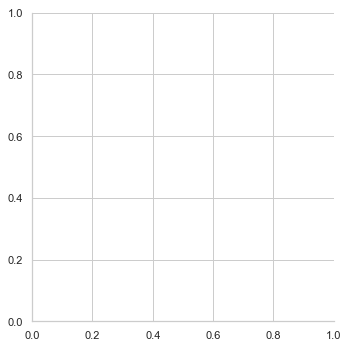

In [36]:
sns.lmplot(x='age',y='damage_grade',data=train_data,hue='foundation_type',palette='coolwarm',
           scatter_kws={'s':100})

### lmplot

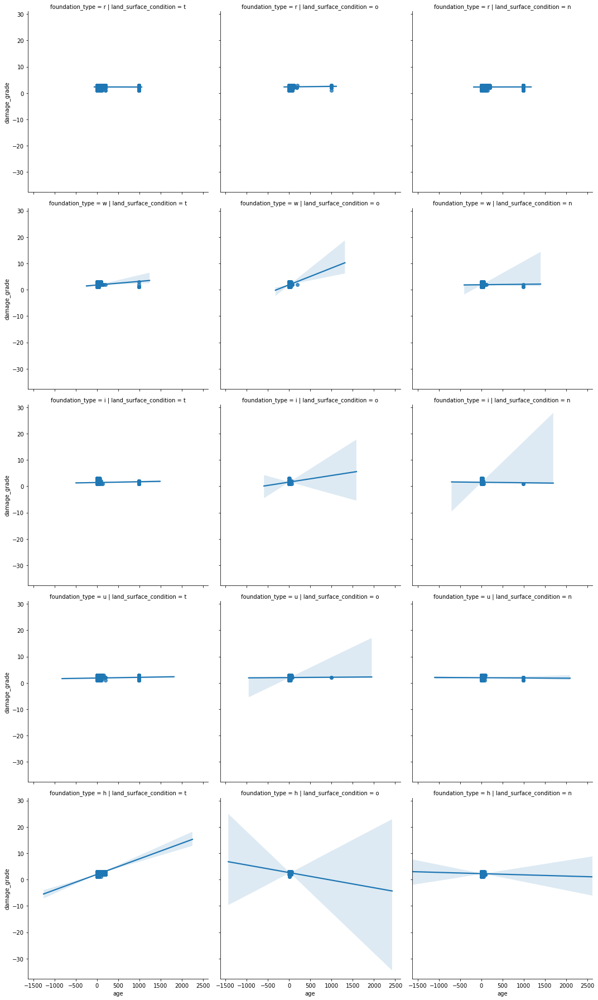

In [26]:
sns.lmplot(x="age", y="damage_grade", row="foundation_type", col="land_surface_condition",data=building_damage)

In [11]:
df = building_damage.corr()

In [10]:
df

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,...,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
building_id,1.000000,-0.002850,0.000347,-0.000393,-0.000654,-0.001476,-0.002070,0.000096,-0.000307,0.002423,...,0.001934,-0.002152,0.000706,-0.000362,0.002348,-0.000374,0.000538,-0.003116,-0.002295,0.001063
geo_level_1_id,-0.002850,1.000000,-0.061405,0.002718,-0.089364,-0.003908,0.071158,-0.063474,-0.018245,-0.152038,...,0.001911,0.023523,0.003700,0.002977,0.002655,-0.002303,0.001060,0.000523,-0.017992,-0.072347
geo_level_2_id,0.000347,-0.061405,1.000000,0.000921,0.047730,0.012594,-0.049443,0.035516,0.015833,0.076491,...,-0.008439,-0.030704,-0.004840,-0.004856,0.000687,-0.000757,-0.000152,0.001926,-0.013068,0.043161
geo_level_3_id,-0.000393,0.002718,0.000921,1.000000,-0.021646,-0.006385,-0.005643,-0.024507,-0.015732,0.026294,...,-0.002001,-0.007356,-0.007058,-0.004373,-0.000862,-0.002632,-0.000943,0.000269,-0.002463,0.007932
count_floors_pre_eq,-0.000654,-0.089364,0.047730,-0.021646,1.000000,0.086668,0.101071,0.772734,0.174852,-0.027116,...,0.077120,0.035425,0.016384,0.008833,-0.002611,0.006786,0.009639,0.003939,-0.002073,0.122308
age,-0.001476,-0.003908,0.012594,-0.006385,0.086668,1.000000,-0.004323,0.061074,0.068032,0.001321,...,-0.010021,0.001193,-0.004189,-0.003514,-0.003658,-0.002169,-0.001764,-0.001195,-0.004534,0.029273
area_percentage,-0.002070,0.071158,-0.049443,-0.005643,0.101071,-0.004323,1.000000,0.196645,0.026287,-0.225541,...,0.159885,0.105983,0.052212,0.050164,0.019421,0.015109,0.015290,0.004983,0.013111,-0.125221
height_percentage,0.000096,-0.063474,0.035516,-0.024507,0.772734,0.061074,0.196645,1.000000,0.149725,-0.106573,...,0.123551,0.068909,0.031366,0.020032,0.001946,0.011192,0.014660,0.004048,0.005397,0.048130
has_superstructure_adobe_mud,-0.000307,-0.018245,0.015833,-0.015732,0.174852,0.068032,0.026287,0.149725,1.000000,-0.306861,...,-0.012642,-0.003935,-0.004281,-0.002369,0.001762,-0.003292,-0.002648,-0.001493,-0.010074,0.055314
has_superstructure_mud_mortar_stone,0.002423,-0.152038,0.076491,0.026294,-0.027116,0.001321,-0.225541,-0.106573,-0.306861,1.000000,...,-0.159532,-0.117948,-0.036064,-0.023070,-0.025507,-0.008763,-0.011904,-0.003380,0.005628,0.291325


### Correlation Diagram

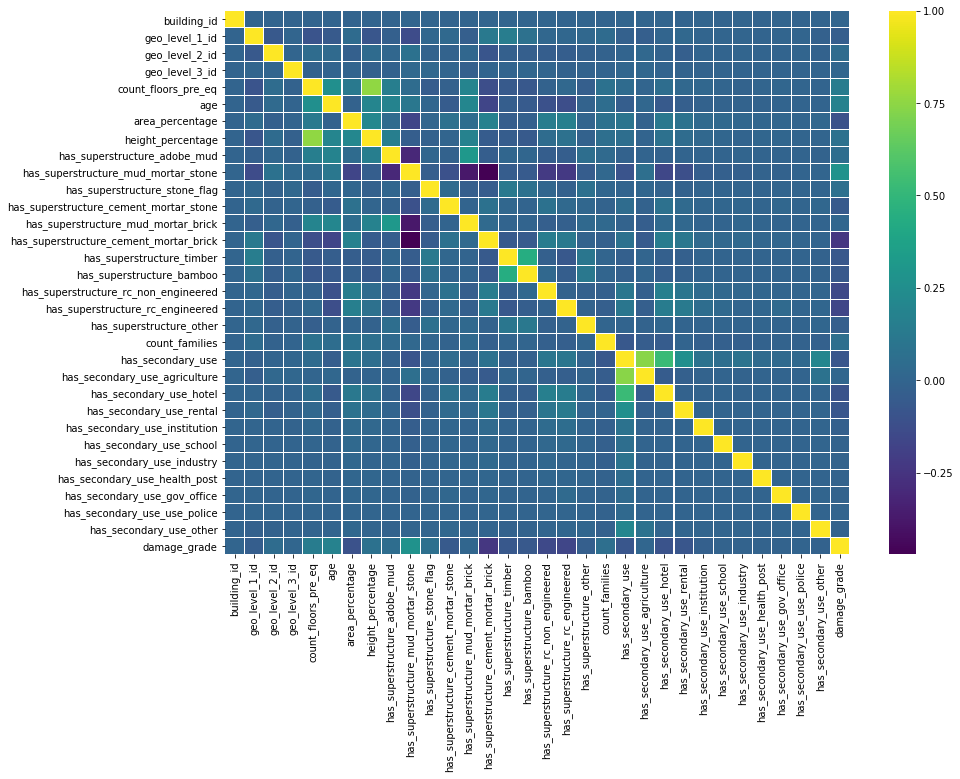

In [12]:
corrmat=building_damage.corr(method='spearman')
f,ax=plt.subplots(figsize=(14,10))
sns.heatmap(corrmat,ax=ax,cmap="viridis", linewidths=0.1)

In [8]:
ed= building_damage.pivot_table(values='age',index='building_id',columns='damage_grade')

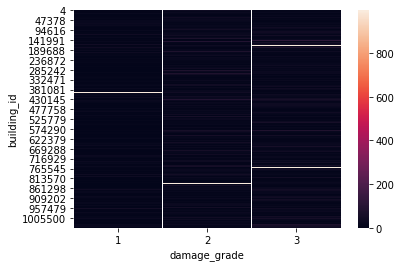

In [18]:
sns.heatmap(ed)

### Distplot

/Users/sarath/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


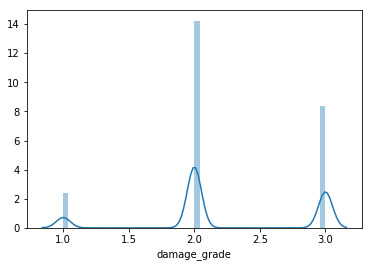

In [4]:
sns.distplot(building_damage['damage_grade'])

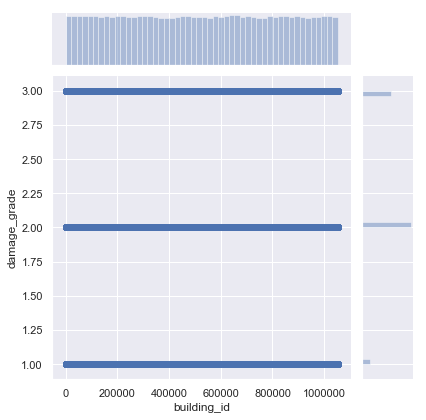

In [42]:
sns.jointplot(x= 'building_id',y= 'damage_grade', data= building_damage)

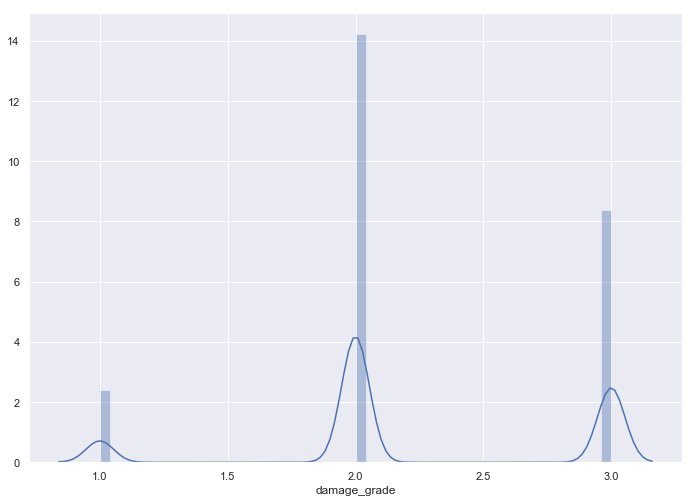

In [44]:
sns.distplot(building_damage['damage_grade'])

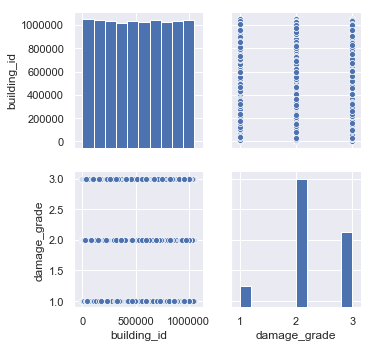

In [49]:
sns.set(rc={'figure.figsize':(25.7,15.27)})

a4_dims = (11.7, 8.27)

sns.pairplot(train_labels)

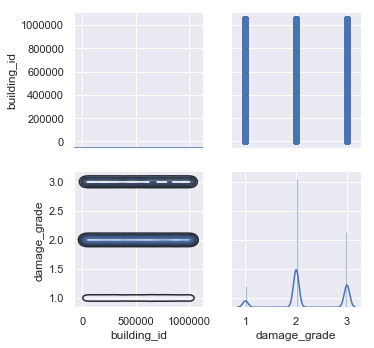

In [50]:
g = sns.PairGrid(train_labels)
g.map_diag(sns.distplot)
g.map_upper(plt.scatter)
g.map_lower(sns.kdeplot)

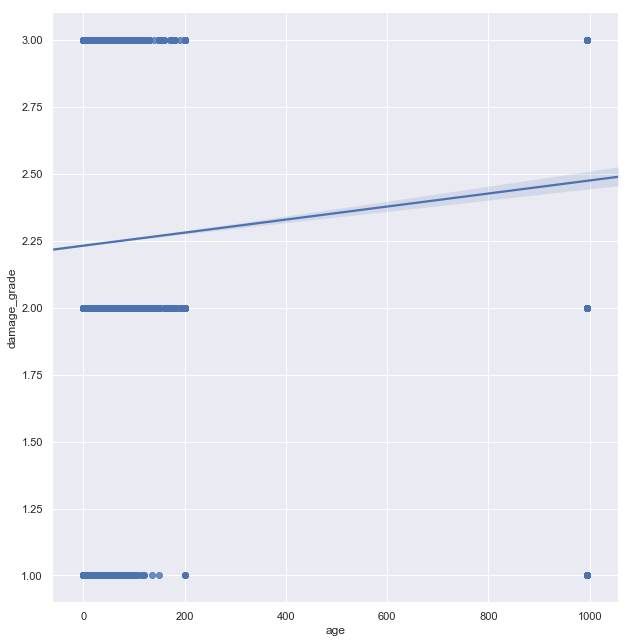

In [51]:
from matplotlib import rcParams
plt.rcParams['figure.figsize']=(20,20)



g = sns.lmplot(x='age',y='damage_grade',data=building_damage)
g.fig.set_size_inches(10,10)

In [5]:
building_damage.damage_grade=building_damage.damage_grade.replace({1:'Low',2:'Medium',3:'High'})


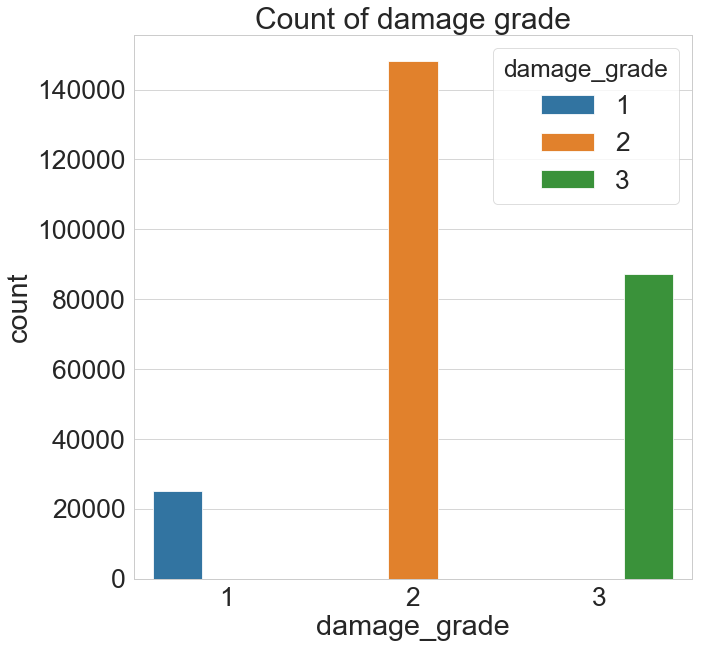

In [14]:
sns.set_context('paper',font_scale=3)
sns.set_style('whitegrid')
plt.rcParams['font.family'] = 'sans-serif'
plt.figure(figsize=(10,10))
plt.title('Count of damage grade', fontsize=30)
sns.countplot(x="damage_grade",data=building_damage,hue='damage_grade')
plt.show()

In [10]:
building_damage['damage_grade']

'Low'

In [ ]:
for i, item in enumerate(building_damage['damage_grade']):
    building_damage[i] = damage_grade[item]
    

### Feature Analysis

### Age 

In [60]:

building_damage.age.describe()

count    260601.000000
mean         26.535029
std          73.565937
min           0.000000
25%          10.000000
50%          15.000000
75%          30.000000
max         995.000000
Name: age, dtype: float64

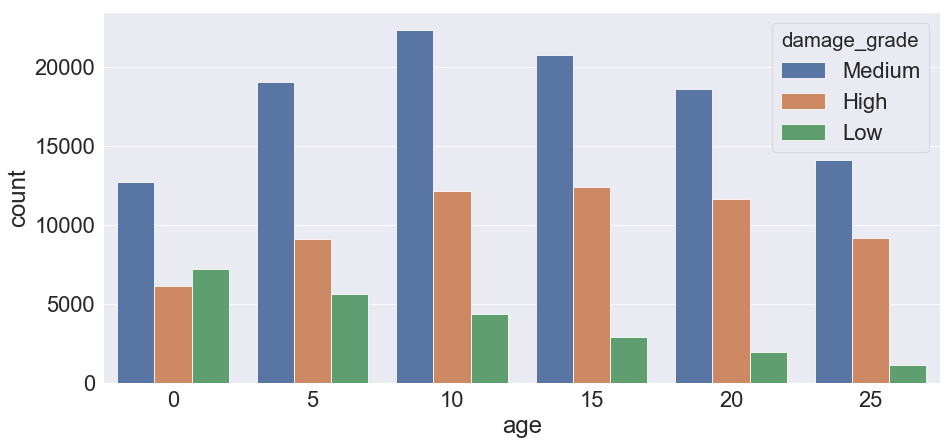

In [79]:

plt.figure(figsize=(15,15))
plt.subplot(211)
df=building_damage[building_damage['age']<=25]
sns.countplot(x='age',data=df,hue='damage_grade')

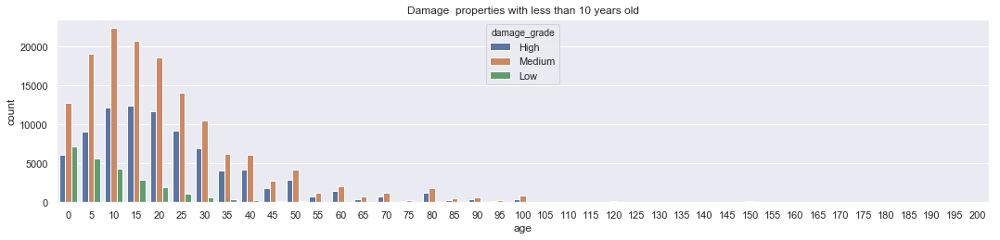

In [14]:
plt.figure(figsize=(18,8))
plt.subplot(211)
plt.title('Damage  properties with less than 10 years old')
df=building_damage[building_damage['age']<=200]
sns.countplot(x='age',data=df,hue='damage_grade')

In [67]:
plt.figure(figsize=(18,8))
plt.subplot(211)
plt.title('Damage  properties with less than 10 years old')
df=building_damage[building_damage['age'] >25 & (building_damage['age'] <= 100)
sns.countplot(x='age',data=df,hue='damage_grade')
                   
                   

SyntaxError: invalid syntax (<ipython-input-67-cd3c4d81fe8d>, line 5)

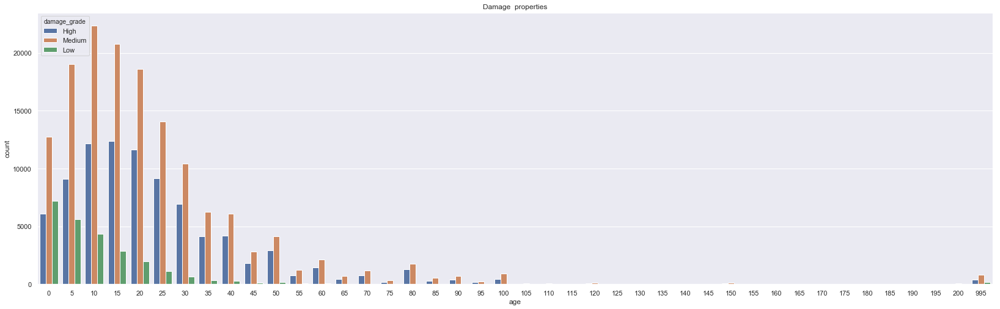

In [16]:
plt.figure(figsize=(28,18))
plt.subplot(211)
plt.title('Damage  properties')
sns.countplot(x='age',data=building_damage,hue='damage_grade')


In [100]:

building_damage.loc[building_damage['age'] <=25 , 'age_group'] = 'New'
building_damage.loc[(building_damage['age'] > 25) & (building_damage['age'] <= 100),'age_group' ]= 'Old'
building_damage.loc[building_damage['age'] > 100 ,'age_group' ] = 'Very Old'

In [101]:
building_damage['age_group']= ""

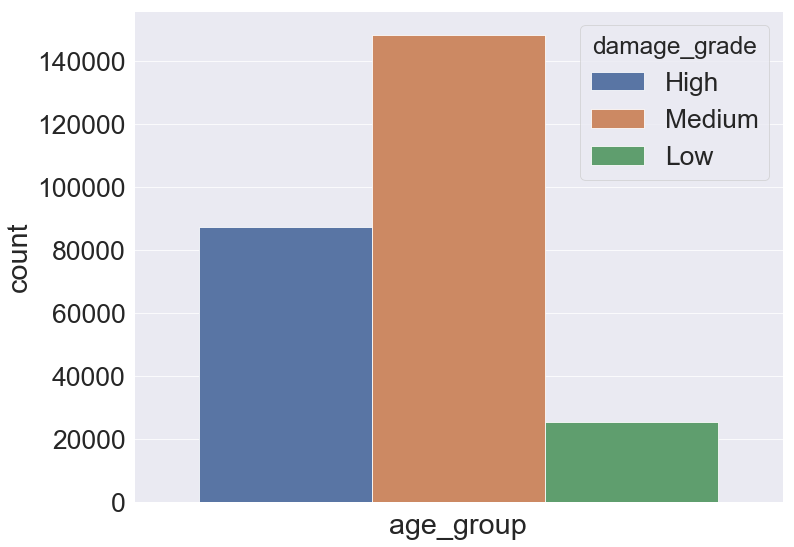

In [102]:
sns.set_context('paper',font_scale=3)
  
ax = sns.countplot(x ='age_group',data= building_damage, hue= 'damage_grade')

ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.tight_layout()
plt.show()

### Feature Analysis : has_superstructure_adobe_mud

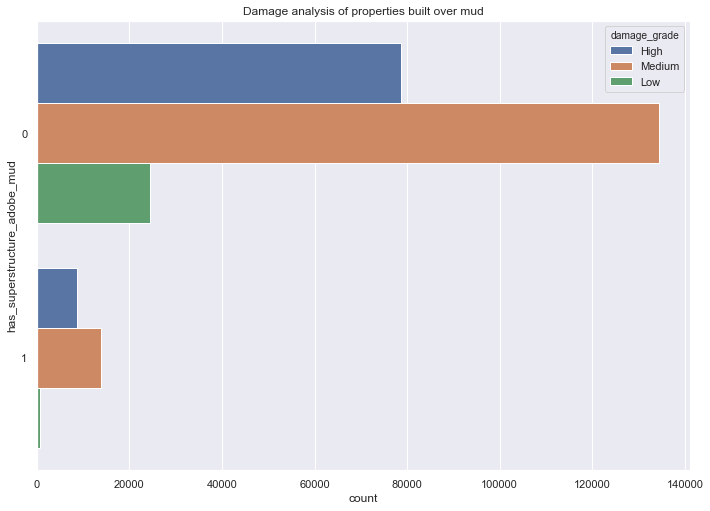

In [24]:
plt.title('Damage analysis of properties built over mud')
sns.countplot(y='has_superstructure_adobe_mud',data=building_damage,hue='damage_grade')

In [108]:
tr_no=building_damage[building_damage['has_superstructure_adobe_mud']==0]
tr_yes=building_damage[building_damage['has_superstructure_adobe_mud']==1]
tr_no.shape[0]
tr_yes.shape[0]


len(tr_no[tr_no['damage_grade']==1])


24530

In [109]:

#print('------------Damage of properties not built over mud----------------')
#print()
print('Number of properties with low damage:{0:.2f}%'.format((len(tr_no[tr_no['damage_grade']==1])/len(tr_no))*100))
print('Number of properties with medium damage:{0:.2f}%'.format((len(tr_no[tr_no['damage_grade']==2])/len(tr_no))*100))
print('Number of properties with high damage:{0:.2f}%'.format((len(tr_no[tr_no['damage_grade']==3])/len(tr_no))*100))
print()
print('------------Damage snapshot of properties  built over mud----------------')
print()
print('Number of properties with low damage:{0:.2f}%'.format((len(tr_yes[tr_yes['damage_grade']==1])/len(tr_yes))*100))
print('Number of properties with mdium damage:{0:.2f}%'.format((len(tr_yes[tr_yes['damage_grade']==2])/len(tr_yes))*100))
print('Number of properties with high damage:{0:.2f}%'.format((len(tr_yes[tr_yes['damage_grade']==3])/len(tr_yes))*100))

Number of properties with low damage:10.33%
Number of properties with medium damage:56.57%
Number of properties with high damage:33.10%

------------Damage snapshot of properties  built over mud----------------

Number of properties with low damage:2.57%
Number of properties with mdium damage:60.18%
Number of properties with high damage:37.25%


In [ ]:
#sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.catplot(x="has_superstructure_mud_mortar_stone", hue="damage_grade", col="age",data=building_damage, kind="swarm", height = 5, aspect = 2);

plt.show()
plt.clf()
plt.close()

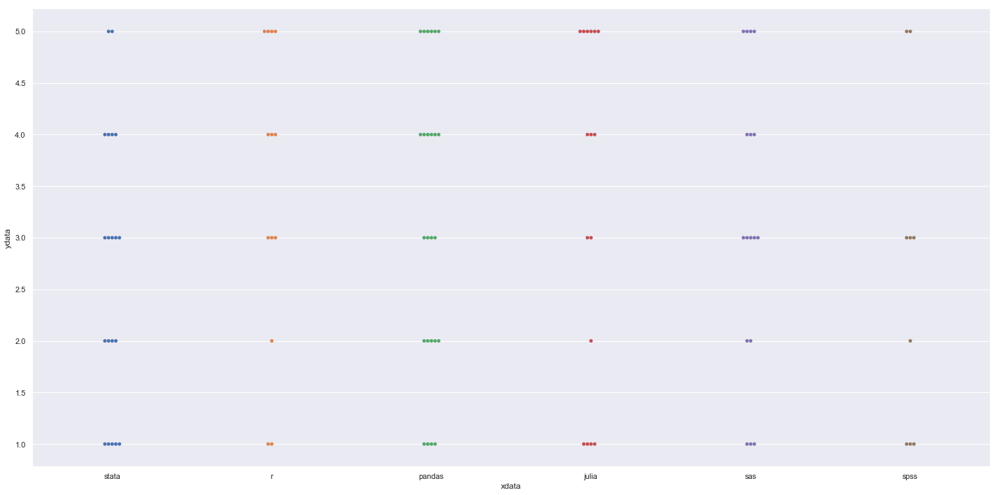

In [12]:
np.random.sample(71318)
df = pd.DataFrame({'xdata': np.random.choice(['pandas', 'r', 'julia', 'sas', 'spss', 'stata'], 100),
                   'ydata': np.random.choice(range(1,6), 100)})

sns.catplot(x='xdata', y='ydata', data=df, kind='swarm', height=10, aspect=2)

plt.show()
plt.clf()
plt.close()

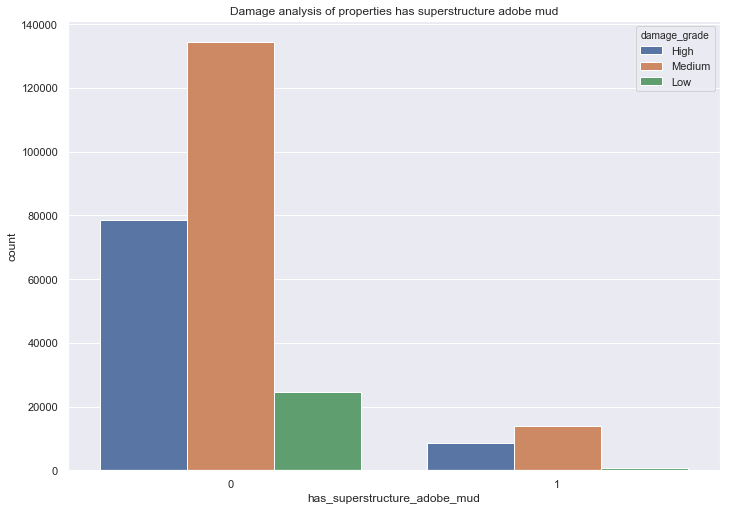

In [25]:
plt.title('Damage analysis of properties has superstructure adobe mud')
sns.countplot(x='has_superstructure_adobe_mud',data=building_damage,hue='damage_grade')

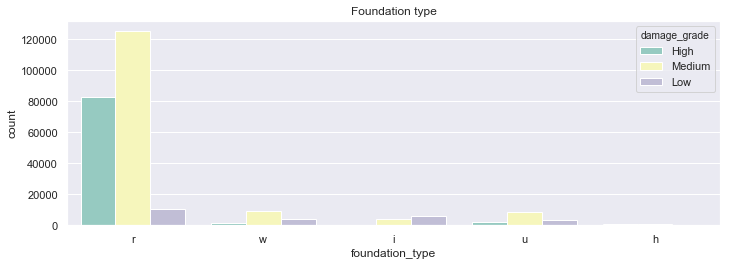

In [22]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
plt.subplot(211)
plt.title('Foundation type')   
ax = sns.countplot(x="foundation_type", data=building_damage, hue= 'damage_grade', palette="Set3")

### Feature Analysis : roof_type

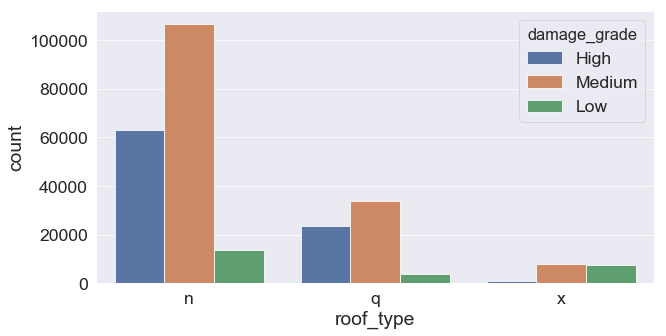

In [87]:
sns.set_context('paper',font_scale=2)
plt.figure(figsize=(10,5))

sns.countplot(x='roof_type',data=building_damage,hue='damage_grade')
